# Heart Disease UCI - Binary Classification



## Table of content

## Introduction <a name="introduction"></a>


In [1]:
#loading the libraries

#fundamentals
import matplotlib.pyplot as plt
import seaborn as sns 
import pandas as pd 
import numpy as np
import scipy
import math

#data exploration 
from pandas_profiling import ProfileReport
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=True, world_readable=True)
from plotly.offline import iplot

#data preprocessing 
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, PowerTransformer, MinMaxScaler
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
import warnings
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

#other utility
from joblib import dump, load
import copy

#classifiers
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC

import xgboost as xgb 
import catboost as cb
import lightgbm as lgb

from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from mlxtend.classifier import StackingClassifier, EnsembleVoteClassifier

#metrics for evaluation
from sklearn.metrics import classification_report, f1_score
from scipy import stats

In [2]:
#fixing random seed for repoducability
import random

random.seed(0)
np.random.seed(0)

## Part 1: Exploratory Data Analysis 

This is often the most overlooked step in a machine learning project. It is utmost important to understand what the data means before conducting the next steps in the pipeline. This can bring intuition into how we should set up our pre-processing. It is essential into getting best performance which translates into business value. 


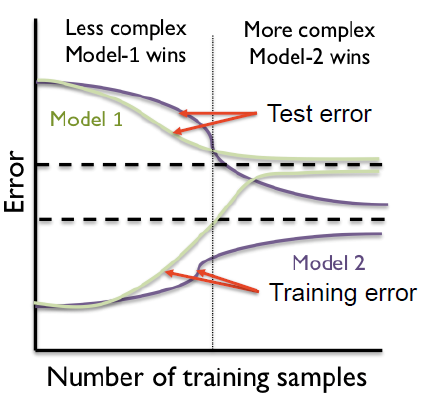 
<p style="font-size:8px">source: https://thebayesianobserver.wordpress.com/2012/02/07/debugging-machine-learning-algorithms/</p>

<br>As you will see that there are only 303 samples and only 13 independent variables, our dataset is by no means complex. This means that it is more likely that we only require simple models to achieve results. This further reinforces the point that data proprocessing will have a larger impact than using SOTA ML models.


In [3]:
#dataset can be found in https://www.kaggle.com/ronitf/heart-disease-uci
heart = pd.read_csv('heart.csv')

In [4]:
pd.set_option('max_columns', 100)

In [5]:
heart.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


As noted by the provider of the dataset on Kaggle, this database originally contained 76 attributes, but all published experiments refer to using a subset of 14 of them. In particular, the Cleveland database is the only one that has been used by ML researchers to this date.<br><br>

Thus, this gives an indication that there should not be any irrelevant attribute for us to discard. We can also see below that there has been quite thorough cleaning of data which allow us to focus on other aspects of the project.<br><br>

The target variable is a binary category on the presence of heart disease.

<b><u>Deciphering the attributes</u></b>
<br>
<br>
<b>*1. Age*</b><br>
Age and sex are self-explanatory. (0 = female, 1 = male) 
<br><br><br>
<b>*2. Sex*</b><br>
Age and sex are self-explanatory.
<br><br><br>
<b>*3. cp - Chest Pain Types*</b><br>
For the 4 types of chest pains, we can go to the UCI dataset archive (https://archive.ics.uci.edu/ml/datasets/heart+disease) to find further details. We can see that the four categories are:
* 0: typical angina
* 1: atypical angina 
* 2: non-anginal pain
* 3: asymptomatic

According to wikipedia, angina is a chest pain caused when heart muscle does not get sufficient oxygen-rich blood. It is a symptom of an underlying heart problem such as coronary heart disease. As such, we should expect this to be a valuable attribute. <br><br>

Non-aginal pain should mean any kind of chest pain that is not caused by heart. Asymptomatic may mean there was no chest pain at all. 
<br><br><br>
<b>*4. trestbps - resting blood pressure*</b><br>
Blood pressure is the pressure of circulating blood against the walls of blood vessels. Most of this pressure results from the heart pumping blood through the circulatory system.
<br><br>
Normal resting blood pressure, in an adult is approximately 120 millimetres of mercury (16 kPa) systolic over 80 millimetres of mercury (11 kPa) diastolic, denoted as "120/80 mmHg".
<br><br><br>
<b>*5. chol - serum cholestoral in mg/dl*</b><br>
A serum cholesterol level is a measurement of certain elements in the blood, including the amount of high- and low-density lipoprotein cholesterol (HDL and LDL) in a person’s blood. According to the American Heart Association, low-density lipoprotein (LDL) cholesterol is often considered bad, while high-density lipoprotein (HDL) cholesterol is considered good.
<br><br><br>
<b>*6. fbs - fasting blood sugar > 120 mg/dl*</b><br>
Higher baseline morning glucose levels were associated with increased heart failure (https://care.diabetesjournals.org/content/28/3/607)
<br><br><br>
<b>7. restecg - resting electrocardiographic results (values 0,1,2)</b><br>
-- Value 0: normal<br>
-- Value 1: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)<br>
-- Value 2: showing probable or definite left ventricular hypertrophy by Estes' criteria
<br><br><br>
<b>*8. thalach - maximum heart rate achieved*</b><br>
The maximum rate is based on your age, as subtracted from 220. So for a 50-year-old, maximum heart rate is 220 minus 50, or 170 beats per minute. At a 50 percent exertion level, your target would be 50 percent of that maximum, or 85 beats per minute. At an 85 percent level of exertion, your target would be 145 beats per minute. Therefore, the target heart rate that a 50-year-old would want to aim for during exercise is 85 to 145 beats per minute.
<br><br>
This may be an indication that a weak heart for a particular age (low max heart rate) would be at higher risk of heart disease. 
<br><br><br>
<b>*9. exang - exercise induced angina*</b><br>
Also known as stable angina. May potentially be an indicator but will require further investigation to see. 
<br><br><br>
<b>*10. oldpeak - ST depression induced by exercise relative to rest*</b>
<br><br><br>
<b>*11. slope - the slope of the peak exercise ST segment*</b><br>
1: upsloping
2: flat
3: downsloping
<br><br><br>
<b>*12. ca - number of major vessels (0-3) colored by flourosopy*</b><br>
Fluoroscopy  is an imaging technique that uses X-rays to obtain real-time moving images of the interior. fluoroscopy is used to help the healthcare provider see the flow of blood through the coronary arteries to check for arterial blockages. <br><br>
If that is the case, we suspect that higher number correlates with heart disease.
<br><br><br>
<b>*13. thal -  3 = normal; 6 = fixed defect; 7 = reversable defect*</b><br>
Thalassemia is an inherited blood disorder that causes your body to have less hemoglobin than normal. Hemoglobin enables red blood cells to carry oxygen. Thalassemia can cause anemia, fatigue. If you have mild thalassemia, you might not need treatment. But more severe forms might require regular blood transfusions. <br><br> 

This means that abnormal thal is likely to lead to heart desease.
    

In [6]:
#checking data type information
profile = ProfileReport(heart)
profile.to_file(output_file="output.html")
profile

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Before starting our model predictions, we will split the train-cv-test data in 80/10/10 and then for our benchmark models, no substantive data analysis, feature selection or feature engineering will be applied. This split will prevent data leakage. 

Our plan will be as follows: 
1. We will use train-data with 10 stratified k-fold to tune the models 
2. Use the CV-data to compare the models and select the best one 
3. Measure the performance of the best model with test-data

In [7]:
train, test = train_test_split(heart, test_size=0.20, random_state = 0)
cv, test = train_test_split(test, test_size=0.10, random_state = 0)

We can see that there are only 303 observations which is definitely on the small side. This may make models with stronger bias may have a harder time to training. 

### Duplicate data:

Fortunately, there are no missing values in this dataset. However, we can see that there is one duplicate row. Let's remove that from our dataset (if it is our test dataset, there would be a data leakage as well).

In [8]:
m1 = train['age']==38
m2 = train['cp']==2
train[m1 & m2]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
164,38,1,2,138,175,0,1,173,0,0.0,2,4,2,1
163,38,1,2,138,175,0,1,173,0,0.0,2,4,2,1


In [9]:
train.drop(index= 163, inplace = True, axis = 0)

### Age

In [11]:
train['age'].iplot(kind = 'histogram', filename = 'age_histo.html')

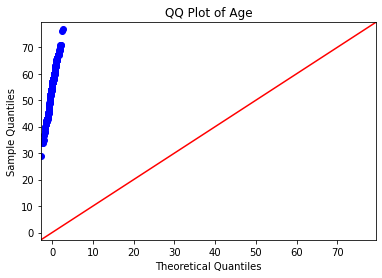

In [12]:
data = train['age']
fig = sm.qqplot(data, line = '45')
plt.title('QQ Plot of Age')
plt.show()

In [12]:
scipy.stats.shapiro(train['age'])

ShapiroResult(statistic=0.9842574000358582, pvalue=0.009097636677324772)

As shown in both the QQ plot and Shapiro test, although age is not normally distributed. In this case of classification, we will employ Min-max scaling as standardization is likely not necessary for most models. 

### trestbps

In [13]:
train['trestbps'].iplot(kind = 'histogram', bins =(90,200,1), filename = 'trestbps_histo')

It is clear that when taking resting blood pressure, there is a common practise to round off to the nearest 10. We can smoothen the curve by binning the values (which should help learning the pattern) and then min-max scale the values. 

In [15]:
bins_num = int((200-90)/10+1)
for table in train, cv, test:
    table['binned_trestbps'] = pd.cut(table['trestbps'], bins= bins_num, 
                                      labels = [90,100,110,120,130,140,150,160,170,180,190,200])

In [16]:
train['binned_trestbps']

74     120
153    150
64     140
296    120
287    160
      ... 
251    130
192    120
117    120
47     140
172    120
Name: binned_trestbps, Length: 241, dtype: category
Categories (12, int64): [90 < 100 < 110 < 120 ... 170 < 180 < 190 < 200]

In [17]:
train['binned_trestbps'].iplot(kind = 'histogram', filename = 'binned_trestbps_histo.html')

In [18]:
for table in train, cv, test:
    table.drop(columns = 'trestbps', inplace=True)

In [19]:
train.head()

,age,sex,cp,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target,binned_trestbps
74,43,0,2,213,0,1,165,0,0.2,1,0,2,1,120
153,66,0,2,278,0,0,152,0,0.0,1,1,2,1,150
64,58,1,2,211,1,0,165,0,0.0,2,0,2,1,140
296,63,0,0,197,0,1,136,1,0.0,1,0,2,0,120
287,57,1,1,232,0,0,164,0,0.0,2,1,2,0,160


## Oldpeak

 Old peak refers to ST depression induced by exercise relative to rest. ST depression is a finding on electrocariogram and is often a sign of myocarial ischemia (which is restriction in blood supply to tissues, causing a shortage of oxygen). <br><br>
 
 According to wikipedia, In a cardiac stress test, an ST depression of at least 1 mm after adenosine administration indicates a reversible ischaemia, while an exercise stress test requires an ST depression of at least 2 mm to significantly indicate reversible ischaemia. 

In [22]:
train['oldpeak'].iplot(kind = 'histogram', bins = 40, filename = 'oldpeak_histo.html')

Given that 0 is the most common value and all other values are rare, we can bin them into 3 categories:
* 0 meaning normal
* \> 0 to < 2 meaning level below reversible ischaemia induced by exercise
* =>2 meaning significant indication of reversible ischaemia

After binning we will apply min-max scaler

In [23]:
bins_num = 3
for table in train, cv, test:
    table['binned_oldpeak'] = pd.cut(table['oldpeak'], bins= [-0.1,0,2,100], 
                                      labels = [0,1,2])

In [24]:
train[['oldpeak','binned_oldpeak']].head(n=15)

,oldpeak,binned_oldpeak
74,0.2,1
153,0.0,0
64,0.0,0
296,0.0,0
287,0.0,0
286,0.8,1
236,0.0,0
126,0.1,1
73,0.0,0
20,0.5,1


In [25]:
for table in train, cv, test:
    table.drop(columns = 'oldpeak', inplace=True)

### Chol

In [26]:
train['chol'].iplot(kind = 'histogram', filename = 'chol_histo.html')

In [27]:
train[train['chol'] == max(train['chol'])]

,age,sex,cp,chol,fbs,restecg,thalach,exang,slope,ca,thal,target,binned_trestbps,binned_oldpeak
85,67,0,2,564,0,0,160,0,1,0,3,1,110,1


In [28]:
train.drop(index= 85, inplace = True, axis = 0)

In [29]:
train['chol'].iplot(kind = 'histogram', filename = 'chol_histo.html')

## Part 2: Model Training and Selection

In [64]:
warnings.filterwarnings('ignore')

num_columns =['age', 
              'chol', 
              'thalach',
             'binned_trestbps']  

categorical_columns = [
            'sex',
            'fbs',
            'exang', 
            'ca',
            'thal',
            'binned_oldpeak']

nominal_columns = ['cp', 'restecg', 'slope']

num_process = Pipeline([
    ('minmax_scale', MinMaxScaler())
])

ordinal_process = Pipeline([
    ('ordinal',MinMaxScaler())
])

nominal_process = Pipeline([
    ('onehot', OneHotEncoder())
])

preprocessor = ColumnTransformer([
                                ('num', num_process, num_columns),
                                ('ordinal', ordinal_process, categorical_columns),
                                ('nominal', nominal_process, nominal_columns)],
                                remainder = 'passthrough') 

In [65]:
all_col = num_columns
all_col.extend(categorical_columns)
all_col.extend(nominal_columns)

In [66]:
print(all_col)

['age', 'chol', 'thalach', 'binned_trestbps', 'sex', 'fbs', 'exang', 'ca', 'thal', 'binned_oldpeak', 'cp', 'restecg', 'slope']


In [31]:
Y_train = train['target']
X_train = train.drop('target',axis=1)
Y_cv = cv['target']
X_cv = cv.drop('target',axis=1)
Y_test = test['target']
X_test = test.drop('target',axis=1)

#### Logistic Regression Classifier

In [30]:
LogisticRegression().get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [32]:
param_grid = [
    {'C': [0.01, 1, 100, 1000, 1e5], 
     'tol': [0.01, 1, 100, 1000, 1e5], 
    'penalty': ['l1', 'l2'],
    'class_weight': [None, 'balanced'],
    'max_iter': [100, 1000, 100000],
    }
]

reg = GridSearchCV(LogisticRegression(solver = 'liblinear', random_state = 0, verbose =1), 
                   param_grid, cv = 10, 
                   return_train_score = True, 
                   scoring = 'accuracy', 
                   n_jobs= -1)

LogReg = Pipeline(steps = [    
    ('preprocessing', preprocessor),
    ('classifier', reg)])

gridLogReg = LogReg.fit(X_train,Y_train)

[LibLinear]

In [33]:
dump(LogReg, 'HD_LogReg.joblib')

['HD_LogReg.joblib']

In [34]:
LogReg = load('HD_LogReg.joblib') 

In [35]:
print('Grid search mean and stdev:\n')
scoring = LogReg[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l1', 'tol': 0.01}
0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l1', 'tol': 1}
0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l1', 'tol': 100}
0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l1', 'tol': 1000}
0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l1', 'tol': 100000.0}
0.762 (+/-0.135) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l2', 'tol': 0.01}
0.775 (+/-0.135) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l2', 'tol': 1}
0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l2', 'tol': 100}
0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'max_iter': 100, 'penalty': 'l2', 'tol': 1000}
0.463 (+/-0.025) for {'C': 0.01, 'class_weight': None, 'm

In [36]:
print('\nBest parameters:', LogReg[1].best_params_)


Best parameters: {'C': 100, 'class_weight': None, 'max_iter': 100, 'penalty': 'l2', 'tol': 1}


In [37]:
print(classification_report(Y_test, LogReg.predict(X_test)))

              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.67      1.00      0.80         4

    accuracy                           0.71         7
   macro avg       0.83      0.67      0.65         7
weighted avg       0.81      0.71      0.67         7



In [38]:
import numbers

def plot_grid_search_validation_curve(grid, param_to_vary,
                                      title='Validation Curve', ylim=None,
                                      xlim=None, log=None):
    """Plots train and cross-validation scores from a GridSearchCV instance's
    best params while varying one of those params."""

    df_cv_results = pd.DataFrame(grid.cv_results_)
    train_scores_mean = df_cv_results['mean_train_score']
    valid_scores_mean = df_cv_results['mean_test_score']
    train_scores_std = df_cv_results['std_train_score']
    valid_scores_std = df_cv_results['std_test_score']

    param_cols = [c for c in df_cv_results.columns if c[:6] == 'param_']
    
    if len(param_cols) ==1:
        param_ranges = [grid.param_grid[p[6:]] for p in param_cols]
    else:
        param_ranges = [grid.param_grid[0][p[6:]] for p in param_cols]
    param_ranges_lengths = [len(pr) for pr in param_ranges]

    train_scores_mean = np.array(train_scores_mean).reshape(*param_ranges_lengths)
    valid_scores_mean = np.array(valid_scores_mean).reshape(*param_ranges_lengths)
    train_scores_std = np.array(train_scores_std).reshape(*param_ranges_lengths)
    valid_scores_std = np.array(valid_scores_std).reshape(*param_ranges_lengths)

    param_to_vary_idx = param_cols.index('param_{}'.format(param_to_vary))

    slices = []
    for idx, param in enumerate(grid.best_params_):
        if (idx == param_to_vary_idx):
            slices.append(slice(None))
            continue
        best_param_val = grid.best_params_[param]
        idx_of_best_param = 0
        if isinstance(param_ranges[idx], np.ndarray):
            idx_of_best_param = param_ranges[idx].tolist().index(best_param_val)
        else:
            idx_of_best_param = param_ranges[idx].index(best_param_val)
        slices.append(idx_of_best_param)

    train_scores_mean = train_scores_mean[tuple(slices)]
    valid_scores_mean = valid_scores_mean[tuple(slices)]
    train_scores_std = train_scores_std[tuple(slices)]
    valid_scores_std = valid_scores_std[tuple(slices)]

    plt.clf()

    plt.title(title)
    plt.xlabel(param_to_vary)
    plt.ylabel('Score')

    if (ylim is None):
        plt.ylim(0.0, 1.1)
    else:
        plt.ylim(*ylim)

    if (not (xlim is None)):
        plt.xlim(*xlim)

    lw = 2

    plot_fn = plt.plot
    if log:
        plot_fn = plt.semilogx

    param_range = param_ranges[param_to_vary_idx]
    if (not isinstance(param_range[0], numbers.Number)):
        param_range = [str(x) for x in param_range]
    plot_fn(param_range, train_scores_mean, label='Training score', color='r',
            lw=lw)
    plt.fill_between(param_range, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color='r', lw=lw)
    plot_fn(param_range, valid_scores_mean, label='Cross-validation score',
            color='b', lw=lw)
    plt.fill_between(param_range, valid_scores_mean - valid_scores_std,
                     valid_scores_mean + valid_scores_std, alpha=0.1,
                     color='b', lw=lw)

    plt.legend(loc='lower right')

    plt.show()

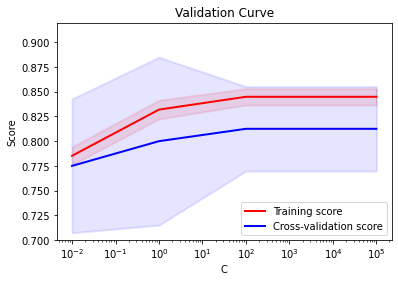

In [39]:
plot_grid_search_validation_curve(LogReg[1], 'C', log=True, ylim=(0.7, 0.92))

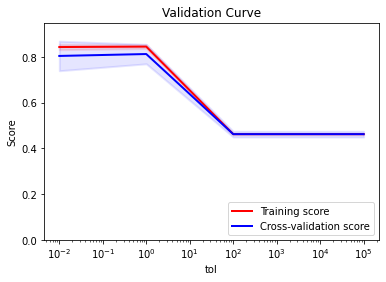

In [40]:
plot_grid_search_validation_curve(LogReg[1], 'tol', log=True, ylim=(0, 0.95))

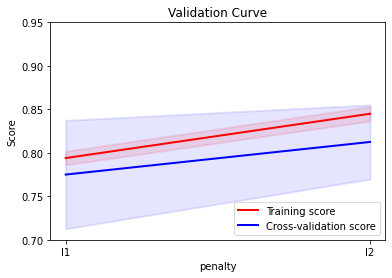

In [41]:
plot_grid_search_validation_curve(LogReg[1], 'penalty', log=False, ylim=(0.7, 0.95))

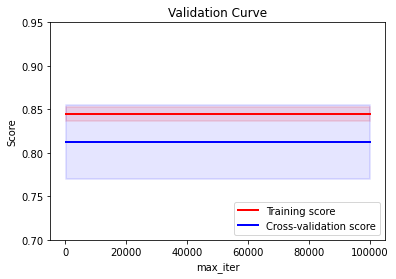

In [41]:
plot_grid_search_validation_curve(LogReg[1], 'max_iter', log=False, ylim=(0.7, 0.95))

In [42]:
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

In [45]:
def plot_learning_curve(pipeline_learning):
    train_sizes, train_scores, valid_scores = learning_curve(pipeline_learning, 
                                                         X_train, 
                                                         Y_train, 
                                                         train_sizes=[10,
                                                                    50,
                                                                    100,
                                                                    150
                                                                    ], 
                                                         cv=10, n_jobs = -1)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(valid_scores, axis=1)
    test_scores_std = np.std(valid_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    plt.title('Learning-Curve')
    plt.ylabel('Score')
    plt.xlabel('Number of Training Samples')
    plt.legend(loc="best")
    return plt

#### Decision Tree Classifier

In [47]:
DecisionTreeClassifier().get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': None,
 'splitter': 'best'}

In [48]:
tree_param_grid = [
    {
    'ccp_alpha': [0.0, 1.0, 2.0], #minimal cost-complexity pruning, used to avoid over fitting 
    'class_weight': [None, 'balanced'],
    'max_depth': [2,16,32],
    'min_impurity_decrease': [0.0,2.0,4.0],
    'criterion': ['entropy', 'gini'],
    'splitter': ['best', 'random']}
]

Dtree_classifer = GridSearchCV(DecisionTreeClassifier(random_state=0), 
                               tree_param_grid, 
                               cv = 10, 
                               return_train_score = True,
                               scoring = 'accuracy')
Dtree = Pipeline(steps = [    
    ('preprocessing', preprocessor),
    ('tree_classifer', Dtree_classifer)
])

tuned_Dtree = Dtree.fit(X_train, Y_train)

In [49]:
dump(Dtree, 'HD_Dtree.joblib')

['HD_Dtree.joblib']

In [50]:
Dtree = load('HD_Dtree.joblib')

In [51]:
print('Grid search mean and stdev:\n')
scoring = Dtree[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

0.771 (+/-0.141) for {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'min_impurity_decrease': 0.0, 'splitter': 'best'}
0.713 (+/-0.151) for {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'min_impurity_decrease': 0.0, 'splitter': 'random'}
0.537 (+/-0.025) for {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'min_impurity_decrease': 2.0, 'splitter': 'best'}
0.537 (+/-0.025) for {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'min_impurity_decrease': 2.0, 'splitter': 'random'}
0.537 (+/-0.025) for {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'min_impurity_decrease': 4.0, 'splitter': 'best'}
0.537 (+/-0.025) for {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'min_impurity_decrease': 4.0, 'splitter': 'random'}
0.767 (+/-0.113) for {'ccp_alpha': 0.0, 'class_weight

In [52]:
print(classification_report(Y_test, Dtree.predict(X_test)))

              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.67      1.00      0.80         4

    accuracy                           0.71         7
   macro avg       0.83      0.67      0.65         7
weighted avg       0.81      0.71      0.67         7



In [53]:
# Print best params
print('\nBest parameters:', Dtree[1].best_params_)


Best parameters: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'min_impurity_decrease': 0.0, 'splitter': 'best'}


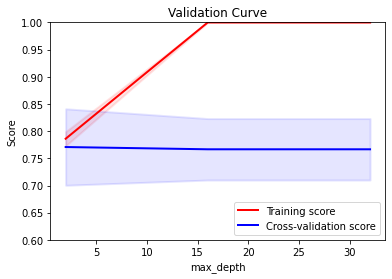

In [54]:
plot_grid_search_validation_curve(Dtree[1], 'max_depth', log=False, ylim=(0.6, 1))

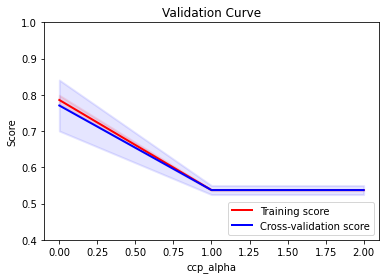

In [57]:
plot_grid_search_validation_curve(Dtree[1], 'ccp_alpha', log=False, ylim=(0.4, 1))

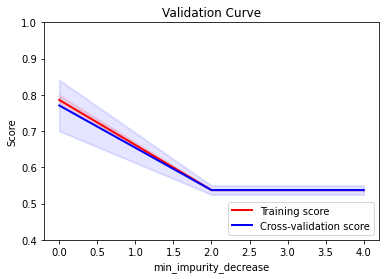

In [59]:
plot_grid_search_validation_curve(Dtree[1], 'min_impurity_decrease', log=False, ylim=(0.4, 1))

#### Random Forest Classifier

In [60]:
RandomForestClassifier().get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [61]:
forest_param_grid = [
    {'class_weight': [None, 'balanced'],
     'n_estimators': [8,16,64],
     'max_depth' : [2,4,8],
     'criterion': ['entropy', 'gini']}
]

Rforest_classifer = GridSearchCV(RandomForestClassifier(n_jobs = -1,random_state=0), 
                                 forest_param_grid, 
                                 cv = 10, 
                                 return_train_score = True, 
                                 scoring = 'accuracy')
Rforest = Pipeline(steps = [    
    ('preprocessing', preprocessor),
    ('forest_classifer', Rforest_classifer)
])

tuned_Rforest = Rforest.fit(X_train, Y_train)

In [62]:
dump(Rforest, 'HD_Rforest.joblib')

['HD_Rforest.joblib']

In [32]:
Rforest = load('HD_Rforest.joblib')

In [64]:
print('Grid search mean and stdev:\n')
scoring = Rforest[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

0.804 (+/-0.163) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'n_estimators': 8}
0.800 (+/-0.090) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'n_estimators': 16}
0.812 (+/-0.130) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 2, 'n_estimators': 64}
0.796 (+/-0.115) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 4, 'n_estimators': 8}
0.792 (+/-0.112) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 4, 'n_estimators': 16}
0.821 (+/-0.129) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 4, 'n_estimators': 64}
0.829 (+/-0.120) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 8}
0.821 (+/-0.167) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 16}
0.838 (+/-0.131) for {'class_weight': None, 'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 64}
0.817 (+/-0.176) for {'class_weight': 

In [65]:
# Print best params
print('\nBest parameters:', Rforest[1].best_params_)


Best parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 64}


In [66]:
print(classification_report(Y_test, Rforest.predict(X_test)))

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         3
           1       0.80      1.00      0.89         4

    accuracy                           0.86         7
   macro avg       0.90      0.83      0.84         7
weighted avg       0.89      0.86      0.85         7



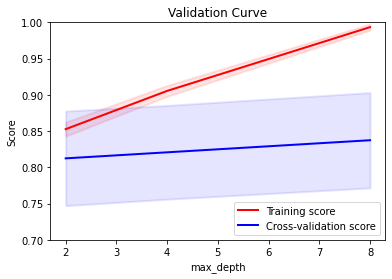

In [67]:
plot_grid_search_validation_curve(Rforest[1], 'max_depth', log=False, ylim=(0.7, 1))

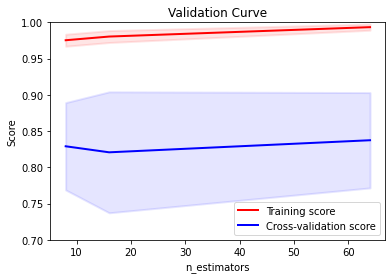

In [69]:
plot_grid_search_validation_curve(Rforest[1], 'n_estimators', log=False, ylim=(0.7, 1))

<module 'matplotlib.pyplot' from 'C:\\Users\\antho\\Anaconda3\\envs\\tensorflow\\lib\\site-packages\\matplotlib\\pyplot.py'>

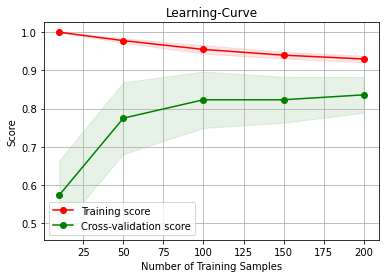

In [60]:
Rforest_learning = Pipeline(steps = [    
    ('preprocessing', preprocessor),
    ('classifer', RandomForestClassifier(criterion= 'gini', 
                                        max_depth= 4, 
                                        n_estimators= 128,
                                        n_jobs=-1,
                                        class_weight = None,
                                        ccp_alpha = 0.0))
    ]) #best parameters
plot_learning_curve(Rforest_learning)

#### Neural Network

In [70]:
dropout = [0.1, 0.2, 0.3]
units = [256, 512, 1024]
epochs = [50, 100, 200]

def create_model(units = 16, dropout = 0.1):
    model = Sequential()
    model.add(Dense(units=units, activation='relu'))
    model.add(Dropout(dropout))
    model.add(Dense(units=units/2, activation='relu'))
    model.add(Dropout(dropout/2))
    model.add(Dense(units=units/2, activation='relu'))
    model.add(Dropout(dropout/2))
    model.add(Dense(units=units/4, activation='relu'))
    model.add(Dropout(dropout/4))
    model.add(Dense(units=units/8, activation='relu'))
    model.add(Dropout(dropout/8))
    model.add(Dense(units=1, activation = 'sigmoid')) 
    model.compile(optimizer = 'adam', 
                  loss = 'binary_crossentropy', 
                  metrics = ['accuracy'])
    return model 


In [71]:
NNclassifier = KerasClassifier(build_fn = create_model, batch_size = 2048)

NN_param_grid = dict(dropout = dropout, units= units, epochs = epochs)
NNclassifier = GridSearchCV(NNclassifier, 
                    param_grid=NN_param_grid, 
                    cv=10, 
                    return_train_score= True,
                    scoring = 'accuracy')

NN = Pipeline(steps = [ 
    ('preprocessing', preprocessor),
    ('NN_classifier', NNclassifier)
])

tuned_NN = NN.fit(X_train, Y_train)

Train on 216 samples
Epoch 1/50
216/216 [==============================] - 1s 5ms/sample - loss: 0.6934 - accuracy: 0.4861
Epoch 2/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6759 - accuracy: 0.6944
Epoch 3/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6620 - accuracy: 0.7407
Epoch 4/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6480 - accuracy: 0.7454
Epoch 5/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6299 - accuracy: 0.7500
Epoch 6/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6148 - accuracy: 0.7593
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5934 - accuracy: 0.7315
Epoch 8/50
216/216 [==============================] - 0s 19us/sample - loss: 0.5698 - accuracy: 0.7593
Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5527 - accuracy: 0.7778
Epoch 10/50
216/216 [==============================] 

Epoch 30/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3344 - accuracy: 0.8380
Epoch 31/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2953 - accuracy: 0.8796
Epoch 32/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2750 - accuracy: 0.8935
Epoch 33/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2735 - accuracy: 0.8843
Epoch 34/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2646 - accuracy: 0.8981
Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2914 - accuracy: 0.8889
Epoch 36/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2953 - accuracy: 0.8704
Epoch 37/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2740 - accuracy: 0.8843
Epoch 38/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2518 - accuracy: 0.8935
Epoch 39/50
216/216 [==============================] - 0s 19us/s

Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5378 - accuracy: 0.7963
Epoch 10/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5242 - accuracy: 0.7917
Epoch 11/50
216/216 [==============================] - 0s 19us/sample - loss: 0.5054 - accuracy: 0.7870
Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4795 - accuracy: 0.7824
Epoch 13/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4583 - accuracy: 0.7917
Epoch 14/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4606 - accuracy: 0.8009
Epoch 15/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4207 - accuracy: 0.8194
Epoch 16/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4281 - accuracy: 0.8241
Epoch 17/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4167 - accuracy: 0.8148
Epoch 18/50
216/216 [==============================] - 0s 14us/sa

Epoch 38/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2529 - accuracy: 0.9120
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2799 - accuracy: 0.8565
Epoch 40/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2615 - accuracy: 0.8889
Epoch 41/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2564 - accuracy: 0.8889
Epoch 42/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2417 - accuracy: 0.9167
Epoch 43/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2301 - accuracy: 0.9028
Epoch 44/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1987 - accuracy: 0.9259
Epoch 45/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2131 - accuracy: 0.9120
Epoch 46/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2189 - accuracy: 0.9028
Epoch 47/50
216/216 [==============================] - 0s 14us/s

Epoch 17/50
216/216 [==============================] - 0s 23us/sample - loss: 0.4489 - accuracy: 0.8148
Epoch 18/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4350 - accuracy: 0.8287
Epoch 19/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4388 - accuracy: 0.7963
Epoch 20/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4089 - accuracy: 0.8102
Epoch 21/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4480 - accuracy: 0.8194
Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4010 - accuracy: 0.8380
Epoch 23/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3885 - accuracy: 0.8519
Epoch 24/50
216/216 [==============================] - 0s 23us/sample - loss: 0.3790 - accuracy: 0.8565
Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3812 - accuracy: 0.8519
Epoch 26/50
216/216 [==============================] - 0s 19us/s

Epoch 46/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2415 - accuracy: 0.9213
Epoch 47/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2396 - accuracy: 0.9213
Epoch 48/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2556 - accuracy: 0.9120
Epoch 49/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2420 - accuracy: 0.9306
Epoch 50/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2397 - accuracy: 0.9120
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 0s 2ms/sample - loss: 0.6933 - accuracy: 0.4491
Epoch 2/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6859 - accuracy: 0.6204
Epoch 3/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6776 - accuracy: 0.6944
Epoch 4/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6698 - accuracy: 0.7083
Epoch 5/50
216/216 [============================

Epoch 25/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3705 - accuracy: 0.8472
Epoch 26/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3390 - accuracy: 0.8750
Epoch 27/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3670 - accuracy: 0.8241
Epoch 28/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3520 - accuracy: 0.8565
Epoch 29/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3439 - accuracy: 0.8380
Epoch 30/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3370 - accuracy: 0.8519
Epoch 31/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3372 - accuracy: 0.8333
Epoch 32/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3140 - accuracy: 0.8889
Epoch 33/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3110 - accuracy: 0.8472
Epoch 34/50
216/216 [==============================] - 0s 14us/s

Epoch 4/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6074 - accuracy: 0.8287
Epoch 5/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5726 - accuracy: 0.8102
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5290 - accuracy: 0.7917
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4849 - accuracy: 0.8056
Epoch 8/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4516 - accuracy: 0.8056
Epoch 9/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4204 - accuracy: 0.8102
Epoch 10/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4069 - accuracy: 0.8102
Epoch 11/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3938 - accuracy: 0.8009
Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3950 - accuracy: 0.8102
Epoch 13/50
216/216 [==============================] - 0s 19us/sample 

Epoch 33/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2266 - accuracy: 0.9074
Epoch 34/50
216/216 [==============================] - 0s 23us/sample - loss: 0.2013 - accuracy: 0.9213
Epoch 35/50
216/216 [==============================] - 0s 22us/sample - loss: 0.1854 - accuracy: 0.9213
Epoch 36/50
216/216 [==============================] - 0s 17us/sample - loss: 0.1960 - accuracy: 0.9398
Epoch 37/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1831 - accuracy: 0.9306
Epoch 38/50
216/216 [==============================] - 0s 18us/sample - loss: 0.1783 - accuracy: 0.9213
Epoch 39/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1637 - accuracy: 0.9398
Epoch 40/50
216/216 [==============================] - 0s 17us/sample - loss: 0.1726 - accuracy: 0.9398
Epoch 41/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1557 - accuracy: 0.9306
Epoch 42/50
216/216 [==============================] - 0s 19us/s

Epoch 12/50
216/216 [==============================] - 0s 23us/sample - loss: 0.4104 - accuracy: 0.8333
Epoch 13/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3949 - accuracy: 0.8241
Epoch 14/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3755 - accuracy: 0.8241
Epoch 15/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3576 - accuracy: 0.8426
Epoch 16/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3584 - accuracy: 0.8472
Epoch 17/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3483 - accuracy: 0.8519
Epoch 18/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3306 - accuracy: 0.8704
Epoch 19/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3451 - accuracy: 0.8426
Epoch 20/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3045 - accuracy: 0.8889
Epoch 21/50
216/216 [==============================] - 0s 19us/s

Epoch 41/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1359 - accuracy: 0.9352
Epoch 42/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1097 - accuracy: 0.9676
Epoch 43/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1161 - accuracy: 0.9676
Epoch 44/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1214 - accuracy: 0.9630
Epoch 45/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0985 - accuracy: 0.9722
Epoch 46/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0977 - accuracy: 0.9722
Epoch 47/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1107 - accuracy: 0.9491
Epoch 48/50
216/216 [==============================] - 0s 23us/sample - loss: 0.0789 - accuracy: 0.9722
Epoch 49/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1150 - accuracy: 0.9630
Epoch 50/50
216/216 [==============================] - 0s 14us/s

Epoch 20/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3419 - accuracy: 0.8519
Epoch 21/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3115 - accuracy: 0.8704
Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3005 - accuracy: 0.8935
Epoch 23/50
216/216 [==============================] - 0s 23us/sample - loss: 0.3153 - accuracy: 0.8704
Epoch 24/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3145 - accuracy: 0.8750
Epoch 25/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2930 - accuracy: 0.8843
Epoch 26/50
216/216 [==============================] - 0s 23us/sample - loss: 0.2967 - accuracy: 0.8796
Epoch 27/50
216/216 [==============================] - 0s 23us/sample - loss: 0.2880 - accuracy: 0.8843
Epoch 28/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2717 - accuracy: 0.9167
Epoch 29/50
216/216 [==============================] - 0s 19us/s

Epoch 49/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1402 - accuracy: 0.9583
Epoch 50/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1455 - accuracy: 0.9537
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 1s 4ms/sample - loss: 0.6953 - accuracy: 0.5417
Epoch 2/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6722 - accuracy: 0.5741
Epoch 3/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6513 - accuracy: 0.6713
Epoch 4/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6256 - accuracy: 0.7176
Epoch 5/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5904 - accuracy: 0.7454
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5586 - accuracy: 0.7824
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5240 - accuracy: 0.7824
Epoch 8/50
216/216 [==============================]

Epoch 28/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2087 - accuracy: 0.9167
Epoch 29/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2124 - accuracy: 0.9213
Epoch 30/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1967 - accuracy: 0.9306
Epoch 31/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1807 - accuracy: 0.9398
Epoch 32/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1676 - accuracy: 0.9398
Epoch 33/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1686 - accuracy: 0.9352
Epoch 34/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1604 - accuracy: 0.9398
Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1526 - accuracy: 0.9444
Epoch 36/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1265 - accuracy: 0.9630
Epoch 37/50
216/216 [==============================] - 0s 14us/s

Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4299 - accuracy: 0.8056
Epoch 8/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4239 - accuracy: 0.8194
Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4097 - accuracy: 0.8333
Epoch 10/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3600 - accuracy: 0.8611
Epoch 11/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3478 - accuracy: 0.8426
Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3617 - accuracy: 0.8565
Epoch 13/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3300 - accuracy: 0.8796
Epoch 14/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3424 - accuracy: 0.8333
Epoch 15/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3050 - accuracy: 0.8889
Epoch 16/50
216/216 [==============================] - 0s 19us/samp

Epoch 36/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1080 - accuracy: 0.9583
Epoch 37/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1048 - accuracy: 0.9583
Epoch 38/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0793 - accuracy: 0.9861
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1095 - accuracy: 0.9537
Epoch 40/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0920 - accuracy: 0.9722
Epoch 41/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0663 - accuracy: 0.9815
Epoch 42/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0863 - accuracy: 0.9722
Epoch 43/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0584 - accuracy: 0.9861
Epoch 44/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1056 - accuracy: 0.9630
Epoch 45/50
216/216 [==============================] - 0s 19us/s

Epoch 15/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3076 - accuracy: 0.8796
Epoch 16/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3169 - accuracy: 0.8657
Epoch 17/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2854 - accuracy: 0.8796
Epoch 18/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2906 - accuracy: 0.8796
Epoch 19/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2652 - accuracy: 0.9120
Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2518 - accuracy: 0.9167
Epoch 21/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2383 - accuracy: 0.9120
Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2360 - accuracy: 0.9120
Epoch 23/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2161 - accuracy: 0.9213
Epoch 24/50
216/216 [==============================] - 0s 19us/s

Epoch 44/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0882 - accuracy: 0.9537
Epoch 45/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0671 - accuracy: 0.9769
Epoch 46/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0878 - accuracy: 0.9676
Epoch 47/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0691 - accuracy: 0.9769
Epoch 48/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0670 - accuracy: 0.9769
Epoch 49/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0405 - accuracy: 0.9954
Epoch 50/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0723 - accuracy: 0.9676
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 1s 2ms/sample - loss: 0.6936 - accuracy: 0.5231
Epoch 2/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6524 - accuracy: 0.7917
Epoch 3/50
216/216 [==========================

Epoch 23/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2453 - accuracy: 0.9074
Epoch 24/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2422 - accuracy: 0.8981
Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2504 - accuracy: 0.9074
Epoch 26/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2132 - accuracy: 0.9120
Epoch 27/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2113 - accuracy: 0.9352
Epoch 28/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2065 - accuracy: 0.9259
Epoch 29/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1915 - accuracy: 0.9352
Epoch 30/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1899 - accuracy: 0.9352
Epoch 31/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1848 - accuracy: 0.9352
Epoch 32/50
216/216 [==============================] - 0s 14us/s

Epoch 2/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6872 - accuracy: 0.4907
Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6776 - accuracy: 0.5602
Epoch 4/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6670 - accuracy: 0.6667
Epoch 5/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6524 - accuracy: 0.7500
Epoch 6/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6407 - accuracy: 0.7407
Epoch 7/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6241 - accuracy: 0.7315
Epoch 8/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6014 - accuracy: 0.7824
Epoch 9/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5815 - accuracy: 0.7824
Epoch 10/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5621 - accuracy: 0.7963
Epoch 11/100
216/216 [==============================] - 0s 14us

Epoch 81/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1242 - accuracy: 0.9583
Epoch 82/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1336 - accuracy: 0.9537
Epoch 83/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1164 - accuracy: 0.9630
Epoch 84/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1229 - accuracy: 0.9537
Epoch 85/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1260 - accuracy: 0.9630
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1083 - accuracy: 0.9769
Epoch 87/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1238 - accuracy: 0.9676
Epoch 88/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1052 - accuracy: 0.9722
Epoch 89/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1027 - accuracy: 0.9676
Epoch 90/100
216/216 [==============================] -

Epoch 59/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1721 - accuracy: 0.9491
Epoch 60/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1579 - accuracy: 0.9398
Epoch 61/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1615 - accuracy: 0.9259
Epoch 62/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1687 - accuracy: 0.9491
Epoch 63/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1668 - accuracy: 0.9398
Epoch 64/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1478 - accuracy: 0.9398
Epoch 65/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1489 - accuracy: 0.9491
Epoch 66/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1552 - accuracy: 0.9398
Epoch 67/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1258 - accuracy: 0.9491
Epoch 68/100
216/216 [==============================] -

Epoch 37/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2772 - accuracy: 0.9259
Epoch 38/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2755 - accuracy: 0.8843
Epoch 39/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2659 - accuracy: 0.9074
Epoch 40/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2716 - accuracy: 0.8981
Epoch 41/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2809 - accuracy: 0.8750
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2806 - accuracy: 0.9028
Epoch 43/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2662 - accuracy: 0.8843
Epoch 44/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2418 - accuracy: 0.9074
Epoch 45/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2485 - accuracy: 0.9028
Epoch 46/100
216/216 [==============================] -

Epoch 15/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4377 - accuracy: 0.8148
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4283 - accuracy: 0.8102
Epoch 17/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4151 - accuracy: 0.8056
Epoch 18/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4219 - accuracy: 0.8194
Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4040 - accuracy: 0.8287
Epoch 20/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3946 - accuracy: 0.8287
Epoch 21/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4033 - accuracy: 0.8380
Epoch 22/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3782 - accuracy: 0.8472
Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3522 - accuracy: 0.8657
Epoch 24/100
216/216 [==============================] -

216/216 [==============================] - 0s 19us/sample - loss: 0.0598 - accuracy: 0.9815
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0603 - accuracy: 0.9769
Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0584 - accuracy: 0.9907
Epoch 96/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0619 - accuracy: 0.9815
Epoch 97/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0659 - accuracy: 0.9815
Epoch 98/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0860 - accuracy: 0.9630
Epoch 99/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0549 - accuracy: 0.9769
Epoch 100/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0489 - accuracy: 0.9861
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 1s 2ms/sample - loss: 0.6967 - accuracy: 0.4537
Epoch 2/100
216/216 [===========================

216/216 [==============================] - 0s 14us/sample - loss: 0.1276 - accuracy: 0.9583
Epoch 72/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1358 - accuracy: 0.9630
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1228 - accuracy: 0.9491
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1359 - accuracy: 0.9676
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1152 - accuracy: 0.9630
Epoch 76/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0942 - accuracy: 0.9769
Epoch 77/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1252 - accuracy: 0.9537
Epoch 78/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1317 - accuracy: 0.9583
Epoch 79/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1150 - accuracy: 0.9537
Epoch 80/100
216/216 [==============================] - 0s 14us/samp

Epoch 50/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2112 - accuracy: 0.9213
Epoch 51/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1936 - accuracy: 0.9213
Epoch 52/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2246 - accuracy: 0.9074
Epoch 53/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1864 - accuracy: 0.9306
Epoch 54/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2270 - accuracy: 0.9120
Epoch 55/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1839 - accuracy: 0.9259
Epoch 56/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1862 - accuracy: 0.9213
Epoch 57/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1705 - accuracy: 0.9444
Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1962 - accuracy: 0.9120
Epoch 59/100
216/216 [==============================] -

Epoch 28/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3562 - accuracy: 0.8426
Epoch 29/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3563 - accuracy: 0.8657
Epoch 30/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3322 - accuracy: 0.8611
Epoch 31/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3586 - accuracy: 0.8287
Epoch 32/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3539 - accuracy: 0.8565
Epoch 33/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3304 - accuracy: 0.8657
Epoch 34/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3341 - accuracy: 0.8704
Epoch 35/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3388 - accuracy: 0.8426
Epoch 36/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3220 - accuracy: 0.9074
Epoch 37/100
216/216 [==============================] -

Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6442 - accuracy: 0.7500
Epoch 7/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6287 - accuracy: 0.7593
Epoch 8/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6118 - accuracy: 0.7639
Epoch 9/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5913 - accuracy: 0.7546
Epoch 10/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5754 - accuracy: 0.7778
Epoch 11/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5527 - accuracy: 0.7870
Epoch 12/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5380 - accuracy: 0.7963
Epoch 13/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5158 - accuracy: 0.7963
Epoch 14/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4879 - accuracy: 0.8056
Epoch 15/100
216/216 [==============================] - 0s 

Epoch 85/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0945 - accuracy: 0.9769
Epoch 86/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1107 - accuracy: 0.9583
Epoch 87/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1186 - accuracy: 0.9676
Epoch 88/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1004 - accuracy: 0.9722
Epoch 89/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0963 - accuracy: 0.9676
Epoch 90/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1064 - accuracy: 0.9630
Epoch 91/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0906 - accuracy: 0.9769
Epoch 92/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0939 - accuracy: 0.9537
Epoch 93/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1192 - accuracy: 0.9583
Epoch 94/100
216/216 [==============================] -

Epoch 63/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1892 - accuracy: 0.9398
Epoch 64/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1698 - accuracy: 0.9491
Epoch 65/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1870 - accuracy: 0.9213
Epoch 66/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1736 - accuracy: 0.9352
Epoch 67/100
216/216 [==============================] - 0s 23us/sample - loss: 0.1753 - accuracy: 0.9491
Epoch 68/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1715 - accuracy: 0.9398
Epoch 69/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1630 - accuracy: 0.9444
Epoch 70/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1461 - accuracy: 0.9537
Epoch 71/100
216/216 [==============================] - 0s 23us/sample - loss: 0.1431 - accuracy: 0.9583
Epoch 72/100
216/216 [==============================] -

Epoch 41/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2439 - accuracy: 0.9074
Epoch 42/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2453 - accuracy: 0.9120
Epoch 43/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2408 - accuracy: 0.9120
Epoch 44/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2210 - accuracy: 0.9074
Epoch 45/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2242 - accuracy: 0.9259
Epoch 46/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2246 - accuracy: 0.9167
Epoch 47/100
216/216 [==============================] - 0s 23us/sample - loss: 0.2409 - accuracy: 0.9167
Epoch 48/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2062 - accuracy: 0.9352
Epoch 49/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2086 - accuracy: 0.9120
Epoch 50/100
216/216 [==============================] -

Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3410 - accuracy: 0.8426
Epoch 20/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3276 - accuracy: 0.8657
Epoch 21/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3128 - accuracy: 0.8704
Epoch 22/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2995 - accuracy: 0.8889
Epoch 23/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2870 - accuracy: 0.9028
Epoch 24/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2877 - accuracy: 0.8935
Epoch 25/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2794 - accuracy: 0.8889
Epoch 26/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2980 - accuracy: 0.8981
Epoch 27/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2641 - accuracy: 0.9120
Epoch 28/100
216/216 [==============================] -

Epoch 98/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0299 - accuracy: 0.9907
Epoch 99/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0303 - accuracy: 0.9861
Epoch 100/100
216/216 [==============================] - 0s 12us/sample - loss: 0.0311 - accuracy: 0.9907
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 1s 3ms/sample - loss: 0.6950 - accuracy: 0.5463
Epoch 2/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6661 - accuracy: 0.6667
Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6364 - accuracy: 0.7639
Epoch 4/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6006 - accuracy: 0.7685
Epoch 5/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5579 - accuracy: 0.8102
Epoch 6/100
216/216 [==============================] - 0s 23us/sample - loss: 0.5156 - accuracy: 0.7685
Epoch 7/100
216/216 [===================

Epoch 76/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0123 - accuracy: 0.9907
Epoch 77/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0388 - accuracy: 0.9861
Epoch 78/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0198 - accuracy: 0.9954
Epoch 79/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0153 - accuracy: 1.0000
Epoch 80/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0363 - accuracy: 0.9815
Epoch 81/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0107 - accuracy: 0.9954
Epoch 82/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0444 - accuracy: 0.9815
Epoch 83/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0097 - accuracy: 0.9954
Epoch 84/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0365 - accuracy: 0.9907
Epoch 85/100
216/216 [==============================] -

Epoch 54/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0792 - accuracy: 0.9630
Epoch 55/100
216/216 [==============================] - 0s 9us/sample - loss: 0.0871 - accuracy: 0.9815
Epoch 56/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1021 - accuracy: 0.9583
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0934 - accuracy: 0.9630
Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0778 - accuracy: 0.9815
Epoch 59/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0662 - accuracy: 0.9815
Epoch 60/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0581 - accuracy: 0.9815
Epoch 61/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0568 - accuracy: 0.9769
Epoch 62/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0615 - accuracy: 0.9769
Epoch 63/100
216/216 [==============================] - 

Epoch 32/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2130 - accuracy: 0.9120
Epoch 33/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2013 - accuracy: 0.9120
Epoch 34/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2099 - accuracy: 0.9167
Epoch 35/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1767 - accuracy: 0.9306
Epoch 36/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1712 - accuracy: 0.9444
Epoch 37/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1687 - accuracy: 0.9444
Epoch 38/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1696 - accuracy: 0.9398
Epoch 39/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1516 - accuracy: 0.9444
Epoch 40/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1567 - accuracy: 0.9444
Epoch 41/100
216/216 [==============================] -

Epoch 10/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4227 - accuracy: 0.8194
Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4153 - accuracy: 0.8056
Epoch 12/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4033 - accuracy: 0.8287
Epoch 13/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3820 - accuracy: 0.8194
Epoch 14/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3731 - accuracy: 0.8287
Epoch 15/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3712 - accuracy: 0.8472
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3394 - accuracy: 0.8519
Epoch 17/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3527 - accuracy: 0.8472
Epoch 18/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3335 - accuracy: 0.8657
Epoch 19/100
216/216 [==============================] -

Epoch 89/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0849 - accuracy: 0.9769
Epoch 90/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0373 - accuracy: 0.9861
Epoch 91/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0320 - accuracy: 0.9907
Epoch 92/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0450 - accuracy: 0.9861
Epoch 93/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0385 - accuracy: 0.9769
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0334 - accuracy: 0.9861
Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0478 - accuracy: 0.9769
Epoch 96/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0449 - accuracy: 0.9861
Epoch 97/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0196 - accuracy: 0.9907
Epoch 98/100
216/216 [==============================] -

Epoch 67/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0498 - accuracy: 0.9907
Epoch 68/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0757 - accuracy: 0.9769
Epoch 69/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0575 - accuracy: 0.9815
Epoch 70/100
216/216 [==============================] - 0s 23us/sample - loss: 0.0505 - accuracy: 0.9907
Epoch 71/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0564 - accuracy: 0.9907
Epoch 72/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0425 - accuracy: 0.9907
Epoch 73/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0716 - accuracy: 0.9815
Epoch 74/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0469 - accuracy: 0.9907
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0393 - accuracy: 0.9954
Epoch 76/100
216/216 [==============================] -

Epoch 45/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1641 - accuracy: 0.9491
Epoch 46/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1592 - accuracy: 0.9306
Epoch 47/100
216/216 [==============================] - 0s 16us/sample - loss: 0.1710 - accuracy: 0.9444
Epoch 48/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1187 - accuracy: 0.9537
Epoch 49/100
216/216 [==============================] - 0s 23us/sample - loss: 0.1440 - accuracy: 0.9583
Epoch 50/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1113 - accuracy: 0.9630
Epoch 51/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1289 - accuracy: 0.9444
Epoch 52/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1188 - accuracy: 0.9583
Epoch 53/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1435 - accuracy: 0.9398
Epoch 54/100
216/216 [==============================] -

Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2835 - accuracy: 0.8981
Epoch 24/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2815 - accuracy: 0.8843
Epoch 25/100
216/216 [==============================] - 0s 23us/sample - loss: 0.2836 - accuracy: 0.8796
Epoch 26/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2704 - accuracy: 0.8981
Epoch 27/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2568 - accuracy: 0.8981
Epoch 28/100
216/216 [==============================] - 0s 23us/sample - loss: 0.2735 - accuracy: 0.8704
Epoch 29/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2564 - accuracy: 0.8796
Epoch 30/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2370 - accuracy: 0.9028
Epoch 31/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2608 - accuracy: 0.8843
Epoch 32/100
216/216 [==============================] -

216/216 [==============================] - 1s 4ms/sample - loss: 0.6940 - accuracy: 0.4444
Epoch 2/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6725 - accuracy: 0.7454
Epoch 3/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6511 - accuracy: 0.7500
Epoch 4/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6222 - accuracy: 0.7917
Epoch 5/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5901 - accuracy: 0.7917
Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5557 - accuracy: 0.7685
Epoch 7/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5196 - accuracy: 0.8056
Epoch 8/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4814 - accuracy: 0.7963
Epoch 9/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4463 - accuracy: 0.8102
Epoch 10/100
216/216 [==============================] - 0s 19us/sample - loss

Epoch 80/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0416 - accuracy: 0.9861
Epoch 81/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0275 - accuracy: 0.9954
Epoch 82/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0205 - accuracy: 0.9907
Epoch 83/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0355 - accuracy: 0.9907
Epoch 84/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0237 - accuracy: 0.9907
Epoch 85/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0415 - accuracy: 0.9861
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0395 - accuracy: 0.9769
Epoch 87/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0229 - accuracy: 0.9907
Epoch 88/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0557 - accuracy: 0.9769
Epoch 89/100
216/216 [==============================] -

Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0898 - accuracy: 0.9769
Epoch 59/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0817 - accuracy: 0.9676
Epoch 60/100
216/216 [==============================] - 0s 18us/sample - loss: 0.1021 - accuracy: 0.9676
Epoch 61/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0736 - accuracy: 0.9722
Epoch 62/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0983 - accuracy: 0.9537
Epoch 63/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0567 - accuracy: 0.9769
Epoch 64/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0982 - accuracy: 0.9676
Epoch 65/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0807 - accuracy: 0.9815
Epoch 66/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0706 - accuracy: 0.9815
Epoch 67/100
216/216 [==============================] -

Epoch 36/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1691 - accuracy: 0.9306
Epoch 37/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1669 - accuracy: 0.9306
Epoch 38/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1373 - accuracy: 0.9583
Epoch 39/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1533 - accuracy: 0.9491
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1319 - accuracy: 0.9630
Epoch 41/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1396 - accuracy: 0.9444
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1124 - accuracy: 0.9676
Epoch 43/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1022 - accuracy: 0.9676
Epoch 44/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0956 - accuracy: 0.9676
Epoch 45/100
216/216 [==============================] -

Epoch 14/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3014 - accuracy: 0.8611
Epoch 15/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2905 - accuracy: 0.8704
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2822 - accuracy: 0.8843
Epoch 17/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2567 - accuracy: 0.8935
Epoch 18/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2634 - accuracy: 0.8750
Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2425 - accuracy: 0.8981
Epoch 20/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2507 - accuracy: 0.9028
Epoch 21/100
216/216 [==============================] - 0s 32us/sample - loss: 0.2158 - accuracy: 0.9259
Epoch 22/100
216/216 [==============================] - 0s 23us/sample - loss: 0.2208 - accuracy: 0.9074
Epoch 23/100
216/216 [==============================] -

Epoch 92/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0047 - accuracy: 1.0000
Epoch 93/100
216/216 [==============================] - 0s 23us/sample - loss: 0.0165 - accuracy: 0.9954
Epoch 94/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0016 - accuracy: 1.0000
Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0081 - accuracy: 0.9954
Epoch 96/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0104 - accuracy: 0.9954
Epoch 97/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0012 - accuracy: 1.0000
Epoch 98/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0035 - accuracy: 1.0000
Epoch 99/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0032 - accuracy: 1.0000
Epoch 100/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0035 - accuracy: 1.0000
Train on 216 samples
Epoch 1/100
216/216 [============

Epoch 70/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0191 - accuracy: 0.9954
Epoch 71/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0543 - accuracy: 0.9815
Epoch 72/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0198 - accuracy: 0.9954
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0899 - accuracy: 0.9630
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0379 - accuracy: 0.9861
Epoch 75/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2109 - accuracy: 0.9306
Epoch 76/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0766 - accuracy: 0.9676
Epoch 77/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3913 - accuracy: 0.8750
Epoch 78/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0233 - accuracy: 0.9954
Epoch 79/100
216/216 [==============================] -

Epoch 48/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0597 - accuracy: 0.9815
Epoch 49/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0736 - accuracy: 0.9769
Epoch 50/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0450 - accuracy: 0.9907
Epoch 51/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0690 - accuracy: 0.9861
Epoch 52/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0404 - accuracy: 0.9907
Epoch 53/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0583 - accuracy: 0.9861
Epoch 54/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0358 - accuracy: 0.9954
Epoch 55/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0461 - accuracy: 0.9861
Epoch 56/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0367 - accuracy: 0.9907
Epoch 57/100
216/216 [==============================] -

Epoch 26/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1831 - accuracy: 0.9398
Epoch 27/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1832 - accuracy: 0.9444
Epoch 28/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1640 - accuracy: 0.9491
Epoch 29/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1661 - accuracy: 0.9306
Epoch 30/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1351 - accuracy: 0.9583
Epoch 31/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1347 - accuracy: 0.9676
Epoch 32/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1233 - accuracy: 0.9583
Epoch 33/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1028 - accuracy: 0.9722
Epoch 34/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1100 - accuracy: 0.9630
Epoch 35/100
216/216 [==============================] -

Epoch 4/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5218 - accuracy: 0.8009
Epoch 5/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4583 - accuracy: 0.7870
Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4289 - accuracy: 0.8102
Epoch 7/100
216/216 [==============================] - 0s 23us/sample - loss: 0.4252 - accuracy: 0.8102
Epoch 8/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4481 - accuracy: 0.8102
Epoch 9/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3941 - accuracy: 0.8148
Epoch 10/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3778 - accuracy: 0.8380
Epoch 11/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3627 - accuracy: 0.8380
Epoch 12/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3421 - accuracy: 0.8519
Epoch 13/100
216/216 [==============================] - 0s 23

Epoch 83/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0219 - accuracy: 0.9907
Epoch 84/100
216/216 [==============================] - 0s 20us/sample - loss: 0.0182 - accuracy: 0.9907
Epoch 85/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0147 - accuracy: 0.9954
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0179 - accuracy: 0.9954
Epoch 87/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0190 - accuracy: 0.9907
Epoch 88/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0160 - accuracy: 0.9954
Epoch 89/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0178 - accuracy: 0.9907
Epoch 90/100
216/216 [==============================] - 0s 23us/sample - loss: 0.0151 - accuracy: 0.9954
Epoch 91/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0167 - accuracy: 0.9954
Epoch 92/100
216/216 [==============================] -

Epoch 61/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0388 - accuracy: 0.9954
Epoch 62/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0389 - accuracy: 0.9907
Epoch 63/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0309 - accuracy: 0.9907
Epoch 64/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0316 - accuracy: 0.9954
Epoch 65/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0367 - accuracy: 0.9907
Epoch 66/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0272 - accuracy: 0.9954
Epoch 67/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0264 - accuracy: 0.9954
Epoch 68/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0377 - accuracy: 0.9907
Epoch 69/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0384 - accuracy: 0.9769
Epoch 70/100
216/216 [==============================] -

Epoch 39/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1311 - accuracy: 0.9491
Epoch 40/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1503 - accuracy: 0.9398
Epoch 41/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1081 - accuracy: 0.9583
Epoch 42/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0987 - accuracy: 0.9676
Epoch 43/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0983 - accuracy: 0.9722
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0880 - accuracy: 0.9769
Epoch 45/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1011 - accuracy: 0.9630
Epoch 46/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0718 - accuracy: 0.9815
Epoch 47/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0730 - accuracy: 0.9861
Epoch 48/100
216/216 [==============================] -

Epoch 17/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3382 - accuracy: 0.8472
Epoch 18/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2858 - accuracy: 0.8796
Epoch 19/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2828 - accuracy: 0.8889
Epoch 20/100
216/216 [==============================] - 0s 23us/sample - loss: 0.3010 - accuracy: 0.8750
Epoch 21/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2884 - accuracy: 0.8796
Epoch 22/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2599 - accuracy: 0.8981
Epoch 23/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2614 - accuracy: 0.8981
Epoch 24/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2659 - accuracy: 0.8981
Epoch 25/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2379 - accuracy: 0.9074
Epoch 26/100
216/216 [==============================] -

Epoch 96/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0103 - accuracy: 1.0000
Epoch 97/100
216/216 [==============================] - 0s 23us/sample - loss: 0.0104 - accuracy: 0.9954
Epoch 98/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0086 - accuracy: 0.9954
Epoch 99/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0071 - accuracy: 1.0000
Epoch 100/100
216/216 [==============================] - 0s 20us/sample - loss: 0.0054 - accuracy: 1.0000
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 1s 5ms/sample - loss: 0.6946 - accuracy: 0.4491
Epoch 2/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6637 - accuracy: 0.7593
Epoch 3/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6147 - accuracy: 0.7500
Epoch 4/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5504 - accuracy: 0.7778
Epoch 5/100
216/216 [=================

Epoch 74/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0174 - accuracy: 0.9954
Epoch 75/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0155 - accuracy: 0.9954
Epoch 76/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0195 - accuracy: 0.9907
Epoch 77/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0200 - accuracy: 0.9954
Epoch 78/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0195 - accuracy: 0.9954
Epoch 79/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0292 - accuracy: 0.9907
Epoch 80/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0139 - accuracy: 0.9954
Epoch 81/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0276 - accuracy: 0.9861
Epoch 82/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0146 - accuracy: 0.9954
Epoch 83/100
216/216 [==============================] -

Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1957 - accuracy: 0.9120
Epoch 53/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2124 - accuracy: 0.8981
Epoch 54/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2044 - accuracy: 0.9120
Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1920 - accuracy: 0.9167
Epoch 56/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1900 - accuracy: 0.9213
Epoch 57/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1728 - accuracy: 0.9352
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1479 - accuracy: 0.9537
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1446 - accuracy: 0.9537
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1649 - accuracy: 0.9352
Epoch 61/200
216/216 [==============================] -

Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0391 - accuracy: 0.9907
Epoch 131/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0367 - accuracy: 0.9861
Epoch 132/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0291 - accuracy: 0.9861
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0304 - accuracy: 0.9954
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0339 - accuracy: 0.9907
Epoch 135/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0482 - accuracy: 0.9769
Epoch 136/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0398 - accuracy: 0.9861
Epoch 137/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0433 - accuracy: 0.9815
Epoch 138/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0267 - accuracy: 0.9954
Epoch 139/200
216/216 [=======================

Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5484 - accuracy: 0.7870
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5258 - accuracy: 0.7870
Epoch 10/200
216/216 [==============================] - 0s 23us/sample - loss: 0.4908 - accuracy: 0.7917
Epoch 11/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4918 - accuracy: 0.7917
Epoch 12/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4499 - accuracy: 0.7824
Epoch 13/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4445 - accuracy: 0.8056
Epoch 14/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4287 - accuracy: 0.7870
Epoch 15/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4076 - accuracy: 0.8333
Epoch 16/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4190 - accuracy: 0.8148
Epoch 17/200
216/216 [==============================] - 0

Epoch 87/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0577 - accuracy: 0.9861
Epoch 88/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0739 - accuracy: 0.9630
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0599 - accuracy: 0.9815
Epoch 90/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0640 - accuracy: 0.9676
Epoch 91/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0528 - accuracy: 0.9815
Epoch 92/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0501 - accuracy: 0.9861
Epoch 93/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0593 - accuracy: 0.9815
Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0580 - accuracy: 0.9722
Epoch 95/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0481 - accuracy: 0.9815
Epoch 96/200
216/216 [==============================] -

Epoch 165/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0053 - accuracy: 1.0000
Epoch 166/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0086 - accuracy: 1.0000
Epoch 167/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0054 - accuracy: 1.0000
Epoch 168/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0069 - accuracy: 1.0000
Epoch 169/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0097 - accuracy: 1.0000
Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0067 - accuracy: 1.0000
Epoch 171/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0142 - accuracy: 0.9907
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0044 - accuracy: 1.0000
Epoch 173/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0061 - accuracy: 1.0000
Epoch 174/200
216/216 [=======================

Epoch 43/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2265 - accuracy: 0.8981
Epoch 44/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2318 - accuracy: 0.9028
Epoch 45/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2334 - accuracy: 0.9074
Epoch 46/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2375 - accuracy: 0.8981
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2193 - accuracy: 0.9074
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2167 - accuracy: 0.8981
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2197 - accuracy: 0.9213
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2242 - accuracy: 0.8981
Epoch 51/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2009 - accuracy: 0.9306
Epoch 52/200
216/216 [==============================] -

Epoch 121/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0415 - accuracy: 0.9907
Epoch 122/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0672 - accuracy: 0.9722
Epoch 123/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0561 - accuracy: 0.9815
Epoch 124/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0467 - accuracy: 0.9861
Epoch 125/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0598 - accuracy: 0.9815
Epoch 126/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0762 - accuracy: 0.9630
Epoch 127/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0404 - accuracy: 0.9907
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0515 - accuracy: 0.9815
Epoch 129/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0500 - accuracy: 0.9861
Epoch 130/200
216/216 [=======================

Epoch 199/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0217 - accuracy: 0.9907
Epoch 200/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0255 - accuracy: 0.9907
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 1s 3ms/sample - loss: 0.7015 - accuracy: 0.4676
Epoch 2/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6860 - accuracy: 0.4676
Epoch 3/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6773 - accuracy: 0.4769
Epoch 4/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6678 - accuracy: 0.5093
Epoch 5/200
216/216 [==============================] - 0s 28us/sample - loss: 0.6546 - accuracy: 0.5926
Epoch 6/200
216/216 [==============================] - 0s 23us/sample - loss: 0.6431 - accuracy: 0.6250
Epoch 7/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6256 - accuracy: 0.6898
Epoch 8/200
216/216 [===================

Epoch 77/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1364 - accuracy: 0.9537
Epoch 78/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1268 - accuracy: 0.9583
Epoch 79/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0961 - accuracy: 0.9769
Epoch 80/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1215 - accuracy: 0.9583
Epoch 81/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1001 - accuracy: 0.9722
Epoch 82/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1075 - accuracy: 0.9630
Epoch 83/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0991 - accuracy: 0.9630
Epoch 84/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1056 - accuracy: 0.9630
Epoch 85/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0939 - accuracy: 0.9676
Epoch 86/200
216/216 [==============================] -

Epoch 155/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0292 - accuracy: 0.9907
Epoch 156/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0344 - accuracy: 0.9815
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0135 - accuracy: 0.9954
Epoch 158/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0077 - accuracy: 1.0000
Epoch 159/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0351 - accuracy: 0.9815
Epoch 160/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0273 - accuracy: 0.9861
Epoch 161/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0089 - accuracy: 1.0000
Epoch 162/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0221 - accuracy: 0.9907
Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0133 - accuracy: 1.0000
Epoch 164/200
216/216 [=======================

Epoch 33/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2892 - accuracy: 0.8935
Epoch 34/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3079 - accuracy: 0.8935
Epoch 35/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3213 - accuracy: 0.8796
Epoch 36/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2834 - accuracy: 0.8889
Epoch 37/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2750 - accuracy: 0.8935
Epoch 38/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2686 - accuracy: 0.8935
Epoch 39/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3128 - accuracy: 0.8843
Epoch 40/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2666 - accuracy: 0.9028
Epoch 41/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2603 - accuracy: 0.9120
Epoch 42/200
216/216 [==============================] -

Epoch 111/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0327 - accuracy: 0.9861
Epoch 112/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0283 - accuracy: 0.9861
Epoch 113/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0323 - accuracy: 0.9954
Epoch 114/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0414 - accuracy: 0.9861
Epoch 115/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0486 - accuracy: 0.9769
Epoch 116/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0532 - accuracy: 0.9769
Epoch 117/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0300 - accuracy: 0.9907
Epoch 118/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0414 - accuracy: 0.9861
Epoch 119/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0477 - accuracy: 0.9861
Epoch 120/200
216/216 [=======================

Epoch 189/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0063 - accuracy: 1.0000
Epoch 190/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0188 - accuracy: 0.9907
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0277 - accuracy: 0.9907
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0082 - accuracy: 0.9954
Epoch 193/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0101 - accuracy: 0.9954
Epoch 194/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0276 - accuracy: 0.9907
Epoch 195/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0088 - accuracy: 0.9954
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0047 - accuracy: 1.0000
Epoch 197/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0058 - accuracy: 1.0000
Epoch 198/200
216/216 [=======================

Epoch 67/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1169 - accuracy: 0.9537
Epoch 68/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1113 - accuracy: 0.9676
Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1446 - accuracy: 0.9537
Epoch 70/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1104 - accuracy: 0.9583
Epoch 71/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1176 - accuracy: 0.9537
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1152 - accuracy: 0.9630
Epoch 73/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0800 - accuracy: 0.9861
Epoch 74/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1197 - accuracy: 0.9583
Epoch 75/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1021 - accuracy: 0.9630
Epoch 76/200
216/216 [==============================] -

Epoch 145/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0203 - accuracy: 0.9954
Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0266 - accuracy: 0.9907
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0300 - accuracy: 0.9907
Epoch 148/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0176 - accuracy: 0.9954
Epoch 149/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0198 - accuracy: 0.9954
Epoch 150/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0304 - accuracy: 0.9861
Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0253 - accuracy: 0.9907
Epoch 152/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0300 - accuracy: 0.9907
Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0201 - accuracy: 0.9954
Epoch 154/200
216/216 [========================

Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3821 - accuracy: 0.8241
Epoch 24/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3909 - accuracy: 0.8056
Epoch 25/200
216/216 [==============================] - 0s 9us/sample - loss: 0.3594 - accuracy: 0.8241
Epoch 26/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3532 - accuracy: 0.8472
Epoch 27/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3672 - accuracy: 0.8194
Epoch 28/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3601 - accuracy: 0.8472
Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3378 - accuracy: 0.8611
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3366 - accuracy: 0.8843
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3357 - accuracy: 0.8472
Epoch 32/200
216/216 [==============================] - 

Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0664 - accuracy: 0.9861
Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0646 - accuracy: 0.9815
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0668 - accuracy: 0.9722
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0530 - accuracy: 0.9815
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0738 - accuracy: 0.9769
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0509 - accuracy: 0.9861
Epoch 108/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0529 - accuracy: 0.9861
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0482 - accuracy: 0.9907
Epoch 110/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0667 - accuracy: 0.9815
Epoch 111/200
216/216 [========================

Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0157 - accuracy: 0.9954
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0263 - accuracy: 0.9815
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0240 - accuracy: 0.9861
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0203 - accuracy: 0.9907
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0361 - accuracy: 0.9861
Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0174 - accuracy: 0.9954
Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0242 - accuracy: 0.9907
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0181 - accuracy: 0.9954
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0380 - accuracy: 0.9907
Epoch 189/200
216/216 [=======================

Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2038 - accuracy: 0.9213
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1691 - accuracy: 0.9491
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2065 - accuracy: 0.9213
Epoch 61/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1524 - accuracy: 0.9491
Epoch 62/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1892 - accuracy: 0.9074
Epoch 63/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1814 - accuracy: 0.9306
Epoch 64/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1538 - accuracy: 0.9491
Epoch 65/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1753 - accuracy: 0.9352
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1515 - accuracy: 0.9306
Epoch 67/200
216/216 [==============================] - 

Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0535 - accuracy: 0.9722
Epoch 137/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0365 - accuracy: 0.9815
Epoch 138/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0369 - accuracy: 0.9861
Epoch 139/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0507 - accuracy: 0.9722
Epoch 140/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0395 - accuracy: 0.9907
Epoch 141/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0445 - accuracy: 0.9769
Epoch 142/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0328 - accuracy: 0.9861
Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0204 - accuracy: 0.9954
Epoch 144/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0334 - accuracy: 0.9815
Epoch 145/200
216/216 [=========================

Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4664 - accuracy: 0.7824
Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4495 - accuracy: 0.8148
Epoch 16/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4258 - accuracy: 0.8148
Epoch 17/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4177 - accuracy: 0.8241
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3946 - accuracy: 0.8472
Epoch 19/200
216/216 [==============================] - 0s 9us/sample - loss: 0.3701 - accuracy: 0.8472
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3801 - accuracy: 0.8472
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3875 - accuracy: 0.8287
Epoch 22/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3547 - accuracy: 0.8287
Epoch 23/200
216/216 [==============================] - 

216/216 [==============================] - 0s 14us/sample - loss: 0.1058 - accuracy: 0.9630
Epoch 93/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0952 - accuracy: 0.9676
Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0802 - accuracy: 0.9769
Epoch 95/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0919 - accuracy: 0.9722
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0845 - accuracy: 0.9861
Epoch 97/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0850 - accuracy: 0.9815
Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0872 - accuracy: 0.9676
Epoch 99/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0870 - accuracy: 0.9676
Epoch 100/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0765 - accuracy: 0.9861
Epoch 101/200
216/216 [==============================] - 0s 14us/sam

Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0482 - accuracy: 0.9815
Epoch 171/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0219 - accuracy: 0.9907
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0201 - accuracy: 0.9907
Epoch 173/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0160 - accuracy: 0.9954
Epoch 174/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0204 - accuracy: 0.9907
Epoch 175/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0170 - accuracy: 0.9907
Epoch 176/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0227 - accuracy: 0.9907
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0245 - accuracy: 0.9954
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0358 - accuracy: 0.9861
Epoch 179/200
216/216 [=======================

Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2357 - accuracy: 0.9259
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2405 - accuracy: 0.9074
Epoch 50/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2367 - accuracy: 0.8889
Epoch 51/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2152 - accuracy: 0.9167
Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2202 - accuracy: 0.9074
Epoch 53/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2270 - accuracy: 0.9120
Epoch 54/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2022 - accuracy: 0.9167
Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2100 - accuracy: 0.9352
Epoch 56/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2088 - accuracy: 0.9352
Epoch 57/200
216/216 [==============================] - 

Epoch 126/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0789 - accuracy: 0.9769
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0636 - accuracy: 0.9769
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0473 - accuracy: 0.9815
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0598 - accuracy: 0.9769
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0510 - accuracy: 0.9907
Epoch 131/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0412 - accuracy: 0.9861
Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0446 - accuracy: 0.9815
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0570 - accuracy: 0.9769
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0383 - accuracy: 0.9861
Epoch 135/200
216/216 [=======================

Epoch 4/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6084 - accuracy: 0.7963
Epoch 5/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5694 - accuracy: 0.7824
Epoch 6/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5208 - accuracy: 0.7963
Epoch 7/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4748 - accuracy: 0.7963
Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4508 - accuracy: 0.8148
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4210 - accuracy: 0.8287
Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4172 - accuracy: 0.8102
Epoch 11/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4083 - accuracy: 0.8148
Epoch 12/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3844 - accuracy: 0.8519
Epoch 13/200
216/216 [==============================] - 0s 14

Epoch 83/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0438 - accuracy: 0.9815
Epoch 84/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0472 - accuracy: 0.9815
Epoch 85/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0427 - accuracy: 0.9861
Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0505 - accuracy: 0.9815
Epoch 87/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0339 - accuracy: 0.9907
Epoch 88/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0415 - accuracy: 0.9861
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0396 - accuracy: 0.9907
Epoch 90/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0295 - accuracy: 0.9907
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0442 - accuracy: 0.9769
Epoch 92/200
216/216 [==============================] - 0s 

Epoch 161/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0040 - accuracy: 1.0000
Epoch 162/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0080 - accuracy: 0.9954
Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0028 - accuracy: 1.0000
Epoch 164/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0053 - accuracy: 1.0000
Epoch 165/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0087 - accuracy: 1.0000
Epoch 166/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0055 - accuracy: 1.0000
Epoch 167/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0104 - accuracy: 0.9954
Epoch 168/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0016 - accuracy: 1.0000
Epoch 169/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0012 - accuracy: 1.0000
Epoch 170/200
216/216 [=======================

Epoch 39/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1480 - accuracy: 0.9491
Epoch 40/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1161 - accuracy: 0.9491
Epoch 41/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1554 - accuracy: 0.9398
Epoch 42/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1208 - accuracy: 0.9630
Epoch 43/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1140 - accuracy: 0.9491
Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1062 - accuracy: 0.9537
Epoch 45/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1233 - accuracy: 0.9491
Epoch 46/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1328 - accuracy: 0.9537
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1184 - accuracy: 0.9491
Epoch 48/200
216/216 [==============================] -

Epoch 117/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0092 - accuracy: 0.9954
Epoch 118/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0080 - accuracy: 1.0000
Epoch 119/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0046 - accuracy: 1.0000
Epoch 120/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0041 - accuracy: 1.0000
Epoch 121/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0015 - accuracy: 1.0000
Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0021 - accuracy: 1.0000
Epoch 123/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0047 - accuracy: 1.0000
Epoch 124/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0141 - accuracy: 0.9954
Epoch 125/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0050 - accuracy: 1.0000
Epoch 126/200
216/216 [=======================

Epoch 195/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0012 - accuracy: 1.0000
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0037 - accuracy: 1.0000
Epoch 197/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0099 - accuracy: 0.9954
Epoch 198/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0023 - accuracy: 1.0000
Epoch 199/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0022 - accuracy: 1.0000
Epoch 200/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0250 - accuracy: 0.9907
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 0s 2ms/sample - loss: 0.6965 - accuracy: 0.5278
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6778 - accuracy: 0.7037
Epoch 3/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6564 - accuracy: 0.7824
Epoch 4/200
216/216 [===========

Epoch 73/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0729 - accuracy: 0.9769
Epoch 74/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0611 - accuracy: 0.9769
Epoch 75/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0500 - accuracy: 0.9907
Epoch 76/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0660 - accuracy: 0.9769
Epoch 77/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0694 - accuracy: 0.9769
Epoch 78/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0595 - accuracy: 0.9815
Epoch 79/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0478 - accuracy: 0.9861
Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0690 - accuracy: 0.9861
Epoch 81/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0670 - accuracy: 0.9815
Epoch 82/200
216/216 [==============================] -

Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0268 - accuracy: 0.9861
Epoch 152/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0233 - accuracy: 0.9907
Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0144 - accuracy: 0.9907
Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0106 - accuracy: 0.9954
Epoch 155/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0166 - accuracy: 0.9954
Epoch 156/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0158 - accuracy: 0.9954
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0098 - accuracy: 0.9954
Epoch 158/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0112 - accuracy: 0.9954
Epoch 159/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0084 - accuracy: 0.9954
Epoch 160/200
216/216 [=======================

Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2515 - accuracy: 0.9028
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2304 - accuracy: 0.8981
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2469 - accuracy: 0.9028
Epoch 32/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2180 - accuracy: 0.9213
Epoch 33/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2266 - accuracy: 0.8981
Epoch 34/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2002 - accuracy: 0.9167
Epoch 35/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1920 - accuracy: 0.9213
Epoch 36/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1783 - accuracy: 0.9306
Epoch 37/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1715 - accuracy: 0.9398
Epoch 38/200
216/216 [==============================] -

Epoch 108/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0314 - accuracy: 0.9907
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0923 - accuracy: 0.9722
Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0211 - accuracy: 0.9954
Epoch 111/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0213 - accuracy: 0.9954
Epoch 112/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0151 - accuracy: 0.9954
Epoch 113/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0458 - accuracy: 0.9815
Epoch 114/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0338 - accuracy: 0.9861
Epoch 115/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0256 - accuracy: 0.9954
Epoch 116/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0390 - accuracy: 0.9907
Epoch 117/200
216/216 [========================

Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0061 - accuracy: 1.0000
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0130 - accuracy: 0.9907
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0026 - accuracy: 1.0000
Epoch 189/200
216/216 [==============================] - 0s 19us/sample - loss: 4.0982e-04 - accuracy: 1.0000
Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 9.6358e-04 - accuracy: 1.0000
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 9.9550e-04 - accuracy: 1.0000
Epoch 192/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0011 - accuracy: 1.0000
Epoch 193/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0143 - accuracy: 0.9907
Epoch 194/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0014 - accuracy: 1.0000
Epoch 195/200
216/216 [============

Epoch 64/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0524 - accuracy: 0.9861
Epoch 65/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0527 - accuracy: 0.9815
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0419 - accuracy: 0.9954
Epoch 67/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0375 - accuracy: 0.9954
Epoch 68/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0548 - accuracy: 0.9861
Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0494 - accuracy: 0.9861
Epoch 70/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0384 - accuracy: 0.9907
Epoch 71/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0609 - accuracy: 0.9815
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0354 - accuracy: 0.9907
Epoch 73/200
216/216 [==============================] - 

Epoch 142/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0116 - accuracy: 0.9954
Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0085 - accuracy: 0.9954
Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0181 - accuracy: 0.9861
Epoch 145/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0078 - accuracy: 0.9954
Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0089 - accuracy: 0.9954
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0097 - accuracy: 0.9954
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0175 - accuracy: 0.9907
Epoch 149/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0099 - accuracy: 0.9954
Epoch 150/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0111 - accuracy: 0.9954
Epoch 151/200
216/216 [========================

Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3049 - accuracy: 0.8935
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2863 - accuracy: 0.8796
Epoch 22/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2916 - accuracy: 0.8935
Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2790 - accuracy: 0.8889
Epoch 24/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2607 - accuracy: 0.8935
Epoch 25/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2562 - accuracy: 0.9028
Epoch 26/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2824 - accuracy: 0.8935
Epoch 27/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2303 - accuracy: 0.9352
Epoch 28/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2298 - accuracy: 0.9352
Epoch 29/200
216/216 [==============================] -

Epoch 99/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0096 - accuracy: 0.9954
Epoch 100/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0096 - accuracy: 1.0000
Epoch 101/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0148 - accuracy: 0.9954
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0160 - accuracy: 0.9954
Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0149 - accuracy: 0.9954
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0128 - accuracy: 0.9954
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0091 - accuracy: 0.9954
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0076 - accuracy: 0.9954
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0181 - accuracy: 0.9907
Epoch 108/200
216/216 [========================

Epoch 177/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0196 - accuracy: 0.9954
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0276 - accuracy: 0.9861
Epoch 179/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0115 - accuracy: 0.9907
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0040 - accuracy: 1.0000
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0128 - accuracy: 1.0000
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0011 - accuracy: 1.0000
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0167 - accuracy: 0.9907
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0149 - accuracy: 0.9954
Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0015 - accuracy: 1.0000
Epoch 186/200
216/216 [=======================

Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1081 - accuracy: 0.9676
Epoch 56/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0825 - accuracy: 0.9722
Epoch 57/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0943 - accuracy: 0.9537
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0927 - accuracy: 0.9630
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1043 - accuracy: 0.9491
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0823 - accuracy: 0.9769
Epoch 61/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1170 - accuracy: 0.9537
Epoch 62/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0878 - accuracy: 0.9676
Epoch 63/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1074 - accuracy: 0.9537
Epoch 64/200
216/216 [==============================] -

Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0111 - accuracy: 1.0000
Epoch 134/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0225 - accuracy: 0.9907
Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0092 - accuracy: 1.0000
Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0120 - accuracy: 0.9954
Epoch 137/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0086 - accuracy: 1.0000
Epoch 138/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0110 - accuracy: 0.9954
Epoch 139/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0053 - accuracy: 1.0000
Epoch 140/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0188 - accuracy: 0.9907
Epoch 141/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0229 - accuracy: 0.9954
Epoch 142/200
216/216 [=========================

Epoch 11/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3983 - accuracy: 0.8194
Epoch 12/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3931 - accuracy: 0.8380
Epoch 13/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3631 - accuracy: 0.8333
Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3576 - accuracy: 0.8519
Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3676 - accuracy: 0.8426
Epoch 16/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3471 - accuracy: 0.8565
Epoch 17/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3499 - accuracy: 0.8380
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3365 - accuracy: 0.8611
Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3264 - accuracy: 0.8704
Epoch 20/200
216/216 [==============================] -

Epoch 90/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0239 - accuracy: 0.9954
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0341 - accuracy: 0.9907
Epoch 92/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0141 - accuracy: 1.0000
Epoch 93/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0280 - accuracy: 0.9907
Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0339 - accuracy: 0.9815
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0100 - accuracy: 1.0000
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0669 - accuracy: 0.9722
Epoch 97/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0127 - accuracy: 1.0000
Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0328 - accuracy: 0.9815
Epoch 99/200
216/216 [==============================] - 

Epoch 168/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0020 - accuracy: 1.0000
Epoch 169/200
216/216 [==============================] - 0s 14us/sample - loss: 5.9018e-04 - accuracy: 1.0000
Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0039 - accuracy: 1.0000
Epoch 171/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0067 - accuracy: 0.9954
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0034 - accuracy: 1.0000
Epoch 173/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0012 - accuracy: 1.0000
Epoch 174/200
216/216 [==============================] - 0s 9us/sample - loss: 9.2858e-04 - accuracy: 1.0000
Epoch 175/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0055 - accuracy: 0.9954
Epoch 176/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0024 - accuracy: 1.0000
Epoch 177/200
216/216 [================

Epoch 46/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1168 - accuracy: 0.9630
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1072 - accuracy: 0.9722
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1252 - accuracy: 0.9537
Epoch 49/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1150 - accuracy: 0.9630
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1040 - accuracy: 0.9769
Epoch 51/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1219 - accuracy: 0.9583
Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0851 - accuracy: 0.9815
Epoch 53/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0893 - accuracy: 0.9769
Epoch 54/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1049 - accuracy: 0.9583
Epoch 55/200
216/216 [==============================] -

Epoch 124/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0324 - accuracy: 0.9907
Epoch 125/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0331 - accuracy: 0.9907
Epoch 126/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0140 - accuracy: 0.9907
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0243 - accuracy: 0.9954
Epoch 128/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0287 - accuracy: 0.9861
Epoch 129/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0214 - accuracy: 0.9954
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0069 - accuracy: 1.0000
Epoch 131/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0132 - accuracy: 0.9954
Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0179 - accuracy: 0.9954
Epoch 133/200
216/216 [========================

216/216 [==============================] - 0s 2ms/sample - loss: 0.7007 - accuracy: 0.4583
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6797 - accuracy: 0.7222
Epoch 3/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6586 - accuracy: 0.7824
Epoch 4/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6329 - accuracy: 0.7778
Epoch 5/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6064 - accuracy: 0.7778
Epoch 6/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5710 - accuracy: 0.7778
Epoch 7/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5322 - accuracy: 0.7870
Epoch 8/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5021 - accuracy: 0.7824
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4553 - accuracy: 0.7917
Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss

Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0396 - accuracy: 0.9861
Epoch 81/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0546 - accuracy: 0.9769
Epoch 82/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0347 - accuracy: 0.9907
Epoch 83/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0240 - accuracy: 0.9954
Epoch 84/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0434 - accuracy: 0.9861
Epoch 85/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0366 - accuracy: 0.9907
Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0420 - accuracy: 0.9907
Epoch 87/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0469 - accuracy: 0.9861
Epoch 88/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0265 - accuracy: 0.9954
Epoch 89/200
216/216 [==============================] -

Epoch 158/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0184 - accuracy: 0.9907
Epoch 159/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0156 - accuracy: 0.9907
Epoch 160/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0051 - accuracy: 0.9954
Epoch 161/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0053 - accuracy: 1.0000
Epoch 162/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0139 - accuracy: 0.9954
Epoch 163/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0039 - accuracy: 1.0000
Epoch 164/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0025 - accuracy: 1.0000
Epoch 165/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0022 - accuracy: 1.0000
Epoch 166/200
216/216 [==============================] - 0s 17us/sample - loss: 0.0095 - accuracy: 0.9954
Epoch 167/200
216/216 [=======================

Epoch 36/200
216/216 [==============================] - 0s 23us/sample - loss: 0.1401 - accuracy: 0.9491
Epoch 37/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1450 - accuracy: 0.9444
Epoch 38/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1348 - accuracy: 0.9491
Epoch 39/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1271 - accuracy: 0.9537
Epoch 40/200
216/216 [==============================] - 0s 23us/sample - loss: 0.1023 - accuracy: 0.9722
Epoch 41/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1114 - accuracy: 0.9676
Epoch 42/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0897 - accuracy: 0.9722
Epoch 43/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0965 - accuracy: 0.9676
Epoch 44/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1102 - accuracy: 0.9630
Epoch 45/200
216/216 [==============================] -

Epoch 114/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0261 - accuracy: 0.9954
Epoch 115/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0056 - accuracy: 0.9954
Epoch 116/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0014 - accuracy: 1.0000
Epoch 117/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0178 - accuracy: 0.9954
Epoch 118/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0016 - accuracy: 1.0000
Epoch 119/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0033 - accuracy: 1.0000
Epoch 120/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0076 - accuracy: 0.9954
Epoch 121/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0031 - accuracy: 1.0000
Epoch 122/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0110 - accuracy: 0.9954
Epoch 123/200
216/216 [=======================

216/216 [==============================] - 0s 19us/sample - loss: 3.1529e-04 - accuracy: 1.0000
Epoch 192/200
216/216 [==============================] - 0s 19us/sample - loss: 2.6988e-04 - accuracy: 1.0000
Epoch 193/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0013 - accuracy: 1.0000
Epoch 194/200
216/216 [==============================] - 0s 19us/sample - loss: 2.5577e-04 - accuracy: 1.0000
Epoch 195/200
216/216 [==============================] - 0s 19us/sample - loss: 1.5105e-04 - accuracy: 1.0000
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 2.1127e-04 - accuracy: 1.0000
Epoch 197/200
216/216 [==============================] - 0s 14us/sample - loss: 3.3628e-04 - accuracy: 1.0000
Epoch 198/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0010 - accuracy: 1.0000
Epoch 199/200
216/216 [==============================] - 0s 19us/sample - loss: 1.6746e-04 - accuracy: 1.0000
Epoch 200/200
216/216 [=========

Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0050 - accuracy: 1.0000
Epoch 70/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0544 - accuracy: 0.9861
Epoch 71/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0206 - accuracy: 0.9907
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0081 - accuracy: 0.9954
Epoch 73/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0307 - accuracy: 0.9815
Epoch 74/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0172 - accuracy: 0.9907
Epoch 75/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0039 - accuracy: 1.0000
Epoch 76/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0068 - accuracy: 1.0000
Epoch 77/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0218 - accuracy: 0.9861
Epoch 78/200
216/216 [==============================] -

Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0131 - accuracy: 0.9907
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0063 - accuracy: 0.9954
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0081 - accuracy: 0.9954
Epoch 149/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0149 - accuracy: 0.9954
Epoch 150/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0063 - accuracy: 0.9954
Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 2.8820e-04 - accuracy: 1.0000
Epoch 152/200
216/216 [==============================] - 0s 14us/sample - loss: 6.1113e-04 - accuracy: 1.0000
Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0021 - accuracy: 1.0000
Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0086 - accuracy: 1.0000
Epoch 155/200
216/216 [===============

Epoch 24/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2414 - accuracy: 0.9074
Epoch 25/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2158 - accuracy: 0.9213
Epoch 26/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1981 - accuracy: 0.9306
Epoch 27/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1914 - accuracy: 0.9306
Epoch 28/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1924 - accuracy: 0.9352
Epoch 29/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1704 - accuracy: 0.9398
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1680 - accuracy: 0.9352
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1657 - accuracy: 0.9444
Epoch 32/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1587 - accuracy: 0.9444
Epoch 33/200
216/216 [==============================] -

Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0036 - accuracy: 1.0000
Epoch 104/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0127 - accuracy: 0.9954
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0089 - accuracy: 0.9954
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0150 - accuracy: 0.9954
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0073 - accuracy: 0.9954
Epoch 108/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0014 - accuracy: 1.0000
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0038 - accuracy: 1.0000
Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0077 - accuracy: 0.9954
Epoch 111/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0043 - accuracy: 1.0000
Epoch 112/200
216/216 [=======================

216/216 [==============================] - 0s 19us/sample - loss: 6.0897e-04 - accuracy: 1.0000
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0142 - accuracy: 0.9954
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0092 - accuracy: 0.9954
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0051 - accuracy: 1.0000
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0207 - accuracy: 0.9907
Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 3.4420e-04 - accuracy: 1.0000
Epoch 186/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0011 - accuracy: 1.0000
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0013 - accuracy: 1.0000
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0010 - accuracy: 1.0000
Epoch 189/200
216/216 [=============================

Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0376 - accuracy: 0.9907
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0319 - accuracy: 0.9907
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0370 - accuracy: 0.9815
Epoch 61/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0190 - accuracy: 1.0000
Epoch 62/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0206 - accuracy: 0.9954
Epoch 63/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0266 - accuracy: 0.9954
Epoch 64/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0475 - accuracy: 0.9815
Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0291 - accuracy: 0.9907
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0138 - accuracy: 1.0000
Epoch 67/200
216/216 [==============================] -

Epoch 136/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0158 - accuracy: 0.9954
Epoch 137/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0032 - accuracy: 1.0000
Epoch 138/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0070 - accuracy: 0.9954
Epoch 139/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0051 - accuracy: 1.0000
Epoch 140/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0026 - accuracy: 1.0000
Epoch 141/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0028 - accuracy: 1.0000
Epoch 142/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0030 - accuracy: 1.0000
Epoch 143/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0056 - accuracy: 1.0000
Epoch 144/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0041 - accuracy: 1.0000
Epoch 145/200
216/216 [=======================

Epoch 13/200
216/216 [==============================] - 0s 23us/sample - loss: 0.3543 - accuracy: 0.8611
Epoch 14/200
216/216 [==============================] - 0s 28us/sample - loss: 0.3459 - accuracy: 0.8426
Epoch 15/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3320 - accuracy: 0.8472
Epoch 16/200
216/216 [==============================] - 0s 23us/sample - loss: 0.3214 - accuracy: 0.8611
Epoch 17/200
216/216 [==============================] - 0s 23us/sample - loss: 0.3009 - accuracy: 0.8750
Epoch 18/200
216/216 [==============================] - 0s 23us/sample - loss: 0.3090 - accuracy: 0.8519
Epoch 19/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2747 - accuracy: 0.8981
Epoch 20/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2849 - accuracy: 0.8935
Epoch 21/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2590 - accuracy: 0.9074
Epoch 22/200
216/216 [==============================] -

Epoch 92/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0095 - accuracy: 0.9954
Epoch 93/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0492 - accuracy: 0.9769
Epoch 94/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0444 - accuracy: 0.9907
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0485 - accuracy: 0.9815
Epoch 96/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0078 - accuracy: 0.9954
Epoch 97/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0270 - accuracy: 0.9861
Epoch 98/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0412 - accuracy: 0.9861
Epoch 99/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0119 - accuracy: 0.9954
Epoch 100/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0548 - accuracy: 0.9861
Epoch 101/200
216/216 [==============================]

Epoch 170/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0014 - accuracy: 1.0000
Epoch 171/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0010 - accuracy: 1.0000
Epoch 172/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0014 - accuracy: 1.0000
Epoch 173/200
216/216 [==============================] - 0s 19us/sample - loss: 6.7956e-04 - accuracy: 1.0000
Epoch 174/200
216/216 [==============================] - 0s 14us/sample - loss: 8.4622e-04 - accuracy: 1.0000
Epoch 175/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0015 - accuracy: 1.0000
Epoch 176/200
216/216 [==============================] - 0s 17us/sample - loss: 4.0484e-04 - accuracy: 1.0000
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 4.9107e-04 - accuracy: 1.0000
Epoch 178/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0015 - accuracy: 1.0000
Epoch 179/200
216/216 [=======

Epoch 47/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0547 - accuracy: 0.9861
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0473 - accuracy: 0.9861
Epoch 49/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0414 - accuracy: 0.9907
Epoch 50/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0378 - accuracy: 0.9907
Epoch 51/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0422 - accuracy: 0.9907
Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0437 - accuracy: 0.9861
Epoch 53/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0337 - accuracy: 0.9907
Epoch 54/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0335 - accuracy: 0.9954
Epoch 55/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0377 - accuracy: 0.9954
Epoch 56/200
216/216 [==============================] -

Epoch 125/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0405 - accuracy: 0.9907
Epoch 126/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0339 - accuracy: 0.9954
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0336 - accuracy: 0.9954
Epoch 128/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0386 - accuracy: 0.9907
Epoch 129/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0353 - accuracy: 0.9861
Epoch 130/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0367 - accuracy: 0.9861
Epoch 131/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0302 - accuracy: 0.9954
Epoch 132/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0353 - accuracy: 0.9861
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0243 - accuracy: 0.9954
Epoch 134/200
216/216 [=======================

216/216 [==============================] - 1s 2ms/sample - loss: 0.6947 - accuracy: 0.4537
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6623 - accuracy: 0.7593
Epoch 3/200
216/216 [==============================] - 0s 23us/sample - loss: 0.6152 - accuracy: 0.7500
Epoch 4/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5545 - accuracy: 0.7963
Epoch 5/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4977 - accuracy: 0.7917
Epoch 6/200
216/216 [==============================] - 0s 23us/sample - loss: 0.4557 - accuracy: 0.7917
Epoch 7/200
216/216 [==============================] - 0s 23us/sample - loss: 0.4432 - accuracy: 0.8056
Epoch 8/200
216/216 [==============================] - 0s 23us/sample - loss: 0.4245 - accuracy: 0.8148
Epoch 9/200
216/216 [==============================] - 0s 28us/sample - loss: 0.4324 - accuracy: 0.8148
Epoch 10/200
216/216 [==============================] - 0s 23us/sample - loss

Epoch 80/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0115 - accuracy: 0.9907
Epoch 81/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0129 - accuracy: 1.0000
Epoch 82/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0274 - accuracy: 0.9861
Epoch 83/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0746 - accuracy: 0.9769
Epoch 84/200
216/216 [==============================] - 0s 16us/sample - loss: 0.0183 - accuracy: 0.9907
Epoch 85/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0574 - accuracy: 0.9815
Epoch 86/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0486 - accuracy: 0.9815
Epoch 87/200
216/216 [==============================] - 0s 17us/sample - loss: 0.0278 - accuracy: 0.9861
Epoch 88/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0053 - accuracy: 0.9954
Epoch 89/200
216/216 [==============================] -

Epoch 157/200
216/216 [==============================] - 0s 19us/sample - loss: 5.6017e-04 - accuracy: 1.0000
Epoch 158/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0029 - accuracy: 1.0000
Epoch 159/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0018 - accuracy: 1.0000
Epoch 160/200
216/216 [==============================] - 0s 19us/sample - loss: 2.9565e-04 - accuracy: 1.0000
Epoch 161/200
216/216 [==============================] - 0s 19us/sample - loss: 2.2971e-04 - accuracy: 1.0000
Epoch 162/200
216/216 [==============================] - 0s 19us/sample - loss: 3.0260e-04 - accuracy: 1.0000
Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 2.7962e-04 - accuracy: 1.0000
Epoch 164/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0012 - accuracy: 1.0000
Epoch 165/200
216/216 [==============================] - 0s 19us/sample - loss: 5.4617e-04 - accuracy: 1.0000
Epoch 166/200
216/216 

Epoch 33/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1346 - accuracy: 0.9537
Epoch 34/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1252 - accuracy: 0.9583
Epoch 35/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1041 - accuracy: 0.9769
Epoch 36/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1160 - accuracy: 0.9583
Epoch 37/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1059 - accuracy: 0.9630
Epoch 38/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0889 - accuracy: 0.9769
Epoch 39/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0963 - accuracy: 0.9722
Epoch 40/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0733 - accuracy: 0.9815
Epoch 41/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0851 - accuracy: 0.9815
Epoch 42/200
216/216 [==============================] -

Epoch 111/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0031 - accuracy: 1.0000
Epoch 112/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0057 - accuracy: 1.0000
Epoch 113/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0112 - accuracy: 0.9954
Epoch 114/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0093 - accuracy: 0.9954
Epoch 115/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0079 - accuracy: 0.9907
Epoch 116/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0075 - accuracy: 0.9954
Epoch 117/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0073 - accuracy: 0.9954
Epoch 118/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0039 - accuracy: 1.0000
Epoch 119/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0026 - accuracy: 1.0000
Epoch 120/200
216/216 [=======================

Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 9.7864e-05 - accuracy: 1.0000
Epoch 188/200
216/216 [==============================] - 0s 19us/sample - loss: 9.8591e-05 - accuracy: 1.0000
Epoch 189/200
216/216 [==============================] - 0s 14us/sample - loss: 5.7353e-05 - accuracy: 1.0000
Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0011 - accuracy: 1.0000
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 4.1799e-04 - accuracy: 1.0000
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 8.2585e-04 - accuracy: 1.0000
Epoch 193/200
216/216 [==============================] - 0s 19us/sample - loss: 2.1783e-04 - accuracy: 1.0000
Epoch 194/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0022 - accuracy: 1.0000
Epoch 195/200
216/216 [==============================] - 0s 19us/sample - loss: 2.8773e-04 - accuracy: 1.0000
Epoch 196/200
216/

Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0238 - accuracy: 0.9954
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1323 - accuracy: 0.9398
Epoch 67/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0435 - accuracy: 0.9815
Epoch 68/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1398 - accuracy: 0.9444
Epoch 69/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0221 - accuracy: 0.9907
Epoch 70/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1512 - accuracy: 0.9398
Epoch 71/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0735 - accuracy: 0.9630
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0691 - accuracy: 0.9722
Epoch 73/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0787 - accuracy: 0.9676
Epoch 74/200
216/216 [==============================] -

Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0161 - accuracy: 0.9954
Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0024 - accuracy: 1.0000
Epoch 145/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0028 - accuracy: 1.0000
Epoch 146/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0052 - accuracy: 0.9954
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 9.2865e-04 - accuracy: 1.0000
Epoch 148/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0154 - accuracy: 0.9954
Epoch 149/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0067 - accuracy: 1.0000
Epoch 150/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0158 - accuracy: 0.9954
Epoch 151/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0014 - accuracy: 1.0000
Epoch 152/200
216/216 [===================

Epoch 20/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2779 - accuracy: 0.8796
Epoch 21/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2538 - accuracy: 0.9120
Epoch 22/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2453 - accuracy: 0.8935
Epoch 23/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2354 - accuracy: 0.8981
Epoch 24/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2018 - accuracy: 0.9306
Epoch 25/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2005 - accuracy: 0.9306
Epoch 26/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1879 - accuracy: 0.9306
Epoch 27/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1917 - accuracy: 0.9259
Epoch 28/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1580 - accuracy: 0.9491
Epoch 29/200
216/216 [==============================] -

Epoch 99/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0211 - accuracy: 0.9907
Epoch 100/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0169 - accuracy: 0.9907
Epoch 101/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0236 - accuracy: 0.9861
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0165 - accuracy: 0.9954
Epoch 103/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0445 - accuracy: 0.9907
Epoch 104/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0176 - accuracy: 0.9907
Epoch 105/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0182 - accuracy: 0.9907
Epoch 106/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0117 - accuracy: 0.9954
Epoch 107/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0222 - accuracy: 0.9861
Epoch 108/200
216/216 [========================

Epoch 176/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0024 - accuracy: 1.0000
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0012 - accuracy: 1.0000
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 1.4051e-04 - accuracy: 1.0000
Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 1.8295e-04 - accuracy: 1.0000
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 2.0594e-04 - accuracy: 1.0000
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 2.3515e-04 - accuracy: 1.0000
Epoch 182/200
216/216 [==============================] - 0s 19us/sample - loss: 1.5875e-04 - accuracy: 1.0000
Epoch 183/200
216/216 [==============================] - 0s 19us/sample - loss: 9.0405e-04 - accuracy: 1.0000
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0013 - accuracy: 1.0000
Epoch 185/200
216/216 

Epoch 4/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6679 - accuracy: 0.7037
Epoch 5/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6563 - accuracy: 0.7361
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6443 - accuracy: 0.7639
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6217 - accuracy: 0.7685
Epoch 8/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6034 - accuracy: 0.7685
Epoch 9/50
216/216 [==============================] - 0s 19us/sample - loss: 0.5845 - accuracy: 0.7870
Epoch 10/50
216/216 [==============================] - 0s 19us/sample - loss: 0.5696 - accuracy: 0.7963
Epoch 11/50
216/216 [==============================] - 0s 19us/sample - loss: 0.5489 - accuracy: 0.7685
Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5304 - accuracy: 0.7685
Epoch 13/50
216/216 [==============================] - 0s 14us/sample 

Epoch 33/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3162 - accuracy: 0.8889
Epoch 34/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3252 - accuracy: 0.8519
Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3164 - accuracy: 0.8333
Epoch 36/50
216/216 [==============================] - 0s 9us/sample - loss: 0.3063 - accuracy: 0.8750
Epoch 37/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3382 - accuracy: 0.8565
Epoch 38/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2955 - accuracy: 0.8843
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3229 - accuracy: 0.8611
Epoch 40/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2798 - accuracy: 0.8935
Epoch 41/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2858 - accuracy: 0.8843
Epoch 42/50
216/216 [==============================] - 0s 14us/sa

Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5425 - accuracy: 0.7963
Epoch 13/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5208 - accuracy: 0.7917
Epoch 14/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5150 - accuracy: 0.7917
Epoch 15/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4884 - accuracy: 0.7963
Epoch 16/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4684 - accuracy: 0.7824
Epoch 17/50
216/216 [==============================] - 0s 9us/sample - loss: 0.4677 - accuracy: 0.7824
Epoch 18/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4495 - accuracy: 0.7824
Epoch 19/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4333 - accuracy: 0.8102
Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4375 - accuracy: 0.8102
Epoch 21/50
216/216 [==============================] - 0s 14us/sa

Epoch 41/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3370 - accuracy: 0.8519
Epoch 42/50
216/216 [==============================] - 0s 9us/sample - loss: 0.3234 - accuracy: 0.8750
Epoch 43/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3156 - accuracy: 0.8611
Epoch 44/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3032 - accuracy: 0.8750
Epoch 45/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2904 - accuracy: 0.8981
Epoch 46/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3279 - accuracy: 0.8704
Epoch 47/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3054 - accuracy: 0.8750
Epoch 48/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2910 - accuracy: 0.8843
Epoch 49/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2518 - accuracy: 0.8935
Epoch 50/50
216/216 [==============================] - 0s 14us/sa

Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4204 - accuracy: 0.8102
Epoch 21/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4159 - accuracy: 0.8148
Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4155 - accuracy: 0.8148
Epoch 23/50
216/216 [==============================] - 0s 9us/sample - loss: 0.4023 - accuracy: 0.8148
Epoch 24/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4017 - accuracy: 0.8241
Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4195 - accuracy: 0.8333
Epoch 26/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3913 - accuracy: 0.8194
Epoch 27/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3872 - accuracy: 0.8148
Epoch 28/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3517 - accuracy: 0.8565
Epoch 29/50
216/216 [==============================] - 0s 14us/sa

Epoch 49/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2619 - accuracy: 0.8889
Epoch 50/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2612 - accuracy: 0.9167
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 1s 5ms/sample - loss: 0.6896 - accuracy: 0.5509
Epoch 2/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6846 - accuracy: 0.6435
Epoch 3/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6737 - accuracy: 0.6944
Epoch 4/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6599 - accuracy: 0.7176
Epoch 5/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6494 - accuracy: 0.7407
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6327 - accuracy: 0.7639
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6102 - accuracy: 0.7500
Epoch 8/50
216/216 [==============================]

Epoch 28/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2994 - accuracy: 0.8796
Epoch 29/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3043 - accuracy: 0.8843
Epoch 30/50
216/216 [==============================] - 0s 9us/sample - loss: 0.2873 - accuracy: 0.8981
Epoch 31/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2860 - accuracy: 0.9028
Epoch 32/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2795 - accuracy: 0.8981
Epoch 33/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2722 - accuracy: 0.9074
Epoch 34/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2450 - accuracy: 0.9167
Epoch 35/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2587 - accuracy: 0.9074
Epoch 36/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2656 - accuracy: 0.9074
Epoch 37/50
216/216 [==============================] - 0s 14us/sa

Epoch 7/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4888 - accuracy: 0.8056
Epoch 8/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4517 - accuracy: 0.8009
Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4419 - accuracy: 0.7870
Epoch 10/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4423 - accuracy: 0.7963
Epoch 11/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4220 - accuracy: 0.7963
Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4128 - accuracy: 0.8148
Epoch 13/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4061 - accuracy: 0.8287
Epoch 14/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3875 - accuracy: 0.8333
Epoch 15/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3834 - accuracy: 0.8194
Epoch 16/50
216/216 [==============================] - 0s 14us/samp

Epoch 36/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2425 - accuracy: 0.9074
Epoch 37/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2209 - accuracy: 0.9167
Epoch 38/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2219 - accuracy: 0.9259
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2596 - accuracy: 0.8935
Epoch 40/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2175 - accuracy: 0.9028
Epoch 41/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2125 - accuracy: 0.9213
Epoch 42/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2493 - accuracy: 0.9167
Epoch 43/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2039 - accuracy: 0.9306
Epoch 44/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2140 - accuracy: 0.9306
Epoch 45/50
216/216 [==============================] - 0s 19us/s

Epoch 15/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3915 - accuracy: 0.8519
Epoch 16/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3748 - accuracy: 0.8426
Epoch 17/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3755 - accuracy: 0.8287
Epoch 18/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3653 - accuracy: 0.8519
Epoch 19/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3525 - accuracy: 0.8565
Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3357 - accuracy: 0.8750
Epoch 21/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3535 - accuracy: 0.8333
Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3171 - accuracy: 0.8796
Epoch 23/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3118 - accuracy: 0.8750
Epoch 24/50
216/216 [==============================] - 0s 14us/s

Epoch 44/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2118 - accuracy: 0.9074
Epoch 45/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2323 - accuracy: 0.9028
Epoch 46/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1971 - accuracy: 0.9306
Epoch 47/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1920 - accuracy: 0.9306
Epoch 48/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1720 - accuracy: 0.9398
Epoch 49/50
216/216 [==============================] - 0s 9us/sample - loss: 0.1619 - accuracy: 0.9444
Epoch 50/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1629 - accuracy: 0.9444
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 1s 2ms/sample - loss: 0.6997 - accuracy: 0.5231
Epoch 2/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6777 - accuracy: 0.6019
Epoch 3/50
216/216 [===========================

Epoch 23/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3078 - accuracy: 0.8750
Epoch 24/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3312 - accuracy: 0.8565
Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3019 - accuracy: 0.8981
Epoch 26/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2944 - accuracy: 0.8796
Epoch 27/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2847 - accuracy: 0.8935
Epoch 28/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2786 - accuracy: 0.8935
Epoch 29/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2559 - accuracy: 0.9028
Epoch 30/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2704 - accuracy: 0.8935
Epoch 31/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2537 - accuracy: 0.8981
Epoch 32/50
216/216 [==============================] - 0s 14us/s

Epoch 2/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6602 - accuracy: 0.7917
Epoch 3/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6100 - accuracy: 0.7870
Epoch 4/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5438 - accuracy: 0.8056
Epoch 5/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4715 - accuracy: 0.8102
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4359 - accuracy: 0.8056
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4233 - accuracy: 0.8148
Epoch 8/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4036 - accuracy: 0.8426
Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4318 - accuracy: 0.8148
Epoch 10/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4098 - accuracy: 0.8287
Epoch 11/50
216/216 [==============================] - 0s 14us/sample - 

Epoch 31/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1412 - accuracy: 0.9352
Epoch 32/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1156 - accuracy: 0.9537
Epoch 33/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1266 - accuracy: 0.9444
Epoch 34/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1289 - accuracy: 0.9491
Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1099 - accuracy: 0.9630
Epoch 36/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1105 - accuracy: 0.9537
Epoch 37/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1101 - accuracy: 0.9444
Epoch 38/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0823 - accuracy: 0.9676
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0941 - accuracy: 0.9630
Epoch 40/50
216/216 [==============================] - 0s 14us/s

Epoch 10/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3777 - accuracy: 0.8333
Epoch 11/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3716 - accuracy: 0.8426
Epoch 12/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4089 - accuracy: 0.8009
Epoch 13/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3721 - accuracy: 0.8426
Epoch 14/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3638 - accuracy: 0.8565
Epoch 15/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3372 - accuracy: 0.8704
Epoch 16/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3292 - accuracy: 0.8704
Epoch 17/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3256 - accuracy: 0.8611
Epoch 18/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3115 - accuracy: 0.8611
Epoch 19/50
216/216 [==============================] - 0s 19us/s

Epoch 39/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1619 - accuracy: 0.9444
Epoch 40/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1474 - accuracy: 0.9491
Epoch 41/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1281 - accuracy: 0.9537
Epoch 42/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1262 - accuracy: 0.9444
Epoch 43/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1137 - accuracy: 0.9583
Epoch 44/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1161 - accuracy: 0.9630
Epoch 45/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1032 - accuracy: 0.9676
Epoch 46/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1330 - accuracy: 0.9583
Epoch 47/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1010 - accuracy: 0.9676
Epoch 48/50
216/216 [==============================] - 0s 19us/s

Epoch 18/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2976 - accuracy: 0.8935
Epoch 19/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2839 - accuracy: 0.9028
Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2745 - accuracy: 0.8981
Epoch 21/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2559 - accuracy: 0.8981
Epoch 22/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2680 - accuracy: 0.9074
Epoch 23/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2483 - accuracy: 0.9213
Epoch 24/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2294 - accuracy: 0.9213
Epoch 25/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2254 - accuracy: 0.9167
Epoch 26/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1955 - accuracy: 0.9398
Epoch 27/50
216/216 [==============================] - 0s 14us/s

Epoch 47/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0871 - accuracy: 0.9630
Epoch 48/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0760 - accuracy: 0.9769
Epoch 49/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0837 - accuracy: 0.9722
Epoch 50/50
216/216 [==============================] - 0s 14us/sample - loss: 0.0653 - accuracy: 0.9769
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 0s 2ms/sample - loss: 0.6922 - accuracy: 0.5370
Epoch 2/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6554 - accuracy: 0.7685
Epoch 3/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5944 - accuracy: 0.7685
Epoch 4/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5212 - accuracy: 0.7917
Epoch 5/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4602 - accuracy: 0.8056
Epoch 6/50
216/216 [=============================

Epoch 26/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1882 - accuracy: 0.9306
Epoch 27/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1829 - accuracy: 0.9444
Epoch 28/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1727 - accuracy: 0.9398
Epoch 29/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1719 - accuracy: 0.9259
Epoch 30/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1443 - accuracy: 0.9491
Epoch 31/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1535 - accuracy: 0.9213
Epoch 32/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1585 - accuracy: 0.9537
Epoch 33/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1099 - accuracy: 0.9630
Epoch 34/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1425 - accuracy: 0.9537
Epoch 35/50
216/216 [==============================] - 0s 19us/s

Epoch 55/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2656 - accuracy: 0.8981
Epoch 56/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2161 - accuracy: 0.9306
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2196 - accuracy: 0.9074
Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2262 - accuracy: 0.9074
Epoch 59/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2312 - accuracy: 0.9028
Epoch 60/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2130 - accuracy: 0.9120
Epoch 61/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2260 - accuracy: 0.9167
Epoch 62/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2363 - accuracy: 0.9120
Epoch 63/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2034 - accuracy: 0.9398
Epoch 64/100
216/216 [==============================] -

Epoch 33/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2975 - accuracy: 0.8611
Epoch 34/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3124 - accuracy: 0.8889
Epoch 35/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3216 - accuracy: 0.8287
Epoch 36/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2824 - accuracy: 0.8843
Epoch 37/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2748 - accuracy: 0.8935
Epoch 38/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2722 - accuracy: 0.8889
Epoch 39/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2715 - accuracy: 0.8935
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2857 - accuracy: 0.8935
Epoch 41/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2541 - accuracy: 0.8843
Epoch 42/100
216/216 [==============================] -

Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5266 - accuracy: 0.8009
Epoch 12/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5182 - accuracy: 0.8102
Epoch 13/100
216/216 [==============================] - 0s 9us/sample - loss: 0.4925 - accuracy: 0.7870
Epoch 14/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4642 - accuracy: 0.8194
Epoch 15/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4561 - accuracy: 0.7917
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4461 - accuracy: 0.7963
Epoch 17/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4356 - accuracy: 0.8194
Epoch 18/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4552 - accuracy: 0.8009
Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4351 - accuracy: 0.8102
Epoch 20/100
216/216 [==============================] - 

Epoch 90/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1159 - accuracy: 0.9676
Epoch 91/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1349 - accuracy: 0.9444
Epoch 92/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1351 - accuracy: 0.9537
Epoch 93/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1013 - accuracy: 0.9583
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1158 - accuracy: 0.9583
Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1090 - accuracy: 0.9583
Epoch 96/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1025 - accuracy: 0.9537
Epoch 97/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1037 - accuracy: 0.9630
Epoch 98/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0911 - accuracy: 0.9676
Epoch 99/100
216/216 [==============================] -

Epoch 68/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2046 - accuracy: 0.9398
Epoch 69/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1834 - accuracy: 0.9306
Epoch 70/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1732 - accuracy: 0.9306
Epoch 71/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1614 - accuracy: 0.9352
Epoch 72/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1965 - accuracy: 0.9074
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2439 - accuracy: 0.9074
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2116 - accuracy: 0.9120
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1969 - accuracy: 0.9213
Epoch 76/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1913 - accuracy: 0.9306
Epoch 77/100
216/216 [==============================] -

Epoch 46/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3093 - accuracy: 0.8843
Epoch 47/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3090 - accuracy: 0.8565
Epoch 48/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3150 - accuracy: 0.8657
Epoch 49/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2357 - accuracy: 0.9259
Epoch 50/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2581 - accuracy: 0.8981
Epoch 51/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3001 - accuracy: 0.8796
Epoch 52/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2756 - accuracy: 0.8935
Epoch 53/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2728 - accuracy: 0.8935
Epoch 54/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2721 - accuracy: 0.8889
Epoch 55/100
216/216 [==============================] -

Epoch 24/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4023 - accuracy: 0.8102
Epoch 25/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3828 - accuracy: 0.8148
Epoch 26/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3767 - accuracy: 0.8287
Epoch 27/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3785 - accuracy: 0.8056
Epoch 28/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3749 - accuracy: 0.8333
Epoch 29/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3839 - accuracy: 0.8287
Epoch 30/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3702 - accuracy: 0.8287
Epoch 31/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3490 - accuracy: 0.8657
Epoch 32/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3636 - accuracy: 0.8565
Epoch 33/100
216/216 [==============================] -

Epoch 2/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6809 - accuracy: 0.5880
Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6697 - accuracy: 0.6759
Epoch 4/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6577 - accuracy: 0.7037
Epoch 5/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6439 - accuracy: 0.6991
Epoch 6/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6299 - accuracy: 0.7222
Epoch 7/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6110 - accuracy: 0.7222
Epoch 8/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5891 - accuracy: 0.7546
Epoch 9/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5580 - accuracy: 0.7731
Epoch 10/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5345 - accuracy: 0.7917
Epoch 11/100
216/216 [==============================] - 0s 14us

Epoch 81/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1637 - accuracy: 0.9444
Epoch 82/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1428 - accuracy: 0.9444
Epoch 83/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1768 - accuracy: 0.9167
Epoch 84/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1359 - accuracy: 0.9444
Epoch 85/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1074 - accuracy: 0.9630
Epoch 86/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1290 - accuracy: 0.9491
Epoch 87/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1244 - accuracy: 0.9583
Epoch 88/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1264 - accuracy: 0.9444
Epoch 89/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1389 - accuracy: 0.9398
Epoch 90/100
216/216 [==============================] -

Epoch 59/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2430 - accuracy: 0.9028
Epoch 60/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2404 - accuracy: 0.9167
Epoch 61/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2407 - accuracy: 0.8981
Epoch 62/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2328 - accuracy: 0.8981
Epoch 63/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2351 - accuracy: 0.8935
Epoch 64/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2244 - accuracy: 0.8935
Epoch 65/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2238 - accuracy: 0.9074
Epoch 66/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2417 - accuracy: 0.8889
Epoch 67/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2244 - accuracy: 0.9213
Epoch 68/100
216/216 [==============================] -

Epoch 37/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3243 - accuracy: 0.8750
Epoch 38/100
216/216 [==============================] - 0s 9us/sample - loss: 0.3063 - accuracy: 0.8796
Epoch 39/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3033 - accuracy: 0.8889
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3299 - accuracy: 0.8704
Epoch 41/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2965 - accuracy: 0.8704
Epoch 42/100
216/216 [==============================] - 0s 9us/sample - loss: 0.2891 - accuracy: 0.8935
Epoch 43/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2746 - accuracy: 0.9074
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2984 - accuracy: 0.8611
Epoch 45/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2781 - accuracy: 0.8935
Epoch 46/100
216/216 [==============================] - 0

Epoch 15/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4655 - accuracy: 0.7870
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4561 - accuracy: 0.7963
Epoch 17/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4539 - accuracy: 0.7963
Epoch 18/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4354 - accuracy: 0.8102
Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4377 - accuracy: 0.7963
Epoch 20/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4381 - accuracy: 0.8194
Epoch 21/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4288 - accuracy: 0.8102
Epoch 22/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4144 - accuracy: 0.8148
Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4154 - accuracy: 0.7824
Epoch 24/100
216/216 [==============================] -

Epoch 94/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1320 - accuracy: 0.9630
Epoch 95/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1421 - accuracy: 0.9444
Epoch 96/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1404 - accuracy: 0.9491
Epoch 97/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1153 - accuracy: 0.9630
Epoch 98/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1106 - accuracy: 0.9630
Epoch 99/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1260 - accuracy: 0.9583
Epoch 100/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1279 - accuracy: 0.9491
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 1s 5ms/sample - loss: 0.6979 - accuracy: 0.4583
Epoch 2/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6783 - accuracy: 0.6435
Epoch 3/100
216/216 [===============

Epoch 72/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0744 - accuracy: 0.9861
Epoch 73/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1044 - accuracy: 0.9583
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0788 - accuracy: 0.9769
Epoch 75/100
216/216 [==============================] - 0s 23us/sample - loss: 0.1052 - accuracy: 0.9676
Epoch 76/100
216/216 [==============================] - 0s 24us/sample - loss: 0.1003 - accuracy: 0.9722
Epoch 77/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0892 - accuracy: 0.9630
Epoch 78/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0890 - accuracy: 0.9722
Epoch 79/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0473 - accuracy: 0.9861
Epoch 80/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0937 - accuracy: 0.9676
Epoch 81/100
216/216 [==============================] -

Epoch 50/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0963 - accuracy: 0.9583
Epoch 51/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0926 - accuracy: 0.9630
Epoch 52/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1002 - accuracy: 0.9583
Epoch 53/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1069 - accuracy: 0.9352
Epoch 54/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0910 - accuracy: 0.9583
Epoch 55/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1378 - accuracy: 0.9398
Epoch 56/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0904 - accuracy: 0.9630
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0990 - accuracy: 0.9583
Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0814 - accuracy: 0.9583
Epoch 59/100
216/216 [==============================] - 

Epoch 28/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2889 - accuracy: 0.8889
Epoch 29/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2821 - accuracy: 0.8935
Epoch 30/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2636 - accuracy: 0.9120
Epoch 31/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2796 - accuracy: 0.8935
Epoch 32/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2544 - accuracy: 0.9074
Epoch 33/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2561 - accuracy: 0.9074
Epoch 34/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2330 - accuracy: 0.9074
Epoch 35/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2374 - accuracy: 0.8935
Epoch 36/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2450 - accuracy: 0.9120
Epoch 37/100
216/216 [==============================] -

Epoch 6/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5548 - accuracy: 0.8194
Epoch 7/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5116 - accuracy: 0.8194
Epoch 8/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4796 - accuracy: 0.7963
Epoch 9/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4676 - accuracy: 0.7917
Epoch 10/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4438 - accuracy: 0.8148
Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4349 - accuracy: 0.8056
Epoch 12/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4291 - accuracy: 0.8148
Epoch 13/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4157 - accuracy: 0.8148
Epoch 14/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3919 - accuracy: 0.8287
Epoch 15/100
216/216 [==============================] - 0s 

Epoch 85/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0596 - accuracy: 0.9769
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0680 - accuracy: 0.9722
Epoch 87/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0561 - accuracy: 0.9815
Epoch 88/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0588 - accuracy: 0.9815
Epoch 89/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0636 - accuracy: 0.9722
Epoch 90/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0623 - accuracy: 0.9769
Epoch 91/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0403 - accuracy: 0.9907
Epoch 92/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0916 - accuracy: 0.9583
Epoch 93/100
216/216 [==============================] - 0s 9us/sample - loss: 0.0663 - accuracy: 0.9815
Epoch 94/100
216/216 [==============================] - 

Epoch 63/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0821 - accuracy: 0.9769
Epoch 64/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1218 - accuracy: 0.9537
Epoch 65/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1418 - accuracy: 0.9352
Epoch 66/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0688 - accuracy: 0.9769
Epoch 67/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0784 - accuracy: 0.9722
Epoch 68/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1462 - accuracy: 0.9398
Epoch 69/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0900 - accuracy: 0.9722
Epoch 70/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1099 - accuracy: 0.9537
Epoch 71/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0998 - accuracy: 0.9722
Epoch 72/100
216/216 [==============================] -

Epoch 41/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1870 - accuracy: 0.9352
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1702 - accuracy: 0.9259
Epoch 43/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1810 - accuracy: 0.9259
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1598 - accuracy: 0.9306
Epoch 45/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1535 - accuracy: 0.9491
Epoch 46/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1418 - accuracy: 0.9491
Epoch 47/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1199 - accuracy: 0.9676
Epoch 48/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1133 - accuracy: 0.9676
Epoch 49/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1232 - accuracy: 0.9537
Epoch 50/100
216/216 [==============================] -

Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3547 - accuracy: 0.8380
Epoch 20/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3611 - accuracy: 0.8611
Epoch 21/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3463 - accuracy: 0.8843
Epoch 22/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3414 - accuracy: 0.8657
Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3450 - accuracy: 0.8426
Epoch 24/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3000 - accuracy: 0.8843
Epoch 25/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3280 - accuracy: 0.8426
Epoch 26/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3278 - accuracy: 0.8750
Epoch 27/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3081 - accuracy: 0.8889
Epoch 28/100
216/216 [==============================] -

Epoch 98/100
216/216 [==============================] - 0s 23us/sample - loss: 0.0678 - accuracy: 0.9861
Epoch 99/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0518 - accuracy: 0.9861
Epoch 100/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0747 - accuracy: 0.9722
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 1s 3ms/sample - loss: 0.6969 - accuracy: 0.4259
Epoch 2/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6807 - accuracy: 0.6898
Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6631 - accuracy: 0.7454
Epoch 4/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6385 - accuracy: 0.7454
Epoch 5/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6037 - accuracy: 0.7917
Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5625 - accuracy: 0.7963
Epoch 7/100
216/216 [===================

Epoch 76/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1237 - accuracy: 0.9630
Epoch 77/100
216/216 [==============================] - 0s 23us/sample - loss: 0.0723 - accuracy: 0.9769
Epoch 78/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1538 - accuracy: 0.9398
Epoch 79/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0656 - accuracy: 0.9861
Epoch 80/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1093 - accuracy: 0.9537
Epoch 81/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1113 - accuracy: 0.9537
Epoch 82/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0760 - accuracy: 0.9722
Epoch 83/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0818 - accuracy: 0.9630
Epoch 84/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1238 - accuracy: 0.9444
Epoch 85/100
216/216 [==============================] -

Epoch 54/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1855 - accuracy: 0.9352
Epoch 55/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1324 - accuracy: 0.9583
Epoch 56/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1564 - accuracy: 0.9491
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1547 - accuracy: 0.9537
Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1362 - accuracy: 0.9491
Epoch 59/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1599 - accuracy: 0.9444
Epoch 60/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1186 - accuracy: 0.9583
Epoch 61/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1235 - accuracy: 0.9630
Epoch 62/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1461 - accuracy: 0.9352
Epoch 63/100
216/216 [==============================] - 

Epoch 32/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2735 - accuracy: 0.9074
Epoch 33/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2531 - accuracy: 0.9028
Epoch 34/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2383 - accuracy: 0.9213
Epoch 35/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2467 - accuracy: 0.9028
Epoch 36/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2299 - accuracy: 0.9259
Epoch 37/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2189 - accuracy: 0.9167
Epoch 38/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1866 - accuracy: 0.9491
Epoch 39/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2363 - accuracy: 0.9167
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2050 - accuracy: 0.9259
Epoch 41/100
216/216 [==============================] -

Epoch 10/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3819 - accuracy: 0.8704
Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3553 - accuracy: 0.8565
Epoch 12/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3838 - accuracy: 0.8194
Epoch 13/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3514 - accuracy: 0.8611
Epoch 14/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3422 - accuracy: 0.8519
Epoch 15/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3609 - accuracy: 0.8426
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3118 - accuracy: 0.8611
Epoch 17/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3097 - accuracy: 0.8843
Epoch 18/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3104 - accuracy: 0.8796
Epoch 19/100
216/216 [==============================] -

216/216 [==============================] - 0s 19us/sample - loss: 0.0225 - accuracy: 0.9954
Epoch 89/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0280 - accuracy: 0.9861
Epoch 90/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0306 - accuracy: 0.9907
Epoch 91/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0311 - accuracy: 0.9907
Epoch 92/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0219 - accuracy: 0.9954
Epoch 93/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0226 - accuracy: 0.9954
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0146 - accuracy: 0.9954
Epoch 95/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0290 - accuracy: 0.9907
Epoch 96/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0222 - accuracy: 0.9907
Epoch 97/100
216/216 [==============================] - 0s 14us/samp

Epoch 67/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0114 - accuracy: 0.9954
Epoch 68/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0497 - accuracy: 0.9722
Epoch 69/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0215 - accuracy: 0.9954
Epoch 70/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0085 - accuracy: 1.0000
Epoch 71/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0380 - accuracy: 0.9815
Epoch 72/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0100 - accuracy: 1.0000
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0201 - accuracy: 0.9907
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0186 - accuracy: 0.9954
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0250 - accuracy: 0.9861
Epoch 76/100
216/216 [==============================] -

Epoch 45/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0923 - accuracy: 0.9583
Epoch 46/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0881 - accuracy: 0.9722
Epoch 47/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0971 - accuracy: 0.9630
Epoch 48/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0941 - accuracy: 0.9676
Epoch 49/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0682 - accuracy: 0.9815
Epoch 50/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1030 - accuracy: 0.9630
Epoch 51/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0840 - accuracy: 0.9722
Epoch 52/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0651 - accuracy: 0.9815
Epoch 53/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0659 - accuracy: 0.9769
Epoch 54/100
216/216 [==============================] -

Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2614 - accuracy: 0.8981
Epoch 24/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2528 - accuracy: 0.9120
Epoch 25/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2580 - accuracy: 0.8889
Epoch 26/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2353 - accuracy: 0.9167
Epoch 27/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2225 - accuracy: 0.9074
Epoch 28/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2296 - accuracy: 0.9074
Epoch 29/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1900 - accuracy: 0.9444
Epoch 30/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2334 - accuracy: 0.9213
Epoch 31/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1905 - accuracy: 0.9213
Epoch 32/100
216/216 [==============================] -

216/216 [==============================] - 0s 2ms/sample - loss: 0.6935 - accuracy: 0.5000
Epoch 2/100
216/216 [==============================] - 0s 23us/sample - loss: 0.6661 - accuracy: 0.7546
Epoch 3/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6224 - accuracy: 0.7731
Epoch 4/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5670 - accuracy: 0.7778
Epoch 5/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4954 - accuracy: 0.8009
Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4430 - accuracy: 0.8056
Epoch 7/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4664 - accuracy: 0.7824
Epoch 8/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4537 - accuracy: 0.7917
Epoch 9/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4289 - accuracy: 0.8056
Epoch 10/100
216/216 [==============================] - 0s 14us/sample - loss

Epoch 80/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0402 - accuracy: 0.9861
Epoch 81/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0449 - accuracy: 0.9907
Epoch 82/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0366 - accuracy: 0.9815
Epoch 83/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0296 - accuracy: 0.9907
Epoch 84/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0269 - accuracy: 0.9861
Epoch 85/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0385 - accuracy: 0.9861
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0310 - accuracy: 0.9907
Epoch 87/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0240 - accuracy: 0.9954
Epoch 88/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0265 - accuracy: 0.9954
Epoch 89/100
216/216 [==============================] -

Epoch 58/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0407 - accuracy: 0.9861
Epoch 59/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0595 - accuracy: 0.9815
Epoch 60/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0368 - accuracy: 0.9907
Epoch 61/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0460 - accuracy: 0.9861
Epoch 62/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0294 - accuracy: 0.9907
Epoch 63/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0707 - accuracy: 0.9815
Epoch 64/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0446 - accuracy: 0.9907
Epoch 65/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0248 - accuracy: 0.9954
Epoch 66/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0341 - accuracy: 0.9907
Epoch 67/100
216/216 [==============================] -

Epoch 36/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1292 - accuracy: 0.9630
Epoch 37/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1151 - accuracy: 0.9630
Epoch 38/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1261 - accuracy: 0.9444
Epoch 39/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1159 - accuracy: 0.9630
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1150 - accuracy: 0.9537
Epoch 41/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1443 - accuracy: 0.9537
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1009 - accuracy: 0.9676
Epoch 43/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1776 - accuracy: 0.9398
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1143 - accuracy: 0.9676
Epoch 45/100
216/216 [==============================] -

Epoch 14/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3614 - accuracy: 0.8472
Epoch 15/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3385 - accuracy: 0.8472
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3135 - accuracy: 0.8704
Epoch 17/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3093 - accuracy: 0.8750
Epoch 18/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2873 - accuracy: 0.8611
Epoch 19/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3226 - accuracy: 0.8750
Epoch 20/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2754 - accuracy: 0.8935
Epoch 21/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2752 - accuracy: 0.8981
Epoch 22/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2587 - accuracy: 0.8843
Epoch 23/100
216/216 [==============================] -

Epoch 93/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0155 - accuracy: 0.9954
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0252 - accuracy: 0.9907
Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0211 - accuracy: 0.9907
Epoch 96/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0182 - accuracy: 0.9954
Epoch 97/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0221 - accuracy: 0.9861
Epoch 98/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0150 - accuracy: 0.9954
Epoch 99/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0199 - accuracy: 0.9907
Epoch 100/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0239 - accuracy: 0.9907
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 0s 2ms/sample - loss: 0.6908 - accuracy: 0.5741
Epoch 2/100
216/216 [==============

Epoch 71/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0510 - accuracy: 0.9815
Epoch 72/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0384 - accuracy: 0.9907
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0565 - accuracy: 0.9815
Epoch 74/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0730 - accuracy: 0.9722
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0664 - accuracy: 0.9769
Epoch 76/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0686 - accuracy: 0.9630
Epoch 77/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0500 - accuracy: 0.9861
Epoch 78/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0735 - accuracy: 0.9676
Epoch 79/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0382 - accuracy: 0.9861
Epoch 80/100
216/216 [==============================] -

Epoch 49/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0807 - accuracy: 0.9769
Epoch 50/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0677 - accuracy: 0.9769
Epoch 51/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0820 - accuracy: 0.9722
Epoch 52/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0872 - accuracy: 0.9769
Epoch 53/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0644 - accuracy: 0.9815
Epoch 54/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0644 - accuracy: 0.9861
Epoch 55/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0513 - accuracy: 0.9861
Epoch 56/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0677 - accuracy: 0.9722
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0611 - accuracy: 0.9861
Epoch 58/100
216/216 [==============================] -

Epoch 27/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3964 - accuracy: 0.8287
Epoch 28/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3741 - accuracy: 0.8472
Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3656 - accuracy: 0.8519
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3889 - accuracy: 0.8333
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3821 - accuracy: 0.8472
Epoch 32/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3658 - accuracy: 0.8750
Epoch 33/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3706 - accuracy: 0.8333
Epoch 34/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3595 - accuracy: 0.8519
Epoch 35/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3705 - accuracy: 0.8333
Epoch 36/200
216/216 [==============================] -

Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1544 - accuracy: 0.9352
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1595 - accuracy: 0.9444
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1403 - accuracy: 0.9398
Epoch 108/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1217 - accuracy: 0.9537
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1545 - accuracy: 0.9491
Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1302 - accuracy: 0.9306
Epoch 111/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1268 - accuracy: 0.9722
Epoch 112/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1314 - accuracy: 0.9583
Epoch 113/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1351 - accuracy: 0.9491
Epoch 114/200
216/216 [=======================

Epoch 183/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0382 - accuracy: 0.9861
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0316 - accuracy: 0.9861
Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0724 - accuracy: 0.9676
Epoch 186/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0568 - accuracy: 0.9907
Epoch 187/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0440 - accuracy: 0.9815
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0485 - accuracy: 0.9815
Epoch 189/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0452 - accuracy: 0.9815
Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0404 - accuracy: 0.9815
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0395 - accuracy: 0.9861
Epoch 192/200
216/216 [=======================

Epoch 61/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1605 - accuracy: 0.9398
Epoch 62/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1539 - accuracy: 0.9398
Epoch 63/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1794 - accuracy: 0.9259
Epoch 64/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1330 - accuracy: 0.9676
Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1504 - accuracy: 0.9398
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1495 - accuracy: 0.9398
Epoch 67/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1249 - accuracy: 0.9537
Epoch 68/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1842 - accuracy: 0.9306
Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1445 - accuracy: 0.9491
Epoch 70/200
216/216 [==============================] -

Epoch 139/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0327 - accuracy: 0.9861
Epoch 140/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0590 - accuracy: 0.9769
Epoch 141/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0295 - accuracy: 0.9907
Epoch 142/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0343 - accuracy: 0.9861
Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0264 - accuracy: 0.9907
Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0477 - accuracy: 0.9769
Epoch 145/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0611 - accuracy: 0.9769
Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0390 - accuracy: 0.9815
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0300 - accuracy: 0.9907
Epoch 148/200
216/216 [========================

Epoch 17/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4794 - accuracy: 0.7824
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4257 - accuracy: 0.8241
Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4564 - accuracy: 0.7778
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4307 - accuracy: 0.8148
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4257 - accuracy: 0.8009
Epoch 22/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4446 - accuracy: 0.7963
Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4251 - accuracy: 0.8102
Epoch 24/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3942 - accuracy: 0.8287
Epoch 25/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3831 - accuracy: 0.8194
Epoch 26/200
216/216 [==============================] -

Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1304 - accuracy: 0.9537
Epoch 97/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1119 - accuracy: 0.9676
Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1152 - accuracy: 0.9491
Epoch 99/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1139 - accuracy: 0.9630
Epoch 100/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1181 - accuracy: 0.9630
Epoch 101/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1180 - accuracy: 0.9537
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1237 - accuracy: 0.9537
Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1468 - accuracy: 0.9398
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1376 - accuracy: 0.9491
Epoch 105/200
216/216 [===========================

Epoch 174/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0532 - accuracy: 0.9769
Epoch 175/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0268 - accuracy: 0.9954
Epoch 176/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0328 - accuracy: 0.9907
Epoch 177/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0387 - accuracy: 0.9815
Epoch 178/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0310 - accuracy: 0.9861
Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0347 - accuracy: 0.9861
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0300 - accuracy: 0.9907
Epoch 181/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0366 - accuracy: 0.9907
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0283 - accuracy: 0.9954
Epoch 183/200
216/216 [=========================

Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2596 - accuracy: 0.9167
Epoch 53/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2594 - accuracy: 0.8796
Epoch 54/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2322 - accuracy: 0.9120
Epoch 55/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2676 - accuracy: 0.9120
Epoch 56/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2475 - accuracy: 0.9028
Epoch 57/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2621 - accuracy: 0.9074
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2374 - accuracy: 0.9074
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2139 - accuracy: 0.9074
Epoch 60/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2360 - accuracy: 0.9167
Epoch 61/200
216/216 [==============================] -

Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0722 - accuracy: 0.9769
Epoch 131/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0656 - accuracy: 0.9815
Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1026 - accuracy: 0.9583
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0876 - accuracy: 0.9676
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0830 - accuracy: 0.9630
Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0761 - accuracy: 0.9815
Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0723 - accuracy: 0.9815
Epoch 137/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0885 - accuracy: 0.9722
Epoch 138/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0551 - accuracy: 0.9861
Epoch 139/200
216/216 [=======================

Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5738 - accuracy: 0.7870
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5440 - accuracy: 0.7963
Epoch 10/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5347 - accuracy: 0.7824
Epoch 11/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5123 - accuracy: 0.7731
Epoch 12/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4938 - accuracy: 0.8148
Epoch 13/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4683 - accuracy: 0.8009
Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4499 - accuracy: 0.8056
Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4426 - accuracy: 0.7917
Epoch 16/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4480 - accuracy: 0.8148
Epoch 17/200
216/216 [==============================] - 0

Epoch 87/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1177 - accuracy: 0.9583
Epoch 88/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1238 - accuracy: 0.9537
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1626 - accuracy: 0.9398
Epoch 90/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1531 - accuracy: 0.9491
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1104 - accuracy: 0.9630
Epoch 92/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1282 - accuracy: 0.9630
Epoch 93/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1184 - accuracy: 0.9630
Epoch 94/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1245 - accuracy: 0.9537
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1390 - accuracy: 0.9537
Epoch 96/200
216/216 [==============================] - 0

Epoch 165/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0714 - accuracy: 0.9815
Epoch 166/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0486 - accuracy: 0.9861
Epoch 167/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0453 - accuracy: 0.9769
Epoch 168/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0301 - accuracy: 0.9861
Epoch 169/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0696 - accuracy: 0.9583
Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0403 - accuracy: 0.9907
Epoch 171/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0572 - accuracy: 0.9722
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0370 - accuracy: 0.9815
Epoch 173/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0512 - accuracy: 0.9722
Epoch 174/200
216/216 [=======================

Epoch 43/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3060 - accuracy: 0.8657
Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2697 - accuracy: 0.8843
Epoch 45/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2730 - accuracy: 0.8935
Epoch 46/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2737 - accuracy: 0.8981
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2668 - accuracy: 0.8843
Epoch 48/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2687 - accuracy: 0.8889
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2433 - accuracy: 0.8981
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2814 - accuracy: 0.8843
Epoch 51/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2390 - accuracy: 0.8843
Epoch 52/200
216/216 [==============================] - 

Epoch 121/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0824 - accuracy: 0.9769
Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0852 - accuracy: 0.9630
Epoch 123/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0549 - accuracy: 0.9907
Epoch 124/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0972 - accuracy: 0.9815
Epoch 125/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0729 - accuracy: 0.9722
Epoch 126/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0621 - accuracy: 0.9861
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0808 - accuracy: 0.9722
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0642 - accuracy: 0.9861
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0716 - accuracy: 0.9722
Epoch 130/200
216/216 [=======================

Epoch 199/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0374 - accuracy: 0.9861
Epoch 200/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0307 - accuracy: 0.9861
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 1s 2ms/sample - loss: 0.6942 - accuracy: 0.4444
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6868 - accuracy: 0.5278
Epoch 3/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6741 - accuracy: 0.6574
Epoch 4/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6623 - accuracy: 0.6806
Epoch 5/200
216/216 [==============================] - 0s 9us/sample - loss: 0.6474 - accuracy: 0.7176
Epoch 6/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6343 - accuracy: 0.7454
Epoch 7/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6095 - accuracy: 0.7824
Epoch 8/200
216/216 [====================

Epoch 77/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1491 - accuracy: 0.9398
Epoch 78/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1679 - accuracy: 0.9352
Epoch 79/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1841 - accuracy: 0.9259
Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1523 - accuracy: 0.9352
Epoch 81/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1655 - accuracy: 0.9352
Epoch 82/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1399 - accuracy: 0.9537
Epoch 83/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1701 - accuracy: 0.9444
Epoch 84/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1561 - accuracy: 0.9306
Epoch 85/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1530 - accuracy: 0.9491
Epoch 86/200
216/216 [==============================] - 

Epoch 155/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0357 - accuracy: 0.9907
Epoch 156/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0675 - accuracy: 0.9630
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0734 - accuracy: 0.9630
Epoch 158/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0353 - accuracy: 0.9907
Epoch 159/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0429 - accuracy: 0.9815
Epoch 160/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0399 - accuracy: 0.9861
Epoch 161/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0419 - accuracy: 0.9861
Epoch 162/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0499 - accuracy: 0.9722
Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0326 - accuracy: 0.9907
Epoch 164/200
216/216 [========================

Epoch 33/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3773 - accuracy: 0.8287
Epoch 34/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3817 - accuracy: 0.8287
Epoch 35/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3505 - accuracy: 0.8333
Epoch 36/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3549 - accuracy: 0.8611
Epoch 37/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3632 - accuracy: 0.8565
Epoch 38/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3524 - accuracy: 0.8565
Epoch 39/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3531 - accuracy: 0.8472
Epoch 40/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3445 - accuracy: 0.8333
Epoch 41/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3477 - accuracy: 0.8380
Epoch 42/200
216/216 [==============================] -

Epoch 111/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1163 - accuracy: 0.9583
Epoch 112/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1003 - accuracy: 0.9583
Epoch 113/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1248 - accuracy: 0.9537
Epoch 114/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0803 - accuracy: 0.9815
Epoch 115/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0824 - accuracy: 0.9769
Epoch 116/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1239 - accuracy: 0.9537
Epoch 117/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1050 - accuracy: 0.9676
Epoch 118/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1092 - accuracy: 0.9583
Epoch 119/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0653 - accuracy: 0.9815
Epoch 120/200
216/216 [=======================

Epoch 189/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0226 - accuracy: 0.9954
Epoch 190/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0261 - accuracy: 0.9954
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0291 - accuracy: 0.9907
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0250 - accuracy: 0.9907
Epoch 193/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0337 - accuracy: 0.9907
Epoch 194/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0299 - accuracy: 0.9907
Epoch 195/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0493 - accuracy: 0.9769
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0205 - accuracy: 0.9907
Epoch 197/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0227 - accuracy: 0.9907
Epoch 198/200
216/216 [=======================

Epoch 67/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2462 - accuracy: 0.9167
Epoch 68/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2488 - accuracy: 0.8935
Epoch 69/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2240 - accuracy: 0.9120
Epoch 70/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2140 - accuracy: 0.9074
Epoch 71/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2047 - accuracy: 0.9213
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2205 - accuracy: 0.9167
Epoch 73/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2137 - accuracy: 0.9120
Epoch 74/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2118 - accuracy: 0.9167
Epoch 75/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2189 - accuracy: 0.9120
Epoch 76/200
216/216 [==============================] -

Epoch 145/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0840 - accuracy: 0.9722
Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0732 - accuracy: 0.9722
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0861 - accuracy: 0.9676
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0831 - accuracy: 0.9769
Epoch 149/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1080 - accuracy: 0.9630
Epoch 150/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0765 - accuracy: 0.9769
Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0747 - accuracy: 0.9815
Epoch 152/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0938 - accuracy: 0.9630
Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0836 - accuracy: 0.9722
Epoch 154/200
216/216 [=======================

Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4368 - accuracy: 0.8056
Epoch 24/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4145 - accuracy: 0.8287
Epoch 25/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4347 - accuracy: 0.7963
Epoch 26/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4382 - accuracy: 0.8287
Epoch 27/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3929 - accuracy: 0.8194
Epoch 28/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3933 - accuracy: 0.8426
Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4140 - accuracy: 0.8241
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3904 - accuracy: 0.8009
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3671 - accuracy: 0.8519
Epoch 32/200
216/216 [==============================] -

Epoch 102/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1100 - accuracy: 0.9583
Epoch 103/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1153 - accuracy: 0.9676
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1220 - accuracy: 0.9537
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1395 - accuracy: 0.9537
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1159 - accuracy: 0.9583
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1064 - accuracy: 0.9537
Epoch 108/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0856 - accuracy: 0.9722
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1412 - accuracy: 0.9398
Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0824 - accuracy: 0.9769
Epoch 111/200
216/216 [=======================

Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0264 - accuracy: 0.9907
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0389 - accuracy: 0.9861
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0343 - accuracy: 0.9861
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0311 - accuracy: 0.9907
Epoch 184/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0215 - accuracy: 0.9954
Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0286 - accuracy: 0.9954
Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0222 - accuracy: 0.9954
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0375 - accuracy: 0.9815
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0470 - accuracy: 0.9815
Epoch 189/200
216/216 [========================

Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1535 - accuracy: 0.9259
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1519 - accuracy: 0.9306
Epoch 60/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1570 - accuracy: 0.9352
Epoch 61/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1261 - accuracy: 0.9583
Epoch 62/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1301 - accuracy: 0.9583
Epoch 63/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1171 - accuracy: 0.9537
Epoch 64/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1250 - accuracy: 0.9537
Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1380 - accuracy: 0.9444
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1300 - accuracy: 0.9583
Epoch 67/200
216/216 [==============================] -

Epoch 136/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0316 - accuracy: 0.9907
Epoch 137/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0225 - accuracy: 0.9907
Epoch 138/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0290 - accuracy: 0.9861
Epoch 139/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0148 - accuracy: 0.9954
Epoch 140/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0178 - accuracy: 0.9954
Epoch 141/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0146 - accuracy: 0.9954
Epoch 142/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0436 - accuracy: 0.9861
Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0396 - accuracy: 0.9815
Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0270 - accuracy: 0.9954
Epoch 145/200
216/216 [=======================

Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3723 - accuracy: 0.8380
Epoch 15/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3420 - accuracy: 0.8472
Epoch 16/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3579 - accuracy: 0.8380
Epoch 17/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3140 - accuracy: 0.8704
Epoch 18/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3515 - accuracy: 0.8426
Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3471 - accuracy: 0.8333
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3363 - accuracy: 0.8426
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3015 - accuracy: 0.8611
Epoch 22/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3067 - accuracy: 0.8750
Epoch 23/200
216/216 [==============================] -

216/216 [==============================] - 0s 19us/sample - loss: 0.0456 - accuracy: 0.9815
Epoch 93/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0483 - accuracy: 0.9861
Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0256 - accuracy: 0.9954
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0218 - accuracy: 0.9954
Epoch 96/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0331 - accuracy: 0.9861
Epoch 97/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0277 - accuracy: 0.9907
Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0372 - accuracy: 0.9861
Epoch 99/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0262 - accuracy: 0.9907
Epoch 100/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0357 - accuracy: 0.9907
Epoch 101/200
216/216 [==============================] - 0s 14us/sa

Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0049 - accuracy: 1.0000
Epoch 171/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0191 - accuracy: 0.9954
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0029 - accuracy: 1.0000
Epoch 173/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0137 - accuracy: 0.9954
Epoch 174/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0052 - accuracy: 1.0000
Epoch 175/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0120 - accuracy: 0.9954
Epoch 176/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0064 - accuracy: 0.9954
Epoch 177/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0039 - accuracy: 1.0000
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0031 - accuracy: 1.0000
Epoch 179/200
216/216 [=======================

Epoch 48/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1915 - accuracy: 0.9213
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1663 - accuracy: 0.9444
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1987 - accuracy: 0.9213
Epoch 51/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1630 - accuracy: 0.9352
Epoch 52/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1633 - accuracy: 0.9491
Epoch 53/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1487 - accuracy: 0.9537
Epoch 54/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1847 - accuracy: 0.9213
Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1525 - accuracy: 0.9491
Epoch 56/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1517 - accuracy: 0.9491
Epoch 57/200
216/216 [==============================] -

Epoch 126/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0325 - accuracy: 0.9907
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0373 - accuracy: 0.9907
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0399 - accuracy: 0.9907
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0303 - accuracy: 0.9907
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0406 - accuracy: 0.9861
Epoch 131/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0492 - accuracy: 0.9861
Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0514 - accuracy: 0.9815
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0188 - accuracy: 0.9954
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0275 - accuracy: 0.9907
Epoch 135/200
216/216 [=======================

Epoch 4/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6191 - accuracy: 0.8009
Epoch 5/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5784 - accuracy: 0.7963
Epoch 6/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5396 - accuracy: 0.7824
Epoch 7/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5007 - accuracy: 0.7917
Epoch 8/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4545 - accuracy: 0.7963
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4454 - accuracy: 0.8056
Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4264 - accuracy: 0.8009
Epoch 11/200
216/216 [==============================] - 0s 23us/sample - loss: 0.4317 - accuracy: 0.8102
Epoch 12/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4280 - accuracy: 0.8009
Epoch 13/200
216/216 [==============================] - 0s 14

Epoch 83/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0675 - accuracy: 0.9815
Epoch 84/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0878 - accuracy: 0.9630
Epoch 85/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0711 - accuracy: 0.9676
Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0768 - accuracy: 0.9722
Epoch 87/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0452 - accuracy: 0.9907
Epoch 88/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0789 - accuracy: 0.9769
Epoch 89/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0881 - accuracy: 0.9722
Epoch 90/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0634 - accuracy: 0.9815
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0820 - accuracy: 0.9537
Epoch 92/200
216/216 [==============================] -

Epoch 161/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0167 - accuracy: 0.9954
Epoch 162/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0170 - accuracy: 0.9907
Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0366 - accuracy: 0.9907
Epoch 164/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0172 - accuracy: 0.9907
Epoch 165/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0121 - accuracy: 0.9954
Epoch 166/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0288 - accuracy: 0.9954
Epoch 167/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0186 - accuracy: 0.9954
Epoch 168/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0175 - accuracy: 0.9907
Epoch 169/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0392 - accuracy: 0.9907
Epoch 170/200
216/216 [=======================

Epoch 39/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2142 - accuracy: 0.9074
Epoch 40/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2037 - accuracy: 0.9306
Epoch 41/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2088 - accuracy: 0.9120
Epoch 42/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1725 - accuracy: 0.9537
Epoch 43/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1927 - accuracy: 0.9213
Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1787 - accuracy: 0.9537
Epoch 45/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1696 - accuracy: 0.9259
Epoch 46/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1979 - accuracy: 0.9259
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1699 - accuracy: 0.9306
Epoch 48/200
216/216 [==============================] -

Epoch 117/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0255 - accuracy: 0.9907
Epoch 118/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0268 - accuracy: 0.9907
Epoch 119/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0166 - accuracy: 0.9954
Epoch 120/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0210 - accuracy: 0.9907
Epoch 121/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0231 - accuracy: 0.9954
Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0525 - accuracy: 0.9815
Epoch 123/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0188 - accuracy: 0.9907
Epoch 124/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0216 - accuracy: 0.9954
Epoch 125/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0232 - accuracy: 0.9907
Epoch 126/200
216/216 [=======================

Epoch 195/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0158 - accuracy: 0.9954
Epoch 196/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0265 - accuracy: 0.9861
Epoch 197/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0037 - accuracy: 1.0000
Epoch 198/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0097 - accuracy: 1.0000
Epoch 199/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0193 - accuracy: 0.9861
Epoch 200/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0081 - accuracy: 0.9954
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 1s 2ms/sample - loss: 0.6887 - accuracy: 0.5694
Epoch 2/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6694 - accuracy: 0.6111
Epoch 3/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6414 - accuracy: 0.7361
Epoch 4/200
216/216 [===========

Epoch 73/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0527 - accuracy: 0.9861
Epoch 74/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0451 - accuracy: 0.9861
Epoch 75/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0652 - accuracy: 0.9769
Epoch 76/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0461 - accuracy: 0.9907
Epoch 77/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0501 - accuracy: 0.9815
Epoch 78/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0504 - accuracy: 0.9907
Epoch 79/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0538 - accuracy: 0.9815
Epoch 80/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0401 - accuracy: 0.9861
Epoch 81/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0426 - accuracy: 0.9861
Epoch 82/200
216/216 [==============================] -

Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0176 - accuracy: 0.9907
Epoch 152/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0317 - accuracy: 0.9907
Epoch 153/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0473 - accuracy: 0.9861
Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0180 - accuracy: 0.9907
Epoch 155/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0248 - accuracy: 0.9861
Epoch 156/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0230 - accuracy: 0.9907
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0127 - accuracy: 0.9954
Epoch 158/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0184 - accuracy: 0.9907
Epoch 159/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0242 - accuracy: 0.9907
Epoch 160/200
216/216 [=======================

Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2923 - accuracy: 0.8843
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2812 - accuracy: 0.8935
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2851 - accuracy: 0.8889
Epoch 32/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2690 - accuracy: 0.8796
Epoch 33/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2589 - accuracy: 0.8981
Epoch 34/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2412 - accuracy: 0.9074
Epoch 35/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2533 - accuracy: 0.9120
Epoch 36/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2384 - accuracy: 0.8981
Epoch 37/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2279 - accuracy: 0.9213
Epoch 38/200
216/216 [==============================] - 

Epoch 107/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0298 - accuracy: 0.9861
Epoch 108/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0538 - accuracy: 0.9769
Epoch 109/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0338 - accuracy: 0.9861
Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0266 - accuracy: 0.9907
Epoch 111/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0466 - accuracy: 0.9815
Epoch 112/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0477 - accuracy: 0.9769
Epoch 113/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0589 - accuracy: 0.9722
Epoch 114/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0271 - accuracy: 0.9907
Epoch 115/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0303 - accuracy: 0.9861
Epoch 116/200
216/216 [=======================

Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0199 - accuracy: 0.9907
Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0126 - accuracy: 0.9954
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0033 - accuracy: 1.0000
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0075 - accuracy: 0.9954
Epoch 189/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0198 - accuracy: 0.9907
Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0112 - accuracy: 0.9954
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0037 - accuracy: 1.0000
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0021 - accuracy: 1.0000
Epoch 193/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0029 - accuracy: 1.0000
Epoch 194/200
216/216 [=======================

Epoch 63/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0891 - accuracy: 0.9676
Epoch 64/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1248 - accuracy: 0.9444
Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1285 - accuracy: 0.9491
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1121 - accuracy: 0.9583
Epoch 67/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0911 - accuracy: 0.9630
Epoch 68/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0753 - accuracy: 0.9815
Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0854 - accuracy: 0.9676
Epoch 70/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0812 - accuracy: 0.9769
Epoch 71/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1090 - accuracy: 0.9630
Epoch 72/200
216/216 [==============================] -

Epoch 141/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0129 - accuracy: 0.9954
Epoch 142/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0213 - accuracy: 0.9861
Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0307 - accuracy: 0.9907
Epoch 144/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0163 - accuracy: 0.9954
Epoch 145/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0162 - accuracy: 0.9954
Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0101 - accuracy: 1.0000
Epoch 147/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0239 - accuracy: 0.9815
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0114 - accuracy: 1.0000
Epoch 149/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0218 - accuracy: 0.9954
Epoch 150/200
216/216 [=======================

Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3597 - accuracy: 0.8565
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3335 - accuracy: 0.8519
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3354 - accuracy: 0.8657
Epoch 22/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3361 - accuracy: 0.8472
Epoch 23/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3246 - accuracy: 0.8472
Epoch 24/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3002 - accuracy: 0.8611
Epoch 25/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3104 - accuracy: 0.8657
Epoch 26/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3128 - accuracy: 0.8704
Epoch 27/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2961 - accuracy: 0.8796
Epoch 28/200
216/216 [==============================] -

Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1299 - accuracy: 0.9444
Epoch 99/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0700 - accuracy: 0.9861
Epoch 100/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1098 - accuracy: 0.9630
Epoch 101/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0860 - accuracy: 0.9722
Epoch 102/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0607 - accuracy: 0.9815
Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0608 - accuracy: 0.9861
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0835 - accuracy: 0.9769
Epoch 105/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0675 - accuracy: 0.9769
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0757 - accuracy: 0.9769
Epoch 107/200
216/216 [=========================

Epoch 176/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0095 - accuracy: 0.9954
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0259 - accuracy: 0.9861
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0133 - accuracy: 1.0000
Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0066 - accuracy: 1.0000
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0174 - accuracy: 0.9954
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0229 - accuracy: 0.9907
Epoch 182/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0301 - accuracy: 0.9907
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0064 - accuracy: 1.0000
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0206 - accuracy: 0.9907
Epoch 185/200
216/216 [=======================

Epoch 54/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1549 - accuracy: 0.9491
Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1130 - accuracy: 0.9676
Epoch 56/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1585 - accuracy: 0.9444
Epoch 57/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1270 - accuracy: 0.9630
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1562 - accuracy: 0.9306
Epoch 59/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1397 - accuracy: 0.9583
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1435 - accuracy: 0.9444
Epoch 61/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1080 - accuracy: 0.9769
Epoch 62/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0984 - accuracy: 0.9815
Epoch 63/200
216/216 [==============================] -

Epoch 132/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0265 - accuracy: 0.9861
Epoch 133/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0199 - accuracy: 0.9954
Epoch 134/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0193 - accuracy: 0.9954
Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0212 - accuracy: 0.9907
Epoch 136/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0223 - accuracy: 0.9861
Epoch 137/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0246 - accuracy: 0.9861
Epoch 138/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0240 - accuracy: 0.9907
Epoch 139/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0163 - accuracy: 0.9954
Epoch 140/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0292 - accuracy: 0.9907
Epoch 141/200
216/216 [=======================

Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3812 - accuracy: 0.8519
Epoch 11/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3867 - accuracy: 0.8287
Epoch 12/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3453 - accuracy: 0.8704
Epoch 13/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3476 - accuracy: 0.8472
Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3477 - accuracy: 0.8472
Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3456 - accuracy: 0.8565
Epoch 16/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3227 - accuracy: 0.8750
Epoch 17/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3071 - accuracy: 0.8750
Epoch 18/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3239 - accuracy: 0.8565
Epoch 19/200
216/216 [==============================] -

216/216 [==============================] - 0s 14us/sample - loss: 0.0263 - accuracy: 0.9907
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0318 - accuracy: 0.9861
Epoch 90/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0192 - accuracy: 0.9954
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0293 - accuracy: 0.9861
Epoch 92/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0194 - accuracy: 0.9907
Epoch 93/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0198 - accuracy: 0.9954
Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0243 - accuracy: 0.9907
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0237 - accuracy: 0.9907
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0218 - accuracy: 0.9907
Epoch 97/200
216/216 [==============================] - 0s 19us/samp

Epoch 166/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0060 - accuracy: 1.0000
Epoch 167/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0032 - accuracy: 1.0000
Epoch 168/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0557 - accuracy: 0.9861
Epoch 169/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0205 - accuracy: 0.9907
Epoch 170/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0263 - accuracy: 0.9907
Epoch 171/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0067 - accuracy: 0.9954
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0040 - accuracy: 1.0000
Epoch 173/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0543 - accuracy: 0.9769
Epoch 174/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0198 - accuracy: 0.9861
Epoch 175/200
216/216 [=======================

Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0804 - accuracy: 0.9583
Epoch 45/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0595 - accuracy: 0.9769
Epoch 46/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0731 - accuracy: 0.9722
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0829 - accuracy: 0.9676
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0498 - accuracy: 0.9815
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0960 - accuracy: 0.9676
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0570 - accuracy: 0.9769
Epoch 51/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0849 - accuracy: 0.9722
Epoch 52/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0319 - accuracy: 0.9954
Epoch 53/200
216/216 [==============================] -

Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0022 - accuracy: 1.0000
Epoch 123/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0045 - accuracy: 1.0000
Epoch 124/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0049 - accuracy: 1.0000
Epoch 125/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0050 - accuracy: 1.0000
Epoch 126/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0017 - accuracy: 1.0000
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0013 - accuracy: 1.0000
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0151 - accuracy: 0.9954
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0310 - accuracy: 0.9954
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0137 - accuracy: 0.9954
Epoch 131/200
216/216 [=======================

Epoch 200/200
216/216 [==============================] - 0s 14us/sample - loss: 9.7338e-04 - accuracy: 1.0000
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 0s 2ms/sample - loss: 0.6981 - accuracy: 0.4259
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6678 - accuracy: 0.7685
Epoch 3/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6220 - accuracy: 0.7824
Epoch 4/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5605 - accuracy: 0.7778
Epoch 5/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4836 - accuracy: 0.7963
Epoch 6/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4409 - accuracy: 0.7963
Epoch 7/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4458 - accuracy: 0.8009
Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4259 - accuracy: 0.8287
Epoch 9/200
216/216 [=================

Epoch 78/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0901 - accuracy: 0.9537
Epoch 79/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0279 - accuracy: 0.9907
Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0236 - accuracy: 0.9861
Epoch 81/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0391 - accuracy: 0.9907
Epoch 82/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0527 - accuracy: 0.9769
Epoch 83/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0208 - accuracy: 0.9954
Epoch 84/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0264 - accuracy: 0.9907
Epoch 85/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0474 - accuracy: 0.9769
Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0194 - accuracy: 0.9954
Epoch 87/200
216/216 [==============================] -

Epoch 156/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0062 - accuracy: 1.0000
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0138 - accuracy: 0.9907
Epoch 158/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0091 - accuracy: 0.9954
Epoch 159/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0098 - accuracy: 0.9954
Epoch 160/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0155 - accuracy: 0.9954
Epoch 161/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0047 - accuracy: 1.0000
Epoch 162/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0174 - accuracy: 0.9954
Epoch 163/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0075 - accuracy: 1.0000
Epoch 164/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0011 - accuracy: 1.0000
Epoch 165/200
216/216 [=======================

Epoch 34/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1745 - accuracy: 0.9398
Epoch 35/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1488 - accuracy: 0.9537
Epoch 36/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1658 - accuracy: 0.9213
Epoch 37/200
216/216 [==============================] - 0s 23us/sample - loss: 0.1342 - accuracy: 0.9630
Epoch 38/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1255 - accuracy: 0.9676
Epoch 39/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1179 - accuracy: 0.9769
Epoch 40/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1188 - accuracy: 0.9630
Epoch 41/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1153 - accuracy: 0.9722
Epoch 42/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1238 - accuracy: 0.9583
Epoch 43/200
216/216 [==============================] -

Epoch 112/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0335 - accuracy: 0.9907
Epoch 113/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0486 - accuracy: 0.9769
Epoch 114/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0058 - accuracy: 1.0000
Epoch 115/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0158 - accuracy: 1.0000
Epoch 116/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0215 - accuracy: 0.9954
Epoch 117/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0136 - accuracy: 0.9954
Epoch 118/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0224 - accuracy: 0.9954
Epoch 119/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0090 - accuracy: 0.9954
Epoch 120/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0326 - accuracy: 0.9907
Epoch 121/200
216/216 [=======================

Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0529 - accuracy: 0.9769
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0030 - accuracy: 1.0000
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0120 - accuracy: 0.9954
Epoch 193/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0207 - accuracy: 0.9907
Epoch 194/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0210 - accuracy: 0.9907
Epoch 195/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0204 - accuracy: 0.9907
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0017 - accuracy: 1.0000
Epoch 197/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0226 - accuracy: 0.9954
Epoch 198/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0067 - accuracy: 1.0000
Epoch 199/200
216/216 [=======================

Epoch 68/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0467 - accuracy: 0.9907
Epoch 69/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0293 - accuracy: 0.9954
Epoch 70/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0445 - accuracy: 0.9861
Epoch 71/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0740 - accuracy: 0.9676
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0375 - accuracy: 0.9907
Epoch 73/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0752 - accuracy: 0.9630
Epoch 74/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0326 - accuracy: 0.9907
Epoch 75/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0330 - accuracy: 0.9954
Epoch 76/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0601 - accuracy: 0.9769
Epoch 77/200
216/216 [==============================] -

Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0052 - accuracy: 1.0000
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0036 - accuracy: 1.0000
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0233 - accuracy: 0.9907
Epoch 149/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0061 - accuracy: 1.0000
Epoch 150/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0115 - accuracy: 0.9954
Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0071 - accuracy: 1.0000
Epoch 152/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0073 - accuracy: 0.9954
Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0039 - accuracy: 1.0000
Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0289 - accuracy: 0.9861
Epoch 155/200
216/216 [=======================

Epoch 24/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2319 - accuracy: 0.9167
Epoch 25/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2378 - accuracy: 0.9167
Epoch 26/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2078 - accuracy: 0.9074
Epoch 27/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1892 - accuracy: 0.9306
Epoch 28/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2144 - accuracy: 0.9167
Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1680 - accuracy: 0.9398
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1817 - accuracy: 0.9120
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1644 - accuracy: 0.9306
Epoch 32/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2116 - accuracy: 0.9259
Epoch 33/200
216/216 [==============================] -

Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0167 - accuracy: 0.9954
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0128 - accuracy: 0.9954
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0174 - accuracy: 0.9954
Epoch 106/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0469 - accuracy: 0.9861
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0104 - accuracy: 0.9954
Epoch 108/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0239 - accuracy: 0.9861
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0154 - accuracy: 0.9954
Epoch 110/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0512 - accuracy: 0.9815
Epoch 111/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0163 - accuracy: 0.9907
Epoch 112/200
216/216 [=======================

Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0075 - accuracy: 0.9954
Epoch 182/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0032 - accuracy: 1.0000
Epoch 183/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0134 - accuracy: 0.9907
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0063 - accuracy: 1.0000
Epoch 185/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0085 - accuracy: 0.9954
Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0066 - accuracy: 0.9954
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0140 - accuracy: 0.9954
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0041 - accuracy: 1.0000
Epoch 189/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0169 - accuracy: 0.9954
Epoch 190/200
216/216 [=======================

Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0884 - accuracy: 0.9722
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0470 - accuracy: 0.9861
Epoch 61/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0722 - accuracy: 0.9676
Epoch 62/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0513 - accuracy: 0.9722
Epoch 63/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0859 - accuracy: 0.9537
Epoch 64/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0324 - accuracy: 0.9861
Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1076 - accuracy: 0.9583
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0566 - accuracy: 0.9815
Epoch 67/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0391 - accuracy: 0.9815
Epoch 68/200
216/216 [==============================] -

Epoch 137/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1178 - accuracy: 0.9491
Epoch 138/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0346 - accuracy: 0.9907
Epoch 139/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0211 - accuracy: 0.9954
Epoch 140/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0483 - accuracy: 0.9815
Epoch 141/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0603 - accuracy: 0.9769
Epoch 142/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0255 - accuracy: 0.9861
Epoch 143/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0257 - accuracy: 0.9907
Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0403 - accuracy: 0.9722
Epoch 145/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0308 - accuracy: 0.9954
Epoch 146/200
216/216 [=======================

Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3361 - accuracy: 0.8750
Epoch 16/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3399 - accuracy: 0.8426
Epoch 17/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3086 - accuracy: 0.8750
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3031 - accuracy: 0.8750
Epoch 19/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2876 - accuracy: 0.8611
Epoch 20/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2927 - accuracy: 0.8611
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2573 - accuracy: 0.8935
Epoch 22/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2572 - accuracy: 0.8935
Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2600 - accuracy: 0.9028
Epoch 24/200
216/216 [==============================] -

Epoch 94/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0323 - accuracy: 0.9907
Epoch 95/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0195 - accuracy: 0.9907
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0192 - accuracy: 0.9954
Epoch 97/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0157 - accuracy: 0.9907
Epoch 98/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0233 - accuracy: 0.9907
Epoch 99/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0119 - accuracy: 0.9954
Epoch 100/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0273 - accuracy: 0.9907
Epoch 101/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0170 - accuracy: 0.9907
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0088 - accuracy: 1.0000
Epoch 103/200
216/216 [=============================

Epoch 172/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0038 - accuracy: 1.0000
Epoch 173/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0126 - accuracy: 0.9907
Epoch 174/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0052 - accuracy: 1.0000
Epoch 175/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0069 - accuracy: 0.9954
Epoch 176/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0037 - accuracy: 1.0000
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0025 - accuracy: 1.0000
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0124 - accuracy: 0.9907
Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0113 - accuracy: 0.9954
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0022 - accuracy: 1.0000
Epoch 181/200
216/216 [=======================

Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1114 - accuracy: 0.9537
Epoch 51/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0644 - accuracy: 0.9815
Epoch 52/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1428 - accuracy: 0.9352
Epoch 53/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0647 - accuracy: 0.9815
Epoch 54/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1285 - accuracy: 0.9537
Epoch 55/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0549 - accuracy: 0.9815
Epoch 56/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0961 - accuracy: 0.9722
Epoch 57/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0865 - accuracy: 0.9676
Epoch 58/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0640 - accuracy: 0.9722
Epoch 59/200
216/216 [==============================] -

Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0087 - accuracy: 1.0000
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0043 - accuracy: 1.0000
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0138 - accuracy: 0.9954
Epoch 131/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0026 - accuracy: 1.0000
Epoch 132/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0066 - accuracy: 1.0000
Epoch 133/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0207 - accuracy: 0.9954
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0099 - accuracy: 0.9954
Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0119 - accuracy: 1.0000
Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0128 - accuracy: 0.9954
Epoch 137/200
216/216 [=======================

Epoch 6/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4747 - accuracy: 0.7917
Epoch 7/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4519 - accuracy: 0.8102
Epoch 8/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4372 - accuracy: 0.7963
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4221 - accuracy: 0.8287
Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4014 - accuracy: 0.8241
Epoch 11/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3977 - accuracy: 0.8102
Epoch 12/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4074 - accuracy: 0.8194
Epoch 13/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3814 - accuracy: 0.8333
Epoch 14/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3421 - accuracy: 0.8333
Epoch 15/200
216/216 [==============================] - 0s 

216/216 [==============================] - 0s 14us/sample - loss: 0.1203 - accuracy: 0.9491
Epoch 85/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0393 - accuracy: 0.9861
Epoch 86/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0757 - accuracy: 0.9722
Epoch 87/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0453 - accuracy: 0.9861
Epoch 88/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0212 - accuracy: 0.9954
Epoch 89/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0389 - accuracy: 0.9815
Epoch 90/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0281 - accuracy: 0.9907
Epoch 91/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0219 - accuracy: 0.9954
Epoch 92/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0266 - accuracy: 0.9954
Epoch 93/200
216/216 [==============================] - 0s 14us/samp

Epoch 162/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0469 - accuracy: 0.9815
Epoch 163/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0273 - accuracy: 0.9907
Epoch 164/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0924 - accuracy: 0.9722
Epoch 165/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0358 - accuracy: 0.9907
Epoch 166/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0378 - accuracy: 0.9815
Epoch 167/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0154 - accuracy: 0.9907
Epoch 168/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0161 - accuracy: 0.9907
Epoch 169/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0531 - accuracy: 0.9815
Epoch 170/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0176 - accuracy: 0.9954
Epoch 171/200
216/216 [=======================

Epoch 40/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3344 - accuracy: 0.8657
Epoch 41/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3244 - accuracy: 0.8657
Epoch 42/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3020 - accuracy: 0.8750
Epoch 43/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3146 - accuracy: 0.8796
Epoch 44/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3098 - accuracy: 0.8843
Epoch 45/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3340 - accuracy: 0.8657
Epoch 46/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3202 - accuracy: 0.8657
Epoch 47/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3023 - accuracy: 0.8981
Epoch 48/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3165 - accuracy: 0.8657
Epoch 49/50
216/216 [==============================] - 0s 19us/s

Epoch 19/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4741 - accuracy: 0.7685
Epoch 20/50
216/216 [==============================] - 0s 9us/sample - loss: 0.4177 - accuracy: 0.8148
Epoch 21/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4190 - accuracy: 0.8194
Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4248 - accuracy: 0.8194
Epoch 23/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3946 - accuracy: 0.8148
Epoch 24/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3954 - accuracy: 0.8426
Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3844 - accuracy: 0.8287
Epoch 26/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3757 - accuracy: 0.8241
Epoch 27/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3883 - accuracy: 0.8333
Epoch 28/50
216/216 [==============================] - 0s 14us/sa

Epoch 48/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3111 - accuracy: 0.8935
Epoch 49/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3166 - accuracy: 0.8657
Epoch 50/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3188 - accuracy: 0.8935
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 0s 2ms/sample - loss: 0.6992 - accuracy: 0.4491
Epoch 2/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6873 - accuracy: 0.5833
Epoch 3/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6777 - accuracy: 0.6667
Epoch 4/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6756 - accuracy: 0.6713
Epoch 5/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6649 - accuracy: 0.7222
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6508 - accuracy: 0.7176
Epoch 7/50
216/216 [==============================

Epoch 27/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4016 - accuracy: 0.8472
Epoch 28/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4221 - accuracy: 0.8148
Epoch 29/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4087 - accuracy: 0.8241
Epoch 30/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4166 - accuracy: 0.8287
Epoch 31/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4073 - accuracy: 0.8102
Epoch 32/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3974 - accuracy: 0.8611
Epoch 33/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3880 - accuracy: 0.8194
Epoch 34/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3927 - accuracy: 0.8148
Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3867 - accuracy: 0.8241
Epoch 36/50
216/216 [==============================] - 0s 19us/s

Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6419 - accuracy: 0.7083
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6225 - accuracy: 0.7546
Epoch 8/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6039 - accuracy: 0.7269
Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5719 - accuracy: 0.7778
Epoch 10/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5615 - accuracy: 0.7639
Epoch 11/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5637 - accuracy: 0.7546
Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5326 - accuracy: 0.7546
Epoch 13/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5140 - accuracy: 0.7685
Epoch 14/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4860 - accuracy: 0.8102
Epoch 15/50
216/216 [==============================] - 0s 14us/sampl

Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3992 - accuracy: 0.8287
Epoch 36/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3839 - accuracy: 0.8241
Epoch 37/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3563 - accuracy: 0.8472
Epoch 38/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3556 - accuracy: 0.8657
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3524 - accuracy: 0.8472
Epoch 40/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3674 - accuracy: 0.8519
Epoch 41/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3666 - accuracy: 0.8426
Epoch 42/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3614 - accuracy: 0.8519
Epoch 43/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3070 - accuracy: 0.8796
Epoch 44/50
216/216 [==============================] - 0s 14us/s

Epoch 14/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4095 - accuracy: 0.8148
Epoch 15/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4234 - accuracy: 0.8333
Epoch 16/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3816 - accuracy: 0.8565
Epoch 17/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3930 - accuracy: 0.8333
Epoch 18/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3801 - accuracy: 0.8472
Epoch 19/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3777 - accuracy: 0.8519
Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3802 - accuracy: 0.8472
Epoch 21/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3544 - accuracy: 0.8380
Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3501 - accuracy: 0.8750
Epoch 23/50
216/216 [==============================] - 0s 14us/s

Epoch 43/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1927 - accuracy: 0.9352
Epoch 44/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1777 - accuracy: 0.9306
Epoch 45/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1503 - accuracy: 0.9444
Epoch 46/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1830 - accuracy: 0.9120
Epoch 47/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1682 - accuracy: 0.9444
Epoch 48/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1846 - accuracy: 0.9120
Epoch 49/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1921 - accuracy: 0.9306
Epoch 50/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1241 - accuracy: 0.9583
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 0s 2ms/sample - loss: 0.6947 - accuracy: 0.5231
Epoch 2/50
216/216 [=========================

Epoch 22/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3542 - accuracy: 0.8704
Epoch 23/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3568 - accuracy: 0.8380
Epoch 24/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3505 - accuracy: 0.8611
Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3417 - accuracy: 0.8565
Epoch 26/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3182 - accuracy: 0.8657
Epoch 27/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3076 - accuracy: 0.8750
Epoch 28/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3107 - accuracy: 0.8796
Epoch 29/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3348 - accuracy: 0.8565
Epoch 30/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3110 - accuracy: 0.8750
Epoch 31/50
216/216 [==============================] - 0s 9us/sa

Train on 216 samples
Epoch 1/50
216/216 [==============================] - 0s 2ms/sample - loss: 0.7015 - accuracy: 0.4630
Epoch 2/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6783 - accuracy: 0.5370
Epoch 3/50
216/216 [==============================] - 0s 14us/sample - loss: 0.6660 - accuracy: 0.6713
Epoch 4/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6472 - accuracy: 0.7083
Epoch 5/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6127 - accuracy: 0.7407
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5893 - accuracy: 0.7176
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5474 - accuracy: 0.7407
Epoch 8/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5161 - accuracy: 0.7824
Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4931 - accuracy: 0.7778
Epoch 10/50
216/216 [==============================] 

Epoch 30/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2870 - accuracy: 0.8889
Epoch 31/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2783 - accuracy: 0.8889
Epoch 32/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2670 - accuracy: 0.8935
Epoch 33/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2864 - accuracy: 0.8889
Epoch 34/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2692 - accuracy: 0.8981
Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2793 - accuracy: 0.8935
Epoch 36/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2433 - accuracy: 0.9074
Epoch 37/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2519 - accuracy: 0.8981
Epoch 38/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2401 - accuracy: 0.9074
Epoch 39/50
216/216 [==============================] - 0s 14us/s

Epoch 9/50
216/216 [==============================] - 0s 23us/sample - loss: 0.4775 - accuracy: 0.7824
Epoch 10/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4514 - accuracy: 0.7731
Epoch 11/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4423 - accuracy: 0.8148
Epoch 12/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4168 - accuracy: 0.8102
Epoch 13/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4383 - accuracy: 0.8241
Epoch 14/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4390 - accuracy: 0.8194
Epoch 15/50
216/216 [==============================] - 0s 19us/sample - loss: 0.4343 - accuracy: 0.7963
Epoch 16/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3603 - accuracy: 0.8519
Epoch 17/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3757 - accuracy: 0.8472
Epoch 18/50
216/216 [==============================] - 0s 14us/sa

Epoch 38/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2743 - accuracy: 0.8935
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2456 - accuracy: 0.9028
Epoch 40/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2545 - accuracy: 0.8843
Epoch 41/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2614 - accuracy: 0.9074
Epoch 42/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2384 - accuracy: 0.9074
Epoch 43/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2265 - accuracy: 0.9120
Epoch 44/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2332 - accuracy: 0.9259
Epoch 45/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1960 - accuracy: 0.9120
Epoch 46/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2179 - accuracy: 0.9074
Epoch 47/50
216/216 [==============================] - 0s 9us/sa

Epoch 17/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3016 - accuracy: 0.8750
Epoch 18/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2867 - accuracy: 0.8796
Epoch 19/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2869 - accuracy: 0.8843
Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2768 - accuracy: 0.8981
Epoch 21/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2254 - accuracy: 0.9167
Epoch 22/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2507 - accuracy: 0.9028
Epoch 23/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2544 - accuracy: 0.8750
Epoch 24/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2246 - accuracy: 0.9167
Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2059 - accuracy: 0.9167
Epoch 26/50
216/216 [==============================] - 0s 14us/s

Epoch 46/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1272 - accuracy: 0.9537
Epoch 47/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1241 - accuracy: 0.9583
Epoch 48/50
216/216 [==============================] - 0s 19us/sample - loss: 0.0998 - accuracy: 0.9722
Epoch 49/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1558 - accuracy: 0.9352
Epoch 50/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1459 - accuracy: 0.9491
Train on 216 samples
Epoch 1/50
216/216 [==============================] - 0s 2ms/sample - loss: 0.6968 - accuracy: 0.4537
Epoch 2/50
216/216 [==============================] - 0s 23us/sample - loss: 0.6732 - accuracy: 0.7407
Epoch 3/50
216/216 [==============================] - 0s 19us/sample - loss: 0.6352 - accuracy: 0.7454
Epoch 4/50
216/216 [==============================] - 0s 19us/sample - loss: 0.5819 - accuracy: 0.7731
Epoch 5/50
216/216 [============================

Epoch 25/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2362 - accuracy: 0.9120
Epoch 26/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2209 - accuracy: 0.9120
Epoch 27/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2510 - accuracy: 0.9028
Epoch 28/50
216/216 [==============================] - 0s 19us/sample - loss: 0.2052 - accuracy: 0.9167
Epoch 29/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2182 - accuracy: 0.9120
Epoch 30/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2119 - accuracy: 0.9167
Epoch 31/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1757 - accuracy: 0.9444
Epoch 32/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2024 - accuracy: 0.9120
Epoch 33/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1890 - accuracy: 0.9074
Epoch 34/50
216/216 [==============================] - 0s 19us/s

Epoch 4/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5591 - accuracy: 0.7778
Epoch 5/50
216/216 [==============================] - 0s 14us/sample - loss: 0.5001 - accuracy: 0.7685
Epoch 6/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4683 - accuracy: 0.7685
Epoch 7/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4585 - accuracy: 0.7917
Epoch 8/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4614 - accuracy: 0.7963
Epoch 9/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4130 - accuracy: 0.8241
Epoch 10/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3970 - accuracy: 0.8148
Epoch 11/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3945 - accuracy: 0.8472
Epoch 12/50
216/216 [==============================] - 0s 14us/sample - loss: 0.4015 - accuracy: 0.8333
Epoch 13/50
216/216 [==============================] - 0s 14us/sample 

Epoch 33/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1985 - accuracy: 0.9352
Epoch 34/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2065 - accuracy: 0.9306
Epoch 35/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1959 - accuracy: 0.9074
Epoch 36/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1713 - accuracy: 0.9167
Epoch 37/50
216/216 [==============================] - 0s 9us/sample - loss: 0.2108 - accuracy: 0.9074
Epoch 38/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1735 - accuracy: 0.9120
Epoch 39/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1686 - accuracy: 0.9352
Epoch 40/50
216/216 [==============================] - 0s 19us/sample - loss: 0.1418 - accuracy: 0.9491
Epoch 41/50
216/216 [==============================] - 0s 14us/sample - loss: 0.1796 - accuracy: 0.9398
Epoch 42/50
216/216 [==============================] - 0s 14us/sa

Epoch 12/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3740 - accuracy: 0.8519
Epoch 13/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3796 - accuracy: 0.8287
Epoch 14/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3902 - accuracy: 0.8102
Epoch 15/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3731 - accuracy: 0.8380
Epoch 16/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3490 - accuracy: 0.8380
Epoch 17/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3167 - accuracy: 0.8750
Epoch 18/50
216/216 [==============================] - 0s 14us/sample - loss: 0.3366 - accuracy: 0.8611
Epoch 19/50
216/216 [==============================] - 0s 19us/sample - loss: 0.3017 - accuracy: 0.8657
Epoch 20/50
216/216 [==============================] - 0s 14us/sample - loss: 0.2999 - accuracy: 0.8519
Epoch 21/50
216/216 [==============================] - 0s 19us/s

Epoch 41/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3473 - accuracy: 0.8750
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3582 - accuracy: 0.8380
Epoch 43/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3413 - accuracy: 0.8750
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3196 - accuracy: 0.8565
Epoch 45/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3376 - accuracy: 0.8657
Epoch 46/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3158 - accuracy: 0.8935
Epoch 47/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3500 - accuracy: 0.8519
Epoch 48/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3326 - accuracy: 0.8704
Epoch 49/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3267 - accuracy: 0.8611
Epoch 50/100
216/216 [==============================] -

Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5078 - accuracy: 0.8102
Epoch 20/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4746 - accuracy: 0.8241
Epoch 21/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4766 - accuracy: 0.8241
Epoch 22/100
216/216 [==============================] - 0s 9us/sample - loss: 0.4782 - accuracy: 0.8194
Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4570 - accuracy: 0.8287
Epoch 24/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4607 - accuracy: 0.8194
Epoch 25/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4573 - accuracy: 0.8287
Epoch 26/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4168 - accuracy: 0.8102
Epoch 27/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4040 - accuracy: 0.8194
Epoch 28/100
216/216 [==============================] - 

Epoch 98/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1230 - accuracy: 0.9491
Epoch 99/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1856 - accuracy: 0.9259
Epoch 100/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1488 - accuracy: 0.9306
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 0s 2ms/sample - loss: 0.6922 - accuracy: 0.5000
Epoch 2/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6831 - accuracy: 0.5694
Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6752 - accuracy: 0.6343
Epoch 4/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6625 - accuracy: 0.7130
Epoch 5/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6423 - accuracy: 0.7824
Epoch 6/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6254 - accuracy: 0.7546
Epoch 7/100
216/216 [===================

Epoch 76/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2275 - accuracy: 0.9120
Epoch 77/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2162 - accuracy: 0.9074
Epoch 78/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2341 - accuracy: 0.9028
Epoch 79/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1732 - accuracy: 0.9444
Epoch 80/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2240 - accuracy: 0.9028
Epoch 81/100
216/216 [==============================] - 0s 9us/sample - loss: 0.2177 - accuracy: 0.9167
Epoch 82/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2103 - accuracy: 0.9259
Epoch 83/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1744 - accuracy: 0.9213
Epoch 84/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1584 - accuracy: 0.9537
Epoch 85/100
216/216 [==============================] - 

Epoch 54/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2884 - accuracy: 0.8704
Epoch 55/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2768 - accuracy: 0.8981
Epoch 56/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2742 - accuracy: 0.9028
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2924 - accuracy: 0.8750
Epoch 58/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2960 - accuracy: 0.8657
Epoch 59/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2884 - accuracy: 0.8796
Epoch 60/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2746 - accuracy: 0.8889
Epoch 61/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2835 - accuracy: 0.8889
Epoch 62/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3045 - accuracy: 0.8796
Epoch 63/100
216/216 [==============================] -

Epoch 32/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3985 - accuracy: 0.8287
Epoch 33/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4039 - accuracy: 0.8287
Epoch 34/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3715 - accuracy: 0.8333
Epoch 35/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3571 - accuracy: 0.8426
Epoch 36/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4049 - accuracy: 0.8056
Epoch 37/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3708 - accuracy: 0.8565
Epoch 38/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3385 - accuracy: 0.8750
Epoch 39/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3359 - accuracy: 0.8750
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3690 - accuracy: 0.8565
Epoch 41/100
216/216 [==============================] -

Epoch 10/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6129 - accuracy: 0.6620
Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5952 - accuracy: 0.6944
Epoch 12/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5754 - accuracy: 0.7083
Epoch 13/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5722 - accuracy: 0.7731
Epoch 14/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5569 - accuracy: 0.7824
Epoch 15/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5382 - accuracy: 0.7917
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5496 - accuracy: 0.7824
Epoch 17/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5321 - accuracy: 0.7870
Epoch 18/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5081 - accuracy: 0.8148
Epoch 19/100
216/216 [==============================] -

Epoch 89/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1553 - accuracy: 0.9398
Epoch 90/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2000 - accuracy: 0.9259
Epoch 91/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1515 - accuracy: 0.9398
Epoch 92/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1982 - accuracy: 0.9167
Epoch 93/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1329 - accuracy: 0.9537
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1514 - accuracy: 0.9398
Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1196 - accuracy: 0.9583
Epoch 96/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1321 - accuracy: 0.9583
Epoch 97/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1209 - accuracy: 0.9583
Epoch 98/100
216/216 [==============================] -

Epoch 68/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2735 - accuracy: 0.8981
Epoch 69/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2594 - accuracy: 0.9074
Epoch 70/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2487 - accuracy: 0.8981
Epoch 71/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2811 - accuracy: 0.8981
Epoch 72/100
216/216 [==============================] - 0s 9us/sample - loss: 0.2560 - accuracy: 0.9028
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2536 - accuracy: 0.9259
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2591 - accuracy: 0.8796
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2694 - accuracy: 0.8796
Epoch 76/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2318 - accuracy: 0.9259
Epoch 77/100
216/216 [==============================] - 

Epoch 47/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2986 - accuracy: 0.8796
Epoch 48/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3235 - accuracy: 0.8796
Epoch 49/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3176 - accuracy: 0.8472
Epoch 50/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3115 - accuracy: 0.8750
Epoch 51/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2790 - accuracy: 0.9028
Epoch 52/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3123 - accuracy: 0.8611
Epoch 53/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2751 - accuracy: 0.9167
Epoch 54/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2938 - accuracy: 0.8750
Epoch 55/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2803 - accuracy: 0.9074
Epoch 56/100
216/216 [==============================] -

Epoch 25/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4380 - accuracy: 0.8241
Epoch 26/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3873 - accuracy: 0.8056
Epoch 27/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4194 - accuracy: 0.8194
Epoch 28/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3975 - accuracy: 0.8194
Epoch 29/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3849 - accuracy: 0.8472
Epoch 30/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3836 - accuracy: 0.8426
Epoch 31/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3481 - accuracy: 0.8519
Epoch 32/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3859 - accuracy: 0.8519
Epoch 33/100
216/216 [==============================] - 0s 9us/sample - loss: 0.3973 - accuracy: 0.8148
Epoch 34/100
216/216 [==============================] - 

Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6845 - accuracy: 0.6435
Epoch 4/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6824 - accuracy: 0.6528
Epoch 5/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6778 - accuracy: 0.6574
Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6699 - accuracy: 0.6944
Epoch 7/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6618 - accuracy: 0.7176
Epoch 8/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6546 - accuracy: 0.7315
Epoch 9/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6396 - accuracy: 0.7500
Epoch 10/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6306 - accuracy: 0.7454
Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6139 - accuracy: 0.7685
Epoch 12/100
216/216 [==============================] - 0s 14u

Epoch 82/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1703 - accuracy: 0.9444
Epoch 83/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2086 - accuracy: 0.9167
Epoch 84/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1750 - accuracy: 0.9491
Epoch 85/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1690 - accuracy: 0.9352
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1691 - accuracy: 0.9444
Epoch 87/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1990 - accuracy: 0.9259
Epoch 88/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2168 - accuracy: 0.9028
Epoch 89/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2227 - accuracy: 0.8935
Epoch 90/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1747 - accuracy: 0.9444
Epoch 91/100
216/216 [==============================] -

Epoch 60/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1624 - accuracy: 0.9444
Epoch 61/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1795 - accuracy: 0.9259
Epoch 62/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1637 - accuracy: 0.9352
Epoch 63/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2001 - accuracy: 0.9259
Epoch 64/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1671 - accuracy: 0.9444
Epoch 65/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1300 - accuracy: 0.9583
Epoch 66/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1440 - accuracy: 0.9583
Epoch 67/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1380 - accuracy: 0.9537
Epoch 68/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1216 - accuracy: 0.9491
Epoch 69/100
216/216 [==============================] - 

Epoch 38/100
216/216 [==============================] - 0s 9us/sample - loss: 0.2793 - accuracy: 0.8750
Epoch 39/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2436 - accuracy: 0.8981
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2153 - accuracy: 0.9120
Epoch 41/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2004 - accuracy: 0.9306
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1805 - accuracy: 0.9259
Epoch 43/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2151 - accuracy: 0.9352
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1988 - accuracy: 0.9213
Epoch 45/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1668 - accuracy: 0.9583
Epoch 46/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1755 - accuracy: 0.9120
Epoch 47/100
216/216 [==============================] - 

Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3858 - accuracy: 0.8241
Epoch 17/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3893 - accuracy: 0.8426
Epoch 18/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3813 - accuracy: 0.8472
Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3718 - accuracy: 0.8241
Epoch 20/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4023 - accuracy: 0.8241
Epoch 21/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3598 - accuracy: 0.8565
Epoch 22/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3292 - accuracy: 0.8796
Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3694 - accuracy: 0.8287
Epoch 24/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3052 - accuracy: 0.8889
Epoch 25/100
216/216 [==============================] -

Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1004 - accuracy: 0.9676
Epoch 96/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0721 - accuracy: 0.9722
Epoch 97/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0850 - accuracy: 0.9676
Epoch 98/100
216/216 [==============================] - 0s 9us/sample - loss: 0.0653 - accuracy: 0.9722
Epoch 99/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0600 - accuracy: 0.9815
Epoch 100/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0729 - accuracy: 0.9815
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 0s 2ms/sample - loss: 0.6879 - accuracy: 0.5556
Epoch 2/100
216/216 [==============================] - 0s 19us/sample - loss: 0.6695 - accuracy: 0.6157
Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6468 - accuracy: 0.7269
Epoch 4/100
216/216 [=================

Epoch 73/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1164 - accuracy: 0.9491
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1155 - accuracy: 0.9583
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1023 - accuracy: 0.9722
Epoch 76/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1155 - accuracy: 0.9491
Epoch 77/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1144 - accuracy: 0.9444
Epoch 78/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0980 - accuracy: 0.9630
Epoch 79/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1068 - accuracy: 0.9676
Epoch 80/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0916 - accuracy: 0.9722
Epoch 81/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1004 - accuracy: 0.9722
Epoch 82/100
216/216 [==============================] - 

Epoch 51/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1937 - accuracy: 0.9259
Epoch 52/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1819 - accuracy: 0.9306
Epoch 53/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1771 - accuracy: 0.9444
Epoch 54/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1679 - accuracy: 0.9491
Epoch 55/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1711 - accuracy: 0.9306
Epoch 56/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1556 - accuracy: 0.9352
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1477 - accuracy: 0.9398
Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1420 - accuracy: 0.9537
Epoch 59/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1516 - accuracy: 0.9444
Epoch 60/100
216/216 [==============================] - 0

Epoch 30/100
216/216 [==============================] - 0s 9us/sample - loss: 0.2988 - accuracy: 0.8565
Epoch 31/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2602 - accuracy: 0.8935
Epoch 32/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2984 - accuracy: 0.8796
Epoch 33/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3005 - accuracy: 0.8796
Epoch 34/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2495 - accuracy: 0.8935
Epoch 35/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2828 - accuracy: 0.8750
Epoch 36/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2462 - accuracy: 0.9213
Epoch 37/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2551 - accuracy: 0.8981
Epoch 38/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2560 - accuracy: 0.8935
Epoch 39/100
216/216 [==============================] - 

Epoch 8/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4754 - accuracy: 0.7870
Epoch 9/100
216/216 [==============================] - 0s 9us/sample - loss: 0.4602 - accuracy: 0.7824
Epoch 10/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4226 - accuracy: 0.8056
Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4433 - accuracy: 0.7778
Epoch 12/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4420 - accuracy: 0.7917
Epoch 13/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4355 - accuracy: 0.8241
Epoch 14/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4135 - accuracy: 0.8148
Epoch 15/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4028 - accuracy: 0.8333
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3875 - accuracy: 0.8333
Epoch 17/100
216/216 [==============================] - 0s

Epoch 87/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0815 - accuracy: 0.9676
Epoch 88/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1038 - accuracy: 0.9583
Epoch 89/100
216/216 [==============================] - 0s 9us/sample - loss: 0.0846 - accuracy: 0.9676
Epoch 90/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0780 - accuracy: 0.9769
Epoch 91/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1058 - accuracy: 0.9491
Epoch 92/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0782 - accuracy: 0.9722
Epoch 93/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0680 - accuracy: 0.9815
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0988 - accuracy: 0.9722
Epoch 95/100
216/216 [==============================] - 0s 9us/sample - loss: 0.0743 - accuracy: 0.9722
Epoch 96/100
216/216 [==============================] - 0s

Epoch 65/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1584 - accuracy: 0.9444
Epoch 66/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1516 - accuracy: 0.9213
Epoch 67/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1567 - accuracy: 0.9444
Epoch 68/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1417 - accuracy: 0.9352
Epoch 69/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1355 - accuracy: 0.9306
Epoch 70/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1432 - accuracy: 0.9398
Epoch 71/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1518 - accuracy: 0.9537
Epoch 72/100
216/216 [==============================] - 0s 9us/sample - loss: 0.1353 - accuracy: 0.9537
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1344 - accuracy: 0.9398
Epoch 74/100
216/216 [==============================] - 0

Epoch 43/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2704 - accuracy: 0.9028
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2477 - accuracy: 0.9028
Epoch 45/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2500 - accuracy: 0.9074
Epoch 46/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2289 - accuracy: 0.9167
Epoch 47/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2447 - accuracy: 0.9120
Epoch 48/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2271 - accuracy: 0.9213
Epoch 49/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2295 - accuracy: 0.9120
Epoch 50/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2179 - accuracy: 0.9120
Epoch 51/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2388 - accuracy: 0.9074
Epoch 52/100
216/216 [==============================] -

Epoch 21/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3786 - accuracy: 0.8426
Epoch 22/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3646 - accuracy: 0.8472
Epoch 23/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3845 - accuracy: 0.8426
Epoch 24/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3871 - accuracy: 0.8241
Epoch 25/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3573 - accuracy: 0.8519
Epoch 26/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3675 - accuracy: 0.8519
Epoch 27/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3334 - accuracy: 0.8611
Epoch 28/100
216/216 [==============================] - 0s 9us/sample - loss: 0.3000 - accuracy: 0.8796
Epoch 29/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3181 - accuracy: 0.8704
Epoch 30/100
216/216 [==============================] - 

216/216 [==============================] - 0s 14us/sample - loss: 0.0935 - accuracy: 0.9676
Epoch 100/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0895 - accuracy: 0.9815
Train on 216 samples
Epoch 1/100
216/216 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.4861
Epoch 2/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6660 - accuracy: 0.7454
Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.6197 - accuracy: 0.7685
Epoch 4/100
216/216 [==============================] - 0s 19us/sample - loss: 0.5549 - accuracy: 0.8009
Epoch 5/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4778 - accuracy: 0.8148
Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4361 - accuracy: 0.8102
Epoch 7/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4149 - accuracy: 0.8009
Epoch 8/100
216/216 [==============================] -

Epoch 78/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0689 - accuracy: 0.9769
Epoch 79/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0762 - accuracy: 0.9769
Epoch 80/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0683 - accuracy: 0.9769
Epoch 81/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0515 - accuracy: 0.9861
Epoch 82/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0444 - accuracy: 0.9907
Epoch 83/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0441 - accuracy: 0.9907
Epoch 84/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0461 - accuracy: 0.9907
Epoch 85/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0493 - accuracy: 0.9815
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0449 - accuracy: 0.9861
Epoch 87/100
216/216 [==============================] -

Epoch 56/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0747 - accuracy: 0.9769
Epoch 57/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0443 - accuracy: 0.9815
Epoch 58/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0673 - accuracy: 0.9722
Epoch 59/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0848 - accuracy: 0.9630
Epoch 60/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0647 - accuracy: 0.9722
Epoch 61/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0385 - accuracy: 0.9861
Epoch 62/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0499 - accuracy: 0.9815
Epoch 63/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0315 - accuracy: 0.9861
Epoch 64/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0574 - accuracy: 0.9815
Epoch 65/100
216/216 [==============================] -

Epoch 34/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1803 - accuracy: 0.9213
Epoch 35/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1829 - accuracy: 0.9259
Epoch 36/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1718 - accuracy: 0.9398
Epoch 37/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1738 - accuracy: 0.9213
Epoch 38/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1841 - accuracy: 0.9306
Epoch 39/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1720 - accuracy: 0.9213
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1303 - accuracy: 0.9583
Epoch 41/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1506 - accuracy: 0.9491
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1526 - accuracy: 0.9444
Epoch 43/100
216/216 [==============================] -

Epoch 12/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3816 - accuracy: 0.8472
Epoch 13/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3938 - accuracy: 0.8241
Epoch 14/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3921 - accuracy: 0.8519
Epoch 15/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3470 - accuracy: 0.8611
Epoch 16/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3666 - accuracy: 0.8380
Epoch 17/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3488 - accuracy: 0.8657
Epoch 18/100
216/216 [==============================] - 0s 19us/sample - loss: 0.3369 - accuracy: 0.8426
Epoch 19/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3047 - accuracy: 0.8843
Epoch 20/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3087 - accuracy: 0.8843
Epoch 21/100
216/216 [==============================] -

Epoch 91/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0608 - accuracy: 0.9769
Epoch 92/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0553 - accuracy: 0.9769
Epoch 93/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0561 - accuracy: 0.9722
Epoch 94/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0269 - accuracy: 0.9861
Epoch 95/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0509 - accuracy: 0.9861
Epoch 96/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0323 - accuracy: 0.9907
Epoch 97/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0403 - accuracy: 0.9861
Epoch 98/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0501 - accuracy: 0.9815
Epoch 99/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0345 - accuracy: 0.9907
Epoch 100/100
216/216 [==============================] 

Epoch 69/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0414 - accuracy: 0.9861
Epoch 70/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0440 - accuracy: 0.9861
Epoch 71/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0494 - accuracy: 0.9769
Epoch 72/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0515 - accuracy: 0.9769
Epoch 73/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0400 - accuracy: 0.9861
Epoch 74/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0511 - accuracy: 0.9861
Epoch 75/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0391 - accuracy: 0.9861
Epoch 76/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0356 - accuracy: 0.9907
Epoch 77/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0379 - accuracy: 0.9907
Epoch 78/100
216/216 [==============================] -

Epoch 47/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0959 - accuracy: 0.9676
Epoch 48/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0915 - accuracy: 0.9676
Epoch 49/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0836 - accuracy: 0.9722
Epoch 50/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0975 - accuracy: 0.9630
Epoch 51/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1041 - accuracy: 0.9676
Epoch 52/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0656 - accuracy: 0.9815
Epoch 53/100
216/216 [==============================] - 0s 19us/sample - loss: 0.1089 - accuracy: 0.9537
Epoch 54/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0934 - accuracy: 0.9722
Epoch 55/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1312 - accuracy: 0.9537
Epoch 56/100
216/216 [==============================] -

Epoch 25/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3011 - accuracy: 0.8935
Epoch 26/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2725 - accuracy: 0.8843
Epoch 27/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2799 - accuracy: 0.8935
Epoch 28/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2474 - accuracy: 0.9120
Epoch 29/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2504 - accuracy: 0.8981
Epoch 30/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2302 - accuracy: 0.9259
Epoch 31/100
216/216 [==============================] - 0s 14us/sample - loss: 0.2208 - accuracy: 0.9074
Epoch 32/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2184 - accuracy: 0.9167
Epoch 33/100
216/216 [==============================] - 0s 19us/sample - loss: 0.2159 - accuracy: 0.9120
Epoch 34/100
216/216 [==============================] -

Epoch 3/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5914 - accuracy: 0.8009
Epoch 4/100
216/216 [==============================] - 0s 14us/sample - loss: 0.5209 - accuracy: 0.7731
Epoch 5/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4569 - accuracy: 0.7963
Epoch 6/100
216/216 [==============================] - 0s 19us/sample - loss: 0.4396 - accuracy: 0.7917
Epoch 7/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4503 - accuracy: 0.8056
Epoch 8/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4349 - accuracy: 0.8102
Epoch 9/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3862 - accuracy: 0.8102
Epoch 10/100
216/216 [==============================] - 0s 14us/sample - loss: 0.4001 - accuracy: 0.8472
Epoch 11/100
216/216 [==============================] - 0s 14us/sample - loss: 0.3746 - accuracy: 0.8194
Epoch 12/100
216/216 [==============================] - 0s 19u

Epoch 82/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0789 - accuracy: 0.9769
Epoch 83/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0575 - accuracy: 0.9722
Epoch 84/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0674 - accuracy: 0.9722
Epoch 85/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0534 - accuracy: 0.9815
Epoch 86/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0929 - accuracy: 0.9676
Epoch 87/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0374 - accuracy: 0.9815
Epoch 88/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0287 - accuracy: 0.9861
Epoch 89/100
216/216 [==============================] - 0s 19us/sample - loss: 0.0597 - accuracy: 0.9769
Epoch 90/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0372 - accuracy: 0.9907
Epoch 91/100
216/216 [==============================] -

Epoch 60/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1108 - accuracy: 0.9630
Epoch 61/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1076 - accuracy: 0.9722
Epoch 62/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1254 - accuracy: 0.9583
Epoch 63/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1318 - accuracy: 0.9491
Epoch 64/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0853 - accuracy: 0.9722
Epoch 65/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1225 - accuracy: 0.9537
Epoch 66/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0946 - accuracy: 0.9722
Epoch 67/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0591 - accuracy: 0.9907
Epoch 68/100
216/216 [==============================] - 0s 14us/sample - loss: 0.0789 - accuracy: 0.9676
Epoch 69/100
216/216 [==============================] -

Epoch 38/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1452 - accuracy: 0.9352
Epoch 39/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1338 - accuracy: 0.9537
Epoch 40/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1333 - accuracy: 0.9444
Epoch 41/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1265 - accuracy: 0.9583
Epoch 42/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1038 - accuracy: 0.9583
Epoch 43/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1180 - accuracy: 0.9537
Epoch 44/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1431 - accuracy: 0.9398
Epoch 45/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1476 - accuracy: 0.9444
Epoch 46/100
216/216 [==============================] - 0s 14us/sample - loss: 0.1427 - accuracy: 0.9491
Epoch 47/100
216/216 [==============================] -

Epoch 16/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4330 - accuracy: 0.8056
Epoch 17/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4312 - accuracy: 0.8333
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4353 - accuracy: 0.8287
Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4314 - accuracy: 0.8148
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4155 - accuracy: 0.8148
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3998 - accuracy: 0.8380
Epoch 22/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4067 - accuracy: 0.8287
Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3902 - accuracy: 0.8287
Epoch 24/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3900 - accuracy: 0.8565
Epoch 25/200
216/216 [==============================] -

Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2010 - accuracy: 0.9120
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2103 - accuracy: 0.9120
Epoch 97/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1480 - accuracy: 0.9398
Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1589 - accuracy: 0.9306
Epoch 99/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1763 - accuracy: 0.9352
Epoch 100/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1701 - accuracy: 0.9306
Epoch 101/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2213 - accuracy: 0.9120
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1674 - accuracy: 0.9398
Epoch 103/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1501 - accuracy: 0.9398
Epoch 104/200
216/216 [============================

Epoch 173/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0450 - accuracy: 0.9861
Epoch 174/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0606 - accuracy: 0.9769
Epoch 175/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0625 - accuracy: 0.9769
Epoch 176/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0386 - accuracy: 0.9815
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0498 - accuracy: 0.9861
Epoch 178/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0723 - accuracy: 0.9676
Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0793 - accuracy: 0.9630
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0628 - accuracy: 0.9722
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0951 - accuracy: 0.9676
Epoch 182/200
216/216 [=======================

Epoch 51/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2866 - accuracy: 0.8657
Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3046 - accuracy: 0.8657
Epoch 53/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2513 - accuracy: 0.9028
Epoch 54/200
216/216 [==============================] - 0s 9us/sample - loss: 0.3053 - accuracy: 0.8611
Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2782 - accuracy: 0.8935
Epoch 56/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2795 - accuracy: 0.8935
Epoch 57/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2420 - accuracy: 0.8935
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2583 - accuracy: 0.9120
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2725 - accuracy: 0.9028
Epoch 60/200
216/216 [==============================] - 

Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0700 - accuracy: 0.9815
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1069 - accuracy: 0.9630
Epoch 131/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0923 - accuracy: 0.9630
Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0725 - accuracy: 0.9722
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0882 - accuracy: 0.9676
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1282 - accuracy: 0.9444
Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0838 - accuracy: 0.9630
Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0690 - accuracy: 0.9676
Epoch 137/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0892 - accuracy: 0.9630
Epoch 138/200
216/216 [=======================

Epoch 7/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6402 - accuracy: 0.7593
Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6202 - accuracy: 0.7639
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6007 - accuracy: 0.7639
Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5918 - accuracy: 0.7639
Epoch 11/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5608 - accuracy: 0.7685
Epoch 12/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5603 - accuracy: 0.8056
Epoch 13/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5375 - accuracy: 0.7685
Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4951 - accuracy: 0.8056
Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4917 - accuracy: 0.7870
Epoch 16/200
216/216 [==============================] - 0s

Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2002 - accuracy: 0.9120
Epoch 87/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1662 - accuracy: 0.9444
Epoch 88/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1687 - accuracy: 0.9398
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1798 - accuracy: 0.9259
Epoch 90/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1797 - accuracy: 0.9352
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1976 - accuracy: 0.9306
Epoch 92/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1658 - accuracy: 0.9444
Epoch 93/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1662 - accuracy: 0.9444
Epoch 94/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1613 - accuracy: 0.9491
Epoch 95/200
216/216 [==============================] -

Epoch 164/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0976 - accuracy: 0.9630
Epoch 165/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0531 - accuracy: 0.9815
Epoch 166/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0897 - accuracy: 0.9630
Epoch 167/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0850 - accuracy: 0.9722
Epoch 168/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0710 - accuracy: 0.9676
Epoch 169/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0829 - accuracy: 0.9722
Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0749 - accuracy: 0.9676
Epoch 171/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0678 - accuracy: 0.9769
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0541 - accuracy: 0.9769
Epoch 173/200
216/216 [=======================

Epoch 42/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3524 - accuracy: 0.8565
Epoch 43/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3210 - accuracy: 0.8750
Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3389 - accuracy: 0.8287
Epoch 45/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3481 - accuracy: 0.8611
Epoch 46/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3306 - accuracy: 0.8657
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3282 - accuracy: 0.8796
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2986 - accuracy: 0.8843
Epoch 49/200
216/216 [==============================] - 0s 9us/sample - loss: 0.3292 - accuracy: 0.8611
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3148 - accuracy: 0.8750
Epoch 51/200
216/216 [==============================] - 

Epoch 120/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1436 - accuracy: 0.9398
Epoch 121/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1721 - accuracy: 0.9352
Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1255 - accuracy: 0.9630
Epoch 123/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1306 - accuracy: 0.9444
Epoch 124/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1360 - accuracy: 0.9491
Epoch 125/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1232 - accuracy: 0.9537
Epoch 126/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1274 - accuracy: 0.9491
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1778 - accuracy: 0.9352
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1283 - accuracy: 0.9537
Epoch 129/200
216/216 [========================

Epoch 198/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0748 - accuracy: 0.9769
Epoch 199/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0378 - accuracy: 0.9907
Epoch 200/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0672 - accuracy: 0.9722
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 0s 2ms/sample - loss: 0.6985 - accuracy: 0.5000
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6858 - accuracy: 0.5880
Epoch 3/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6779 - accuracy: 0.6019
Epoch 4/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6647 - accuracy: 0.6620
Epoch 5/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6559 - accuracy: 0.7037
Epoch 6/200
216/216 [==============================] - 0s 9us/sample - loss: 0.6448 - accuracy: 0.7269
Epoch 7/200
216/216 [==================

Epoch 76/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2111 - accuracy: 0.9120
Epoch 77/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2155 - accuracy: 0.9167
Epoch 78/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2206 - accuracy: 0.8981
Epoch 79/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2075 - accuracy: 0.9167
Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2221 - accuracy: 0.9120
Epoch 81/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1827 - accuracy: 0.9259
Epoch 82/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2345 - accuracy: 0.9074
Epoch 83/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1835 - accuracy: 0.9306
Epoch 84/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1956 - accuracy: 0.9352
Epoch 85/200
216/216 [==============================] -

Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0493 - accuracy: 0.9907
Epoch 155/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0744 - accuracy: 0.9722
Epoch 156/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0673 - accuracy: 0.9676
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0866 - accuracy: 0.9583
Epoch 158/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1062 - accuracy: 0.9630
Epoch 159/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0538 - accuracy: 0.9907
Epoch 160/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0671 - accuracy: 0.9676
Epoch 161/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0496 - accuracy: 0.9907
Epoch 162/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0658 - accuracy: 0.9722
Epoch 163/200
216/216 [=======================

Epoch 32/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3585 - accuracy: 0.8519
Epoch 33/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3847 - accuracy: 0.8194
Epoch 34/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3381 - accuracy: 0.8519
Epoch 35/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3287 - accuracy: 0.8843
Epoch 36/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3814 - accuracy: 0.8380
Epoch 37/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3579 - accuracy: 0.8426
Epoch 38/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3401 - accuracy: 0.8704
Epoch 39/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3508 - accuracy: 0.8426
Epoch 40/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3509 - accuracy: 0.8380
Epoch 41/200
216/216 [==============================] -

Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1345 - accuracy: 0.9537
Epoch 111/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0997 - accuracy: 0.9676
Epoch 112/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1248 - accuracy: 0.9583
Epoch 113/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1447 - accuracy: 0.9398
Epoch 114/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1289 - accuracy: 0.9491
Epoch 115/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1230 - accuracy: 0.9676
Epoch 116/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1141 - accuracy: 0.9630
Epoch 117/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1660 - accuracy: 0.9259
Epoch 118/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0928 - accuracy: 0.9815
Epoch 119/200
216/216 [=======================

Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0339 - accuracy: 0.9907
Epoch 189/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0480 - accuracy: 0.9815
Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0406 - accuracy: 0.9907
Epoch 191/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0682 - accuracy: 0.9769
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0658 - accuracy: 0.9676
Epoch 193/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0355 - accuracy: 0.9907
Epoch 194/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0226 - accuracy: 0.9954
Epoch 195/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0317 - accuracy: 0.9954
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0586 - accuracy: 0.9815
Epoch 197/200
216/216 [=======================

Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2614 - accuracy: 0.8843
Epoch 67/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2821 - accuracy: 0.8796
Epoch 68/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2412 - accuracy: 0.9074
Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2376 - accuracy: 0.9074
Epoch 70/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2679 - accuracy: 0.8704
Epoch 71/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2295 - accuracy: 0.9213
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2512 - accuracy: 0.9074
Epoch 73/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2392 - accuracy: 0.9028
Epoch 74/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2536 - accuracy: 0.8935
Epoch 75/200
216/216 [==============================] - 0

Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0792 - accuracy: 0.9722
Epoch 145/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1069 - accuracy: 0.9583
Epoch 146/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1106 - accuracy: 0.9491
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1028 - accuracy: 0.9630
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0879 - accuracy: 0.9722
Epoch 149/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1078 - accuracy: 0.9630
Epoch 150/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0762 - accuracy: 0.9722
Epoch 151/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0814 - accuracy: 0.9676
Epoch 152/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0904 - accuracy: 0.9583
Epoch 153/200
216/216 [========================

Epoch 22/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4463 - accuracy: 0.8056
Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4372 - accuracy: 0.7917
Epoch 24/200
216/216 [==============================] - 0s 9us/sample - loss: 0.4475 - accuracy: 0.7824
Epoch 25/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4389 - accuracy: 0.8194
Epoch 26/200
216/216 [==============================] - 0s 9us/sample - loss: 0.4410 - accuracy: 0.8056
Epoch 27/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4110 - accuracy: 0.8194
Epoch 28/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4310 - accuracy: 0.8056
Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3976 - accuracy: 0.8333
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4150 - accuracy: 0.8194
Epoch 31/200
216/216 [==============================] - 0

Epoch 101/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1988 - accuracy: 0.9398
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2072 - accuracy: 0.9074
Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1862 - accuracy: 0.9213
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1653 - accuracy: 0.9398
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1945 - accuracy: 0.9259
Epoch 106/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1868 - accuracy: 0.9398
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1632 - accuracy: 0.9398
Epoch 108/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1665 - accuracy: 0.9398
Epoch 109/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1686 - accuracy: 0.9444
Epoch 110/200
216/216 [=========================

Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0965 - accuracy: 0.9722
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0729 - accuracy: 0.9722
Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1343 - accuracy: 0.9630
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0660 - accuracy: 0.9815
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0789 - accuracy: 0.9722
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0818 - accuracy: 0.9722
Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0429 - accuracy: 0.9907
Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0659 - accuracy: 0.9815
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0607 - accuracy: 0.9861
Epoch 188/200
216/216 [=======================

Epoch 57/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2689 - accuracy: 0.8981
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3085 - accuracy: 0.8935
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2779 - accuracy: 0.8889
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2596 - accuracy: 0.8981
Epoch 61/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2639 - accuracy: 0.9213
Epoch 62/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2847 - accuracy: 0.8796
Epoch 63/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2777 - accuracy: 0.8611
Epoch 64/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2649 - accuracy: 0.8889
Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2604 - accuracy: 0.8704
Epoch 66/200
216/216 [==============================] -

Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1154 - accuracy: 0.9722
Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1039 - accuracy: 0.9630
Epoch 137/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1151 - accuracy: 0.9583
Epoch 138/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1339 - accuracy: 0.9444
Epoch 139/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0987 - accuracy: 0.9722
Epoch 140/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1231 - accuracy: 0.9583
Epoch 141/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0754 - accuracy: 0.9769
Epoch 142/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0968 - accuracy: 0.9583
Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1001 - accuracy: 0.9491
Epoch 144/200
216/216 [=======================

Epoch 13/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5462 - accuracy: 0.7407
Epoch 14/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5323 - accuracy: 0.7778
Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4996 - accuracy: 0.7778
Epoch 16/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5080 - accuracy: 0.7731
Epoch 17/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4859 - accuracy: 0.7685
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4801 - accuracy: 0.7963
Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4778 - accuracy: 0.7731
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4558 - accuracy: 0.7917
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4580 - accuracy: 0.8009
Epoch 22/200
216/216 [==============================] -

216/216 [==============================] - 0s 14us/sample - loss: 0.2034 - accuracy: 0.9259
Epoch 92/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2000 - accuracy: 0.9306
Epoch 93/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1987 - accuracy: 0.9167
Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1800 - accuracy: 0.9167
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1772 - accuracy: 0.9444
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1520 - accuracy: 0.9398
Epoch 97/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1699 - accuracy: 0.9352
Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1597 - accuracy: 0.9491
Epoch 99/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1669 - accuracy: 0.9444
Epoch 100/200
216/216 [==============================] - 0s 14us/sam

Epoch 169/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0963 - accuracy: 0.9583
Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0936 - accuracy: 0.9722
Epoch 171/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0604 - accuracy: 0.9861
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0600 - accuracy: 0.9722
Epoch 173/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0709 - accuracy: 0.9722
Epoch 174/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0569 - accuracy: 0.9769
Epoch 175/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0469 - accuracy: 0.9861
Epoch 176/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0582 - accuracy: 0.9769
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0674 - accuracy: 0.9722
Epoch 178/200
216/216 [========================

Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2422 - accuracy: 0.9213
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2084 - accuracy: 0.9167
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2045 - accuracy: 0.9352
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2126 - accuracy: 0.9028
Epoch 51/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2119 - accuracy: 0.9120
Epoch 52/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2184 - accuracy: 0.8935
Epoch 53/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1826 - accuracy: 0.9213
Epoch 54/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1854 - accuracy: 0.9352
Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2088 - accuracy: 0.9213
Epoch 56/200
216/216 [==============================] -

Epoch 125/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0385 - accuracy: 0.9907
Epoch 126/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0600 - accuracy: 0.9861
Epoch 127/200
216/216 [==============================] - 0s 12us/sample - loss: 0.0549 - accuracy: 0.9722
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0317 - accuracy: 0.9861
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0474 - accuracy: 0.9815
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0571 - accuracy: 0.9861
Epoch 131/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0341 - accuracy: 0.9861
Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0439 - accuracy: 0.9861
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0446 - accuracy: 0.9861
Epoch 134/200
216/216 [=======================

Epoch 3/200
216/216 [==============================] - 0s 9us/sample - loss: 0.6630 - accuracy: 0.7361
Epoch 4/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6397 - accuracy: 0.7685
Epoch 5/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6132 - accuracy: 0.7870
Epoch 6/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5721 - accuracy: 0.8241
Epoch 7/200
216/216 [==============================] - 0s 19us/sample - loss: 0.5442 - accuracy: 0.7824
Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5077 - accuracy: 0.7778
Epoch 9/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4740 - accuracy: 0.7963
Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4564 - accuracy: 0.7685
Epoch 11/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4373 - accuracy: 0.7917
Epoch 12/200
216/216 [==============================] - 0s 14us

Epoch 82/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0939 - accuracy: 0.9491
Epoch 83/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0955 - accuracy: 0.9722
Epoch 84/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1134 - accuracy: 0.9491
Epoch 85/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0956 - accuracy: 0.9630
Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0755 - accuracy: 0.9676
Epoch 87/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0736 - accuracy: 0.9722
Epoch 88/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0764 - accuracy: 0.9722
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0856 - accuracy: 0.9630
Epoch 90/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0622 - accuracy: 0.9676
Epoch 91/200
216/216 [==============================] - 0

Epoch 160/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0160 - accuracy: 0.9954
Epoch 161/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0077 - accuracy: 1.0000
Epoch 162/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0052 - accuracy: 1.0000
Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0280 - accuracy: 0.9907
Epoch 164/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0081 - accuracy: 1.0000
Epoch 165/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0288 - accuracy: 0.9861
Epoch 166/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0099 - accuracy: 1.0000
Epoch 167/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0331 - accuracy: 0.9907
Epoch 168/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0158 - accuracy: 0.9907
Epoch 169/200
216/216 [=======================

Epoch 38/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2671 - accuracy: 0.9074
Epoch 39/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2476 - accuracy: 0.9028
Epoch 40/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2588 - accuracy: 0.8889
Epoch 41/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2461 - accuracy: 0.9167
Epoch 42/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2508 - accuracy: 0.9074
Epoch 43/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2402 - accuracy: 0.8981
Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2249 - accuracy: 0.9167
Epoch 45/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2275 - accuracy: 0.9028
Epoch 46/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2379 - accuracy: 0.9028
Epoch 47/200
216/216 [==============================] - 0

Epoch 116/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0566 - accuracy: 0.9815
Epoch 117/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0662 - accuracy: 0.9769
Epoch 118/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0922 - accuracy: 0.9722
Epoch 119/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0547 - accuracy: 0.9769
Epoch 120/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0727 - accuracy: 0.9722
Epoch 121/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0948 - accuracy: 0.9537
Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0348 - accuracy: 0.9954
Epoch 123/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0347 - accuracy: 0.9907
Epoch 124/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0811 - accuracy: 0.9676
Epoch 125/200
216/216 [=======================

Epoch 194/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0174 - accuracy: 0.9907
Epoch 195/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0139 - accuracy: 0.9954
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0127 - accuracy: 0.9907
Epoch 197/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0104 - accuracy: 0.9954
Epoch 198/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0110 - accuracy: 0.9954
Epoch 199/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0176 - accuracy: 0.9954
Epoch 200/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0187 - accuracy: 0.9954
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 0s 2ms/sample - loss: 0.6987 - accuracy: 0.4722
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6867 - accuracy: 0.5370
Epoch 3/200
216/216 [==========

Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1095 - accuracy: 0.9630
Epoch 73/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0948 - accuracy: 0.9722
Epoch 74/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1159 - accuracy: 0.9491
Epoch 75/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0831 - accuracy: 0.9722
Epoch 76/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1273 - accuracy: 0.9398
Epoch 77/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1158 - accuracy: 0.9630
Epoch 78/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0977 - accuracy: 0.9769
Epoch 79/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1106 - accuracy: 0.9583
Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1125 - accuracy: 0.9630
Epoch 81/200
216/216 [==============================] -

Epoch 150/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0190 - accuracy: 0.9907
Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0600 - accuracy: 0.9815
Epoch 152/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0430 - accuracy: 0.9815
Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0548 - accuracy: 0.9815
Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0252 - accuracy: 0.9954
Epoch 155/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0189 - accuracy: 0.9954
Epoch 156/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0256 - accuracy: 0.9954
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0504 - accuracy: 0.9815
Epoch 158/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0201 - accuracy: 0.9907
Epoch 159/200
216/216 [========================

Epoch 28/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3062 - accuracy: 0.8750
Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3447 - accuracy: 0.8750
Epoch 30/200
216/216 [==============================] - 0s 9us/sample - loss: 0.3186 - accuracy: 0.8889
Epoch 31/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3128 - accuracy: 0.8796
Epoch 32/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3043 - accuracy: 0.8704
Epoch 33/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3036 - accuracy: 0.8750
Epoch 34/200
216/216 [==============================] - 0s 9us/sample - loss: 0.2616 - accuracy: 0.9028
Epoch 35/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2695 - accuracy: 0.8935
Epoch 36/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2898 - accuracy: 0.8935
Epoch 37/200
216/216 [==============================] - 0

Epoch 107/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0779 - accuracy: 0.9769
Epoch 108/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0529 - accuracy: 0.9769
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0940 - accuracy: 0.9722
Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0552 - accuracy: 0.9769
Epoch 111/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0485 - accuracy: 0.9815
Epoch 112/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0468 - accuracy: 0.9907
Epoch 113/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0377 - accuracy: 0.9907
Epoch 114/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0457 - accuracy: 0.9861
Epoch 115/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0389 - accuracy: 0.9907
Epoch 116/200
216/216 [========================

Epoch 185/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0241 - accuracy: 0.9861
Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0074 - accuracy: 1.0000
Epoch 187/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0101 - accuracy: 0.9954
Epoch 188/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0147 - accuracy: 0.9954
Epoch 189/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0336 - accuracy: 0.9861
Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0141 - accuracy: 0.9954
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0105 - accuracy: 0.9954
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0107 - accuracy: 0.9954
Epoch 193/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0118 - accuracy: 0.9954
Epoch 194/200
216/216 [=======================

Epoch 63/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1223 - accuracy: 0.9491
Epoch 64/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1266 - accuracy: 0.9537
Epoch 65/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1127 - accuracy: 0.9722
Epoch 66/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1176 - accuracy: 0.9491
Epoch 67/200
216/216 [==============================] - 0s 9us/sample - loss: 0.1180 - accuracy: 0.9583
Epoch 68/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1091 - accuracy: 0.9630
Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1165 - accuracy: 0.9537
Epoch 70/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0841 - accuracy: 0.9815
Epoch 71/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0974 - accuracy: 0.9769
Epoch 72/200
216/216 [==============================] - 

Epoch 141/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0427 - accuracy: 0.9861
Epoch 142/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0334 - accuracy: 0.9861
Epoch 143/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0327 - accuracy: 0.9907
Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0382 - accuracy: 0.9861
Epoch 145/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0280 - accuracy: 0.9907
Epoch 146/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0241 - accuracy: 0.9907
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0238 - accuracy: 0.9954
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0643 - accuracy: 0.9815
Epoch 149/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0634 - accuracy: 0.9722
Epoch 150/200
216/216 [=======================

Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4021 - accuracy: 0.8009
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3872 - accuracy: 0.8426
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3634 - accuracy: 0.8472
Epoch 22/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3913 - accuracy: 0.8287
Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3864 - accuracy: 0.8287
Epoch 24/200
216/216 [==============================] - 0s 9us/sample - loss: 0.3628 - accuracy: 0.8287
Epoch 25/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3386 - accuracy: 0.8704
Epoch 26/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3330 - accuracy: 0.8519
Epoch 27/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3632 - accuracy: 0.8426
Epoch 28/200
216/216 [==============================] - 

Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0728 - accuracy: 0.9722
Epoch 99/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0785 - accuracy: 0.9676
Epoch 100/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0693 - accuracy: 0.9630
Epoch 101/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0574 - accuracy: 0.9815
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0519 - accuracy: 0.9861
Epoch 103/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1042 - accuracy: 0.9676
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0576 - accuracy: 0.9769
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0758 - accuracy: 0.9815
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0719 - accuracy: 0.9722
Epoch 107/200
216/216 [=========================

Epoch 176/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0093 - accuracy: 1.0000
Epoch 177/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0305 - accuracy: 0.9907
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0110 - accuracy: 0.9954
Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0119 - accuracy: 1.0000
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0162 - accuracy: 0.9954
Epoch 181/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0214 - accuracy: 0.9907
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0102 - accuracy: 1.0000
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0145 - accuracy: 0.9907
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0152 - accuracy: 0.9954
Epoch 185/200
216/216 [=======================

Epoch 54/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2003 - accuracy: 0.9259
Epoch 55/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1877 - accuracy: 0.9259
Epoch 56/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2008 - accuracy: 0.9259
Epoch 57/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1830 - accuracy: 0.9213
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1833 - accuracy: 0.9444
Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1713 - accuracy: 0.9352
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2034 - accuracy: 0.8981
Epoch 61/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1839 - accuracy: 0.9259
Epoch 62/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2190 - accuracy: 0.9120
Epoch 63/200
216/216 [==============================] -

Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0585 - accuracy: 0.9815
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0650 - accuracy: 0.9676
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0571 - accuracy: 0.9815
Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0576 - accuracy: 0.9815
Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0658 - accuracy: 0.9676
Epoch 137/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0429 - accuracy: 0.9861
Epoch 138/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0725 - accuracy: 0.9769
Epoch 139/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0347 - accuracy: 0.9815
Epoch 140/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0280 - accuracy: 0.9861
Epoch 141/200
216/216 [========================

Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4575 - accuracy: 0.7963
Epoch 11/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4295 - accuracy: 0.8056
Epoch 12/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4129 - accuracy: 0.8102
Epoch 13/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4573 - accuracy: 0.8148
Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4313 - accuracy: 0.8102
Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4484 - accuracy: 0.8009
Epoch 16/200
216/216 [==============================] - 0s 9us/sample - loss: 0.3802 - accuracy: 0.8333
Epoch 17/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3808 - accuracy: 0.8287
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3751 - accuracy: 0.8519
Epoch 19/200
216/216 [==============================] - 

216/216 [==============================] - 0s 14us/sample - loss: 0.0930 - accuracy: 0.9676
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1206 - accuracy: 0.9491
Epoch 90/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0942 - accuracy: 0.9676
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1090 - accuracy: 0.9722
Epoch 92/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0990 - accuracy: 0.9722
Epoch 93/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0932 - accuracy: 0.9676
Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0789 - accuracy: 0.9722
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0874 - accuracy: 0.9676
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1135 - accuracy: 0.9722
Epoch 97/200
216/216 [==============================] - 0s 14us/samp

Epoch 166/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0579 - accuracy: 0.9769
Epoch 167/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0418 - accuracy: 0.9815
Epoch 168/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0173 - accuracy: 0.9954
Epoch 169/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0302 - accuracy: 0.9861
Epoch 170/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0489 - accuracy: 0.9769
Epoch 171/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0353 - accuracy: 0.9861
Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0269 - accuracy: 0.9907
Epoch 173/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0405 - accuracy: 0.9861
Epoch 174/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0245 - accuracy: 0.9769
Epoch 175/200
216/216 [=======================

Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2464 - accuracy: 0.8981
Epoch 45/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2532 - accuracy: 0.8981
Epoch 46/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2133 - accuracy: 0.9213
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2422 - accuracy: 0.9259
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2014 - accuracy: 0.9352
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2136 - accuracy: 0.9167
Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1988 - accuracy: 0.9213
Epoch 51/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1832 - accuracy: 0.9444
Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1959 - accuracy: 0.9306
Epoch 53/200
216/216 [==============================] -

Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0480 - accuracy: 0.9815
Epoch 123/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0387 - accuracy: 0.9861
Epoch 124/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0483 - accuracy: 0.9861
Epoch 125/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0795 - accuracy: 0.9769
Epoch 126/200
216/216 [==============================] - 0s 9us/sample - loss: 0.0528 - accuracy: 0.9815
Epoch 127/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0382 - accuracy: 0.9907
Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0437 - accuracy: 0.9907
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0290 - accuracy: 0.9907
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0634 - accuracy: 0.9769
Epoch 131/200
216/216 [========================

Epoch 200/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0139 - accuracy: 0.9907
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 0s 2ms/sample - loss: 0.6934 - accuracy: 0.5046
Epoch 2/200
216/216 [==============================] - 0s 19us/sample - loss: 0.6654 - accuracy: 0.7778
Epoch 3/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6217 - accuracy: 0.7870
Epoch 4/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5518 - accuracy: 0.8009
Epoch 5/200
216/216 [==============================] - 0s 19us/sample - loss: 0.4931 - accuracy: 0.7870
Epoch 6/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4394 - accuracy: 0.7963
Epoch 7/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4302 - accuracy: 0.8102
Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4351 - accuracy: 0.8056
Epoch 9/200
216/216 [=====================

Epoch 78/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0587 - accuracy: 0.9722
Epoch 79/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0654 - accuracy: 0.9769
Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0532 - accuracy: 0.9769
Epoch 81/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0403 - accuracy: 0.9861
Epoch 82/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0388 - accuracy: 0.9907
Epoch 83/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0424 - accuracy: 0.9861
Epoch 84/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0647 - accuracy: 0.9676
Epoch 85/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0377 - accuracy: 0.9907
Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0531 - accuracy: 0.9815
Epoch 87/200
216/216 [==============================] -

Epoch 156/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0092 - accuracy: 1.0000
Epoch 157/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0040 - accuracy: 1.0000
Epoch 158/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0062 - accuracy: 1.0000
Epoch 159/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0322 - accuracy: 0.9815
Epoch 160/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0087 - accuracy: 1.0000
Epoch 161/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0227 - accuracy: 0.9907
Epoch 162/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0120 - accuracy: 0.9954
Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0061 - accuracy: 1.0000
Epoch 164/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0207 - accuracy: 0.9907
Epoch 165/200
216/216 [=======================

Epoch 34/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1713 - accuracy: 0.9306
Epoch 35/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1422 - accuracy: 0.9398
Epoch 36/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1358 - accuracy: 0.9537
Epoch 37/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1387 - accuracy: 0.9537
Epoch 38/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1246 - accuracy: 0.9676
Epoch 39/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1142 - accuracy: 0.9630
Epoch 40/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1176 - accuracy: 0.9444
Epoch 41/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1248 - accuracy: 0.9398
Epoch 42/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1046 - accuracy: 0.9583
Epoch 43/200
216/216 [==============================] -

Epoch 112/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0276 - accuracy: 0.9861
Epoch 113/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0030 - accuracy: 1.0000
Epoch 114/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0061 - accuracy: 1.0000
Epoch 115/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0166 - accuracy: 0.9907
Epoch 116/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0198 - accuracy: 0.9907
Epoch 117/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0144 - accuracy: 0.9907
Epoch 118/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0172 - accuracy: 0.9954
Epoch 119/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0357 - accuracy: 0.9907
Epoch 120/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0350 - accuracy: 0.9907
Epoch 121/200
216/216 [=======================

Epoch 190/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0590 - accuracy: 0.9769
Epoch 191/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0075 - accuracy: 0.9954
Epoch 192/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0452 - accuracy: 0.9815
Epoch 193/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0735 - accuracy: 0.9861
Epoch 194/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0263 - accuracy: 0.9907
Epoch 195/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0221 - accuracy: 0.9907
Epoch 196/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0030 - accuracy: 1.0000
Epoch 197/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0352 - accuracy: 0.9907
Epoch 198/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0090 - accuracy: 1.0000
Epoch 199/200
216/216 [=======================

Epoch 68/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0852 - accuracy: 0.9583
Epoch 69/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0578 - accuracy: 0.9815
Epoch 70/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0959 - accuracy: 0.9537
Epoch 71/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0508 - accuracy: 0.9815
Epoch 72/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0731 - accuracy: 0.9676
Epoch 73/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0779 - accuracy: 0.9630
Epoch 74/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0639 - accuracy: 0.9630
Epoch 75/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0627 - accuracy: 0.9769
Epoch 76/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0437 - accuracy: 0.9815
Epoch 77/200
216/216 [==============================] -

Epoch 146/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0245 - accuracy: 0.9907
Epoch 147/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0397 - accuracy: 0.9861
Epoch 148/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0089 - accuracy: 1.0000
Epoch 149/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0109 - accuracy: 0.9954
Epoch 150/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0043 - accuracy: 1.0000
Epoch 151/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0210 - accuracy: 0.9861
Epoch 152/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0213 - accuracy: 0.9907
Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0281 - accuracy: 0.9907
Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0130 - accuracy: 0.9954
Epoch 155/200
216/216 [=======================

Epoch 24/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2579 - accuracy: 0.9028
Epoch 25/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2495 - accuracy: 0.9120
Epoch 26/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2407 - accuracy: 0.9120
Epoch 27/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2392 - accuracy: 0.9167
Epoch 28/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1964 - accuracy: 0.9398
Epoch 29/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2280 - accuracy: 0.9167
Epoch 30/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2176 - accuracy: 0.9028
Epoch 31/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2010 - accuracy: 0.9167
Epoch 32/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1934 - accuracy: 0.9306
Epoch 33/200
216/216 [==============================] -

Epoch 103/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0471 - accuracy: 0.9769
Epoch 104/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0239 - accuracy: 0.9861
Epoch 105/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0305 - accuracy: 0.9907
Epoch 106/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0378 - accuracy: 0.9815
Epoch 107/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0316 - accuracy: 0.9907
Epoch 108/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0352 - accuracy: 0.9861
Epoch 109/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0389 - accuracy: 0.9815
Epoch 110/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0324 - accuracy: 0.9954
Epoch 111/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0153 - accuracy: 1.0000
Epoch 112/200
216/216 [=======================

Epoch 181/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0295 - accuracy: 0.9954
Epoch 182/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0112 - accuracy: 0.9907
Epoch 183/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0470 - accuracy: 0.9815
Epoch 184/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0444 - accuracy: 0.9861
Epoch 185/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0306 - accuracy: 0.9815
Epoch 186/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0043 - accuracy: 1.0000
Epoch 187/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0228 - accuracy: 0.9907
Epoch 188/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0830 - accuracy: 0.9676
Epoch 189/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0146 - accuracy: 0.9954
Epoch 190/200
216/216 [=======================

Epoch 59/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0687 - accuracy: 0.9769
Epoch 60/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1020 - accuracy: 0.9722
Epoch 61/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0645 - accuracy: 0.9861
Epoch 62/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0900 - accuracy: 0.9676
Epoch 63/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0865 - accuracy: 0.9583
Epoch 64/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0724 - accuracy: 0.9769
Epoch 65/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0606 - accuracy: 0.9769
Epoch 66/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0632 - accuracy: 0.9769
Epoch 67/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0504 - accuracy: 0.9861
Epoch 68/200
216/216 [==============================] -

Epoch 137/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0209 - accuracy: 0.9907
Epoch 138/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0250 - accuracy: 0.9861
Epoch 139/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0119 - accuracy: 0.9954
Epoch 140/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0100 - accuracy: 0.9954
Epoch 141/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0067 - accuracy: 1.0000
Epoch 142/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0120 - accuracy: 0.9907
Epoch 143/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0132 - accuracy: 0.9954
Epoch 144/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0078 - accuracy: 1.0000
Epoch 145/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0552 - accuracy: 0.9769
Epoch 146/200
216/216 [=======================

Epoch 15/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3406 - accuracy: 0.8611
Epoch 16/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3364 - accuracy: 0.8657
Epoch 17/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2993 - accuracy: 0.8750
Epoch 18/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3061 - accuracy: 0.8889
Epoch 19/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2797 - accuracy: 0.9120
Epoch 20/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3101 - accuracy: 0.8889
Epoch 21/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2799 - accuracy: 0.8935
Epoch 22/200
216/216 [==============================] - 0s 19us/sample - loss: 0.2720 - accuracy: 0.8935
Epoch 23/200
216/216 [==============================] - 0s 14us/sample - loss: 0.2613 - accuracy: 0.8935
Epoch 24/200
216/216 [==============================] -

Epoch 94/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0355 - accuracy: 0.9907
Epoch 95/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0308 - accuracy: 0.9954
Epoch 96/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0366 - accuracy: 0.9907
Epoch 97/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0387 - accuracy: 0.9861
Epoch 98/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0320 - accuracy: 0.9907
Epoch 99/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0480 - accuracy: 0.9861
Epoch 100/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0610 - accuracy: 0.9815
Epoch 101/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0537 - accuracy: 0.9815
Epoch 102/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0476 - accuracy: 0.9815
Epoch 103/200
216/216 [=============================

Epoch 172/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0176 - accuracy: 0.9954
Epoch 173/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0181 - accuracy: 0.9907
Epoch 174/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0241 - accuracy: 0.9861
Epoch 175/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0077 - accuracy: 1.0000
Epoch 176/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0174 - accuracy: 0.9907
Epoch 177/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0071 - accuracy: 1.0000
Epoch 178/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0074 - accuracy: 1.0000
Epoch 179/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0179 - accuracy: 0.9907
Epoch 180/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0091 - accuracy: 0.9954
Epoch 181/200
216/216 [=======================

Epoch 50/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1718 - accuracy: 0.9259
Epoch 51/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1225 - accuracy: 0.9583
Epoch 52/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1420 - accuracy: 0.9444
Epoch 53/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1111 - accuracy: 0.9722
Epoch 54/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1418 - accuracy: 0.9444
Epoch 55/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0912 - accuracy: 0.9676
Epoch 56/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1132 - accuracy: 0.9444
Epoch 57/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1207 - accuracy: 0.9537
Epoch 58/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0942 - accuracy: 0.9722
Epoch 59/200
216/216 [==============================] -

Epoch 128/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0193 - accuracy: 0.9907
Epoch 129/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0230 - accuracy: 0.9861
Epoch 130/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0237 - accuracy: 0.9907
Epoch 131/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0305 - accuracy: 0.9861
Epoch 132/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0236 - accuracy: 0.9815
Epoch 133/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0252 - accuracy: 0.9907
Epoch 134/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0078 - accuracy: 1.0000
Epoch 135/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0153 - accuracy: 0.9954
Epoch 136/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0154 - accuracy: 0.9954
Epoch 137/200
216/216 [=======================

Epoch 6/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4586 - accuracy: 0.8009
Epoch 7/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4390 - accuracy: 0.8009
Epoch 8/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4331 - accuracy: 0.8241
Epoch 9/200
216/216 [==============================] - 0s 9us/sample - loss: 0.4388 - accuracy: 0.7963
Epoch 10/200
216/216 [==============================] - 0s 14us/sample - loss: 0.4051 - accuracy: 0.8333
Epoch 11/200
216/216 [==============================] - 0s 19us/sample - loss: 0.3929 - accuracy: 0.8102
Epoch 12/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3888 - accuracy: 0.8102
Epoch 13/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3686 - accuracy: 0.8380
Epoch 14/200
216/216 [==============================] - 0s 14us/sample - loss: 0.3376 - accuracy: 0.8750
Epoch 15/200
216/216 [==============================] - 0s 1

Epoch 85/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0856 - accuracy: 0.9676
Epoch 86/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0633 - accuracy: 0.9861
Epoch 87/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0606 - accuracy: 0.9676
Epoch 88/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0606 - accuracy: 0.9815
Epoch 89/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0548 - accuracy: 0.9815
Epoch 90/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0508 - accuracy: 0.9861
Epoch 91/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0657 - accuracy: 0.9769
Epoch 92/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0681 - accuracy: 0.9815
Epoch 93/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0703 - accuracy: 0.9815
Epoch 94/200
216/216 [==============================] -

Epoch 163/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0122 - accuracy: 1.0000
Epoch 164/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0249 - accuracy: 0.9861
Epoch 165/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0102 - accuracy: 1.0000
Epoch 166/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0109 - accuracy: 0.9954
Epoch 167/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0196 - accuracy: 0.9907
Epoch 168/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0146 - accuracy: 0.9954
Epoch 169/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0050 - accuracy: 1.0000
Epoch 170/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0166 - accuracy: 0.9954
Epoch 171/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0145 - accuracy: 0.9907
Epoch 172/200
216/216 [=======================

Epoch 41/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1682 - accuracy: 0.9306
Epoch 42/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1595 - accuracy: 0.9352
Epoch 43/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1462 - accuracy: 0.9491
Epoch 44/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1501 - accuracy: 0.9352
Epoch 45/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1253 - accuracy: 0.9815
Epoch 46/200
216/216 [==============================] - 0s 19us/sample - loss: 0.1510 - accuracy: 0.9352
Epoch 47/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1261 - accuracy: 0.9444
Epoch 48/200
216/216 [==============================] - 0s 14us/sample - loss: 0.1669 - accuracy: 0.9491
Epoch 49/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0942 - accuracy: 0.9722
Epoch 50/200
216/216 [==============================] -

Epoch 119/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0545 - accuracy: 0.9861
Epoch 120/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0202 - accuracy: 0.9954
Epoch 121/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0324 - accuracy: 0.9907
Epoch 122/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0056 - accuracy: 1.0000
Epoch 123/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0246 - accuracy: 0.9907
Epoch 124/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0240 - accuracy: 0.9815
Epoch 125/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0232 - accuracy: 0.9861
Epoch 126/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0174 - accuracy: 0.9907
Epoch 127/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0151 - accuracy: 0.9954
Epoch 128/200
216/216 [=======================

Epoch 197/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0123 - accuracy: 0.9907
Epoch 198/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0133 - accuracy: 0.9954
Epoch 199/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0303 - accuracy: 0.9907
Epoch 200/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0245 - accuracy: 0.9907
Train on 216 samples
Epoch 1/200
216/216 [==============================] - 0s 2ms/sample - loss: 0.6938 - accuracy: 0.4537
Epoch 2/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6691 - accuracy: 0.7315
Epoch 3/200
216/216 [==============================] - 0s 14us/sample - loss: 0.6333 - accuracy: 0.7407
Epoch 4/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5788 - accuracy: 0.7731
Epoch 5/200
216/216 [==============================] - 0s 14us/sample - loss: 0.5194 - accuracy: 0.7731
Epoch 6/200
216/216 [===============

Epoch 75/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0597 - accuracy: 0.9861
Epoch 76/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0526 - accuracy: 0.9861
Epoch 77/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0956 - accuracy: 0.9630
Epoch 78/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0476 - accuracy: 0.9907
Epoch 79/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0560 - accuracy: 0.9815
Epoch 80/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0607 - accuracy: 0.9815
Epoch 81/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0525 - accuracy: 0.9815
Epoch 82/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0334 - accuracy: 0.9907
Epoch 83/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0490 - accuracy: 0.9815
Epoch 84/200
216/216 [==============================] -

Epoch 153/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0250 - accuracy: 0.9815
Epoch 154/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0181 - accuracy: 0.9861
Epoch 155/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0171 - accuracy: 0.9907
Epoch 156/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0110 - accuracy: 0.9954
Epoch 157/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0211 - accuracy: 0.9954
Epoch 158/200
216/216 [==============================] - 0s 23us/sample - loss: 0.0086 - accuracy: 1.0000
Epoch 159/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0107 - accuracy: 0.9954
Epoch 160/200
216/216 [==============================] - 0s 19us/sample - loss: 0.0101 - accuracy: 1.0000
Epoch 161/200
216/216 [==============================] - 0s 14us/sample - loss: 0.0143 - accuracy: 0.9954
Epoch 162/200
216/216 [=======================

Epoch 31/50
240/240 [==============================] - 0s 8us/sample - loss: 0.3861 - accuracy: 0.8292
Epoch 32/50
240/240 [==============================] - 0s 17us/sample - loss: 0.3665 - accuracy: 0.8500
Epoch 33/50
240/240 [==============================] - 0s 12us/sample - loss: 0.3624 - accuracy: 0.8583
Epoch 34/50
240/240 [==============================] - 0s 13us/sample - loss: 0.3811 - accuracy: 0.8083
Epoch 35/50
240/240 [==============================] - 0s 13us/sample - loss: 0.3835 - accuracy: 0.8250
Epoch 36/50
240/240 [==============================] - 0s 13us/sample - loss: 0.3701 - accuracy: 0.8458
Epoch 37/50
240/240 [==============================] - 0s 13us/sample - loss: 0.3635 - accuracy: 0.8292
Epoch 38/50
240/240 [==============================] - 0s 13us/sample - loss: 0.3579 - accuracy: 0.8708
Epoch 39/50
240/240 [==============================] - 0s 8us/sample - loss: 0.3694 - accuracy: 0.8667
Epoch 40/50
240/240 [==============================] - 0s 13us/sam

In [72]:
NN[1].best_estimator_.model.save('keras_saved_model.pkl')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: keras_saved_model.pkl\assets


In [73]:
print('Grid search mean and stdev:\n')
scoring = NN[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

0.821 (+/-0.124) for {'dropout': 0.1, 'epochs': 50, 'units': 256}
0.808 (+/-0.130) for {'dropout': 0.1, 'epochs': 50, 'units': 512}
0.779 (+/-0.149) for {'dropout': 0.1, 'epochs': 50, 'units': 1024}
0.787 (+/-0.126) for {'dropout': 0.1, 'epochs': 100, 'units': 256}
0.800 (+/-0.128) for {'dropout': 0.1, 'epochs': 100, 'units': 512}
0.796 (+/-0.151) for {'dropout': 0.1, 'epochs': 100, 'units': 1024}
0.796 (+/-0.146) for {'dropout': 0.1, 'epochs': 200, 'units': 256}
0.783 (+/-0.122) for {'dropout': 0.1, 'epochs': 200, 'units': 512}
0.771 (+/-0.146) for {'dropout': 0.1, 'epochs': 200, 'units': 1024}
0.804 (+/-0.065) for {'dropout': 0.2, 'epochs': 50, 'units': 256}
0.808 (+/-0.155) for {'dropout': 0.2, 'epochs': 50, 'units': 512}
0.787 (+/-0.151) for {'dropout': 0.2, 'epochs': 50, 'units': 1024}
0.792 (+/-0.129) for {'dropout': 0.2, 'epochs': 100, 'units': 256}
0.787 (+/-0.115) for {'dropout': 0.2, 'epochs': 100, 'units': 512}
0.779 (+/-0.171) for {'dropout': 0.

In [74]:
# Print best params
print('\nBest parameters:', NN[1].best_params_)


Best parameters: {'dropout': 0.3, 'epochs': 50, 'units': 256}


In [92]:
print(classification_report(Y_cv, NN.predict(X_cv)))

              precision    recall  f1-score   support

           0       0.80      0.83      0.82        24
           1       0.86      0.83      0.85        30

    accuracy                           0.83        54
   macro avg       0.83      0.83      0.83        54
weighted avg       0.83      0.83      0.83        54



In [76]:
def NN_grid_search_validation_curve(grid, param_to_vary,
                                      title='Validation Curve', ylim=None,
                                      xlim=None, log=None):
    """Plots train and cross-validation scores from a GridSearchCV instance's
    best params while varying one of those params."""

    df_cv_results = pd.DataFrame(grid.cv_results_)
    train_scores_mean = df_cv_results['mean_train_score']
    valid_scores_mean = df_cv_results['mean_test_score']
    train_scores_std = df_cv_results['std_train_score']
    valid_scores_std = df_cv_results['std_test_score']

    param_cols = [c for c in df_cv_results.columns if c[:6] == 'param_']
    param_ranges = [grid.param_grid[p[6:]] for p in param_cols]
    param_ranges_lengths = [len(pr) for pr in param_ranges]

    train_scores_mean = np.array(train_scores_mean).reshape(*param_ranges_lengths)
    valid_scores_mean = np.array(valid_scores_mean).reshape(*param_ranges_lengths)
    train_scores_std = np.array(train_scores_std).reshape(*param_ranges_lengths)
    valid_scores_std = np.array(valid_scores_std).reshape(*param_ranges_lengths)

    param_to_vary_idx = param_cols.index('param_{}'.format(param_to_vary))

    slices = []
    for idx, param in enumerate(grid.best_params_):
        if (idx == param_to_vary_idx):
            slices.append(slice(None))
            continue
        best_param_val = grid.best_params_[param]
        idx_of_best_param = 0
        if isinstance(param_ranges[idx], np.ndarray):
            idx_of_best_param = param_ranges[idx].tolist().index(best_param_val)
        else:
            idx_of_best_param = param_ranges[idx].index(best_param_val)
        slices.append(idx_of_best_param)

    train_scores_mean = train_scores_mean[tuple(slices)]
    valid_scores_mean = valid_scores_mean[tuple(slices)]
    train_scores_std = train_scores_std[tuple(slices)]
    valid_scores_std = valid_scores_std[tuple(slices)]

    plt.clf()

    plt.title(title)
    plt.xlabel(param_to_vary)
    plt.ylabel('Score')

    if (ylim is None):
        plt.ylim(0.0, 1.1)
    else:
        plt.ylim(*ylim)

    if (not (xlim is None)):
        plt.xlim(*xlim)

    lw = 2

    plot_fn = plt.plot
    if log:
        plot_fn = plt.semilogx

    param_range = param_ranges[param_to_vary_idx]
    if (not isinstance(param_range[0], numbers.Number)):
        param_range = [str(x) for x in param_range]
    plot_fn(param_range, train_scores_mean, label='Training score', color='r',
            lw=lw)
    plt.fill_between(param_range, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color='r', lw=lw)
    plot_fn(param_range, valid_scores_mean, label='Cross-validation score',
            color='b', lw=lw)
    plt.fill_between(param_range, valid_scores_mean - valid_scores_std,
                     valid_scores_mean + valid_scores_std, alpha=0.1,
                     color='b', lw=lw)

    plt.legend(loc='lower right')

    plt.show()

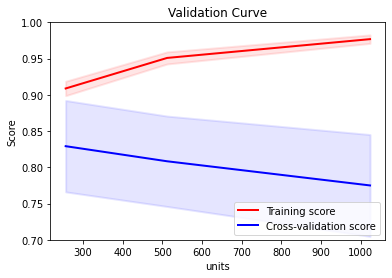

In [77]:
NN_grid_search_validation_curve(NN[1], 'units', log=False, ylim=(0.7, 1))

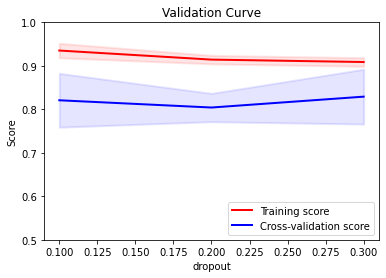

In [78]:
NN_grid_search_validation_curve(NN[1], 'dropout', log=False, ylim=(0.5, 1))

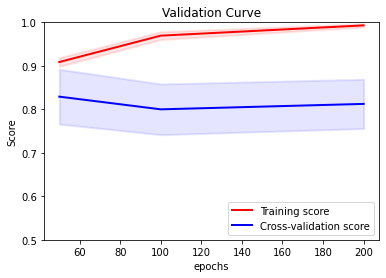

In [79]:
NN_grid_search_validation_curve(NN[1], 'epochs', log=False, ylim=(0.5, 1))

In [235]:
#due to incompatibility issues, learning curve for kerasclassifier could not be made.

#### XGBoost

In [80]:
xgb.XGBClassifier().get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'gamma': None,
 'gpu_id': None,
 'importance_type': 'gain',
 'interaction_constraints': None,
 'learning_rate': None,
 'max_delta_step': None,
 'max_depth': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [81]:
xgb_params_grid ={'max_depth': [2,4,8,16,24],
                 'n_estimators': [100, 200, 400, 800],
                 'importance_type': ['gain', 'weight', 'cover', 'total_gain', 'total_cover']}

model_xgb = xgb.XGBClassifier(n_jobs = -1, random_state = 0, gpu_id = 0)

xgboostclassifier = GridSearchCV(model_xgb, 
                    param_grid=xgb_params_grid, 
                    cv=10, 
                    return_train_score= True, 
                    scoring = 'f1')

xgb_pipe = Pipeline(steps = [ 
    ('preprocessing', preprocessor),
    ('xgb_classifier', xgboostclassifier)
])

tuned_xgb = xgb_pipe.fit(X_train, Y_train)

In [82]:
dump(xgb_pipe, 'HD_xgb.joblib')

['HD_xgb.joblib']

In [37]:
xgb_pipe = load('HD_xgb.joblib')

In [84]:
print('Grid search mean and stdev:\n')
scoring = xgb_pipe[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

0.792 (+/-0.141) for {'importance_type': 'gain', 'max_depth': 2, 'n_estimators': 100}
0.787 (+/-0.136) for {'importance_type': 'gain', 'max_depth': 2, 'n_estimators': 200}
0.794 (+/-0.135) for {'importance_type': 'gain', 'max_depth': 2, 'n_estimators': 400}
0.793 (+/-0.169) for {'importance_type': 'gain', 'max_depth': 2, 'n_estimators': 800}
0.824 (+/-0.126) for {'importance_type': 'gain', 'max_depth': 4, 'n_estimators': 100}
0.814 (+/-0.149) for {'importance_type': 'gain', 'max_depth': 4, 'n_estimators': 200}
0.811 (+/-0.165) for {'importance_type': 'gain', 'max_depth': 4, 'n_estimators': 400}
0.808 (+/-0.163) for {'importance_type': 'gain', 'max_depth': 4, 'n_estimators': 800}
0.816 (+/-0.122) for {'importance_type': 'gain', 'max_depth': 8, 'n_estimators': 100}
0.817 (+/-0.155) for {'importance_type': 'gain', 'max_depth': 8, 'n_estimators': 200}
0.821 (+/-0.181) for {'importance_type': 'gain', 'max_depth': 8, 'n_estimators': 400}
0.820 (+/-0.181) for {'im

In [85]:
# Print best params
print('\nBest parameters:', xgb_pipe[1].best_params_)


Best parameters: {'importance_type': 'gain', 'max_depth': 4, 'n_estimators': 100}


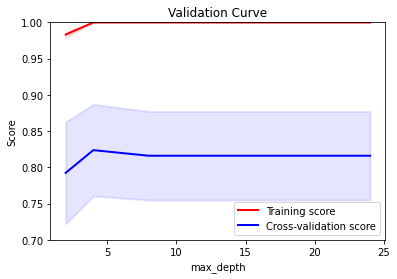

In [86]:
NN_grid_search_validation_curve(xgb_pipe[1], 'max_depth', log=False, ylim=(0.7, 1))

In [93]:
print(classification_report(Y_cv, xgb_pipe.predict(X_cv)))

              precision    recall  f1-score   support

           0       0.80      0.83      0.82        24
           1       0.86      0.83      0.85        30

    accuracy                           0.83        54
   macro avg       0.83      0.83      0.83        54
weighted avg       0.83      0.83      0.83        54



#### SVM

In [94]:
LinearSVC().get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': True,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'loss': 'squared_hinge',
 'max_iter': 1000,
 'multi_class': 'ovr',
 'penalty': 'l2',
 'random_state': None,
 'tol': 0.0001,
 'verbose': 0}

In [95]:
svc_params_grid = {'C': [0.0001, 0.01, 1, 100, 1000, 1e5], 
     'tol': [0.0001, 0.01, 1, 100, 1000, 1e5],
                  'class_weight': [None,'balanced'],
                  'penalty': ['l1','l2']}
  
model_svc = LinearSVC(verbose =1, random_state=0)

svc_grid = GridSearchCV(model_svc, 
                    param_grid=svc_params_grid, 
                    cv=10, 
                    return_train_score= True, 
                    scoring = 'f1')

svc_pipe = Pipeline(steps = [ 
    ('preprocessing', preprocessor),
    ('svc_classifier', svc_grid)
])

tuned_svc = svc_pipe.fit(X_train, Y_train)

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

In [96]:
dump(svc_pipe, 'HD_svc.joblib')

['HD_svc.joblib']

In [97]:
svc_pipe = load('HD_svc.joblib')

In [98]:
print('Grid search mean and stdev:\n')
scoring = svc_pipe[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

nan (+/-nan) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l1', 'tol': 0.0001}
nan (+/-nan) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l1', 'tol': 0.01}
nan (+/-nan) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l1', 'tol': 1}
nan (+/-nan) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l1', 'tol': 100}
nan (+/-nan) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l1', 'tol': 1000}
nan (+/-nan) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l1', 'tol': 100000.0}
0.785 (+/-0.110) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l2', 'tol': 0.0001}
0.785 (+/-0.110) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l2', 'tol': 0.01}
0.785 (+/-0.110) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l2', 'tol': 1}
0.785 (+/-0.110) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l2', 'tol': 100}
0.785 (+/-0.110) for {'C': 0.0001, 'class_weight': None, 'penalty': 'l2', 'tol': 1000}
0.785 (+/-0.110) for {'C': 0.0001, 'cl

In [99]:
# Print best params
print('\nBest parameters:', svc_pipe[1].best_params_)


Best parameters: {'C': 1, 'class_weight': None, 'penalty': 'l2', 'tol': 0.0001}


In [100]:
print(classification_report(Y_test, svc_pipe.predict(X_test)))

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         3
           1       0.80      1.00      0.89         4

    accuracy                           0.86         7
   macro avg       0.90      0.83      0.84         7
weighted avg       0.89      0.86      0.85         7



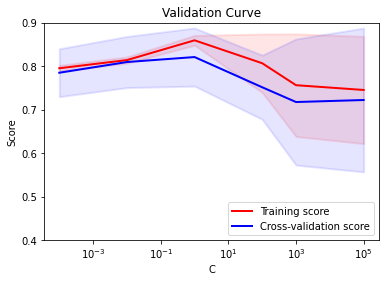

In [101]:
NN_grid_search_validation_curve(svc_pipe[1], 'C', log=True, ylim=(0.4, 0.9))

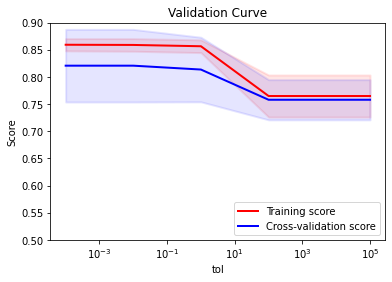

In [102]:
NN_grid_search_validation_curve(svc_pipe[1], 'tol', log=True, ylim=(0.5, 0.9))

<module 'matplotlib.pyplot' from 'C:\\Users\\antho\\Anaconda3\\envs\\tensorflow\\lib\\site-packages\\matplotlib\\pyplot.py'>

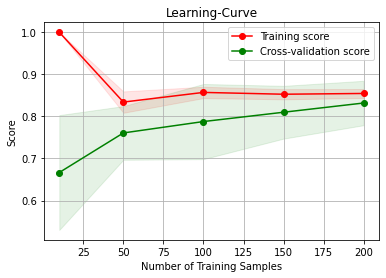

In [115]:
svc_learning = Pipeline(steps = [    
    ('preprocessing', preprocessor),
    ('classifer', LinearSVC(verbose =1, C= 1, tol= 0.0001, penalty = 'l2', class_weight= None))
    ]) #best parameters
plot_learning_curve(svc_learning)

#### LightGBM

In [103]:
lgb.LGBMClassifier().get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': True,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [104]:
lgb_params_grid ={'max_depth': [2,4,8,16,24],
                 'num_leaves': [10,20,40],
                 'n_estimators': [100,200,400]}

model_lgb = lgb.LGBMClassifier(n_jobs = -1, random_state=0)

lgbclassifier = GridSearchCV(model_lgb, 
                    param_grid=lgb_params_grid, 
                    cv=10, return_train_score= True, scoring = 'f1')

lgb_pipe = Pipeline(steps = [ 
    ('preprocessing', preprocessor),
    ('lgb_classifier', lgbclassifier)
])

tuned_lgb = lgb_pipe.fit(X_train, Y_train)

In [105]:
dump(lgb_pipe, 'HD_lgb.joblib')

['HD_lgb.joblib']

In [36]:
lgb_pipe = load('HD_lgb.joblib')

In [107]:
print('Grid search mean and stdev:\n')
scoring = lgb_pipe[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

0.823 (+/-0.142) for {'max_depth': 2, 'n_estimators': 100, 'num_leaves': 10}
0.823 (+/-0.142) for {'max_depth': 2, 'n_estimators': 100, 'num_leaves': 20}
0.823 (+/-0.142) for {'max_depth': 2, 'n_estimators': 100, 'num_leaves': 40}
0.799 (+/-0.131) for {'max_depth': 2, 'n_estimators': 200, 'num_leaves': 10}
0.799 (+/-0.131) for {'max_depth': 2, 'n_estimators': 200, 'num_leaves': 20}
0.799 (+/-0.131) for {'max_depth': 2, 'n_estimators': 200, 'num_leaves': 40}
0.792 (+/-0.109) for {'max_depth': 2, 'n_estimators': 400, 'num_leaves': 10}
0.792 (+/-0.109) for {'max_depth': 2, 'n_estimators': 400, 'num_leaves': 20}
0.792 (+/-0.109) for {'max_depth': 2, 'n_estimators': 400, 'num_leaves': 40}
0.800 (+/-0.138) for {'max_depth': 4, 'n_estimators': 100, 'num_leaves': 10}
0.800 (+/-0.138) for {'max_depth': 4, 'n_estimators': 100, 'num_leaves': 20}
0.800 (+/-0.138) for {'max_depth': 4, 'n_estimators': 100, 'num_leaves': 40}
0.807 (+/-0.136) for {'max_depth': 4, 'n_estima

In [108]:
# Print best params
print('\nBest parameters:', lgb_pipe[1].best_params_)


Best parameters: {'max_depth': 2, 'n_estimators': 100, 'num_leaves': 10}


In [110]:
print(classification_report(Y_cv, lgb_pipe.predict(X_cv)))

              precision    recall  f1-score   support

           0       0.84      0.88      0.86        24
           1       0.90      0.87      0.88        30

    accuracy                           0.87        54
   macro avg       0.87      0.87      0.87        54
weighted avg       0.87      0.87      0.87        54



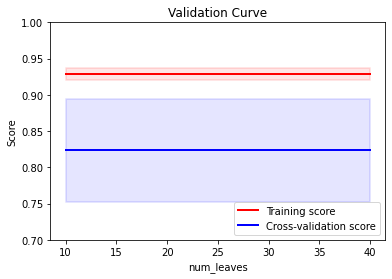

In [111]:
NN_grid_search_validation_curve(lgb_pipe[1], 'num_leaves', log=False, ylim=(0.7, 1))

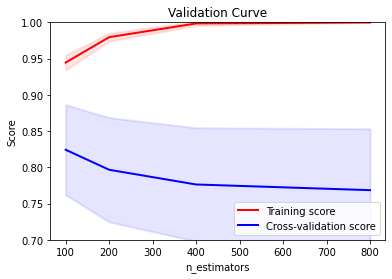

In [148]:
NN_grid_search_validation_curve(lgb_pipe[1], 'n_estimators', log=False, ylim=(0.7, 1))

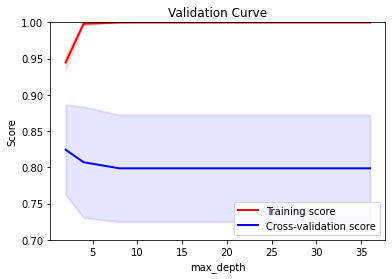

In [149]:
NN_grid_search_validation_curve(lgb_pipe[1], 'max_depth', log=False, ylim=(0.7, 1))

<module 'matplotlib.pyplot' from 'C:\\Users\\antho\\Anaconda3\\envs\\tensorflow\\lib\\site-packages\\matplotlib\\pyplot.py'>

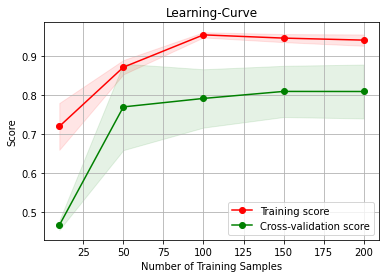

In [150]:
lgb_learning = Pipeline(steps = [    
    ('preprocessing', preprocessor),
    ('classifer', lgb.LGBMClassifier(n_estimators = 100, 
                                     num_leaves =  10, 
                                     max_depth= 2))
    ]) #best parameters
plot_learning_curve(lgb_learning)

#### CatBoost

In [112]:
cb_params_grid ={'max_depth': [2,4,8,16,24],
                 'n_estimators': [50, 100,200]}

model_cb = cb.CatBoostClassifier(random_state = 0)

cbclassifier = GridSearchCV(model_cb, 
                    param_grid=cb_params_grid, 
                    cv=10, 
                    return_train_score= True, 
                    scoring = 'accuracy')

cb_pipe = Pipeline(steps = [ 
    ('preprocessing', preprocessor),
    ('cb_classifier', cbclassifier)
])

tuned_cb = cb_pipe.fit(X_train, Y_train)

Learning rate set to 0.08352
0:	learn: 0.6604963	total: 68ms	remaining: 3.33s
1:	learn: 0.6253266	total: 68.8ms	remaining: 1.65s
2:	learn: 0.6021715	total: 69.3ms	remaining: 1.08s
3:	learn: 0.5721769	total: 70.1ms	remaining: 806ms
4:	learn: 0.5529288	total: 70.6ms	remaining: 636ms
5:	learn: 0.5380043	total: 71.1ms	remaining: 522ms
6:	learn: 0.5161388	total: 71.6ms	remaining: 440ms
7:	learn: 0.5010462	total: 72.2ms	remaining: 379ms
8:	learn: 0.4911306	total: 72.8ms	remaining: 331ms
9:	learn: 0.4854907	total: 73.3ms	remaining: 293ms
10:	learn: 0.4708495	total: 73.8ms	remaining: 262ms
11:	learn: 0.4654918	total: 74.4ms	remaining: 236ms
12:	learn: 0.4557347	total: 75.1ms	remaining: 214ms
13:	learn: 0.4473898	total: 75.7ms	remaining: 195ms
14:	learn: 0.4403286	total: 76.4ms	remaining: 178ms
15:	learn: 0.4372575	total: 76.9ms	remaining: 163ms
16:	learn: 0.4263450	total: 77.6ms	remaining: 151ms
17:	learn: 0.4194492	total: 78.3ms	remaining: 139ms
18:	learn: 0.4115213	total: 79.2ms	remaining: 1

0:	learn: 0.6647633	total: 712us	remaining: 34.9ms
1:	learn: 0.6404597	total: 2.03ms	remaining: 48.7ms
2:	learn: 0.6145304	total: 2.79ms	remaining: 43.7ms
3:	learn: 0.5894398	total: 3.3ms	remaining: 38ms
4:	learn: 0.5669042	total: 4.26ms	remaining: 38.4ms
5:	learn: 0.5589051	total: 5.03ms	remaining: 36.9ms
6:	learn: 0.5376439	total: 5.89ms	remaining: 36.2ms
7:	learn: 0.5252124	total: 6.42ms	remaining: 33.7ms
8:	learn: 0.5139406	total: 6.91ms	remaining: 31.5ms
9:	learn: 0.4949333	total: 7.44ms	remaining: 29.8ms
10:	learn: 0.4815698	total: 8.13ms	remaining: 28.8ms
11:	learn: 0.4707339	total: 8.64ms	remaining: 27.4ms
12:	learn: 0.4635123	total: 9.14ms	remaining: 26ms
13:	learn: 0.4579047	total: 9.94ms	remaining: 25.6ms
14:	learn: 0.4494257	total: 10.6ms	remaining: 24.8ms
15:	learn: 0.4431725	total: 11.2ms	remaining: 23.7ms
16:	learn: 0.4332142	total: 11.7ms	remaining: 22.7ms
17:	learn: 0.4294388	total: 12.4ms	remaining: 22ms
18:	learn: 0.4267599	total: 13.3ms	remaining: 21.7ms
19:	learn: 

13:	learn: 0.4525683	total: 9.25ms	remaining: 23.8ms
14:	learn: 0.4467699	total: 9.89ms	remaining: 23.1ms
15:	learn: 0.4409323	total: 10.7ms	remaining: 22.8ms
16:	learn: 0.4366143	total: 11.3ms	remaining: 22ms
17:	learn: 0.4322382	total: 12.1ms	remaining: 21.5ms
18:	learn: 0.4282722	total: 12.7ms	remaining: 20.8ms
19:	learn: 0.4182706	total: 13.4ms	remaining: 20.1ms
20:	learn: 0.4146545	total: 14ms	remaining: 19.4ms
21:	learn: 0.4084663	total: 14.6ms	remaining: 18.5ms
22:	learn: 0.4003857	total: 15.3ms	remaining: 17.9ms
23:	learn: 0.3969291	total: 15.9ms	remaining: 17.2ms
24:	learn: 0.3948630	total: 16.6ms	remaining: 16.6ms
25:	learn: 0.3910370	total: 17.3ms	remaining: 16ms
26:	learn: 0.3876489	total: 17.9ms	remaining: 15.2ms
27:	learn: 0.3856635	total: 18.5ms	remaining: 14.5ms
28:	learn: 0.3823723	total: 19.2ms	remaining: 13.9ms
29:	learn: 0.3787113	total: 19.7ms	remaining: 13.1ms
30:	learn: 0.3769075	total: 20.4ms	remaining: 12.5ms
31:	learn: 0.3747335	total: 21.1ms	remaining: 11.9ms

25:	learn: 0.4221989	total: 17.1ms	remaining: 48.7ms
26:	learn: 0.4187536	total: 17.9ms	remaining: 48.4ms
27:	learn: 0.4149951	total: 18.5ms	remaining: 47.5ms
28:	learn: 0.4116096	total: 19ms	remaining: 46.4ms
29:	learn: 0.4056957	total: 19.7ms	remaining: 45.9ms
30:	learn: 0.4005709	total: 20.4ms	remaining: 45.4ms
31:	learn: 0.3981378	total: 21.8ms	remaining: 46.4ms
32:	learn: 0.3967261	total: 22.4ms	remaining: 45.4ms
33:	learn: 0.3918356	total: 22.9ms	remaining: 44.4ms
34:	learn: 0.3886213	total: 23.9ms	remaining: 44.4ms
35:	learn: 0.3837355	total: 24.5ms	remaining: 43.6ms
36:	learn: 0.3797081	total: 25.1ms	remaining: 42.7ms
37:	learn: 0.3763555	total: 25.9ms	remaining: 42.3ms
38:	learn: 0.3745128	total: 27.2ms	remaining: 42.6ms
39:	learn: 0.3725100	total: 28ms	remaining: 42ms
40:	learn: 0.3713956	total: 28.5ms	remaining: 41ms
41:	learn: 0.3686358	total: 29.2ms	remaining: 40.4ms
42:	learn: 0.3669047	total: 30ms	remaining: 39.8ms
43:	learn: 0.3632226	total: 30.6ms	remaining: 39ms
44:	l

0:	learn: 0.6773500	total: 811us	remaining: 80.4ms
1:	learn: 0.6662687	total: 1.32ms	remaining: 64.8ms
2:	learn: 0.6556450	total: 1.84ms	remaining: 59.4ms
3:	learn: 0.6338715	total: 2.33ms	remaining: 55.9ms
4:	learn: 0.6136511	total: 2.83ms	remaining: 53.9ms
5:	learn: 0.5955105	total: 3.31ms	remaining: 51.9ms
6:	learn: 0.5855492	total: 3.81ms	remaining: 50.6ms
7:	learn: 0.5733310	total: 4.32ms	remaining: 49.7ms
8:	learn: 0.5638814	total: 5.34ms	remaining: 54ms
9:	learn: 0.5519604	total: 5.87ms	remaining: 52.8ms
10:	learn: 0.5415306	total: 6.37ms	remaining: 51.5ms
11:	learn: 0.5316062	total: 7.04ms	remaining: 51.6ms
12:	learn: 0.5239245	total: 7.74ms	remaining: 51.8ms
13:	learn: 0.5152835	total: 8.24ms	remaining: 50.6ms
14:	learn: 0.5091370	total: 8.97ms	remaining: 50.9ms
15:	learn: 0.5009964	total: 9.48ms	remaining: 49.8ms
16:	learn: 0.4961794	total: 10.4ms	remaining: 50.5ms
17:	learn: 0.4923635	total: 11.1ms	remaining: 50.6ms
18:	learn: 0.4850414	total: 11.6ms	remaining: 49.4ms
19:	le

0:	learn: 0.6756835	total: 722us	remaining: 71.5ms
1:	learn: 0.6591580	total: 1.23ms	remaining: 60.2ms
2:	learn: 0.6377455	total: 1.81ms	remaining: 58.6ms
3:	learn: 0.6160962	total: 2.47ms	remaining: 59.3ms
4:	learn: 0.5968288	total: 3.58ms	remaining: 68.1ms
5:	learn: 0.5840934	total: 4.11ms	remaining: 64.4ms
6:	learn: 0.5688717	total: 4.6ms	remaining: 61.1ms
7:	learn: 0.5613389	total: 5.13ms	remaining: 59.1ms
8:	learn: 0.5479888	total: 5.64ms	remaining: 57.1ms
9:	learn: 0.5359991	total: 6.4ms	remaining: 57.6ms
10:	learn: 0.5274114	total: 7.16ms	remaining: 57.9ms
11:	learn: 0.5204960	total: 8.25ms	remaining: 60.5ms
12:	learn: 0.5122962	total: 8.81ms	remaining: 58.9ms
13:	learn: 0.5033824	total: 9.31ms	remaining: 57.2ms
14:	learn: 0.4959121	total: 10.1ms	remaining: 57ms
15:	learn: 0.4910825	total: 10.6ms	remaining: 55.8ms
16:	learn: 0.4852649	total: 11.1ms	remaining: 54.3ms
17:	learn: 0.4797156	total: 11.8ms	remaining: 53.7ms
18:	learn: 0.4740830	total: 12.3ms	remaining: 52.4ms
19:	lear

92:	learn: 0.3370100	total: 62.8ms	remaining: 4.72ms
93:	learn: 0.3365003	total: 63.3ms	remaining: 4.04ms
94:	learn: 0.3353496	total: 63.9ms	remaining: 3.36ms
95:	learn: 0.3342626	total: 64.7ms	remaining: 2.69ms
96:	learn: 0.3330638	total: 65.2ms	remaining: 2.02ms
97:	learn: 0.3326704	total: 65.7ms	remaining: 1.34ms
98:	learn: 0.3317611	total: 66.2ms	remaining: 668us
99:	learn: 0.3309825	total: 66.7ms	remaining: 0us
Learning rate set to 0.044233
0:	learn: 0.6781835	total: 2.26ms	remaining: 224ms
1:	learn: 0.6691539	total: 3.02ms	remaining: 148ms
2:	learn: 0.6562910	total: 3.66ms	remaining: 118ms
3:	learn: 0.6362258	total: 4.38ms	remaining: 105ms
4:	learn: 0.6253419	total: 5ms	remaining: 95.1ms
5:	learn: 0.6122300	total: 5.54ms	remaining: 86.8ms
6:	learn: 0.6016123	total: 6.19ms	remaining: 82.2ms
7:	learn: 0.5901783	total: 6.89ms	remaining: 79.3ms
8:	learn: 0.5843415	total: 7.7ms	remaining: 77.8ms
9:	learn: 0.5728743	total: 8.23ms	remaining: 74ms
10:	learn: 0.5601261	total: 8.73ms	remai

47:	learn: 0.3741360	total: 31.7ms	remaining: 34.4ms
48:	learn: 0.3718540	total: 32.4ms	remaining: 33.8ms
49:	learn: 0.3688462	total: 33ms	remaining: 33ms
50:	learn: 0.3673442	total: 33.5ms	remaining: 32.2ms
51:	learn: 0.3629302	total: 34ms	remaining: 31.4ms
52:	learn: 0.3608343	total: 34.7ms	remaining: 30.8ms
53:	learn: 0.3596494	total: 35.2ms	remaining: 30ms
54:	learn: 0.3584524	total: 35.7ms	remaining: 29.2ms
55:	learn: 0.3577335	total: 36.2ms	remaining: 28.5ms
56:	learn: 0.3561569	total: 36.8ms	remaining: 27.7ms
57:	learn: 0.3556289	total: 37.8ms	remaining: 27.4ms
58:	learn: 0.3542939	total: 38.5ms	remaining: 26.7ms
59:	learn: 0.3525845	total: 39.1ms	remaining: 26.1ms
60:	learn: 0.3510779	total: 39.7ms	remaining: 25.4ms
61:	learn: 0.3488530	total: 40.3ms	remaining: 24.7ms
62:	learn: 0.3475027	total: 41.7ms	remaining: 24.5ms
63:	learn: 0.3466446	total: 42.3ms	remaining: 23.8ms
64:	learn: 0.3462223	total: 43.1ms	remaining: 23.2ms
65:	learn: 0.3440927	total: 43.7ms	remaining: 22.5ms
6

13:	learn: 0.5755285	total: 8.73ms	remaining: 116ms
14:	learn: 0.5698039	total: 9.73ms	remaining: 120ms
15:	learn: 0.5660725	total: 10.4ms	remaining: 119ms
16:	learn: 0.5596362	total: 10.9ms	remaining: 117ms
17:	learn: 0.5517755	total: 11.4ms	remaining: 116ms
18:	learn: 0.5470732	total: 11.9ms	remaining: 114ms
19:	learn: 0.5437704	total: 12.5ms	remaining: 112ms
20:	learn: 0.5391284	total: 13.1ms	remaining: 111ms
21:	learn: 0.5329296	total: 13.7ms	remaining: 111ms
22:	learn: 0.5278789	total: 14.4ms	remaining: 111ms
23:	learn: 0.5234768	total: 15ms	remaining: 110ms
24:	learn: 0.5195147	total: 15.7ms	remaining: 110ms
25:	learn: 0.5152411	total: 16.2ms	remaining: 108ms
26:	learn: 0.5092661	total: 16.7ms	remaining: 107ms
27:	learn: 0.5048254	total: 17.5ms	remaining: 107ms
28:	learn: 0.5007338	total: 18.1ms	remaining: 106ms
29:	learn: 0.4978556	total: 18.6ms	remaining: 106ms
30:	learn: 0.4946338	total: 19.4ms	remaining: 106ms
31:	learn: 0.4925716	total: 20.2ms	remaining: 106ms
32:	learn: 0.4

46:	learn: 0.4366551	total: 26.7ms	remaining: 86.8ms
47:	learn: 0.4327112	total: 27.4ms	remaining: 86.9ms
48:	learn: 0.4311241	total: 27.9ms	remaining: 86.1ms
49:	learn: 0.4274425	total: 28.6ms	remaining: 85.8ms
50:	learn: 0.4254342	total: 29.1ms	remaining: 85ms
51:	learn: 0.4215637	total: 29.6ms	remaining: 84.2ms
52:	learn: 0.4195039	total: 30.1ms	remaining: 83.6ms
53:	learn: 0.4178399	total: 30.6ms	remaining: 82.8ms
54:	learn: 0.4165977	total: 31.1ms	remaining: 82ms
55:	learn: 0.4143869	total: 31.7ms	remaining: 81.5ms
56:	learn: 0.4126138	total: 32.4ms	remaining: 81.3ms
57:	learn: 0.4109900	total: 33.1ms	remaining: 81.1ms
58:	learn: 0.4079771	total: 33.9ms	remaining: 81ms
59:	learn: 0.4051407	total: 34.5ms	remaining: 80.5ms
60:	learn: 0.4042340	total: 35ms	remaining: 79.8ms
61:	learn: 0.4029890	total: 35.6ms	remaining: 79.3ms
62:	learn: 0.4011519	total: 36.3ms	remaining: 79ms
63:	learn: 0.4002260	total: 37ms	remaining: 78.7ms
64:	learn: 0.3980505	total: 37.8ms	remaining: 78.6ms
65:	l

83:	learn: 0.3903861	total: 47.7ms	remaining: 65.8ms
84:	learn: 0.3896503	total: 48.3ms	remaining: 65.4ms
85:	learn: 0.3889135	total: 49ms	remaining: 65ms
86:	learn: 0.3871481	total: 49.6ms	remaining: 64.4ms
87:	learn: 0.3859955	total: 50.1ms	remaining: 63.7ms
88:	learn: 0.3852486	total: 50.6ms	remaining: 63.1ms
89:	learn: 0.3847829	total: 51.1ms	remaining: 62.5ms
90:	learn: 0.3835782	total: 51.7ms	remaining: 61.9ms
91:	learn: 0.3821552	total: 52.4ms	remaining: 61.5ms
92:	learn: 0.3815253	total: 52.9ms	remaining: 60.9ms
93:	learn: 0.3804833	total: 53.4ms	remaining: 60.2ms
94:	learn: 0.3796962	total: 54.1ms	remaining: 59.8ms
95:	learn: 0.3788071	total: 54.6ms	remaining: 59.1ms
96:	learn: 0.3778798	total: 55.1ms	remaining: 58.5ms
97:	learn: 0.3768573	total: 55.8ms	remaining: 58ms
98:	learn: 0.3762027	total: 56.4ms	remaining: 57.6ms
99:	learn: 0.3756707	total: 56.9ms	remaining: 56.9ms
100:	learn: 0.3746715	total: 57.4ms	remaining: 56.3ms
101:	learn: 0.3738680	total: 58.1ms	remaining: 55.8

104:	learn: 0.3720144	total: 63.1ms	remaining: 57.1ms
105:	learn: 0.3704592	total: 63.7ms	remaining: 56.5ms
106:	learn: 0.3697332	total: 64.2ms	remaining: 55.8ms
107:	learn: 0.3685914	total: 64.8ms	remaining: 55.2ms
108:	learn: 0.3679073	total: 65.3ms	remaining: 54.5ms
109:	learn: 0.3667216	total: 66.1ms	remaining: 54ms
110:	learn: 0.3656669	total: 66.8ms	remaining: 53.6ms
111:	learn: 0.3641469	total: 67.5ms	remaining: 53ms
112:	learn: 0.3636235	total: 68ms	remaining: 52.4ms
113:	learn: 0.3631021	total: 68.7ms	remaining: 51.8ms
114:	learn: 0.3622724	total: 69.2ms	remaining: 51.1ms
115:	learn: 0.3615722	total: 69.8ms	remaining: 50.5ms
116:	learn: 0.3609729	total: 70.3ms	remaining: 49.9ms
117:	learn: 0.3606174	total: 70.8ms	remaining: 49.2ms
118:	learn: 0.3601365	total: 71.4ms	remaining: 48.6ms
119:	learn: 0.3595174	total: 72ms	remaining: 48ms
120:	learn: 0.3587739	total: 72.5ms	remaining: 47.4ms
121:	learn: 0.3584514	total: 73.1ms	remaining: 46.7ms
122:	learn: 0.3578687	total: 73.8ms	re

110:	learn: 0.3750129	total: 74.9ms	remaining: 60ms
111:	learn: 0.3742567	total: 75.4ms	remaining: 59.2ms
112:	learn: 0.3732349	total: 76.2ms	remaining: 58.6ms
113:	learn: 0.3725005	total: 76.8ms	remaining: 57.9ms
114:	learn: 0.3716455	total: 77.3ms	remaining: 57.1ms
115:	learn: 0.3713897	total: 77.7ms	remaining: 56.3ms
116:	learn: 0.3705224	total: 78.2ms	remaining: 55.5ms
117:	learn: 0.3699424	total: 78.7ms	remaining: 54.7ms
118:	learn: 0.3692611	total: 79.5ms	remaining: 54.1ms
119:	learn: 0.3691374	total: 80.2ms	remaining: 53.4ms
120:	learn: 0.3682342	total: 80.6ms	remaining: 52.7ms
121:	learn: 0.3676325	total: 81.1ms	remaining: 51.9ms
122:	learn: 0.3670154	total: 81.6ms	remaining: 51.1ms
123:	learn: 0.3663375	total: 82.3ms	remaining: 50.5ms
124:	learn: 0.3658688	total: 83.1ms	remaining: 49.9ms
125:	learn: 0.3654077	total: 83.6ms	remaining: 49.1ms
126:	learn: 0.3648455	total: 84.4ms	remaining: 48.5ms
127:	learn: 0.3641074	total: 85ms	remaining: 47.8ms
128:	learn: 0.3634871	total: 85.

137:	learn: 0.3440581	total: 80ms	remaining: 36ms
138:	learn: 0.3435232	total: 80.5ms	remaining: 35.3ms
139:	learn: 0.3426794	total: 81ms	remaining: 34.7ms
140:	learn: 0.3420947	total: 83.4ms	remaining: 34.9ms
141:	learn: 0.3412428	total: 83.9ms	remaining: 34.3ms
142:	learn: 0.3406973	total: 84.6ms	remaining: 33.7ms
143:	learn: 0.3399232	total: 85.2ms	remaining: 33.1ms
144:	learn: 0.3395648	total: 85.8ms	remaining: 32.6ms
145:	learn: 0.3386924	total: 86.5ms	remaining: 32ms
146:	learn: 0.3381176	total: 87.2ms	remaining: 31.4ms
147:	learn: 0.3378079	total: 88.3ms	remaining: 31ms
148:	learn: 0.3374692	total: 88.8ms	remaining: 30.4ms
149:	learn: 0.3371800	total: 89.4ms	remaining: 29.8ms
150:	learn: 0.3363731	total: 89.9ms	remaining: 29.2ms
151:	learn: 0.3359734	total: 90.6ms	remaining: 28.6ms
152:	learn: 0.3353324	total: 91.6ms	remaining: 28.1ms
153:	learn: 0.3349159	total: 92.3ms	remaining: 27.6ms
154:	learn: 0.3344378	total: 93ms	remaining: 27ms
155:	learn: 0.3341309	total: 93.8ms	remain

143:	learn: 0.3584108	total: 93.3ms	remaining: 36.3ms
144:	learn: 0.3573135	total: 94ms	remaining: 35.6ms
145:	learn: 0.3570153	total: 94.7ms	remaining: 35ms
146:	learn: 0.3566839	total: 95.4ms	remaining: 34.4ms
147:	learn: 0.3562774	total: 96.2ms	remaining: 33.8ms
148:	learn: 0.3559161	total: 96.7ms	remaining: 33.1ms
149:	learn: 0.3553754	total: 97.4ms	remaining: 32.5ms
150:	learn: 0.3549981	total: 98.3ms	remaining: 31.9ms
151:	learn: 0.3547831	total: 98.8ms	remaining: 31.2ms
152:	learn: 0.3542595	total: 99.3ms	remaining: 30.5ms
153:	learn: 0.3540175	total: 100ms	remaining: 29.9ms
154:	learn: 0.3537142	total: 101ms	remaining: 29.2ms
155:	learn: 0.3530454	total: 101ms	remaining: 28.6ms
156:	learn: 0.3523534	total: 102ms	remaining: 27.9ms
157:	learn: 0.3519367	total: 103ms	remaining: 27.3ms
158:	learn: 0.3514330	total: 104ms	remaining: 26.7ms
159:	learn: 0.3505234	total: 104ms	remaining: 26.1ms
160:	learn: 0.3501927	total: 105ms	remaining: 25.5ms
161:	learn: 0.3494395	total: 106ms	remai

128:	learn: 0.3545994	total: 97.7ms	remaining: 53.8ms
129:	learn: 0.3535026	total: 98.2ms	remaining: 52.9ms
130:	learn: 0.3523389	total: 99.1ms	remaining: 52.2ms
131:	learn: 0.3519808	total: 99.8ms	remaining: 51.4ms
132:	learn: 0.3511665	total: 100ms	remaining: 50.6ms
133:	learn: 0.3504314	total: 101ms	remaining: 49.8ms
134:	learn: 0.3502413	total: 102ms	remaining: 49ms
135:	learn: 0.3498976	total: 102ms	remaining: 48.1ms
136:	learn: 0.3492820	total: 103ms	remaining: 47.4ms
137:	learn: 0.3489222	total: 104ms	remaining: 46.8ms
138:	learn: 0.3481114	total: 105ms	remaining: 46.1ms
139:	learn: 0.3477110	total: 106ms	remaining: 45.2ms
140:	learn: 0.3472491	total: 106ms	remaining: 44.4ms
141:	learn: 0.3468200	total: 107ms	remaining: 43.5ms
142:	learn: 0.3464905	total: 107ms	remaining: 42.7ms
143:	learn: 0.3461370	total: 108ms	remaining: 42ms
144:	learn: 0.3454734	total: 109ms	remaining: 41.4ms
145:	learn: 0.3451354	total: 110ms	remaining: 40.7ms
146:	learn: 0.3443087	total: 110ms	remaining: 

115:	learn: 0.3561543	total: 79.2ms	remaining: 57.4ms
116:	learn: 0.3555672	total: 80.1ms	remaining: 56.8ms
117:	learn: 0.3548337	total: 80.6ms	remaining: 56ms
118:	learn: 0.3537021	total: 81.4ms	remaining: 55.4ms
119:	learn: 0.3525769	total: 81.9ms	remaining: 54.6ms
120:	learn: 0.3514543	total: 82.4ms	remaining: 53.8ms
121:	learn: 0.3503220	total: 82.9ms	remaining: 53ms
122:	learn: 0.3497261	total: 83.5ms	remaining: 52.2ms
123:	learn: 0.3489685	total: 84.5ms	remaining: 51.8ms
124:	learn: 0.3478303	total: 85.1ms	remaining: 51ms
125:	learn: 0.3472728	total: 85.7ms	remaining: 50.4ms
126:	learn: 0.3469194	total: 86.4ms	remaining: 49.6ms
127:	learn: 0.3461361	total: 87.7ms	remaining: 49.4ms
128:	learn: 0.3453745	total: 88.3ms	remaining: 48.6ms
129:	learn: 0.3443525	total: 88.8ms	remaining: 47.8ms
130:	learn: 0.3436531	total: 89.5ms	remaining: 47.1ms
131:	learn: 0.3432079	total: 90.3ms	remaining: 46.5ms
132:	learn: 0.3424916	total: 91ms	remaining: 45.8ms
133:	learn: 0.3416068	total: 91.5ms	

126:	learn: 0.3691111	total: 78ms	remaining: 44.8ms
127:	learn: 0.3685997	total: 78.5ms	remaining: 44.2ms
128:	learn: 0.3679562	total: 79ms	remaining: 43.5ms
129:	learn: 0.3670732	total: 79.6ms	remaining: 42.8ms
130:	learn: 0.3658079	total: 80.1ms	remaining: 42.2ms
131:	learn: 0.3652814	total: 80.6ms	remaining: 41.5ms
132:	learn: 0.3648847	total: 81.1ms	remaining: 40.8ms
133:	learn: 0.3640661	total: 81.6ms	remaining: 40.2ms
134:	learn: 0.3634975	total: 82.1ms	remaining: 39.5ms
135:	learn: 0.3625918	total: 82.6ms	remaining: 38.9ms
136:	learn: 0.3624109	total: 83.7ms	remaining: 38.5ms
137:	learn: 0.3618044	total: 84.2ms	remaining: 37.8ms
138:	learn: 0.3614248	total: 85ms	remaining: 37.3ms
139:	learn: 0.3601084	total: 85.5ms	remaining: 36.7ms
140:	learn: 0.3597346	total: 86.2ms	remaining: 36.1ms
141:	learn: 0.3591357	total: 86.7ms	remaining: 35.4ms
142:	learn: 0.3585230	total: 87.4ms	remaining: 34.8ms
143:	learn: 0.3576101	total: 88.1ms	remaining: 34.3ms
144:	learn: 0.3570663	total: 88.9m

134:	learn: 0.4077116	total: 90.8ms	remaining: 178ms
135:	learn: 0.4065805	total: 91.4ms	remaining: 177ms
136:	learn: 0.4060576	total: 92.2ms	remaining: 177ms
137:	learn: 0.4052006	total: 92.7ms	remaining: 176ms
138:	learn: 0.4045963	total: 93.2ms	remaining: 175ms
139:	learn: 0.4040545	total: 93.8ms	remaining: 174ms
140:	learn: 0.4034184	total: 94.3ms	remaining: 173ms
141:	learn: 0.4024086	total: 94.8ms	remaining: 172ms
142:	learn: 0.4017029	total: 95.3ms	remaining: 171ms
143:	learn: 0.4009435	total: 96.1ms	remaining: 171ms
144:	learn: 0.4003266	total: 96.7ms	remaining: 170ms
145:	learn: 0.3992491	total: 97.3ms	remaining: 169ms
146:	learn: 0.3987370	total: 98ms	remaining: 169ms
147:	learn: 0.3983521	total: 98.6ms	remaining: 168ms
148:	learn: 0.3976787	total: 99.1ms	remaining: 167ms
149:	learn: 0.3969928	total: 99.6ms	remaining: 166ms
150:	learn: 0.3964489	total: 100ms	remaining: 165ms
151:	learn: 0.3956354	total: 101ms	remaining: 165ms
152:	learn: 0.3947330	total: 102ms	remaining: 164m

0:	learn: 0.6868267	total: 726us	remaining: 290ms
1:	learn: 0.6827627	total: 1.32ms	remaining: 263ms
2:	learn: 0.6748032	total: 1.84ms	remaining: 243ms
3:	learn: 0.6686300	total: 2.35ms	remaining: 232ms
4:	learn: 0.6628623	total: 2.83ms	remaining: 224ms
5:	learn: 0.6593009	total: 3.33ms	remaining: 219ms
6:	learn: 0.6519463	total: 3.82ms	remaining: 215ms
7:	learn: 0.6475435	total: 4.48ms	remaining: 220ms
8:	learn: 0.6440471	total: 4.97ms	remaining: 216ms
9:	learn: 0.6373452	total: 5.46ms	remaining: 213ms
10:	learn: 0.6316316	total: 6.17ms	remaining: 218ms
11:	learn: 0.6271910	total: 7.03ms	remaining: 227ms
12:	learn: 0.6238195	total: 7.52ms	remaining: 224ms
13:	learn: 0.6202373	total: 8.21ms	remaining: 226ms
14:	learn: 0.6141193	total: 8.7ms	remaining: 223ms
15:	learn: 0.6103826	total: 9.21ms	remaining: 221ms
16:	learn: 0.6042218	total: 9.7ms	remaining: 219ms
17:	learn: 0.6015414	total: 10.2ms	remaining: 216ms
18:	learn: 0.5971891	total: 10.7ms	remaining: 214ms
19:	learn: 0.5939923	tota

278:	learn: 0.3125160	total: 149ms	remaining: 64.5ms
279:	learn: 0.3122674	total: 149ms	remaining: 64ms
280:	learn: 0.3118863	total: 150ms	remaining: 63.5ms
281:	learn: 0.3116489	total: 151ms	remaining: 63ms
282:	learn: 0.3114558	total: 151ms	remaining: 62.5ms
283:	learn: 0.3108744	total: 152ms	remaining: 61.9ms
284:	learn: 0.3106578	total: 152ms	remaining: 61.4ms
285:	learn: 0.3104333	total: 153ms	remaining: 60.8ms
286:	learn: 0.3100261	total: 153ms	remaining: 60.3ms
287:	learn: 0.3097146	total: 154ms	remaining: 59.8ms
288:	learn: 0.3096202	total: 154ms	remaining: 59.2ms
289:	learn: 0.3092962	total: 155ms	remaining: 58.7ms
290:	learn: 0.3088925	total: 155ms	remaining: 58.1ms
291:	learn: 0.3087261	total: 156ms	remaining: 57.6ms
292:	learn: 0.3084826	total: 156ms	remaining: 57.1ms
293:	learn: 0.3083786	total: 157ms	remaining: 56.7ms
294:	learn: 0.3081442	total: 158ms	remaining: 56.1ms
295:	learn: 0.3078221	total: 158ms	remaining: 55.6ms
296:	learn: 0.3073033	total: 159ms	remaining: 55.1

114:	learn: 0.4260161	total: 62.8ms	remaining: 156ms
115:	learn: 0.4249430	total: 63.5ms	remaining: 155ms
116:	learn: 0.4240981	total: 64.1ms	remaining: 155ms
117:	learn: 0.4235642	total: 64.8ms	remaining: 155ms
118:	learn: 0.4230180	total: 65.3ms	remaining: 154ms
119:	learn: 0.4214804	total: 65.8ms	remaining: 154ms
120:	learn: 0.4204490	total: 66.7ms	remaining: 154ms
121:	learn: 0.4196612	total: 67.3ms	remaining: 153ms
122:	learn: 0.4184084	total: 67.8ms	remaining: 153ms
123:	learn: 0.4178144	total: 68.3ms	remaining: 152ms
124:	learn: 0.4167199	total: 68.8ms	remaining: 151ms
125:	learn: 0.4157717	total: 69.2ms	remaining: 151ms
126:	learn: 0.4154448	total: 69.9ms	remaining: 150ms
127:	learn: 0.4145290	total: 70.4ms	remaining: 150ms
128:	learn: 0.4135913	total: 71.1ms	remaining: 149ms
129:	learn: 0.4123365	total: 71.8ms	remaining: 149ms
130:	learn: 0.4109711	total: 72.6ms	remaining: 149ms
131:	learn: 0.4103461	total: 73.1ms	remaining: 148ms
132:	learn: 0.4093308	total: 73.6ms	remaining:

387:	learn: 0.3192145	total: 216ms	remaining: 6.69ms
388:	learn: 0.3189566	total: 217ms	remaining: 6.13ms
389:	learn: 0.3188032	total: 217ms	remaining: 5.57ms
390:	learn: 0.3185970	total: 218ms	remaining: 5.01ms
391:	learn: 0.3185041	total: 218ms	remaining: 4.46ms
392:	learn: 0.3180182	total: 219ms	remaining: 3.9ms
393:	learn: 0.3178760	total: 220ms	remaining: 3.35ms
394:	learn: 0.3176795	total: 220ms	remaining: 2.79ms
395:	learn: 0.3173841	total: 221ms	remaining: 2.23ms
396:	learn: 0.3173165	total: 222ms	remaining: 1.67ms
397:	learn: 0.3170620	total: 222ms	remaining: 1.11ms
398:	learn: 0.3168436	total: 223ms	remaining: 557us
399:	learn: 0.3166629	total: 223ms	remaining: 0us
Learning rate set to 0.012407
0:	learn: 0.6886224	total: 729us	remaining: 291ms
1:	learn: 0.6852796	total: 1.35ms	remaining: 269ms
2:	learn: 0.6802993	total: 2.04ms	remaining: 271ms
3:	learn: 0.6735970	total: 2.76ms	remaining: 274ms
4:	learn: 0.6665295	total: 3.31ms	remaining: 262ms
5:	learn: 0.6611504	total: 3.81m

209:	learn: 0.3628597	total: 126ms	remaining: 114ms
210:	learn: 0.3625436	total: 126ms	remaining: 113ms
211:	learn: 0.3623409	total: 127ms	remaining: 113ms
212:	learn: 0.3618848	total: 127ms	remaining: 112ms
213:	learn: 0.3614912	total: 128ms	remaining: 111ms
214:	learn: 0.3611107	total: 128ms	remaining: 111ms
215:	learn: 0.3608274	total: 129ms	remaining: 110ms
216:	learn: 0.3604463	total: 130ms	remaining: 109ms
217:	learn: 0.3601764	total: 130ms	remaining: 109ms
218:	learn: 0.3596793	total: 131ms	remaining: 108ms
219:	learn: 0.3595080	total: 131ms	remaining: 107ms
220:	learn: 0.3591181	total: 132ms	remaining: 107ms
221:	learn: 0.3585586	total: 133ms	remaining: 106ms
222:	learn: 0.3581665	total: 133ms	remaining: 106ms
223:	learn: 0.3577065	total: 134ms	remaining: 105ms
224:	learn: 0.3575544	total: 134ms	remaining: 105ms
225:	learn: 0.3572071	total: 135ms	remaining: 104ms
226:	learn: 0.3566777	total: 136ms	remaining: 103ms
227:	learn: 0.3563272	total: 136ms	remaining: 103ms
228:	learn: 

35:	learn: 0.5602415	total: 22ms	remaining: 222ms
36:	learn: 0.5566864	total: 22.5ms	remaining: 220ms
37:	learn: 0.5541207	total: 23.1ms	remaining: 220ms
38:	learn: 0.5507011	total: 23.8ms	remaining: 220ms
39:	learn: 0.5476289	total: 24.3ms	remaining: 219ms
40:	learn: 0.5455609	total: 25.3ms	remaining: 221ms
41:	learn: 0.5438196	total: 25.9ms	remaining: 221ms
42:	learn: 0.5401861	total: 26.4ms	remaining: 219ms
43:	learn: 0.5385869	total: 27ms	remaining: 219ms
44:	learn: 0.5363046	total: 27.6ms	remaining: 217ms
45:	learn: 0.5342014	total: 28.1ms	remaining: 216ms
46:	learn: 0.5320465	total: 28.6ms	remaining: 215ms
47:	learn: 0.5290742	total: 29.3ms	remaining: 215ms
48:	learn: 0.5257537	total: 29.8ms	remaining: 214ms
49:	learn: 0.5237147	total: 30.5ms	remaining: 214ms
50:	learn: 0.5221821	total: 31ms	remaining: 212ms
51:	learn: 0.5201354	total: 31.7ms	remaining: 212ms
52:	learn: 0.5178811	total: 32.2ms	remaining: 211ms
53:	learn: 0.5148278	total: 32.8ms	remaining: 210ms
54:	learn: 0.51350

300:	learn: 0.3458459	total: 177ms	remaining: 58.3ms
301:	learn: 0.3455685	total: 178ms	remaining: 57.8ms
302:	learn: 0.3453934	total: 179ms	remaining: 57.2ms
303:	learn: 0.3450915	total: 179ms	remaining: 56.6ms
304:	learn: 0.3446975	total: 180ms	remaining: 56ms
305:	learn: 0.3444722	total: 180ms	remaining: 55.3ms
306:	learn: 0.3442334	total: 181ms	remaining: 54.8ms
307:	learn: 0.3438873	total: 181ms	remaining: 54.2ms
308:	learn: 0.3436712	total: 182ms	remaining: 53.6ms
309:	learn: 0.3433153	total: 183ms	remaining: 53ms
310:	learn: 0.3430575	total: 183ms	remaining: 52.5ms
311:	learn: 0.3427913	total: 184ms	remaining: 51.9ms
312:	learn: 0.3425231	total: 184ms	remaining: 51.3ms
313:	learn: 0.3423124	total: 185ms	remaining: 50.7ms
314:	learn: 0.3420219	total: 186ms	remaining: 50.1ms
315:	learn: 0.3416910	total: 187ms	remaining: 49.6ms
316:	learn: 0.3414395	total: 187ms	remaining: 49ms
317:	learn: 0.3411587	total: 188ms	remaining: 48.6ms
318:	learn: 0.3409819	total: 189ms	remaining: 48ms
3

126:	learn: 0.4107061	total: 71.1ms	remaining: 153ms
127:	learn: 0.4095346	total: 71.7ms	remaining: 152ms
128:	learn: 0.4083986	total: 72.3ms	remaining: 152ms
129:	learn: 0.4072947	total: 72.9ms	remaining: 151ms
130:	learn: 0.4064610	total: 73.4ms	remaining: 151ms
131:	learn: 0.4052710	total: 74ms	remaining: 150ms
132:	learn: 0.4046376	total: 74.6ms	remaining: 150ms
133:	learn: 0.4039789	total: 75.5ms	remaining: 150ms
134:	learn: 0.4032194	total: 76.1ms	remaining: 149ms
135:	learn: 0.4027034	total: 76.7ms	remaining: 149ms
136:	learn: 0.4019918	total: 77.3ms	remaining: 148ms
137:	learn: 0.4017455	total: 78ms	remaining: 148ms
138:	learn: 0.4013814	total: 78.6ms	remaining: 148ms
139:	learn: 0.4007034	total: 79.1ms	remaining: 147ms
140:	learn: 0.3997584	total: 79.7ms	remaining: 146ms
141:	learn: 0.3989717	total: 80.4ms	remaining: 146ms
142:	learn: 0.3979536	total: 81.1ms	remaining: 146ms
143:	learn: 0.3968752	total: 81.7ms	remaining: 145ms
144:	learn: 0.3963225	total: 82.3ms	remaining: 145

382:	learn: 0.3143946	total: 230ms	remaining: 10.2ms
383:	learn: 0.3142998	total: 230ms	remaining: 9.6ms
384:	learn: 0.3140028	total: 231ms	remaining: 9ms
385:	learn: 0.3138979	total: 232ms	remaining: 8.4ms
386:	learn: 0.3137089	total: 232ms	remaining: 7.8ms
387:	learn: 0.3135573	total: 233ms	remaining: 7.2ms
388:	learn: 0.3134917	total: 234ms	remaining: 6.61ms
389:	learn: 0.3132198	total: 235ms	remaining: 6.01ms
390:	learn: 0.3130552	total: 235ms	remaining: 5.41ms
391:	learn: 0.3129500	total: 236ms	remaining: 4.81ms
392:	learn: 0.3126219	total: 237ms	remaining: 4.21ms
393:	learn: 0.3124368	total: 237ms	remaining: 3.61ms
394:	learn: 0.3122949	total: 238ms	remaining: 3.01ms
395:	learn: 0.3122362	total: 238ms	remaining: 2.4ms
396:	learn: 0.3120795	total: 239ms	remaining: 1.8ms
397:	learn: 0.3120270	total: 239ms	remaining: 1.2ms
398:	learn: 0.3119310	total: 240ms	remaining: 601us
399:	learn: 0.3116553	total: 241ms	remaining: 0us
Learning rate set to 0.012407
0:	learn: 0.6891884	total: 705

181:	learn: 0.3869418	total: 122ms	remaining: 146ms
182:	learn: 0.3864019	total: 123ms	remaining: 146ms
183:	learn: 0.3861359	total: 123ms	remaining: 145ms
184:	learn: 0.3856157	total: 124ms	remaining: 144ms
185:	learn: 0.3853209	total: 124ms	remaining: 143ms
186:	learn: 0.3850014	total: 125ms	remaining: 142ms
187:	learn: 0.3845193	total: 125ms	remaining: 142ms
188:	learn: 0.3843025	total: 126ms	remaining: 141ms
189:	learn: 0.3840050	total: 127ms	remaining: 140ms
190:	learn: 0.3837100	total: 127ms	remaining: 139ms
191:	learn: 0.3832544	total: 128ms	remaining: 139ms
192:	learn: 0.3827367	total: 129ms	remaining: 138ms
193:	learn: 0.3822558	total: 129ms	remaining: 137ms
194:	learn: 0.3818820	total: 130ms	remaining: 137ms
195:	learn: 0.3814814	total: 131ms	remaining: 136ms
196:	learn: 0.3813169	total: 131ms	remaining: 135ms
197:	learn: 0.3810841	total: 132ms	remaining: 135ms
198:	learn: 0.3807001	total: 132ms	remaining: 134ms
199:	learn: 0.3804638	total: 133ms	remaining: 133ms
200:	learn: 

10:	learn: 0.6477936	total: 6.12ms	remaining: 216ms
11:	learn: 0.6435236	total: 6.78ms	remaining: 219ms
12:	learn: 0.6382452	total: 7.54ms	remaining: 224ms
13:	learn: 0.6331195	total: 8.05ms	remaining: 222ms
14:	learn: 0.6281436	total: 8.56ms	remaining: 220ms
15:	learn: 0.6216776	total: 9.08ms	remaining: 218ms
16:	learn: 0.6186026	total: 9.63ms	remaining: 217ms
17:	learn: 0.6152096	total: 10.3ms	remaining: 218ms
18:	learn: 0.6113408	total: 10.8ms	remaining: 216ms
19:	learn: 0.6068831	total: 11.3ms	remaining: 214ms
20:	learn: 0.6046605	total: 11.8ms	remaining: 212ms
21:	learn: 0.5988332	total: 12.5ms	remaining: 214ms
22:	learn: 0.5952814	total: 13.1ms	remaining: 215ms
23:	learn: 0.5897451	total: 13.8ms	remaining: 217ms
24:	learn: 0.5873769	total: 14.3ms	remaining: 215ms
25:	learn: 0.5833622	total: 15.1ms	remaining: 217ms
26:	learn: 0.5794686	total: 15.8ms	remaining: 218ms
27:	learn: 0.5771069	total: 16.3ms	remaining: 217ms
28:	learn: 0.5734437	total: 16.8ms	remaining: 215ms
29:	learn: 0

289:	learn: 0.3450170	total: 161ms	remaining: 61.2ms
290:	learn: 0.3445834	total: 162ms	remaining: 60.6ms
291:	learn: 0.3442697	total: 162ms	remaining: 60ms
292:	learn: 0.3440743	total: 163ms	remaining: 59.4ms
293:	learn: 0.3438546	total: 163ms	remaining: 58.9ms
294:	learn: 0.3436850	total: 164ms	remaining: 58.3ms
295:	learn: 0.3435532	total: 164ms	remaining: 57.7ms
296:	learn: 0.3433419	total: 165ms	remaining: 57.1ms
297:	learn: 0.3431471	total: 165ms	remaining: 56.6ms
298:	learn: 0.3427405	total: 166ms	remaining: 56.1ms
299:	learn: 0.3425358	total: 167ms	remaining: 55.5ms
300:	learn: 0.3423603	total: 167ms	remaining: 55ms
301:	learn: 0.3421229	total: 168ms	remaining: 54.4ms
302:	learn: 0.3419455	total: 168ms	remaining: 53.9ms
303:	learn: 0.3416975	total: 169ms	remaining: 53.3ms
304:	learn: 0.3415716	total: 169ms	remaining: 52.7ms
305:	learn: 0.3413257	total: 170ms	remaining: 52.2ms
306:	learn: 0.3411308	total: 171ms	remaining: 51.7ms
307:	learn: 0.3408292	total: 171ms	remaining: 51.1

143:	learn: 0.3903686	total: 73.2ms	remaining: 130ms
144:	learn: 0.3900988	total: 73.9ms	remaining: 130ms
145:	learn: 0.3893528	total: 74.6ms	remaining: 130ms
146:	learn: 0.3889468	total: 75.2ms	remaining: 129ms
147:	learn: 0.3885062	total: 75.7ms	remaining: 129ms
148:	learn: 0.3880168	total: 76.2ms	remaining: 128ms
149:	learn: 0.3876229	total: 76.7ms	remaining: 128ms
150:	learn: 0.3871552	total: 77.2ms	remaining: 127ms
151:	learn: 0.3865588	total: 78ms	remaining: 127ms
152:	learn: 0.3858839	total: 78.6ms	remaining: 127ms
153:	learn: 0.3850400	total: 79.1ms	remaining: 126ms
154:	learn: 0.3848208	total: 79.6ms	remaining: 126ms
155:	learn: 0.3840235	total: 80.1ms	remaining: 125ms
156:	learn: 0.3832677	total: 80.6ms	remaining: 125ms
157:	learn: 0.3824573	total: 81.1ms	remaining: 124ms
158:	learn: 0.3820017	total: 81.7ms	remaining: 124ms
159:	learn: 0.3814467	total: 82.2ms	remaining: 123ms
160:	learn: 0.3807877	total: 82.8ms	remaining: 123ms
161:	learn: 0.3802497	total: 83.3ms	remaining: 1

0:	learn: 0.6891197	total: 808us	remaining: 323ms
1:	learn: 0.6823423	total: 1.44ms	remaining: 287ms
2:	learn: 0.6779800	total: 1.96ms	remaining: 260ms
3:	learn: 0.6734074	total: 2.58ms	remaining: 255ms
4:	learn: 0.6685650	total: 3.4ms	remaining: 269ms
5:	learn: 0.6656172	total: 3.91ms	remaining: 257ms
6:	learn: 0.6594325	total: 4.62ms	remaining: 259ms
7:	learn: 0.6545207	total: 5.11ms	remaining: 250ms
8:	learn: 0.6493205	total: 5.6ms	remaining: 243ms
9:	learn: 0.6446176	total: 6.18ms	remaining: 241ms
10:	learn: 0.6400484	total: 6.67ms	remaining: 236ms
11:	learn: 0.6368816	total: 7.41ms	remaining: 240ms
12:	learn: 0.6337074	total: 7.91ms	remaining: 236ms
13:	learn: 0.6294212	total: 8.6ms	remaining: 237ms
14:	learn: 0.6254129	total: 9.14ms	remaining: 235ms
15:	learn: 0.6204499	total: 9.64ms	remaining: 231ms
16:	learn: 0.6170327	total: 10.3ms	remaining: 233ms
17:	learn: 0.6131661	total: 11ms	remaining: 234ms
18:	learn: 0.6106300	total: 11.5ms	remaining: 230ms
19:	learn: 0.6077062	total: 

254:	learn: 0.3636156	total: 143ms	remaining: 81.3ms
255:	learn: 0.3629037	total: 144ms	remaining: 80.7ms
256:	learn: 0.3626789	total: 144ms	remaining: 80.3ms
257:	learn: 0.3623874	total: 145ms	remaining: 79.7ms
258:	learn: 0.3622173	total: 145ms	remaining: 79.1ms
259:	learn: 0.3619432	total: 146ms	remaining: 78.5ms
260:	learn: 0.3617122	total: 146ms	remaining: 77.9ms
261:	learn: 0.3611810	total: 147ms	remaining: 77.5ms
262:	learn: 0.3609797	total: 148ms	remaining: 76.9ms
263:	learn: 0.3607472	total: 148ms	remaining: 76.3ms
264:	learn: 0.3603356	total: 149ms	remaining: 75.8ms
265:	learn: 0.3598800	total: 149ms	remaining: 75.3ms
266:	learn: 0.3595828	total: 150ms	remaining: 74.8ms
267:	learn: 0.3591276	total: 151ms	remaining: 74.2ms
268:	learn: 0.3588284	total: 151ms	remaining: 73.7ms
269:	learn: 0.3584596	total: 152ms	remaining: 73.1ms
270:	learn: 0.3581454	total: 153ms	remaining: 72.7ms
271:	learn: 0.3579720	total: 153ms	remaining: 72.2ms
272:	learn: 0.3576627	total: 154ms	remaining: 

73:	learn: 0.5399005	total: 45.6ms	remaining: 447ms
74:	learn: 0.5383930	total: 46.3ms	remaining: 447ms
75:	learn: 0.5369963	total: 46.8ms	remaining: 446ms
76:	learn: 0.5359686	total: 47.5ms	remaining: 446ms
77:	learn: 0.5344978	total: 48.3ms	remaining: 447ms
78:	learn: 0.5332637	total: 48.8ms	remaining: 445ms
79:	learn: 0.5313317	total: 49.6ms	remaining: 446ms
80:	learn: 0.5302901	total: 50.1ms	remaining: 444ms
81:	learn: 0.5288941	total: 50.8ms	remaining: 445ms
82:	learn: 0.5273762	total: 51.6ms	remaining: 446ms
83:	learn: 0.5258072	total: 52.1ms	remaining: 444ms
84:	learn: 0.5246867	total: 52.6ms	remaining: 442ms
85:	learn: 0.5228554	total: 53.4ms	remaining: 443ms
86:	learn: 0.5211317	total: 54.1ms	remaining: 443ms
87:	learn: 0.5200663	total: 54.6ms	remaining: 442ms
88:	learn: 0.5188119	total: 55.1ms	remaining: 440ms
89:	learn: 0.5172905	total: 55.6ms	remaining: 439ms
90:	learn: 0.5158924	total: 56.1ms	remaining: 437ms
91:	learn: 0.5145000	total: 56.7ms	remaining: 436ms
92:	learn: 0

319:	learn: 0.3814943	total: 203ms	remaining: 304ms
320:	learn: 0.3811743	total: 203ms	remaining: 304ms
321:	learn: 0.3809729	total: 204ms	remaining: 303ms
322:	learn: 0.3807721	total: 204ms	remaining: 302ms
323:	learn: 0.3805740	total: 205ms	remaining: 301ms
324:	learn: 0.3804930	total: 205ms	remaining: 300ms
325:	learn: 0.3800738	total: 206ms	remaining: 300ms
326:	learn: 0.3799128	total: 207ms	remaining: 299ms
327:	learn: 0.3795701	total: 208ms	remaining: 299ms
328:	learn: 0.3793543	total: 208ms	remaining: 298ms
329:	learn: 0.3790059	total: 208ms	remaining: 297ms
330:	learn: 0.3787836	total: 209ms	remaining: 296ms
331:	learn: 0.3785834	total: 210ms	remaining: 295ms
332:	learn: 0.3781580	total: 210ms	remaining: 295ms
333:	learn: 0.3778029	total: 211ms	remaining: 294ms
334:	learn: 0.3776443	total: 212ms	remaining: 294ms
335:	learn: 0.3774383	total: 212ms	remaining: 293ms
336:	learn: 0.3771785	total: 213ms	remaining: 292ms
337:	learn: 0.3768328	total: 213ms	remaining: 292ms
338:	learn: 

604:	learn: 0.3311764	total: 358ms	remaining: 116ms
605:	learn: 0.3310614	total: 359ms	remaining: 115ms
606:	learn: 0.3310295	total: 360ms	remaining: 114ms
607:	learn: 0.3308736	total: 360ms	remaining: 114ms
608:	learn: 0.3307708	total: 361ms	remaining: 113ms
609:	learn: 0.3305790	total: 361ms	remaining: 113ms
610:	learn: 0.3304250	total: 362ms	remaining: 112ms
611:	learn: 0.3303345	total: 363ms	remaining: 111ms
612:	learn: 0.3302326	total: 363ms	remaining: 111ms
613:	learn: 0.3301724	total: 364ms	remaining: 110ms
614:	learn: 0.3301328	total: 365ms	remaining: 110ms
615:	learn: 0.3300000	total: 365ms	remaining: 109ms
616:	learn: 0.3299178	total: 366ms	remaining: 108ms
617:	learn: 0.3298463	total: 366ms	remaining: 108ms
618:	learn: 0.3297337	total: 367ms	remaining: 107ms
619:	learn: 0.3296348	total: 368ms	remaining: 107ms
620:	learn: 0.3295089	total: 368ms	remaining: 106ms
621:	learn: 0.3294205	total: 369ms	remaining: 105ms
622:	learn: 0.3292546	total: 369ms	remaining: 105ms
623:	learn: 

12:	learn: 0.6550090	total: 12.7ms	remaining: 770ms
13:	learn: 0.6511793	total: 13.5ms	remaining: 758ms
14:	learn: 0.6483878	total: 14.1ms	remaining: 736ms
15:	learn: 0.6459300	total: 15.3ms	remaining: 752ms
16:	learn: 0.6431220	total: 15.9ms	remaining: 731ms
17:	learn: 0.6397751	total: 16.4ms	remaining: 713ms
18:	learn: 0.6361726	total: 16.9ms	remaining: 695ms
19:	learn: 0.6326326	total: 17.4ms	remaining: 678ms
20:	learn: 0.6299803	total: 17.9ms	remaining: 663ms
21:	learn: 0.6265752	total: 18.4ms	remaining: 649ms
22:	learn: 0.6254065	total: 19ms	remaining: 642ms
23:	learn: 0.6220177	total: 19.5ms	remaining: 631ms
24:	learn: 0.6198211	total: 20.3ms	remaining: 628ms
25:	learn: 0.6172725	total: 21.4ms	remaining: 636ms
26:	learn: 0.6148565	total: 22.1ms	remaining: 632ms
27:	learn: 0.6116504	total: 22.7ms	remaining: 626ms
28:	learn: 0.6099712	total: 23.4ms	remaining: 622ms
29:	learn: 0.6067973	total: 23.9ms	remaining: 613ms
30:	learn: 0.6048647	total: 24.6ms	remaining: 611ms
31:	learn: 0.6

257:	learn: 0.3812797	total: 169ms	remaining: 355ms
258:	learn: 0.3807598	total: 170ms	remaining: 354ms
259:	learn: 0.3801608	total: 170ms	remaining: 354ms
260:	learn: 0.3796547	total: 171ms	remaining: 353ms
261:	learn: 0.3794119	total: 171ms	remaining: 352ms
262:	learn: 0.3788289	total: 172ms	remaining: 351ms
263:	learn: 0.3785740	total: 173ms	remaining: 350ms
264:	learn: 0.3782942	total: 173ms	remaining: 350ms
265:	learn: 0.3777029	total: 174ms	remaining: 349ms
266:	learn: 0.3772919	total: 174ms	remaining: 348ms
267:	learn: 0.3770075	total: 175ms	remaining: 347ms
268:	learn: 0.3764443	total: 175ms	remaining: 346ms
269:	learn: 0.3760363	total: 176ms	remaining: 345ms
270:	learn: 0.3757024	total: 176ms	remaining: 344ms
271:	learn: 0.3751257	total: 177ms	remaining: 344ms
272:	learn: 0.3747585	total: 178ms	remaining: 343ms
273:	learn: 0.3744440	total: 178ms	remaining: 342ms
274:	learn: 0.3742074	total: 179ms	remaining: 342ms
275:	learn: 0.3739097	total: 180ms	remaining: 341ms
276:	learn: 

532:	learn: 0.3161434	total: 325ms	remaining: 163ms
533:	learn: 0.3158140	total: 326ms	remaining: 162ms
534:	learn: 0.3155829	total: 326ms	remaining: 162ms
535:	learn: 0.3154882	total: 327ms	remaining: 161ms
536:	learn: 0.3153954	total: 327ms	remaining: 160ms
537:	learn: 0.3152634	total: 328ms	remaining: 160ms
538:	learn: 0.3151207	total: 328ms	remaining: 159ms
539:	learn: 0.3149549	total: 330ms	remaining: 159ms
540:	learn: 0.3148594	total: 330ms	remaining: 158ms
541:	learn: 0.3147570	total: 331ms	remaining: 157ms
542:	learn: 0.3146387	total: 331ms	remaining: 157ms
543:	learn: 0.3145836	total: 332ms	remaining: 156ms
544:	learn: 0.3143928	total: 332ms	remaining: 156ms
545:	learn: 0.3142362	total: 333ms	remaining: 155ms
546:	learn: 0.3141084	total: 334ms	remaining: 154ms
547:	learn: 0.3139267	total: 334ms	remaining: 154ms
548:	learn: 0.3138201	total: 335ms	remaining: 153ms
549:	learn: 0.3137550	total: 336ms	remaining: 153ms
550:	learn: 0.3134359	total: 336ms	remaining: 152ms
551:	learn: 

799:	learn: 0.2803563	total: 481ms	remaining: 0us
Learning rate set to 0.006571
0:	learn: 0.6904544	total: 935us	remaining: 748ms
1:	learn: 0.6872716	total: 2.12ms	remaining: 847ms
2:	learn: 0.6851808	total: 2.71ms	remaining: 721ms
3:	learn: 0.6829444	total: 4.39ms	remaining: 874ms
4:	learn: 0.6802595	total: 4.89ms	remaining: 778ms
5:	learn: 0.6779168	total: 5.59ms	remaining: 740ms
6:	learn: 0.6759658	total: 6.29ms	remaining: 712ms
7:	learn: 0.6728858	total: 7.04ms	remaining: 697ms
8:	learn: 0.6712329	total: 7.52ms	remaining: 661ms
9:	learn: 0.6688752	total: 8ms	remaining: 632ms
10:	learn: 0.6658074	total: 8.51ms	remaining: 611ms
11:	learn: 0.6635145	total: 9.15ms	remaining: 601ms
12:	learn: 0.6613252	total: 9.82ms	remaining: 595ms
13:	learn: 0.6592780	total: 10.3ms	remaining: 581ms
14:	learn: 0.6558382	total: 11ms	remaining: 577ms
15:	learn: 0.6536371	total: 11.5ms	remaining: 564ms
16:	learn: 0.6506759	total: 12.1ms	remaining: 555ms
17:	learn: 0.6492050	total: 12.7ms	remaining: 553ms


250:	learn: 0.4091529	total: 132ms	remaining: 289ms
251:	learn: 0.4087602	total: 133ms	remaining: 289ms
252:	learn: 0.4081989	total: 133ms	remaining: 288ms
253:	learn: 0.4078809	total: 134ms	remaining: 288ms
254:	learn: 0.4074100	total: 134ms	remaining: 287ms
255:	learn: 0.4071840	total: 135ms	remaining: 286ms
256:	learn: 0.4068039	total: 135ms	remaining: 286ms
257:	learn: 0.4064098	total: 136ms	remaining: 286ms
258:	learn: 0.4058612	total: 136ms	remaining: 285ms
259:	learn: 0.4055844	total: 137ms	remaining: 285ms
260:	learn: 0.4052179	total: 138ms	remaining: 284ms
261:	learn: 0.4048638	total: 138ms	remaining: 283ms
262:	learn: 0.4044227	total: 138ms	remaining: 283ms
263:	learn: 0.4040759	total: 139ms	remaining: 282ms
264:	learn: 0.4038877	total: 140ms	remaining: 283ms
265:	learn: 0.4036577	total: 141ms	remaining: 282ms
266:	learn: 0.4033069	total: 141ms	remaining: 282ms
267:	learn: 0.4028159	total: 142ms	remaining: 282ms
268:	learn: 0.4023013	total: 143ms	remaining: 281ms
269:	learn: 

542:	learn: 0.3428109	total: 287ms	remaining: 136ms
543:	learn: 0.3426898	total: 288ms	remaining: 135ms
544:	learn: 0.3425833	total: 289ms	remaining: 135ms
545:	learn: 0.3424748	total: 289ms	remaining: 135ms
546:	learn: 0.3423451	total: 290ms	remaining: 134ms
547:	learn: 0.3422001	total: 290ms	remaining: 133ms
548:	learn: 0.3421091	total: 291ms	remaining: 133ms
549:	learn: 0.3420449	total: 291ms	remaining: 132ms
550:	learn: 0.3418851	total: 292ms	remaining: 132ms
551:	learn: 0.3417473	total: 292ms	remaining: 131ms
552:	learn: 0.3416836	total: 293ms	remaining: 131ms
553:	learn: 0.3414635	total: 294ms	remaining: 130ms
554:	learn: 0.3413666	total: 294ms	remaining: 130ms
555:	learn: 0.3412058	total: 295ms	remaining: 129ms
556:	learn: 0.3409832	total: 295ms	remaining: 129ms
557:	learn: 0.3408692	total: 296ms	remaining: 128ms
558:	learn: 0.3406194	total: 296ms	remaining: 128ms
559:	learn: 0.3405442	total: 297ms	remaining: 127ms
560:	learn: 0.3404480	total: 298ms	remaining: 127ms
561:	learn: 

Learning rate set to 0.006571
0:	learn: 0.6907417	total: 705us	remaining: 564ms
1:	learn: 0.6889470	total: 1.36ms	remaining: 541ms
2:	learn: 0.6862764	total: 1.84ms	remaining: 489ms
3:	learn: 0.6842333	total: 2.33ms	remaining: 464ms
4:	learn: 0.6811972	total: 2.83ms	remaining: 451ms
5:	learn: 0.6793520	total: 3.33ms	remaining: 441ms
6:	learn: 0.6755179	total: 3.81ms	remaining: 432ms
7:	learn: 0.6732526	total: 4.32ms	remaining: 428ms
8:	learn: 0.6711057	total: 4.8ms	remaining: 422ms
9:	learn: 0.6673853	total: 5.52ms	remaining: 436ms
10:	learn: 0.6645402	total: 6.15ms	remaining: 441ms
11:	learn: 0.6611754	total: 6.77ms	remaining: 444ms
12:	learn: 0.6593755	total: 7.25ms	remaining: 439ms
13:	learn: 0.6560785	total: 7.89ms	remaining: 443ms
14:	learn: 0.6539685	total: 8.37ms	remaining: 438ms
15:	learn: 0.6507502	total: 8.98ms	remaining: 440ms
16:	learn: 0.6475509	total: 9.48ms	remaining: 437ms
17:	learn: 0.6455482	total: 9.96ms	remaining: 433ms
18:	learn: 0.6424462	total: 10.4ms	remaining: 

241:	learn: 0.4077245	total: 154ms	remaining: 355ms
242:	learn: 0.4072456	total: 155ms	remaining: 354ms
243:	learn: 0.4069439	total: 155ms	remaining: 354ms
244:	learn: 0.4066253	total: 156ms	remaining: 353ms
245:	learn: 0.4061841	total: 157ms	remaining: 353ms
246:	learn: 0.4056955	total: 159ms	remaining: 355ms
247:	learn: 0.4053310	total: 159ms	remaining: 354ms
248:	learn: 0.4048997	total: 160ms	remaining: 353ms
249:	learn: 0.4046627	total: 160ms	remaining: 352ms
250:	learn: 0.4041538	total: 161ms	remaining: 352ms
251:	learn: 0.4036774	total: 161ms	remaining: 351ms
252:	learn: 0.4030595	total: 162ms	remaining: 351ms
253:	learn: 0.4025857	total: 163ms	remaining: 351ms
254:	learn: 0.4024443	total: 164ms	remaining: 351ms
255:	learn: 0.4021610	total: 165ms	remaining: 350ms
256:	learn: 0.4018714	total: 165ms	remaining: 349ms
257:	learn: 0.4013509	total: 167ms	remaining: 350ms
258:	learn: 0.4011008	total: 168ms	remaining: 350ms
259:	learn: 0.4007589	total: 168ms	remaining: 349ms
260:	learn: 

499:	learn: 0.3438680	total: 310ms	remaining: 186ms
500:	learn: 0.3437009	total: 310ms	remaining: 185ms
501:	learn: 0.3434372	total: 311ms	remaining: 184ms
502:	learn: 0.3433742	total: 312ms	remaining: 184ms
503:	learn: 0.3432775	total: 312ms	remaining: 183ms
504:	learn: 0.3431152	total: 313ms	remaining: 183ms
505:	learn: 0.3429960	total: 313ms	remaining: 182ms
506:	learn: 0.3428768	total: 314ms	remaining: 181ms
507:	learn: 0.3426552	total: 314ms	remaining: 181ms
508:	learn: 0.3425083	total: 315ms	remaining: 180ms
509:	learn: 0.3422897	total: 316ms	remaining: 179ms
510:	learn: 0.3421289	total: 316ms	remaining: 179ms
511:	learn: 0.3418152	total: 317ms	remaining: 178ms
512:	learn: 0.3417183	total: 318ms	remaining: 178ms
513:	learn: 0.3415235	total: 318ms	remaining: 177ms
514:	learn: 0.3414200	total: 319ms	remaining: 176ms
515:	learn: 0.3411657	total: 319ms	remaining: 176ms
516:	learn: 0.3409812	total: 320ms	remaining: 175ms
517:	learn: 0.3408692	total: 321ms	remaining: 174ms
518:	learn: 

770:	learn: 0.3098514	total: 466ms	remaining: 17.5ms
771:	learn: 0.3097235	total: 466ms	remaining: 16.9ms
772:	learn: 0.3096255	total: 467ms	remaining: 16.3ms
773:	learn: 0.3095802	total: 467ms	remaining: 15.7ms
774:	learn: 0.3095120	total: 468ms	remaining: 15.1ms
775:	learn: 0.3094190	total: 469ms	remaining: 14.5ms
776:	learn: 0.3092497	total: 469ms	remaining: 13.9ms
777:	learn: 0.3091505	total: 470ms	remaining: 13.3ms
778:	learn: 0.3090537	total: 471ms	remaining: 12.7ms
779:	learn: 0.3088746	total: 471ms	remaining: 12.1ms
780:	learn: 0.3087946	total: 472ms	remaining: 11.5ms
781:	learn: 0.3086857	total: 472ms	remaining: 10.9ms
782:	learn: 0.3085675	total: 473ms	remaining: 10.3ms
783:	learn: 0.3084818	total: 473ms	remaining: 9.66ms
784:	learn: 0.3084447	total: 474ms	remaining: 9.06ms
785:	learn: 0.3083425	total: 475ms	remaining: 8.46ms
786:	learn: 0.3082247	total: 475ms	remaining: 7.85ms
787:	learn: 0.3081004	total: 476ms	remaining: 7.24ms
788:	learn: 0.3078571	total: 476ms	remaining: 

201:	learn: 0.4400379	total: 113ms	remaining: 334ms
202:	learn: 0.4395191	total: 114ms	remaining: 334ms
203:	learn: 0.4391974	total: 114ms	remaining: 334ms
204:	learn: 0.4389221	total: 115ms	remaining: 334ms
205:	learn: 0.4385044	total: 116ms	remaining: 333ms
206:	learn: 0.4382088	total: 116ms	remaining: 332ms
207:	learn: 0.4373711	total: 117ms	remaining: 332ms
208:	learn: 0.4366846	total: 117ms	remaining: 331ms
209:	learn: 0.4362107	total: 118ms	remaining: 331ms
210:	learn: 0.4356304	total: 119ms	remaining: 332ms
211:	learn: 0.4351458	total: 120ms	remaining: 334ms
212:	learn: 0.4344394	total: 121ms	remaining: 334ms
213:	learn: 0.4339807	total: 122ms	remaining: 334ms
214:	learn: 0.4331847	total: 122ms	remaining: 333ms
215:	learn: 0.4327325	total: 123ms	remaining: 332ms
216:	learn: 0.4321151	total: 124ms	remaining: 332ms
217:	learn: 0.4316455	total: 124ms	remaining: 331ms
218:	learn: 0.4312563	total: 125ms	remaining: 331ms
219:	learn: 0.4307547	total: 125ms	remaining: 330ms
220:	learn: 

467:	learn: 0.3618813	total: 268ms	remaining: 190ms
468:	learn: 0.3617859	total: 269ms	remaining: 190ms
469:	learn: 0.3616604	total: 270ms	remaining: 190ms
470:	learn: 0.3615487	total: 271ms	remaining: 189ms
471:	learn: 0.3613167	total: 271ms	remaining: 189ms
472:	learn: 0.3612144	total: 272ms	remaining: 188ms
473:	learn: 0.3609868	total: 272ms	remaining: 187ms
474:	learn: 0.3607015	total: 273ms	remaining: 187ms
475:	learn: 0.3603758	total: 273ms	remaining: 186ms
476:	learn: 0.3601023	total: 274ms	remaining: 185ms
477:	learn: 0.3598901	total: 274ms	remaining: 185ms
478:	learn: 0.3597189	total: 275ms	remaining: 184ms
479:	learn: 0.3594046	total: 276ms	remaining: 184ms
480:	learn: 0.3591281	total: 276ms	remaining: 183ms
481:	learn: 0.3589532	total: 277ms	remaining: 183ms
482:	learn: 0.3588525	total: 278ms	remaining: 182ms
483:	learn: 0.3587232	total: 279ms	remaining: 182ms
484:	learn: 0.3585846	total: 279ms	remaining: 181ms
485:	learn: 0.3584921	total: 280ms	remaining: 181ms
486:	learn: 

712:	learn: 0.3280669	total: 425ms	remaining: 51.9ms
713:	learn: 0.3279571	total: 425ms	remaining: 51.3ms
714:	learn: 0.3278749	total: 428ms	remaining: 50.9ms
715:	learn: 0.3278335	total: 430ms	remaining: 50.4ms
716:	learn: 0.3276740	total: 430ms	remaining: 49.8ms
717:	learn: 0.3275537	total: 431ms	remaining: 49.2ms
718:	learn: 0.3273721	total: 431ms	remaining: 48.6ms
719:	learn: 0.3272913	total: 432ms	remaining: 48ms
720:	learn: 0.3271867	total: 432ms	remaining: 47.4ms
721:	learn: 0.3270309	total: 433ms	remaining: 46.8ms
722:	learn: 0.3269708	total: 433ms	remaining: 46.2ms
723:	learn: 0.3269219	total: 435ms	remaining: 45.6ms
724:	learn: 0.3268036	total: 435ms	remaining: 45ms
725:	learn: 0.3267459	total: 436ms	remaining: 44.4ms
726:	learn: 0.3266804	total: 437ms	remaining: 43.8ms
727:	learn: 0.3265515	total: 437ms	remaining: 43.2ms
728:	learn: 0.3264857	total: 438ms	remaining: 42.6ms
729:	learn: 0.3264276	total: 438ms	remaining: 42ms
730:	learn: 0.3263190	total: 439ms	remaining: 41.4ms

125:	learn: 0.4755120	total: 70.7ms	remaining: 378ms
126:	learn: 0.4749874	total: 71.3ms	remaining: 378ms
127:	learn: 0.4740015	total: 71.8ms	remaining: 377ms
128:	learn: 0.4730306	total: 72.5ms	remaining: 377ms
129:	learn: 0.4721850	total: 73.3ms	remaining: 378ms
130:	learn: 0.4710735	total: 74ms	remaining: 378ms
131:	learn: 0.4703147	total: 74.5ms	remaining: 377ms
132:	learn: 0.4696010	total: 75.1ms	remaining: 376ms
133:	learn: 0.4688995	total: 75.6ms	remaining: 376ms
134:	learn: 0.4683651	total: 76ms	remaining: 375ms
135:	learn: 0.4678475	total: 76.8ms	remaining: 375ms
136:	learn: 0.4674596	total: 77.3ms	remaining: 374ms
137:	learn: 0.4661766	total: 77.9ms	remaining: 374ms
138:	learn: 0.4651775	total: 78.7ms	remaining: 374ms
139:	learn: 0.4644670	total: 79.2ms	remaining: 373ms
140:	learn: 0.4637074	total: 79.9ms	remaining: 373ms
141:	learn: 0.4629136	total: 80.4ms	remaining: 373ms
142:	learn: 0.4621037	total: 81.1ms	remaining: 373ms
143:	learn: 0.4616667	total: 81.6ms	remaining: 372

395:	learn: 0.3604048	total: 225ms	remaining: 229ms
396:	learn: 0.3602591	total: 225ms	remaining: 229ms
397:	learn: 0.3601026	total: 226ms	remaining: 228ms
398:	learn: 0.3598897	total: 227ms	remaining: 228ms
399:	learn: 0.3597133	total: 227ms	remaining: 227ms
400:	learn: 0.3596753	total: 228ms	remaining: 227ms
401:	learn: 0.3594868	total: 228ms	remaining: 226ms
402:	learn: 0.3592867	total: 229ms	remaining: 225ms
403:	learn: 0.3591057	total: 229ms	remaining: 225ms
404:	learn: 0.3588714	total: 230ms	remaining: 224ms
405:	learn: 0.3584733	total: 230ms	remaining: 223ms
406:	learn: 0.3583439	total: 231ms	remaining: 223ms
407:	learn: 0.3581401	total: 232ms	remaining: 222ms
408:	learn: 0.3579506	total: 232ms	remaining: 222ms
409:	learn: 0.3578037	total: 233ms	remaining: 221ms
410:	learn: 0.3575593	total: 233ms	remaining: 221ms
411:	learn: 0.3573838	total: 234ms	remaining: 220ms
412:	learn: 0.3571866	total: 234ms	remaining: 220ms
413:	learn: 0.3570637	total: 235ms	remaining: 219ms
414:	learn: 

695:	learn: 0.3191831	total: 380ms	remaining: 56.7ms
696:	learn: 0.3190394	total: 380ms	remaining: 56.2ms
697:	learn: 0.3189874	total: 381ms	remaining: 55.7ms
698:	learn: 0.3189045	total: 382ms	remaining: 55.1ms
699:	learn: 0.3188229	total: 382ms	remaining: 54.6ms
700:	learn: 0.3186175	total: 383ms	remaining: 54ms
701:	learn: 0.3185647	total: 383ms	remaining: 53.5ms
702:	learn: 0.3183820	total: 384ms	remaining: 53ms
703:	learn: 0.3183187	total: 384ms	remaining: 52.4ms
704:	learn: 0.3181189	total: 385ms	remaining: 51.9ms
705:	learn: 0.3180392	total: 385ms	remaining: 51.3ms
706:	learn: 0.3179844	total: 386ms	remaining: 50.8ms
707:	learn: 0.3179081	total: 387ms	remaining: 50.2ms
708:	learn: 0.3178062	total: 387ms	remaining: 49.7ms
709:	learn: 0.3176537	total: 388ms	remaining: 49.1ms
710:	learn: 0.3175281	total: 388ms	remaining: 48.6ms
711:	learn: 0.3174282	total: 389ms	remaining: 48.1ms
712:	learn: 0.3173138	total: 390ms	remaining: 47.5ms
713:	learn: 0.3171413	total: 390ms	remaining: 47ms

129:	learn: 0.4863381	total: 69.6ms	remaining: 359ms
130:	learn: 0.4852506	total: 70.1ms	remaining: 358ms
131:	learn: 0.4844105	total: 70.8ms	remaining: 358ms
132:	learn: 0.4835837	total: 71.5ms	remaining: 359ms
133:	learn: 0.4828720	total: 72.1ms	remaining: 358ms
134:	learn: 0.4824356	total: 72.8ms	remaining: 359ms
135:	learn: 0.4810516	total: 73.3ms	remaining: 358ms
136:	learn: 0.4805255	total: 73.8ms	remaining: 357ms
137:	learn: 0.4798999	total: 74.4ms	remaining: 357ms
138:	learn: 0.4792502	total: 75ms	remaining: 357ms
139:	learn: 0.4783627	total: 75.7ms	remaining: 357ms
140:	learn: 0.4776978	total: 76.2ms	remaining: 356ms
141:	learn: 0.4770489	total: 76.7ms	remaining: 355ms
142:	learn: 0.4763851	total: 77.3ms	remaining: 355ms
143:	learn: 0.4755120	total: 77.9ms	remaining: 355ms
144:	learn: 0.4746069	total: 78.5ms	remaining: 355ms
145:	learn: 0.4737515	total: 79ms	remaining: 354ms
146:	learn: 0.4731793	total: 79.7ms	remaining: 354ms
147:	learn: 0.4727450	total: 80.2ms	remaining: 353

410:	learn: 0.3748751	total: 225ms	remaining: 213ms
411:	learn: 0.3748096	total: 226ms	remaining: 213ms
412:	learn: 0.3745909	total: 226ms	remaining: 212ms
413:	learn: 0.3743721	total: 227ms	remaining: 212ms
414:	learn: 0.3740591	total: 228ms	remaining: 211ms
415:	learn: 0.3738620	total: 228ms	remaining: 211ms
416:	learn: 0.3736480	total: 229ms	remaining: 210ms
417:	learn: 0.3734509	total: 230ms	remaining: 210ms
418:	learn: 0.3732741	total: 230ms	remaining: 209ms
419:	learn: 0.3730754	total: 231ms	remaining: 209ms
420:	learn: 0.3728653	total: 232ms	remaining: 208ms
421:	learn: 0.3727208	total: 232ms	remaining: 208ms
422:	learn: 0.3725012	total: 233ms	remaining: 208ms
423:	learn: 0.3721701	total: 234ms	remaining: 207ms
424:	learn: 0.3720582	total: 234ms	remaining: 207ms
425:	learn: 0.3718686	total: 235ms	remaining: 206ms
426:	learn: 0.3716611	total: 235ms	remaining: 206ms
427:	learn: 0.3715997	total: 236ms	remaining: 205ms
428:	learn: 0.3714553	total: 236ms	remaining: 204ms
429:	learn: 

670:	learn: 0.3381669	total: 381ms	remaining: 73.2ms
671:	learn: 0.3380661	total: 382ms	remaining: 72.8ms
672:	learn: 0.3380285	total: 383ms	remaining: 72.3ms
673:	learn: 0.3379994	total: 383ms	remaining: 71.7ms
674:	learn: 0.3379201	total: 384ms	remaining: 71.1ms
675:	learn: 0.3378883	total: 385ms	remaining: 70.6ms
676:	learn: 0.3378159	total: 385ms	remaining: 70ms
677:	learn: 0.3376978	total: 386ms	remaining: 69.4ms
678:	learn: 0.3376006	total: 386ms	remaining: 68.8ms
679:	learn: 0.3375479	total: 387ms	remaining: 68.2ms
680:	learn: 0.3375127	total: 387ms	remaining: 67.7ms
681:	learn: 0.3374450	total: 388ms	remaining: 67.1ms
682:	learn: 0.3372826	total: 389ms	remaining: 66.6ms
683:	learn: 0.3372055	total: 390ms	remaining: 66.1ms
684:	learn: 0.3371457	total: 392ms	remaining: 65.8ms
685:	learn: 0.3370675	total: 392ms	remaining: 65.2ms
686:	learn: 0.3369602	total: 393ms	remaining: 64.6ms
687:	learn: 0.3368754	total: 394ms	remaining: 64.1ms
688:	learn: 0.3367078	total: 394ms	remaining: 63

86:	learn: 0.5209911	total: 48.7ms	remaining: 399ms
87:	learn: 0.5197448	total: 49.6ms	remaining: 401ms
88:	learn: 0.5188535	total: 50.3ms	remaining: 402ms
89:	learn: 0.5180828	total: 51.7ms	remaining: 408ms
90:	learn: 0.5171190	total: 52.4ms	remaining: 408ms
91:	learn: 0.5163799	total: 52.9ms	remaining: 407ms
92:	learn: 0.5155056	total: 53.5ms	remaining: 406ms
93:	learn: 0.5144111	total: 54ms	remaining: 406ms
94:	learn: 0.5130816	total: 54.6ms	remaining: 405ms
95:	learn: 0.5122043	total: 55.1ms	remaining: 404ms
96:	learn: 0.5112207	total: 55.6ms	remaining: 403ms
97:	learn: 0.5103574	total: 56.4ms	remaining: 404ms
98:	learn: 0.5093064	total: 57.2ms	remaining: 405ms
99:	learn: 0.5082970	total: 57.8ms	remaining: 405ms
100:	learn: 0.5073477	total: 58.3ms	remaining: 403ms
101:	learn: 0.5061539	total: 59ms	remaining: 404ms
102:	learn: 0.5051882	total: 59.5ms	remaining: 402ms
103:	learn: 0.5039649	total: 60.2ms	remaining: 403ms
104:	learn: 0.5031204	total: 61ms	remaining: 404ms
105:	learn: 0

356:	learn: 0.3755594	total: 204ms	remaining: 253ms
357:	learn: 0.3752102	total: 204ms	remaining: 252ms
358:	learn: 0.3750200	total: 205ms	remaining: 252ms
359:	learn: 0.3748225	total: 205ms	remaining: 251ms
360:	learn: 0.3743692	total: 206ms	remaining: 251ms
361:	learn: 0.3741353	total: 207ms	remaining: 250ms
362:	learn: 0.3738438	total: 208ms	remaining: 250ms
363:	learn: 0.3737144	total: 208ms	remaining: 249ms
364:	learn: 0.3735519	total: 209ms	remaining: 249ms
365:	learn: 0.3733426	total: 209ms	remaining: 248ms
366:	learn: 0.3731336	total: 210ms	remaining: 248ms
367:	learn: 0.3728448	total: 211ms	remaining: 248ms
368:	learn: 0.3725198	total: 212ms	remaining: 247ms
369:	learn: 0.3724320	total: 213ms	remaining: 247ms
370:	learn: 0.3722962	total: 213ms	remaining: 246ms
371:	learn: 0.3722060	total: 214ms	remaining: 246ms
372:	learn: 0.3720233	total: 214ms	remaining: 245ms
373:	learn: 0.3718256	total: 215ms	remaining: 245ms
374:	learn: 0.3715698	total: 215ms	remaining: 244ms
375:	learn: 

631:	learn: 0.3341891	total: 360ms	remaining: 95.7ms
632:	learn: 0.3341062	total: 361ms	remaining: 95.2ms
633:	learn: 0.3339102	total: 361ms	remaining: 94.6ms
634:	learn: 0.3337972	total: 362ms	remaining: 94.1ms
635:	learn: 0.3336962	total: 363ms	remaining: 93.5ms
636:	learn: 0.3335836	total: 363ms	remaining: 92.9ms
637:	learn: 0.3334657	total: 364ms	remaining: 92.3ms
638:	learn: 0.3333542	total: 364ms	remaining: 91.8ms
639:	learn: 0.3332166	total: 365ms	remaining: 91.2ms
640:	learn: 0.3330265	total: 365ms	remaining: 90.6ms
641:	learn: 0.3329384	total: 366ms	remaining: 90ms
642:	learn: 0.3328765	total: 366ms	remaining: 89.4ms
643:	learn: 0.3328077	total: 367ms	remaining: 88.8ms
644:	learn: 0.3327131	total: 367ms	remaining: 88.2ms
645:	learn: 0.3326037	total: 368ms	remaining: 87.7ms
646:	learn: 0.3324116	total: 368ms	remaining: 87.1ms
647:	learn: 0.3323077	total: 369ms	remaining: 86.5ms
648:	learn: 0.3322415	total: 370ms	remaining: 86ms
649:	learn: 0.3321863	total: 370ms	remaining: 85.4

71:	learn: 0.5424941	total: 38ms	remaining: 384ms
72:	learn: 0.5412590	total: 38.5ms	remaining: 383ms
73:	learn: 0.5392754	total: 39.2ms	remaining: 384ms
74:	learn: 0.5377414	total: 39.8ms	remaining: 385ms
75:	learn: 0.5366027	total: 40.4ms	remaining: 385ms
76:	learn: 0.5355704	total: 40.9ms	remaining: 384ms
77:	learn: 0.5342272	total: 41.5ms	remaining: 384ms
78:	learn: 0.5329181	total: 41.9ms	remaining: 383ms
79:	learn: 0.5317515	total: 42.4ms	remaining: 382ms
80:	learn: 0.5302918	total: 43.1ms	remaining: 383ms
81:	learn: 0.5288547	total: 44.5ms	remaining: 389ms
82:	learn: 0.5278218	total: 45.2ms	remaining: 390ms
83:	learn: 0.5267105	total: 46ms	remaining: 392ms
84:	learn: 0.5257517	total: 46.5ms	remaining: 391ms
85:	learn: 0.5245947	total: 47ms	remaining: 390ms
86:	learn: 0.5235111	total: 47.5ms	remaining: 389ms
87:	learn: 0.5218788	total: 48ms	remaining: 388ms
88:	learn: 0.5205883	total: 48.5ms	remaining: 387ms
89:	learn: 0.5194800	total: 49ms	remaining: 386ms
90:	learn: 0.5180352	t

348:	learn: 0.3705067	total: 193ms	remaining: 249ms
349:	learn: 0.3701431	total: 193ms	remaining: 249ms
350:	learn: 0.3699412	total: 194ms	remaining: 248ms
351:	learn: 0.3697004	total: 195ms	remaining: 248ms
352:	learn: 0.3694876	total: 195ms	remaining: 247ms
353:	learn: 0.3690779	total: 196ms	remaining: 247ms
354:	learn: 0.3689052	total: 196ms	remaining: 246ms
355:	learn: 0.3686597	total: 197ms	remaining: 245ms
356:	learn: 0.3684361	total: 197ms	remaining: 245ms
357:	learn: 0.3682573	total: 198ms	remaining: 244ms
358:	learn: 0.3679650	total: 199ms	remaining: 244ms
359:	learn: 0.3678481	total: 199ms	remaining: 243ms
360:	learn: 0.3675766	total: 200ms	remaining: 243ms
361:	learn: 0.3672805	total: 201ms	remaining: 243ms
362:	learn: 0.3669387	total: 202ms	remaining: 243ms
363:	learn: 0.3666542	total: 202ms	remaining: 242ms
364:	learn: 0.3665349	total: 203ms	remaining: 242ms
365:	learn: 0.3662695	total: 203ms	remaining: 241ms
366:	learn: 0.3659354	total: 204ms	remaining: 241ms
367:	learn: 

617:	learn: 0.3262737	total: 349ms	remaining: 103ms
618:	learn: 0.3261974	total: 350ms	remaining: 102ms
619:	learn: 0.3261184	total: 351ms	remaining: 102ms
620:	learn: 0.3260307	total: 351ms	remaining: 101ms
621:	learn: 0.3258101	total: 352ms	remaining: 101ms
622:	learn: 0.3257038	total: 352ms	remaining: 100ms
623:	learn: 0.3256543	total: 353ms	remaining: 99.5ms
624:	learn: 0.3256032	total: 354ms	remaining: 99ms
625:	learn: 0.3254122	total: 354ms	remaining: 98.4ms
626:	learn: 0.3252670	total: 355ms	remaining: 97.9ms
627:	learn: 0.3250149	total: 355ms	remaining: 97.3ms
628:	learn: 0.3249245	total: 356ms	remaining: 96.8ms
629:	learn: 0.3247521	total: 357ms	remaining: 96.3ms
630:	learn: 0.3246707	total: 357ms	remaining: 95.7ms
631:	learn: 0.3245935	total: 358ms	remaining: 95.2ms
632:	learn: 0.3243893	total: 359ms	remaining: 94.6ms
633:	learn: 0.3243027	total: 359ms	remaining: 94.1ms
634:	learn: 0.3242217	total: 360ms	remaining: 93.5ms
635:	learn: 0.3241887	total: 360ms	remaining: 92.9ms
6

28:	learn: 0.6226414	total: 17.1ms	remaining: 454ms
29:	learn: 0.6219398	total: 17.6ms	remaining: 451ms
30:	learn: 0.6191709	total: 19ms	remaining: 472ms
31:	learn: 0.6167472	total: 19.6ms	remaining: 469ms
32:	learn: 0.6143611	total: 20.2ms	remaining: 470ms
33:	learn: 0.6123390	total: 20.9ms	remaining: 472ms
34:	learn: 0.6106970	total: 21.4ms	remaining: 469ms
35:	learn: 0.6092060	total: 22ms	remaining: 466ms
36:	learn: 0.6075378	total: 22.5ms	remaining: 464ms
37:	learn: 0.6058230	total: 23.1ms	remaining: 463ms
38:	learn: 0.6039816	total: 23.7ms	remaining: 463ms
39:	learn: 0.6016377	total: 24.5ms	remaining: 465ms
40:	learn: 0.5997182	total: 25.2ms	remaining: 467ms
41:	learn: 0.5975144	total: 25.9ms	remaining: 467ms
42:	learn: 0.5965470	total: 26.4ms	remaining: 464ms
43:	learn: 0.5949270	total: 27.1ms	remaining: 466ms
44:	learn: 0.5933670	total: 27.7ms	remaining: 465ms
45:	learn: 0.5911467	total: 28.2ms	remaining: 463ms
46:	learn: 0.5899292	total: 28.7ms	remaining: 460ms
47:	learn: 0.588

270:	learn: 0.4123778	total: 174ms	remaining: 340ms
271:	learn: 0.4121444	total: 175ms	remaining: 339ms
272:	learn: 0.4118181	total: 176ms	remaining: 339ms
273:	learn: 0.4114669	total: 176ms	remaining: 338ms
274:	learn: 0.4110620	total: 177ms	remaining: 339ms
275:	learn: 0.4107425	total: 178ms	remaining: 338ms
276:	learn: 0.4103852	total: 179ms	remaining: 337ms
277:	learn: 0.4100012	total: 179ms	remaining: 336ms
278:	learn: 0.4097857	total: 180ms	remaining: 336ms
279:	learn: 0.4094659	total: 181ms	remaining: 336ms
280:	learn: 0.4091924	total: 181ms	remaining: 335ms
281:	learn: 0.4087604	total: 182ms	remaining: 334ms
282:	learn: 0.4083812	total: 182ms	remaining: 333ms
283:	learn: 0.4081404	total: 183ms	remaining: 332ms
284:	learn: 0.4079603	total: 183ms	remaining: 332ms
285:	learn: 0.4076213	total: 184ms	remaining: 331ms
286:	learn: 0.4072873	total: 185ms	remaining: 330ms
287:	learn: 0.4070335	total: 185ms	remaining: 329ms
288:	learn: 0.4067397	total: 186ms	remaining: 329ms
289:	learn: 

490:	learn: 0.3615278	total: 332ms	remaining: 209ms
491:	learn: 0.3614361	total: 332ms	remaining: 208ms
492:	learn: 0.3612314	total: 333ms	remaining: 208ms
493:	learn: 0.3611700	total: 334ms	remaining: 207ms
494:	learn: 0.3610615	total: 334ms	remaining: 206ms
495:	learn: 0.3608017	total: 335ms	remaining: 205ms
496:	learn: 0.3606617	total: 336ms	remaining: 205ms
497:	learn: 0.3604934	total: 336ms	remaining: 204ms
498:	learn: 0.3603089	total: 337ms	remaining: 203ms
499:	learn: 0.3602060	total: 337ms	remaining: 202ms
500:	learn: 0.3600904	total: 339ms	remaining: 202ms
501:	learn: 0.3599064	total: 339ms	remaining: 201ms
502:	learn: 0.3597875	total: 340ms	remaining: 201ms
503:	learn: 0.3596301	total: 341ms	remaining: 200ms
504:	learn: 0.3594932	total: 341ms	remaining: 199ms
505:	learn: 0.3592491	total: 342ms	remaining: 199ms
506:	learn: 0.3591925	total: 342ms	remaining: 198ms
507:	learn: 0.3591223	total: 343ms	remaining: 197ms
508:	learn: 0.3589551	total: 344ms	remaining: 197ms
509:	learn: 

727:	learn: 0.3319768	total: 489ms	remaining: 48.3ms
728:	learn: 0.3319222	total: 489ms	remaining: 47.6ms
729:	learn: 0.3318457	total: 490ms	remaining: 47ms
730:	learn: 0.3316380	total: 490ms	remaining: 46.3ms
731:	learn: 0.3316060	total: 492ms	remaining: 45.7ms
732:	learn: 0.3314870	total: 492ms	remaining: 45ms
733:	learn: 0.3314485	total: 493ms	remaining: 44.3ms
734:	learn: 0.3313621	total: 493ms	remaining: 43.6ms
735:	learn: 0.3311851	total: 494ms	remaining: 42.9ms
736:	learn: 0.3310430	total: 495ms	remaining: 42.3ms
737:	learn: 0.3309916	total: 495ms	remaining: 41.6ms
738:	learn: 0.3309152	total: 496ms	remaining: 40.9ms
739:	learn: 0.3307600	total: 496ms	remaining: 40.2ms
740:	learn: 0.3306373	total: 497ms	remaining: 39.6ms
741:	learn: 0.3305899	total: 498ms	remaining: 38.9ms
742:	learn: 0.3305126	total: 498ms	remaining: 38.2ms
743:	learn: 0.3303112	total: 499ms	remaining: 37.5ms
744:	learn: 0.3302434	total: 499ms	remaining: 36.9ms
745:	learn: 0.3301032	total: 500ms	remaining: 36.2

40:	learn: 0.2511338	total: 32ms	remaining: 7.03ms
41:	learn: 0.2455727	total: 32.7ms	remaining: 6.22ms
42:	learn: 0.2414353	total: 33.4ms	remaining: 5.43ms
43:	learn: 0.2399786	total: 34.3ms	remaining: 4.68ms
44:	learn: 0.2377429	total: 35ms	remaining: 3.89ms
45:	learn: 0.2331474	total: 35.7ms	remaining: 3.1ms
46:	learn: 0.2322977	total: 36.3ms	remaining: 2.32ms
47:	learn: 0.2316488	total: 37ms	remaining: 1.54ms
48:	learn: 0.2309968	total: 37.7ms	remaining: 768us
49:	learn: 0.2284428	total: 38.4ms	remaining: 0us
Learning rate set to 0.08352
0:	learn: 0.6434199	total: 882us	remaining: 43.3ms
1:	learn: 0.5880735	total: 1.56ms	remaining: 37.6ms
2:	learn: 0.5643161	total: 4.74ms	remaining: 74.3ms
3:	learn: 0.5299595	total: 5.66ms	remaining: 65.1ms
4:	learn: 0.5119576	total: 6.44ms	remaining: 58ms
5:	learn: 0.4945534	total: 7.97ms	remaining: 58.5ms
6:	learn: 0.4753587	total: 8.69ms	remaining: 53.4ms
7:	learn: 0.4516334	total: 9.57ms	remaining: 50.2ms
8:	learn: 0.4353401	total: 10.3ms	remai

44:	learn: 0.2432477	total: 40.5ms	remaining: 4.49ms
45:	learn: 0.2421612	total: 41.1ms	remaining: 3.57ms
46:	learn: 0.2375886	total: 41.8ms	remaining: 2.67ms
47:	learn: 0.2353461	total: 42.6ms	remaining: 1.78ms
48:	learn: 0.2333779	total: 43.7ms	remaining: 891us
49:	learn: 0.2297777	total: 44.4ms	remaining: 0us
Learning rate set to 0.08352
0:	learn: 0.6410316	total: 885us	remaining: 43.4ms
1:	learn: 0.5855338	total: 2.42ms	remaining: 58.2ms
2:	learn: 0.5573518	total: 3.32ms	remaining: 52ms
3:	learn: 0.5235039	total: 4.35ms	remaining: 50ms
4:	learn: 0.5065322	total: 5.28ms	remaining: 47.5ms
5:	learn: 0.4898832	total: 6.21ms	remaining: 45.6ms
6:	learn: 0.4686599	total: 6.88ms	remaining: 42.3ms
7:	learn: 0.4494805	total: 8.16ms	remaining: 42.8ms
8:	learn: 0.4366933	total: 8.85ms	remaining: 40.3ms
9:	learn: 0.4218094	total: 9.56ms	remaining: 38.2ms
10:	learn: 0.4096039	total: 10.2ms	remaining: 36.3ms
11:	learn: 0.4038370	total: 11.4ms	remaining: 36ms
12:	learn: 0.3884485	total: 12.2ms	rem

22:	learn: 0.4037449	total: 20ms	remaining: 67ms
23:	learn: 0.3979742	total: 20.9ms	remaining: 66.3ms
24:	learn: 0.3921251	total: 21.9ms	remaining: 65.7ms
25:	learn: 0.3863417	total: 23ms	remaining: 65.4ms
26:	learn: 0.3818017	total: 23.8ms	remaining: 64.4ms
27:	learn: 0.3776654	total: 24.7ms	remaining: 63.4ms
28:	learn: 0.3713578	total: 25.3ms	remaining: 62ms
29:	learn: 0.3696481	total: 26.2ms	remaining: 61.2ms
30:	learn: 0.3653641	total: 27.1ms	remaining: 60.3ms
31:	learn: 0.3600765	total: 27.9ms	remaining: 59.2ms
32:	learn: 0.3556935	total: 28.8ms	remaining: 58.5ms
33:	learn: 0.3517913	total: 29.5ms	remaining: 57.3ms
34:	learn: 0.3471115	total: 30.2ms	remaining: 56.1ms
35:	learn: 0.3413432	total: 30.9ms	remaining: 55ms
36:	learn: 0.3368325	total: 31.7ms	remaining: 54ms
37:	learn: 0.3324602	total: 32.6ms	remaining: 53.2ms
38:	learn: 0.3286252	total: 33.7ms	remaining: 52.8ms
39:	learn: 0.3257797	total: 34.9ms	remaining: 52.4ms
40:	learn: 0.3236212	total: 35.8ms	remaining: 51.6ms
41:	l

85:	learn: 0.2347433	total: 75.6ms	remaining: 12.3ms
86:	learn: 0.2337128	total: 76.4ms	remaining: 11.4ms
87:	learn: 0.2311499	total: 77.4ms	remaining: 10.6ms
88:	learn: 0.2293161	total: 78.2ms	remaining: 9.67ms
89:	learn: 0.2278772	total: 79.2ms	remaining: 8.8ms
90:	learn: 0.2262562	total: 80.4ms	remaining: 7.96ms
91:	learn: 0.2245043	total: 81.3ms	remaining: 7.07ms
92:	learn: 0.2232368	total: 82.1ms	remaining: 6.18ms
93:	learn: 0.2226582	total: 83.4ms	remaining: 5.32ms
94:	learn: 0.2217920	total: 84.4ms	remaining: 4.44ms
95:	learn: 0.2211732	total: 85.3ms	remaining: 3.56ms
96:	learn: 0.2196767	total: 86ms	remaining: 2.66ms
97:	learn: 0.2189555	total: 87ms	remaining: 1.77ms
98:	learn: 0.2177483	total: 88.1ms	remaining: 889us
99:	learn: 0.2162921	total: 88.8ms	remaining: 0us
Learning rate set to 0.044233
0:	learn: 0.6660489	total: 878us	remaining: 87ms
1:	learn: 0.6334555	total: 3.3ms	remaining: 162ms
2:	learn: 0.6181915	total: 4.31ms	remaining: 140ms
3:	learn: 0.5949536	total: 5.14ms	

0:	learn: 0.6649682	total: 1.13ms	remaining: 112ms
1:	learn: 0.6402142	total: 2.91ms	remaining: 143ms
2:	learn: 0.6247051	total: 3.59ms	remaining: 116ms
3:	learn: 0.5984119	total: 4.58ms	remaining: 110ms
4:	learn: 0.5847797	total: 5.27ms	remaining: 100ms
5:	learn: 0.5637726	total: 6.15ms	remaining: 96.3ms
6:	learn: 0.5491574	total: 6.87ms	remaining: 91.2ms
7:	learn: 0.5300039	total: 7.86ms	remaining: 90.4ms
8:	learn: 0.5171251	total: 8.56ms	remaining: 86.5ms
9:	learn: 0.5044777	total: 9.32ms	remaining: 83.9ms
10:	learn: 0.4896318	total: 9.99ms	remaining: 80.8ms
11:	learn: 0.4783507	total: 10.7ms	remaining: 78.3ms
12:	learn: 0.4672361	total: 11.4ms	remaining: 76.5ms
13:	learn: 0.4573555	total: 12.7ms	remaining: 78.1ms
14:	learn: 0.4467310	total: 13.5ms	remaining: 76.4ms
15:	learn: 0.4380337	total: 14.2ms	remaining: 74.4ms
16:	learn: 0.4307146	total: 14.9ms	remaining: 72.6ms
17:	learn: 0.4267614	total: 15.8ms	remaining: 72.1ms
18:	learn: 0.4205398	total: 16.7ms	remaining: 71.2ms
19:	lear

64:	learn: 0.2710792	total: 50.6ms	remaining: 27.2ms
65:	learn: 0.2692375	total: 51.4ms	remaining: 26.5ms
66:	learn: 0.2686309	total: 52.1ms	remaining: 25.7ms
67:	learn: 0.2681411	total: 52.9ms	remaining: 24.9ms
68:	learn: 0.2667559	total: 53.6ms	remaining: 24.1ms
69:	learn: 0.2658342	total: 54.3ms	remaining: 23.3ms
70:	learn: 0.2647937	total: 55ms	remaining: 22.5ms
71:	learn: 0.2633935	total: 55.7ms	remaining: 21.7ms
72:	learn: 0.2629613	total: 56.4ms	remaining: 20.8ms
73:	learn: 0.2620107	total: 57.1ms	remaining: 20ms
74:	learn: 0.2603780	total: 57.9ms	remaining: 19.3ms
75:	learn: 0.2595662	total: 58.7ms	remaining: 18.5ms
76:	learn: 0.2587994	total: 59.6ms	remaining: 17.8ms
77:	learn: 0.2583251	total: 60.3ms	remaining: 17ms
78:	learn: 0.2559471	total: 61.2ms	remaining: 16.3ms
79:	learn: 0.2551700	total: 61.9ms	remaining: 15.5ms
80:	learn: 0.2533435	total: 63.9ms	remaining: 15ms
81:	learn: 0.2513325	total: 64.8ms	remaining: 14.2ms
82:	learn: 0.2502459	total: 65.5ms	remaining: 13.4ms
8

0:	learn: 0.6741946	total: 868us	remaining: 173ms
1:	learn: 0.6593327	total: 3.81ms	remaining: 377ms
2:	learn: 0.6474226	total: 4.66ms	remaining: 306ms
3:	learn: 0.6329040	total: 5.34ms	remaining: 262ms
4:	learn: 0.6225835	total: 6.13ms	remaining: 239ms
5:	learn: 0.6075771	total: 6.96ms	remaining: 225ms
6:	learn: 0.5941969	total: 7.65ms	remaining: 211ms
7:	learn: 0.5799601	total: 8.46ms	remaining: 203ms
8:	learn: 0.5691392	total: 9.4ms	remaining: 199ms
9:	learn: 0.5586767	total: 10.5ms	remaining: 199ms
10:	learn: 0.5457990	total: 11.3ms	remaining: 195ms
11:	learn: 0.5369484	total: 12.4ms	remaining: 194ms
12:	learn: 0.5260221	total: 13.2ms	remaining: 190ms
13:	learn: 0.5180300	total: 14.3ms	remaining: 190ms
14:	learn: 0.5080605	total: 15.3ms	remaining: 189ms
15:	learn: 0.5010437	total: 16.1ms	remaining: 185ms
16:	learn: 0.4932450	total: 16.8ms	remaining: 180ms
17:	learn: 0.4884305	total: 17.4ms	remaining: 176ms
18:	learn: 0.4809765	total: 18.7ms	remaining: 178ms
19:	learn: 0.4700212	tot

167:	learn: 0.2025515	total: 158ms	remaining: 30.1ms
168:	learn: 0.2014060	total: 159ms	remaining: 29.1ms
169:	learn: 0.2011578	total: 160ms	remaining: 28.2ms
170:	learn: 0.2006362	total: 160ms	remaining: 27.2ms
171:	learn: 0.2001109	total: 161ms	remaining: 26.2ms
172:	learn: 0.1994829	total: 162ms	remaining: 25.3ms
173:	learn: 0.1990393	total: 163ms	remaining: 24.3ms
174:	learn: 0.1978962	total: 164ms	remaining: 23.4ms
175:	learn: 0.1967350	total: 165ms	remaining: 22.5ms
176:	learn: 0.1966502	total: 165ms	remaining: 21.5ms
177:	learn: 0.1958186	total: 166ms	remaining: 20.5ms
178:	learn: 0.1947029	total: 167ms	remaining: 19.6ms
179:	learn: 0.1939031	total: 168ms	remaining: 18.7ms
180:	learn: 0.1933242	total: 169ms	remaining: 17.7ms
181:	learn: 0.1924545	total: 170ms	remaining: 16.8ms
182:	learn: 0.1918930	total: 171ms	remaining: 15.9ms
183:	learn: 0.1907220	total: 172ms	remaining: 15ms
184:	learn: 0.1900891	total: 173ms	remaining: 14ms
185:	learn: 0.1897189	total: 174ms	remaining: 13.1

69:	learn: 0.3265428	total: 68.5ms	remaining: 127ms
70:	learn: 0.3244400	total: 69.3ms	remaining: 126ms
71:	learn: 0.3236541	total: 70.4ms	remaining: 125ms
72:	learn: 0.3228054	total: 71.1ms	remaining: 124ms
73:	learn: 0.3207236	total: 72ms	remaining: 123ms
74:	learn: 0.3189557	total: 72.8ms	remaining: 121ms
75:	learn: 0.3168269	total: 73.7ms	remaining: 120ms
76:	learn: 0.3143995	total: 74.6ms	remaining: 119ms
77:	learn: 0.3125563	total: 75.4ms	remaining: 118ms
78:	learn: 0.3115290	total: 76.2ms	remaining: 117ms
79:	learn: 0.3099396	total: 77.3ms	remaining: 116ms
80:	learn: 0.3087400	total: 78.2ms	remaining: 115ms
81:	learn: 0.3073839	total: 79ms	remaining: 114ms
82:	learn: 0.3070065	total: 79.9ms	remaining: 113ms
83:	learn: 0.3051367	total: 81.6ms	remaining: 113ms
84:	learn: 0.3032074	total: 82.6ms	remaining: 112ms
85:	learn: 0.3020831	total: 83.4ms	remaining: 111ms
86:	learn: 0.3010451	total: 84.2ms	remaining: 109ms
87:	learn: 0.2998559	total: 85.3ms	remaining: 109ms
88:	learn: 0.298

Learning rate set to 0.023426
0:	learn: 0.6777872	total: 941us	remaining: 187ms
1:	learn: 0.6596634	total: 1.73ms	remaining: 172ms
2:	learn: 0.6506520	total: 2.75ms	remaining: 181ms
3:	learn: 0.6355410	total: 3.62ms	remaining: 177ms
4:	learn: 0.6241960	total: 4.57ms	remaining: 178ms
5:	learn: 0.6152589	total: 5.56ms	remaining: 180ms
6:	learn: 0.6055724	total: 6.48ms	remaining: 179ms
7:	learn: 0.5922730	total: 7.2ms	remaining: 173ms
8:	learn: 0.5821459	total: 8.18ms	remaining: 174ms
9:	learn: 0.5716060	total: 8.9ms	remaining: 169ms
10:	learn: 0.5590470	total: 9.66ms	remaining: 166ms
11:	learn: 0.5501775	total: 10.4ms	remaining: 163ms
12:	learn: 0.5424425	total: 12.8ms	remaining: 184ms
13:	learn: 0.5349809	total: 13.6ms	remaining: 180ms
14:	learn: 0.5266161	total: 14.7ms	remaining: 182ms
15:	learn: 0.5185616	total: 15.5ms	remaining: 178ms
16:	learn: 0.5112312	total: 16.4ms	remaining: 177ms
17:	learn: 0.5070862	total: 18.2ms	remaining: 184ms
18:	learn: 0.5019273	total: 19.1ms	remaining: 1

187:	learn: 0.2209910	total: 152ms	remaining: 9.72ms
188:	learn: 0.2201668	total: 153ms	remaining: 8.92ms
189:	learn: 0.2196529	total: 154ms	remaining: 8.1ms
190:	learn: 0.2179786	total: 155ms	remaining: 7.29ms
191:	learn: 0.2171820	total: 155ms	remaining: 6.47ms
192:	learn: 0.2162218	total: 156ms	remaining: 5.67ms
193:	learn: 0.2158254	total: 157ms	remaining: 4.86ms
194:	learn: 0.2152965	total: 158ms	remaining: 4.05ms
195:	learn: 0.2147425	total: 159ms	remaining: 3.24ms
196:	learn: 0.2140584	total: 160ms	remaining: 2.43ms
197:	learn: 0.2135632	total: 160ms	remaining: 1.62ms
198:	learn: 0.2129628	total: 161ms	remaining: 809us
199:	learn: 0.2122395	total: 162ms	remaining: 0us
Learning rate set to 0.023426
0:	learn: 0.6779333	total: 945us	remaining: 188ms
1:	learn: 0.6633546	total: 3.25ms	remaining: 322ms
2:	learn: 0.6542875	total: 3.99ms	remaining: 262ms
3:	learn: 0.6462833	total: 4.67ms	remaining: 229ms
4:	learn: 0.6351301	total: 5.35ms	remaining: 209ms
5:	learn: 0.6217975	total: 6.01m

160:	learn: 0.2507391	total: 122ms	remaining: 29.6ms
161:	learn: 0.2492698	total: 123ms	remaining: 28.8ms
162:	learn: 0.2487294	total: 124ms	remaining: 28.1ms
163:	learn: 0.2481172	total: 125ms	remaining: 27.3ms
164:	learn: 0.2469511	total: 125ms	remaining: 26.6ms
165:	learn: 0.2461384	total: 126ms	remaining: 25.8ms
166:	learn: 0.2458152	total: 127ms	remaining: 25.1ms
167:	learn: 0.2453934	total: 128ms	remaining: 24.3ms
168:	learn: 0.2451505	total: 128ms	remaining: 23.5ms
169:	learn: 0.2439383	total: 129ms	remaining: 22.8ms
170:	learn: 0.2435878	total: 130ms	remaining: 22.1ms
171:	learn: 0.2425524	total: 131ms	remaining: 21.3ms
172:	learn: 0.2419324	total: 132ms	remaining: 20.6ms
173:	learn: 0.2414923	total: 132ms	remaining: 19.8ms
174:	learn: 0.2408869	total: 133ms	remaining: 19ms
175:	learn: 0.2400542	total: 134ms	remaining: 18.3ms
176:	learn: 0.2385229	total: 135ms	remaining: 17.5ms
177:	learn: 0.2383073	total: 136ms	remaining: 16.8ms
178:	learn: 0.2371181	total: 136ms	remaining: 16

127:	learn: 0.2665809	total: 104ms	remaining: 58.6ms
128:	learn: 0.2658717	total: 105ms	remaining: 57.7ms
129:	learn: 0.2656306	total: 106ms	remaining: 56.8ms
130:	learn: 0.2649026	total: 106ms	remaining: 55.9ms
131:	learn: 0.2641514	total: 107ms	remaining: 55.1ms
132:	learn: 0.2639541	total: 108ms	remaining: 54.2ms
133:	learn: 0.2632825	total: 109ms	remaining: 53.5ms
134:	learn: 0.2625031	total: 109ms	remaining: 52.7ms
135:	learn: 0.2610727	total: 110ms	remaining: 51.9ms
136:	learn: 0.2605772	total: 111ms	remaining: 51.1ms
137:	learn: 0.2598243	total: 112ms	remaining: 50.2ms
138:	learn: 0.2593341	total: 112ms	remaining: 49.3ms
139:	learn: 0.2582741	total: 113ms	remaining: 48.5ms
140:	learn: 0.2576923	total: 114ms	remaining: 47.8ms
141:	learn: 0.2572897	total: 115ms	remaining: 47ms
142:	learn: 0.2562173	total: 116ms	remaining: 46.1ms
143:	learn: 0.2552945	total: 116ms	remaining: 45.3ms
144:	learn: 0.2544166	total: 117ms	remaining: 44.4ms
145:	learn: 0.2534177	total: 118ms	remaining: 43

104:	learn: 0.2838125	total: 81.3ms	remaining: 73.5ms
105:	learn: 0.2834640	total: 82.1ms	remaining: 72.8ms
106:	learn: 0.2818198	total: 83ms	remaining: 72.1ms
107:	learn: 0.2797794	total: 84.2ms	remaining: 71.7ms
108:	learn: 0.2790546	total: 85.1ms	remaining: 71ms
109:	learn: 0.2784712	total: 86ms	remaining: 70.3ms
110:	learn: 0.2769445	total: 87.7ms	remaining: 70.3ms
111:	learn: 0.2761702	total: 88.3ms	remaining: 69.4ms
112:	learn: 0.2745610	total: 89ms	remaining: 68.5ms
113:	learn: 0.2736084	total: 89.7ms	remaining: 67.7ms
114:	learn: 0.2731089	total: 90.6ms	remaining: 66.9ms
115:	learn: 0.2725938	total: 91.3ms	remaining: 66.1ms
116:	learn: 0.2714545	total: 92.1ms	remaining: 65.3ms
117:	learn: 0.2708814	total: 92.9ms	remaining: 64.6ms
118:	learn: 0.2703039	total: 93.6ms	remaining: 63.7ms
119:	learn: 0.2691194	total: 94.3ms	remaining: 62.9ms
120:	learn: 0.2687086	total: 95.2ms	remaining: 62.1ms
121:	learn: 0.2676503	total: 96.2ms	remaining: 61.5ms
122:	learn: 0.2664548	total: 97ms	re

79:	learn: 0.3266033	total: 59.1ms	remaining: 88.6ms
80:	learn: 0.3256372	total: 60ms	remaining: 88.1ms
81:	learn: 0.3233642	total: 60.7ms	remaining: 87.3ms
82:	learn: 0.3223437	total: 61.4ms	remaining: 86.5ms
83:	learn: 0.3217482	total: 62.1ms	remaining: 85.7ms
84:	learn: 0.3204325	total: 63ms	remaining: 85.2ms
85:	learn: 0.3188064	total: 63.7ms	remaining: 84.4ms
86:	learn: 0.3173833	total: 64.4ms	remaining: 83.6ms
87:	learn: 0.3152081	total: 65.1ms	remaining: 82.8ms
88:	learn: 0.3136154	total: 65.8ms	remaining: 82.1ms
89:	learn: 0.3127794	total: 66.5ms	remaining: 81.3ms
90:	learn: 0.3117105	total: 67.2ms	remaining: 80.5ms
91:	learn: 0.3104630	total: 68.2ms	remaining: 80ms
92:	learn: 0.3090141	total: 69.1ms	remaining: 79.5ms
93:	learn: 0.3076544	total: 70ms	remaining: 79ms
94:	learn: 0.3062711	total: 70.9ms	remaining: 78.4ms
95:	learn: 0.3055484	total: 71.6ms	remaining: 77.6ms
96:	learn: 0.3047704	total: 72.9ms	remaining: 77.4ms
97:	learn: 0.3038425	total: 74.2ms	remaining: 77.2ms
98:

51:	learn: 0.4473592	total: 46ms	remaining: 308ms
52:	learn: 0.4447860	total: 46.7ms	remaining: 305ms
53:	learn: 0.4426363	total: 47.3ms	remaining: 303ms
54:	learn: 0.4405261	total: 48ms	remaining: 301ms
55:	learn: 0.4372228	total: 48.8ms	remaining: 300ms
56:	learn: 0.4347578	total: 49.6ms	remaining: 298ms
57:	learn: 0.4323831	total: 50.3ms	remaining: 297ms
58:	learn: 0.4303615	total: 51.2ms	remaining: 296ms
59:	learn: 0.4279149	total: 51.9ms	remaining: 294ms
60:	learn: 0.4253258	total: 52.8ms	remaining: 294ms
61:	learn: 0.4231964	total: 53.6ms	remaining: 292ms
62:	learn: 0.4204983	total: 54.3ms	remaining: 290ms
63:	learn: 0.4194049	total: 55.1ms	remaining: 289ms
64:	learn: 0.4173907	total: 55.9ms	remaining: 288ms
65:	learn: 0.4158394	total: 56.9ms	remaining: 288ms
66:	learn: 0.4133961	total: 57.6ms	remaining: 286ms
67:	learn: 0.4118966	total: 58.4ms	remaining: 285ms
68:	learn: 0.4096159	total: 59.1ms	remaining: 284ms
69:	learn: 0.4080346	total: 59.8ms	remaining: 282ms
70:	learn: 0.405

248:	learn: 0.2619861	total: 208ms	remaining: 126ms
249:	learn: 0.2616274	total: 208ms	remaining: 125ms
250:	learn: 0.2612995	total: 209ms	remaining: 124ms
251:	learn: 0.2607666	total: 210ms	remaining: 123ms
252:	learn: 0.2602983	total: 211ms	remaining: 122ms
253:	learn: 0.2601695	total: 212ms	remaining: 122ms
254:	learn: 0.2598210	total: 213ms	remaining: 121ms
255:	learn: 0.2595099	total: 213ms	remaining: 120ms
256:	learn: 0.2592287	total: 214ms	remaining: 119ms
257:	learn: 0.2592125	total: 215ms	remaining: 118ms
258:	learn: 0.2591649	total: 215ms	remaining: 117ms
259:	learn: 0.2590104	total: 217ms	remaining: 117ms
260:	learn: 0.2587534	total: 217ms	remaining: 116ms
261:	learn: 0.2584826	total: 218ms	remaining: 115ms
262:	learn: 0.2583313	total: 219ms	remaining: 114ms
263:	learn: 0.2577075	total: 220ms	remaining: 113ms
264:	learn: 0.2573558	total: 221ms	remaining: 112ms
265:	learn: 0.2570596	total: 221ms	remaining: 111ms
266:	learn: 0.2564697	total: 222ms	remaining: 111ms
267:	learn: 

21:	learn: 0.5439324	total: 17ms	remaining: 292ms
22:	learn: 0.5384620	total: 17.9ms	remaining: 294ms
23:	learn: 0.5346289	total: 18.6ms	remaining: 292ms
24:	learn: 0.5292801	total: 19.5ms	remaining: 293ms
25:	learn: 0.5237550	total: 20.3ms	remaining: 291ms
26:	learn: 0.5174311	total: 20.9ms	remaining: 289ms
27:	learn: 0.5125604	total: 21.6ms	remaining: 287ms
28:	learn: 0.5068402	total: 22.3ms	remaining: 285ms
29:	learn: 0.5048462	total: 22.9ms	remaining: 283ms
30:	learn: 0.5008262	total: 23.6ms	remaining: 281ms
31:	learn: 0.4960221	total: 24.3ms	remaining: 279ms
32:	learn: 0.4935873	total: 25.1ms	remaining: 279ms
33:	learn: 0.4904565	total: 27ms	remaining: 290ms
34:	learn: 0.4863558	total: 27.8ms	remaining: 290ms
35:	learn: 0.4825902	total: 29.7ms	remaining: 300ms
36:	learn: 0.4796952	total: 30.6ms	remaining: 300ms
37:	learn: 0.4763801	total: 31.4ms	remaining: 299ms
38:	learn: 0.4730013	total: 32.4ms	remaining: 300ms
39:	learn: 0.4698202	total: 33.2ms	remaining: 299ms
40:	learn: 0.466

224:	learn: 0.2398211	total: 179ms	remaining: 139ms
225:	learn: 0.2393542	total: 179ms	remaining: 138ms
226:	learn: 0.2384873	total: 180ms	remaining: 137ms
227:	learn: 0.2379196	total: 181ms	remaining: 137ms
228:	learn: 0.2373809	total: 182ms	remaining: 136ms
229:	learn: 0.2366300	total: 183ms	remaining: 135ms
230:	learn: 0.2363317	total: 184ms	remaining: 134ms
231:	learn: 0.2360107	total: 184ms	remaining: 134ms
232:	learn: 0.2353783	total: 185ms	remaining: 133ms
233:	learn: 0.2347493	total: 186ms	remaining: 132ms
234:	learn: 0.2344590	total: 187ms	remaining: 131ms
235:	learn: 0.2337882	total: 188ms	remaining: 130ms
236:	learn: 0.2334972	total: 188ms	remaining: 130ms
237:	learn: 0.2327742	total: 189ms	remaining: 129ms
238:	learn: 0.2322182	total: 190ms	remaining: 128ms
239:	learn: 0.2316620	total: 191ms	remaining: 127ms
240:	learn: 0.2309614	total: 191ms	remaining: 126ms
241:	learn: 0.2303445	total: 192ms	remaining: 126ms
242:	learn: 0.2299159	total: 193ms	remaining: 125ms
243:	learn: 

Learning rate set to 0.012407
0:	learn: 0.6846252	total: 1.99ms	remaining: 792ms
1:	learn: 0.6779138	total: 2.7ms	remaining: 538ms
2:	learn: 0.6722640	total: 3.51ms	remaining: 465ms
3:	learn: 0.6671729	total: 4.2ms	remaining: 416ms
4:	learn: 0.6618793	total: 4.91ms	remaining: 388ms
5:	learn: 0.6548832	total: 5.78ms	remaining: 380ms
6:	learn: 0.6476887	total: 6.47ms	remaining: 364ms
7:	learn: 0.6401704	total: 7.13ms	remaining: 349ms
8:	learn: 0.6334328	total: 7.91ms	remaining: 344ms
9:	learn: 0.6272105	total: 8.83ms	remaining: 344ms
10:	learn: 0.6190514	total: 9.73ms	remaining: 344ms
11:	learn: 0.6132099	total: 10.4ms	remaining: 337ms
12:	learn: 0.6071606	total: 11.3ms	remaining: 335ms
13:	learn: 0.6015781	total: 12ms	remaining: 330ms
14:	learn: 0.5959030	total: 13.2ms	remaining: 339ms
15:	learn: 0.5903135	total: 14ms	remaining: 335ms
16:	learn: 0.5848608	total: 14.6ms	remaining: 330ms
17:	learn: 0.5799017	total: 15.5ms	remaining: 330ms
18:	learn: 0.5755196	total: 16.4ms	remaining: 330m

185:	learn: 0.2935331	total: 163ms	remaining: 187ms
186:	learn: 0.2932994	total: 164ms	remaining: 186ms
187:	learn: 0.2928445	total: 166ms	remaining: 187ms
188:	learn: 0.2924995	total: 167ms	remaining: 186ms
189:	learn: 0.2919923	total: 167ms	remaining: 185ms
190:	learn: 0.2911191	total: 168ms	remaining: 184ms
191:	learn: 0.2909389	total: 169ms	remaining: 183ms
192:	learn: 0.2900375	total: 170ms	remaining: 183ms
193:	learn: 0.2891648	total: 171ms	remaining: 182ms
194:	learn: 0.2884200	total: 172ms	remaining: 181ms
195:	learn: 0.2880647	total: 173ms	remaining: 180ms
196:	learn: 0.2870407	total: 174ms	remaining: 180ms
197:	learn: 0.2860846	total: 175ms	remaining: 179ms
198:	learn: 0.2853834	total: 176ms	remaining: 178ms
199:	learn: 0.2850375	total: 177ms	remaining: 177ms
200:	learn: 0.2843947	total: 178ms	remaining: 176ms
201:	learn: 0.2836726	total: 179ms	remaining: 175ms
202:	learn: 0.2832881	total: 179ms	remaining: 174ms
203:	learn: 0.2828508	total: 180ms	remaining: 173ms
204:	learn: 

0:	learn: 0.6848842	total: 909us	remaining: 363ms
1:	learn: 0.6749752	total: 1.64ms	remaining: 326ms
2:	learn: 0.6697759	total: 2.3ms	remaining: 304ms
3:	learn: 0.6615398	total: 3.11ms	remaining: 308ms
4:	learn: 0.6556444	total: 3.87ms	remaining: 306ms
5:	learn: 0.6497645	total: 4.66ms	remaining: 306ms
6:	learn: 0.6440837	total: 5.42ms	remaining: 304ms
7:	learn: 0.6364679	total: 6.11ms	remaining: 299ms
8:	learn: 0.6308641	total: 6.92ms	remaining: 301ms
9:	learn: 0.6243261	total: 7.79ms	remaining: 304ms
10:	learn: 0.6164352	total: 8.52ms	remaining: 301ms
11:	learn: 0.6098337	total: 9.27ms	remaining: 300ms
12:	learn: 0.6032608	total: 10.1ms	remaining: 301ms
13:	learn: 0.5961386	total: 10.9ms	remaining: 302ms
14:	learn: 0.5903256	total: 11.9ms	remaining: 306ms
15:	learn: 0.5864985	total: 12.9ms	remaining: 311ms
16:	learn: 0.5815862	total: 13.8ms	remaining: 312ms
17:	learn: 0.5786231	total: 14.5ms	remaining: 308ms
18:	learn: 0.5738877	total: 15.5ms	remaining: 310ms
19:	learn: 0.5691725	tot

195:	learn: 0.2828391	total: 158ms	remaining: 164ms
196:	learn: 0.2816322	total: 159ms	remaining: 163ms
197:	learn: 0.2807656	total: 159ms	remaining: 162ms
198:	learn: 0.2803021	total: 160ms	remaining: 162ms
199:	learn: 0.2798568	total: 161ms	remaining: 161ms
200:	learn: 0.2794950	total: 162ms	remaining: 160ms
201:	learn: 0.2789396	total: 163ms	remaining: 159ms
202:	learn: 0.2785474	total: 164ms	remaining: 159ms
203:	learn: 0.2779229	total: 164ms	remaining: 158ms
204:	learn: 0.2774140	total: 165ms	remaining: 157ms
205:	learn: 0.2770719	total: 166ms	remaining: 157ms
206:	learn: 0.2766100	total: 167ms	remaining: 156ms
207:	learn: 0.2757103	total: 168ms	remaining: 155ms
208:	learn: 0.2752041	total: 169ms	remaining: 154ms
209:	learn: 0.2749358	total: 170ms	remaining: 154ms
210:	learn: 0.2746140	total: 170ms	remaining: 153ms
211:	learn: 0.2743053	total: 171ms	remaining: 152ms
212:	learn: 0.2736902	total: 172ms	remaining: 151ms
213:	learn: 0.2727946	total: 173ms	remaining: 150ms
214:	learn: 

375:	learn: 0.2104526	total: 317ms	remaining: 20.2ms
376:	learn: 0.2103712	total: 318ms	remaining: 19.4ms
377:	learn: 0.2103008	total: 318ms	remaining: 18.5ms
378:	learn: 0.2099986	total: 319ms	remaining: 17.7ms
379:	learn: 0.2095484	total: 320ms	remaining: 16.8ms
380:	learn: 0.2091405	total: 321ms	remaining: 16ms
381:	learn: 0.2090725	total: 322ms	remaining: 15.2ms
382:	learn: 0.2084709	total: 323ms	remaining: 14.3ms
383:	learn: 0.2083473	total: 323ms	remaining: 13.5ms
384:	learn: 0.2081741	total: 326ms	remaining: 12.7ms
385:	learn: 0.2079848	total: 326ms	remaining: 11.8ms
386:	learn: 0.2074641	total: 327ms	remaining: 11ms
387:	learn: 0.2072971	total: 328ms	remaining: 10.1ms
388:	learn: 0.2070381	total: 330ms	remaining: 9.35ms
389:	learn: 0.2068984	total: 331ms	remaining: 8.49ms
390:	learn: 0.2068300	total: 334ms	remaining: 7.68ms
391:	learn: 0.2066693	total: 335ms	remaining: 6.83ms
392:	learn: 0.2062938	total: 336ms	remaining: 5.99ms
393:	learn: 0.2060640	total: 337ms	remaining: 5.13

310:	learn: 0.2376658	total: 274ms	remaining: 78.4ms
311:	learn: 0.2373092	total: 275ms	remaining: 77.5ms
312:	learn: 0.2370042	total: 276ms	remaining: 76.6ms
313:	learn: 0.2365885	total: 276ms	remaining: 75.7ms
314:	learn: 0.2364931	total: 277ms	remaining: 74.8ms
315:	learn: 0.2360103	total: 278ms	remaining: 73.8ms
316:	learn: 0.2356758	total: 278ms	remaining: 72.9ms
317:	learn: 0.2351991	total: 279ms	remaining: 72ms
318:	learn: 0.2350547	total: 280ms	remaining: 71.1ms
319:	learn: 0.2348810	total: 281ms	remaining: 70.2ms
320:	learn: 0.2348041	total: 281ms	remaining: 69.2ms
321:	learn: 0.2346503	total: 282ms	remaining: 68.3ms
322:	learn: 0.2343667	total: 283ms	remaining: 67.4ms
323:	learn: 0.2342502	total: 283ms	remaining: 66.5ms
324:	learn: 0.2338907	total: 285ms	remaining: 65.9ms
325:	learn: 0.2335990	total: 286ms	remaining: 65ms
326:	learn: 0.2333464	total: 287ms	remaining: 64.1ms
327:	learn: 0.2330165	total: 288ms	remaining: 63.2ms
328:	learn: 0.2324598	total: 289ms	remaining: 62.3

244:	learn: 0.2601440	total: 220ms	remaining: 139ms
245:	learn: 0.2596905	total: 221ms	remaining: 138ms
246:	learn: 0.2593532	total: 222ms	remaining: 137ms
247:	learn: 0.2589379	total: 223ms	remaining: 136ms
248:	learn: 0.2585242	total: 224ms	remaining: 136ms
249:	learn: 0.2577719	total: 225ms	remaining: 135ms
250:	learn: 0.2572642	total: 225ms	remaining: 134ms
251:	learn: 0.2569089	total: 227ms	remaining: 133ms
252:	learn: 0.2565799	total: 227ms	remaining: 132ms
253:	learn: 0.2564807	total: 228ms	remaining: 131ms
254:	learn: 0.2561222	total: 229ms	remaining: 130ms
255:	learn: 0.2555102	total: 230ms	remaining: 129ms
256:	learn: 0.2554092	total: 231ms	remaining: 128ms
257:	learn: 0.2552015	total: 231ms	remaining: 127ms
258:	learn: 0.2549281	total: 232ms	remaining: 127ms
259:	learn: 0.2544444	total: 233ms	remaining: 126ms
260:	learn: 0.2540843	total: 234ms	remaining: 125ms
261:	learn: 0.2537236	total: 235ms	remaining: 124ms
262:	learn: 0.2531161	total: 235ms	remaining: 123ms
263:	learn: 

24:	learn: 0.5453916	total: 18.3ms	remaining: 274ms
25:	learn: 0.5411459	total: 20.8ms	remaining: 299ms
26:	learn: 0.5362880	total: 21.5ms	remaining: 297ms
27:	learn: 0.5316268	total: 22.3ms	remaining: 296ms
28:	learn: 0.5272255	total: 22.9ms	remaining: 293ms
29:	learn: 0.5245072	total: 23.6ms	remaining: 291ms
30:	learn: 0.5214044	total: 24.6ms	remaining: 293ms
31:	learn: 0.5168439	total: 25.4ms	remaining: 292ms
32:	learn: 0.5134040	total: 26.5ms	remaining: 295ms
33:	learn: 0.5099554	total: 27.4ms	remaining: 295ms
34:	learn: 0.5058322	total: 28.5ms	remaining: 297ms
35:	learn: 0.5025351	total: 29.4ms	remaining: 297ms
36:	learn: 0.4992223	total: 30.1ms	remaining: 295ms
37:	learn: 0.4964379	total: 30.8ms	remaining: 294ms
38:	learn: 0.4944732	total: 31.9ms	remaining: 295ms
39:	learn: 0.4909589	total: 32.6ms	remaining: 294ms
40:	learn: 0.4881582	total: 33.7ms	remaining: 295ms
41:	learn: 0.4837710	total: 34.5ms	remaining: 294ms
42:	learn: 0.4810401	total: 35.6ms	remaining: 295ms
43:	learn: 0

224:	learn: 0.2802897	total: 180ms	remaining: 140ms
225:	learn: 0.2795752	total: 183ms	remaining: 141ms
226:	learn: 0.2789421	total: 183ms	remaining: 140ms
227:	learn: 0.2786889	total: 184ms	remaining: 139ms
228:	learn: 0.2780527	total: 185ms	remaining: 138ms
229:	learn: 0.2775414	total: 186ms	remaining: 137ms
230:	learn: 0.2772195	total: 186ms	remaining: 136ms
231:	learn: 0.2769448	total: 187ms	remaining: 136ms
232:	learn: 0.2768829	total: 188ms	remaining: 135ms
233:	learn: 0.2765890	total: 189ms	remaining: 134ms
234:	learn: 0.2762964	total: 190ms	remaining: 133ms
235:	learn: 0.2759007	total: 191ms	remaining: 132ms
236:	learn: 0.2755306	total: 191ms	remaining: 132ms
237:	learn: 0.2753872	total: 192ms	remaining: 131ms
238:	learn: 0.2752099	total: 193ms	remaining: 130ms
239:	learn: 0.2747064	total: 194ms	remaining: 129ms
240:	learn: 0.2745067	total: 195ms	remaining: 128ms
241:	learn: 0.2740775	total: 195ms	remaining: 128ms
242:	learn: 0.2740218	total: 196ms	remaining: 127ms
243:	learn: 

0:	learn: 0.6850540	total: 868us	remaining: 347ms
1:	learn: 0.6765950	total: 1.57ms	remaining: 312ms
2:	learn: 0.6715628	total: 4ms	remaining: 529ms
3:	learn: 0.6628334	total: 5.84ms	remaining: 578ms
4:	learn: 0.6569236	total: 6.99ms	remaining: 552ms
5:	learn: 0.6493819	total: 7.67ms	remaining: 504ms
6:	learn: 0.6435920	total: 9.67ms	remaining: 543ms
7:	learn: 0.6359911	total: 10.4ms	remaining: 510ms
8:	learn: 0.6296315	total: 11.1ms	remaining: 482ms
9:	learn: 0.6240976	total: 11.8ms	remaining: 460ms
10:	learn: 0.6158162	total: 12.6ms	remaining: 444ms
11:	learn: 0.6101260	total: 13.4ms	remaining: 435ms
12:	learn: 0.6041128	total: 14.1ms	remaining: 421ms
13:	learn: 0.5984580	total: 15.1ms	remaining: 417ms
14:	learn: 0.5925857	total: 15.8ms	remaining: 406ms
15:	learn: 0.5868634	total: 16.5ms	remaining: 395ms
16:	learn: 0.5816278	total: 17.2ms	remaining: 387ms
17:	learn: 0.5765139	total: 18.1ms	remaining: 385ms
18:	learn: 0.5718785	total: 19ms	remaining: 382ms
19:	learn: 0.5661896	total: 

190:	learn: 0.2913714	total: 154ms	remaining: 168ms
191:	learn: 0.2911035	total: 154ms	remaining: 167ms
192:	learn: 0.2909919	total: 155ms	remaining: 166ms
193:	learn: 0.2907016	total: 156ms	remaining: 165ms
194:	learn: 0.2894111	total: 156ms	remaining: 164ms
195:	learn: 0.2887370	total: 157ms	remaining: 163ms
196:	learn: 0.2883014	total: 158ms	remaining: 162ms
197:	learn: 0.2875301	total: 158ms	remaining: 161ms
198:	learn: 0.2864788	total: 159ms	remaining: 161ms
199:	learn: 0.2860283	total: 160ms	remaining: 160ms
200:	learn: 0.2854380	total: 160ms	remaining: 159ms
201:	learn: 0.2852521	total: 161ms	remaining: 158ms
202:	learn: 0.2848669	total: 162ms	remaining: 157ms
203:	learn: 0.2845487	total: 163ms	remaining: 156ms
204:	learn: 0.2840603	total: 164ms	remaining: 156ms
205:	learn: 0.2835497	total: 164ms	remaining: 155ms
206:	learn: 0.2833493	total: 165ms	remaining: 154ms
207:	learn: 0.2829880	total: 166ms	remaining: 153ms
208:	learn: 0.2826020	total: 166ms	remaining: 152ms
209:	learn: 

0:	learn: 0.6845480	total: 1.09ms	remaining: 434ms
1:	learn: 0.6771293	total: 1.76ms	remaining: 351ms
2:	learn: 0.6712200	total: 3.99ms	remaining: 528ms
3:	learn: 0.6638729	total: 4.68ms	remaining: 464ms
4:	learn: 0.6564359	total: 5.35ms	remaining: 423ms
5:	learn: 0.6507375	total: 6.45ms	remaining: 424ms
6:	learn: 0.6460041	total: 7.18ms	remaining: 403ms
7:	learn: 0.6385176	total: 8.12ms	remaining: 398ms
8:	learn: 0.6312325	total: 8.8ms	remaining: 382ms
9:	learn: 0.6253050	total: 9.71ms	remaining: 379ms
10:	learn: 0.6169139	total: 10.6ms	remaining: 375ms
11:	learn: 0.6108753	total: 11.3ms	remaining: 364ms
12:	learn: 0.6050430	total: 12.2ms	remaining: 362ms
13:	learn: 0.5990545	total: 12.8ms	remaining: 354ms
14:	learn: 0.5930103	total: 13.6ms	remaining: 349ms
15:	learn: 0.5873226	total: 14.3ms	remaining: 343ms
16:	learn: 0.5813163	total: 15ms	remaining: 337ms
17:	learn: 0.5773488	total: 15.7ms	remaining: 333ms
18:	learn: 0.5725023	total: 16.5ms	remaining: 331ms
19:	learn: 0.5671962	tota

213:	learn: 0.2785677	total: 161ms	remaining: 140ms
214:	learn: 0.2780718	total: 162ms	remaining: 139ms
215:	learn: 0.2775485	total: 163ms	remaining: 139ms
216:	learn: 0.2771229	total: 163ms	remaining: 138ms
217:	learn: 0.2770192	total: 164ms	remaining: 137ms
218:	learn: 0.2764147	total: 165ms	remaining: 136ms
219:	learn: 0.2757181	total: 165ms	remaining: 135ms
220:	learn: 0.2750702	total: 166ms	remaining: 135ms
221:	learn: 0.2747504	total: 167ms	remaining: 134ms
222:	learn: 0.2743072	total: 168ms	remaining: 133ms
223:	learn: 0.2736406	total: 168ms	remaining: 132ms
224:	learn: 0.2734993	total: 169ms	remaining: 132ms
225:	learn: 0.2729024	total: 170ms	remaining: 131ms
226:	learn: 0.2722451	total: 171ms	remaining: 131ms
227:	learn: 0.2714873	total: 172ms	remaining: 130ms
228:	learn: 0.2711278	total: 173ms	remaining: 129ms
229:	learn: 0.2706769	total: 174ms	remaining: 128ms
230:	learn: 0.2701993	total: 175ms	remaining: 128ms
231:	learn: 0.2697138	total: 175ms	remaining: 127ms
232:	learn: 

0:	learn: 0.6849794	total: 894us	remaining: 357ms
1:	learn: 0.6749428	total: 2.68ms	remaining: 533ms
2:	learn: 0.6690775	total: 3.38ms	remaining: 447ms
3:	learn: 0.6626200	total: 4.33ms	remaining: 429ms
4:	learn: 0.6564154	total: 5.07ms	remaining: 400ms
5:	learn: 0.6513955	total: 5.75ms	remaining: 377ms
6:	learn: 0.6466620	total: 6.42ms	remaining: 361ms
7:	learn: 0.6388999	total: 7.11ms	remaining: 348ms
8:	learn: 0.6326959	total: 7.77ms	remaining: 338ms
9:	learn: 0.6271393	total: 8.97ms	remaining: 350ms
10:	learn: 0.6191631	total: 9.97ms	remaining: 353ms
11:	learn: 0.6126259	total: 10.8ms	remaining: 350ms
12:	learn: 0.6065260	total: 11.7ms	remaining: 349ms
13:	learn: 0.6019632	total: 12.5ms	remaining: 344ms
14:	learn: 0.5960303	total: 13.4ms	remaining: 343ms
15:	learn: 0.5907340	total: 14.2ms	remaining: 342ms
16:	learn: 0.5856393	total: 15ms	remaining: 337ms
17:	learn: 0.5820306	total: 15.7ms	remaining: 333ms
18:	learn: 0.5777812	total: 16.4ms	remaining: 330ms
19:	learn: 0.5719433	tota

192:	learn: 0.2961205	total: 156ms	remaining: 168ms
193:	learn: 0.2955842	total: 157ms	remaining: 167ms
194:	learn: 0.2950764	total: 158ms	remaining: 166ms
195:	learn: 0.2946890	total: 159ms	remaining: 166ms
196:	learn: 0.2942499	total: 160ms	remaining: 165ms
197:	learn: 0.2936237	total: 161ms	remaining: 164ms
198:	learn: 0.2925683	total: 162ms	remaining: 164ms
199:	learn: 0.2921332	total: 163ms	remaining: 163ms
200:	learn: 0.2919837	total: 164ms	remaining: 162ms
201:	learn: 0.2911515	total: 165ms	remaining: 161ms
202:	learn: 0.2906682	total: 166ms	remaining: 161ms
203:	learn: 0.2902468	total: 166ms	remaining: 160ms
204:	learn: 0.2898454	total: 167ms	remaining: 159ms
205:	learn: 0.2895878	total: 168ms	remaining: 158ms
206:	learn: 0.2890027	total: 169ms	remaining: 157ms
207:	learn: 0.2886014	total: 170ms	remaining: 157ms
208:	learn: 0.2882044	total: 171ms	remaining: 156ms
209:	learn: 0.2875877	total: 171ms	remaining: 155ms
210:	learn: 0.2870491	total: 174ms	remaining: 156ms
211:	learn: 

375:	learn: 0.2267160	total: 317ms	remaining: 20.2ms
376:	learn: 0.2263197	total: 318ms	remaining: 19.4ms
377:	learn: 0.2259445	total: 318ms	remaining: 18.5ms
378:	learn: 0.2257671	total: 319ms	remaining: 17.7ms
379:	learn: 0.2255433	total: 320ms	remaining: 16.9ms
380:	learn: 0.2248748	total: 321ms	remaining: 16ms
381:	learn: 0.2247088	total: 322ms	remaining: 15.2ms
382:	learn: 0.2243257	total: 323ms	remaining: 14.3ms
383:	learn: 0.2237596	total: 324ms	remaining: 13.5ms
384:	learn: 0.2235654	total: 325ms	remaining: 12.6ms
385:	learn: 0.2232472	total: 325ms	remaining: 11.8ms
386:	learn: 0.2231926	total: 326ms	remaining: 10.9ms
387:	learn: 0.2228759	total: 327ms	remaining: 10.1ms
388:	learn: 0.2224611	total: 328ms	remaining: 9.26ms
389:	learn: 0.2221870	total: 328ms	remaining: 8.41ms
390:	learn: 0.2216795	total: 329ms	remaining: 7.58ms
391:	learn: 0.2213413	total: 330ms	remaining: 6.73ms
392:	learn: 0.2208267	total: 331ms	remaining: 5.89ms
393:	learn: 0.2203510	total: 332ms	remaining: 5.

155:	learn: 0.3837007	total: 118ms	remaining: 486ms
156:	learn: 0.3831499	total: 119ms	remaining: 486ms
157:	learn: 0.3824069	total: 120ms	remaining: 489ms
158:	learn: 0.3813743	total: 121ms	remaining: 488ms
159:	learn: 0.3807075	total: 122ms	remaining: 487ms
160:	learn: 0.3795208	total: 123ms	remaining: 488ms
161:	learn: 0.3788576	total: 124ms	remaining: 487ms
162:	learn: 0.3778793	total: 124ms	remaining: 486ms
163:	learn: 0.3773589	total: 125ms	remaining: 486ms
164:	learn: 0.3767167	total: 126ms	remaining: 485ms
165:	learn: 0.3759345	total: 127ms	remaining: 485ms
166:	learn: 0.3752110	total: 128ms	remaining: 485ms
167:	learn: 0.3744083	total: 129ms	remaining: 484ms
168:	learn: 0.3738054	total: 129ms	remaining: 483ms
169:	learn: 0.3731514	total: 130ms	remaining: 482ms
170:	learn: 0.3725431	total: 131ms	remaining: 482ms
171:	learn: 0.3716744	total: 132ms	remaining: 481ms
172:	learn: 0.3712089	total: 132ms	remaining: 480ms
173:	learn: 0.3702265	total: 133ms	remaining: 480ms
174:	learn: 

357:	learn: 0.2886720	total: 279ms	remaining: 345ms
358:	learn: 0.2885524	total: 280ms	remaining: 344ms
359:	learn: 0.2880974	total: 281ms	remaining: 343ms
360:	learn: 0.2879464	total: 281ms	remaining: 342ms
361:	learn: 0.2876683	total: 282ms	remaining: 341ms
362:	learn: 0.2874063	total: 283ms	remaining: 341ms
363:	learn: 0.2871392	total: 284ms	remaining: 340ms
364:	learn: 0.2868244	total: 285ms	remaining: 339ms
365:	learn: 0.2865016	total: 285ms	remaining: 338ms
366:	learn: 0.2863611	total: 286ms	remaining: 338ms
367:	learn: 0.2860380	total: 287ms	remaining: 337ms
368:	learn: 0.2859431	total: 287ms	remaining: 336ms
369:	learn: 0.2856921	total: 288ms	remaining: 335ms
370:	learn: 0.2854295	total: 289ms	remaining: 334ms
371:	learn: 0.2851751	total: 290ms	remaining: 333ms
372:	learn: 0.2847411	total: 290ms	remaining: 333ms
373:	learn: 0.2842640	total: 291ms	remaining: 332ms
374:	learn: 0.2840635	total: 292ms	remaining: 331ms
375:	learn: 0.2837539	total: 293ms	remaining: 331ms
376:	learn: 

573:	learn: 0.2412568	total: 439ms	remaining: 173ms
574:	learn: 0.2410602	total: 440ms	remaining: 172ms
575:	learn: 0.2408958	total: 441ms	remaining: 171ms
576:	learn: 0.2404918	total: 441ms	remaining: 171ms
577:	learn: 0.2400408	total: 442ms	remaining: 170ms
578:	learn: 0.2396299	total: 443ms	remaining: 169ms
579:	learn: 0.2395860	total: 444ms	remaining: 168ms
580:	learn: 0.2395804	total: 444ms	remaining: 167ms
581:	learn: 0.2392747	total: 445ms	remaining: 167ms
582:	learn: 0.2390925	total: 446ms	remaining: 166ms
583:	learn: 0.2390561	total: 446ms	remaining: 165ms
584:	learn: 0.2389681	total: 447ms	remaining: 164ms
585:	learn: 0.2389034	total: 448ms	remaining: 164ms
586:	learn: 0.2387505	total: 449ms	remaining: 163ms
587:	learn: 0.2386871	total: 450ms	remaining: 162ms
588:	learn: 0.2385697	total: 450ms	remaining: 161ms
589:	learn: 0.2381682	total: 451ms	remaining: 161ms
590:	learn: 0.2379480	total: 452ms	remaining: 160ms
591:	learn: 0.2376852	total: 453ms	remaining: 159ms
592:	learn: 

780:	learn: 0.2069486	total: 600ms	remaining: 14.6ms
781:	learn: 0.2068457	total: 601ms	remaining: 13.8ms
782:	learn: 0.2067328	total: 602ms	remaining: 13.1ms
783:	learn: 0.2066379	total: 603ms	remaining: 12.3ms
784:	learn: 0.2065197	total: 604ms	remaining: 11.5ms
785:	learn: 0.2062735	total: 604ms	remaining: 10.8ms
786:	learn: 0.2060192	total: 605ms	remaining: 10ms
787:	learn: 0.2057962	total: 606ms	remaining: 9.23ms
788:	learn: 0.2057061	total: 607ms	remaining: 8.46ms
789:	learn: 0.2055832	total: 608ms	remaining: 7.69ms
790:	learn: 0.2055509	total: 609ms	remaining: 6.92ms
791:	learn: 0.2054334	total: 610ms	remaining: 6.16ms
792:	learn: 0.2053489	total: 610ms	remaining: 5.39ms
793:	learn: 0.2052534	total: 611ms	remaining: 4.62ms
794:	learn: 0.2052344	total: 612ms	remaining: 3.85ms
795:	learn: 0.2051710	total: 613ms	remaining: 3.08ms
796:	learn: 0.2050143	total: 614ms	remaining: 2.31ms
797:	learn: 0.2049558	total: 615ms	remaining: 1.54ms
798:	learn: 0.2048231	total: 616ms	remaining: 77

147:	learn: 0.3696790	total: 110ms	remaining: 485ms
148:	learn: 0.3687067	total: 111ms	remaining: 484ms
149:	learn: 0.3680685	total: 112ms	remaining: 484ms
150:	learn: 0.3669818	total: 112ms	remaining: 483ms
151:	learn: 0.3654924	total: 113ms	remaining: 482ms
152:	learn: 0.3643930	total: 114ms	remaining: 482ms
153:	learn: 0.3628774	total: 115ms	remaining: 481ms
154:	learn: 0.3622137	total: 115ms	remaining: 480ms
155:	learn: 0.3612325	total: 116ms	remaining: 479ms
156:	learn: 0.3607806	total: 117ms	remaining: 478ms
157:	learn: 0.3593363	total: 118ms	remaining: 479ms
158:	learn: 0.3585328	total: 119ms	remaining: 480ms
159:	learn: 0.3577349	total: 120ms	remaining: 480ms
160:	learn: 0.3569422	total: 121ms	remaining: 479ms
161:	learn: 0.3561863	total: 122ms	remaining: 481ms
162:	learn: 0.3552792	total: 123ms	remaining: 480ms
163:	learn: 0.3543172	total: 124ms	remaining: 479ms
164:	learn: 0.3539457	total: 124ms	remaining: 478ms
165:	learn: 0.3534238	total: 125ms	remaining: 478ms
166:	learn: 

369:	learn: 0.2539522	total: 272ms	remaining: 316ms
370:	learn: 0.2537150	total: 273ms	remaining: 316ms
371:	learn: 0.2535051	total: 274ms	remaining: 315ms
372:	learn: 0.2531971	total: 274ms	remaining: 314ms
373:	learn: 0.2526310	total: 275ms	remaining: 313ms
374:	learn: 0.2524127	total: 276ms	remaining: 313ms
375:	learn: 0.2520338	total: 277ms	remaining: 312ms
376:	learn: 0.2516529	total: 277ms	remaining: 311ms
377:	learn: 0.2512434	total: 279ms	remaining: 311ms
378:	learn: 0.2508922	total: 279ms	remaining: 310ms
379:	learn: 0.2506867	total: 280ms	remaining: 310ms
380:	learn: 0.2504021	total: 281ms	remaining: 309ms
381:	learn: 0.2502552	total: 282ms	remaining: 308ms
382:	learn: 0.2500920	total: 283ms	remaining: 308ms
383:	learn: 0.2497572	total: 283ms	remaining: 307ms
384:	learn: 0.2496314	total: 284ms	remaining: 306ms
385:	learn: 0.2490923	total: 285ms	remaining: 305ms
386:	learn: 0.2489182	total: 286ms	remaining: 305ms
387:	learn: 0.2486448	total: 286ms	remaining: 304ms
388:	learn: 

581:	learn: 0.2030888	total: 428ms	remaining: 160ms
582:	learn: 0.2026703	total: 428ms	remaining: 159ms
583:	learn: 0.2024102	total: 429ms	remaining: 159ms
584:	learn: 0.2021249	total: 430ms	remaining: 158ms
585:	learn: 0.2020207	total: 430ms	remaining: 157ms
586:	learn: 0.2019520	total: 431ms	remaining: 157ms
587:	learn: 0.2016363	total: 432ms	remaining: 156ms
588:	learn: 0.2013767	total: 433ms	remaining: 155ms
589:	learn: 0.2009657	total: 434ms	remaining: 154ms
590:	learn: 0.2008288	total: 434ms	remaining: 154ms
591:	learn: 0.2006605	total: 435ms	remaining: 153ms
592:	learn: 0.2003949	total: 436ms	remaining: 152ms
593:	learn: 0.2000574	total: 437ms	remaining: 152ms
594:	learn: 0.1999395	total: 438ms	remaining: 151ms
595:	learn: 0.1995973	total: 438ms	remaining: 150ms
596:	learn: 0.1995172	total: 439ms	remaining: 149ms
597:	learn: 0.1993071	total: 440ms	remaining: 149ms
598:	learn: 0.1992059	total: 440ms	remaining: 148ms
599:	learn: 0.1988059	total: 441ms	remaining: 147ms
600:	learn: 

791:	learn: 0.1654424	total: 588ms	remaining: 5.94ms
792:	learn: 0.1652564	total: 589ms	remaining: 5.2ms
793:	learn: 0.1651606	total: 590ms	remaining: 4.46ms
794:	learn: 0.1649841	total: 590ms	remaining: 3.71ms
795:	learn: 0.1649345	total: 591ms	remaining: 2.97ms
796:	learn: 0.1647172	total: 592ms	remaining: 2.23ms
797:	learn: 0.1646010	total: 593ms	remaining: 1.49ms
798:	learn: 0.1644967	total: 594ms	remaining: 742us
799:	learn: 0.1641506	total: 594ms	remaining: 0us
Learning rate set to 0.006571
0:	learn: 0.6886139	total: 928us	remaining: 742ms
1:	learn: 0.6850047	total: 1.62ms	remaining: 646ms
2:	learn: 0.6819329	total: 2.29ms	remaining: 609ms
3:	learn: 0.6791318	total: 3.19ms	remaining: 635ms
4:	learn: 0.6762281	total: 4.17ms	remaining: 664ms
5:	learn: 0.6724087	total: 4.89ms	remaining: 647ms
6:	learn: 0.6694512	total: 5.91ms	remaining: 669ms
7:	learn: 0.6651745	total: 6.81ms	remaining: 674ms
8:	learn: 0.6612774	total: 7.48ms	remaining: 657ms
9:	learn: 0.6576332	total: 8.13ms	remain

169:	learn: 0.3795111	total: 125ms	remaining: 464ms
170:	learn: 0.3788116	total: 126ms	remaining: 463ms
171:	learn: 0.3781910	total: 127ms	remaining: 463ms
172:	learn: 0.3772496	total: 127ms	remaining: 462ms
173:	learn: 0.3769614	total: 128ms	remaining: 461ms
174:	learn: 0.3765123	total: 129ms	remaining: 460ms
175:	learn: 0.3760286	total: 130ms	remaining: 459ms
176:	learn: 0.3753852	total: 130ms	remaining: 459ms
177:	learn: 0.3743622	total: 131ms	remaining: 458ms
178:	learn: 0.3738691	total: 132ms	remaining: 457ms
179:	learn: 0.3732271	total: 133ms	remaining: 457ms
180:	learn: 0.3726110	total: 133ms	remaining: 456ms
181:	learn: 0.3718246	total: 134ms	remaining: 455ms
182:	learn: 0.3712325	total: 136ms	remaining: 458ms
183:	learn: 0.3705961	total: 137ms	remaining: 457ms
184:	learn: 0.3697676	total: 137ms	remaining: 456ms
185:	learn: 0.3691533	total: 138ms	remaining: 456ms
186:	learn: 0.3686273	total: 139ms	remaining: 455ms
187:	learn: 0.3676772	total: 139ms	remaining: 454ms
188:	learn: 

380:	learn: 0.2862927	total: 287ms	remaining: 316ms
381:	learn: 0.2860148	total: 288ms	remaining: 315ms
382:	learn: 0.2858474	total: 289ms	remaining: 314ms
383:	learn: 0.2857676	total: 289ms	remaining: 313ms
384:	learn: 0.2856201	total: 290ms	remaining: 313ms
385:	learn: 0.2854540	total: 291ms	remaining: 312ms
386:	learn: 0.2852698	total: 292ms	remaining: 311ms
387:	learn: 0.2850534	total: 292ms	remaining: 311ms
388:	learn: 0.2847983	total: 293ms	remaining: 310ms
389:	learn: 0.2846167	total: 294ms	remaining: 309ms
390:	learn: 0.2842895	total: 295ms	remaining: 308ms
391:	learn: 0.2837977	total: 296ms	remaining: 308ms
392:	learn: 0.2834217	total: 297ms	remaining: 307ms
393:	learn: 0.2832961	total: 297ms	remaining: 306ms
394:	learn: 0.2830932	total: 298ms	remaining: 305ms
395:	learn: 0.2828465	total: 299ms	remaining: 305ms
396:	learn: 0.2826322	total: 299ms	remaining: 304ms
397:	learn: 0.2823761	total: 300ms	remaining: 303ms
398:	learn: 0.2821174	total: 301ms	remaining: 302ms
399:	learn: 

588:	learn: 0.2404134	total: 448ms	remaining: 161ms
589:	learn: 0.2403170	total: 449ms	remaining: 160ms
590:	learn: 0.2402407	total: 450ms	remaining: 159ms
591:	learn: 0.2398887	total: 451ms	remaining: 158ms
592:	learn: 0.2396107	total: 451ms	remaining: 158ms
593:	learn: 0.2394863	total: 453ms	remaining: 157ms
594:	learn: 0.2392171	total: 454ms	remaining: 156ms
595:	learn: 0.2390919	total: 454ms	remaining: 156ms
596:	learn: 0.2390244	total: 455ms	remaining: 155ms
597:	learn: 0.2389907	total: 456ms	remaining: 154ms
598:	learn: 0.2388221	total: 457ms	remaining: 153ms
599:	learn: 0.2386167	total: 458ms	remaining: 153ms
600:	learn: 0.2384405	total: 459ms	remaining: 152ms
601:	learn: 0.2383795	total: 460ms	remaining: 151ms
602:	learn: 0.2381247	total: 461ms	remaining: 150ms
603:	learn: 0.2379537	total: 461ms	remaining: 150ms
604:	learn: 0.2377571	total: 462ms	remaining: 149ms
605:	learn: 0.2374181	total: 463ms	remaining: 148ms
606:	learn: 0.2371227	total: 463ms	remaining: 147ms
607:	learn: 

Learning rate set to 0.006571
0:	learn: 0.6887528	total: 938us	remaining: 750ms
1:	learn: 0.6834214	total: 3.25ms	remaining: 1.3s
2:	learn: 0.6796923	total: 4.16ms	remaining: 1.1s
3:	learn: 0.6751946	total: 5.13ms	remaining: 1.02s
4:	learn: 0.6719406	total: 5.81ms	remaining: 923ms
5:	learn: 0.6686525	total: 6.69ms	remaining: 886ms
6:	learn: 0.6654427	total: 7.36ms	remaining: 834ms
7:	learn: 0.6611221	total: 8.04ms	remaining: 796ms
8:	learn: 0.6571460	total: 8.9ms	remaining: 783ms
9:	learn: 0.6533592	total: 9.62ms	remaining: 760ms
10:	learn: 0.6487228	total: 10.6ms	remaining: 761ms
11:	learn: 0.6448272	total: 11.5ms	remaining: 753ms
12:	learn: 0.6408602	total: 12.1ms	remaining: 735ms
13:	learn: 0.6376190	total: 12.8ms	remaining: 720ms
14:	learn: 0.6342014	total: 13.7ms	remaining: 717ms
15:	learn: 0.6317303	total: 14.4ms	remaining: 705ms
16:	learn: 0.6286839	total: 15.1ms	remaining: 695ms
17:	learn: 0.6263777	total: 16ms	remaining: 697ms
18:	learn: 0.6233528	total: 16.9ms	remaining: 695m

191:	learn: 0.3551403	total: 151ms	remaining: 479ms
192:	learn: 0.3544713	total: 153ms	remaining: 480ms
193:	learn: 0.3538453	total: 153ms	remaining: 479ms
194:	learn: 0.3535446	total: 155ms	remaining: 480ms
195:	learn: 0.3527864	total: 155ms	remaining: 479ms
196:	learn: 0.3522598	total: 156ms	remaining: 478ms
197:	learn: 0.3518844	total: 157ms	remaining: 478ms
198:	learn: 0.3513087	total: 158ms	remaining: 477ms
199:	learn: 0.3505935	total: 159ms	remaining: 476ms
200:	learn: 0.3500761	total: 160ms	remaining: 476ms
201:	learn: 0.3497559	total: 160ms	remaining: 475ms
202:	learn: 0.3493004	total: 161ms	remaining: 475ms
203:	learn: 0.3487881	total: 162ms	remaining: 474ms
204:	learn: 0.3481760	total: 163ms	remaining: 473ms
205:	learn: 0.3475830	total: 164ms	remaining: 473ms
206:	learn: 0.3468294	total: 165ms	remaining: 473ms
207:	learn: 0.3461076	total: 166ms	remaining: 473ms
208:	learn: 0.3458196	total: 167ms	remaining: 473ms
209:	learn: 0.3452316	total: 168ms	remaining: 472ms
210:	learn: 

398:	learn: 0.2741838	total: 313ms	remaining: 314ms
399:	learn: 0.2737241	total: 313ms	remaining: 313ms
400:	learn: 0.2733847	total: 314ms	remaining: 313ms
401:	learn: 0.2730637	total: 315ms	remaining: 312ms
402:	learn: 0.2729110	total: 316ms	remaining: 311ms
403:	learn: 0.2727010	total: 317ms	remaining: 310ms
404:	learn: 0.2723950	total: 317ms	remaining: 310ms
405:	learn: 0.2721419	total: 318ms	remaining: 309ms
406:	learn: 0.2719322	total: 320ms	remaining: 309ms
407:	learn: 0.2717823	total: 321ms	remaining: 308ms
408:	learn: 0.2715033	total: 322ms	remaining: 307ms
409:	learn: 0.2714722	total: 322ms	remaining: 306ms
410:	learn: 0.2713226	total: 323ms	remaining: 306ms
411:	learn: 0.2708293	total: 324ms	remaining: 305ms
412:	learn: 0.2705890	total: 325ms	remaining: 304ms
413:	learn: 0.2703282	total: 326ms	remaining: 304ms
414:	learn: 0.2700689	total: 327ms	remaining: 303ms
415:	learn: 0.2696823	total: 328ms	remaining: 302ms
416:	learn: 0.2693033	total: 329ms	remaining: 302ms
417:	learn: 

607:	learn: 0.2257342	total: 473ms	remaining: 149ms
608:	learn: 0.2256410	total: 474ms	remaining: 149ms
609:	learn: 0.2255709	total: 474ms	remaining: 148ms
610:	learn: 0.2254351	total: 475ms	remaining: 147ms
611:	learn: 0.2252893	total: 476ms	remaining: 146ms
612:	learn: 0.2250614	total: 479ms	remaining: 146ms
613:	learn: 0.2248359	total: 479ms	remaining: 145ms
614:	learn: 0.2247721	total: 480ms	remaining: 144ms
615:	learn: 0.2247153	total: 481ms	remaining: 144ms
616:	learn: 0.2246252	total: 482ms	remaining: 143ms
617:	learn: 0.2245853	total: 483ms	remaining: 142ms
618:	learn: 0.2244052	total: 483ms	remaining: 141ms
619:	learn: 0.2243578	total: 484ms	remaining: 141ms
620:	learn: 0.2241618	total: 485ms	remaining: 140ms
621:	learn: 0.2240553	total: 486ms	remaining: 139ms
622:	learn: 0.2240115	total: 487ms	remaining: 138ms
623:	learn: 0.2237890	total: 487ms	remaining: 137ms
624:	learn: 0.2236876	total: 488ms	remaining: 137ms
625:	learn: 0.2236576	total: 489ms	remaining: 136ms
626:	learn: 

Learning rate set to 0.006571
0:	learn: 0.6890128	total: 1.25ms	remaining: 1s
1:	learn: 0.6836677	total: 1.97ms	remaining: 785ms
2:	learn: 0.6800767	total: 2.63ms	remaining: 700ms
3:	learn: 0.6759174	total: 3.29ms	remaining: 655ms
4:	learn: 0.6726362	total: 3.94ms	remaining: 627ms
5:	learn: 0.6692607	total: 4.61ms	remaining: 610ms
6:	learn: 0.6661255	total: 5.27ms	remaining: 597ms
7:	learn: 0.6618316	total: 5.96ms	remaining: 590ms
8:	learn: 0.6582893	total: 6.83ms	remaining: 600ms
9:	learn: 0.6545692	total: 7.55ms	remaining: 597ms
10:	learn: 0.6499293	total: 8.24ms	remaining: 591ms
11:	learn: 0.6465129	total: 9.05ms	remaining: 594ms
12:	learn: 0.6427426	total: 9.72ms	remaining: 588ms
13:	learn: 0.6395841	total: 10.4ms	remaining: 585ms
14:	learn: 0.6359723	total: 11.1ms	remaining: 581ms
15:	learn: 0.6327739	total: 11.8ms	remaining: 579ms
16:	learn: 0.6297404	total: 12.5ms	remaining: 576ms
17:	learn: 0.6261340	total: 13.3ms	remaining: 578ms
18:	learn: 0.6231822	total: 14.1ms	remaining: 5

226:	learn: 0.3439312	total: 162ms	remaining: 409ms
227:	learn: 0.3433415	total: 163ms	remaining: 410ms
228:	learn: 0.3429095	total: 164ms	remaining: 409ms
229:	learn: 0.3421776	total: 165ms	remaining: 409ms
230:	learn: 0.3417171	total: 166ms	remaining: 408ms
231:	learn: 0.3414220	total: 166ms	remaining: 408ms
232:	learn: 0.3408589	total: 167ms	remaining: 407ms
233:	learn: 0.3403594	total: 168ms	remaining: 406ms
234:	learn: 0.3399105	total: 169ms	remaining: 406ms
235:	learn: 0.3391930	total: 169ms	remaining: 405ms
236:	learn: 0.3389735	total: 170ms	remaining: 404ms
237:	learn: 0.3387030	total: 171ms	remaining: 403ms
238:	learn: 0.3382113	total: 171ms	remaining: 402ms
239:	learn: 0.3377486	total: 172ms	remaining: 401ms
240:	learn: 0.3373616	total: 173ms	remaining: 400ms
241:	learn: 0.3369433	total: 173ms	remaining: 400ms
242:	learn: 0.3364376	total: 174ms	remaining: 399ms
243:	learn: 0.3360555	total: 175ms	remaining: 398ms
244:	learn: 0.3355039	total: 176ms	remaining: 398ms
245:	learn: 

439:	learn: 0.2691725	total: 322ms	remaining: 264ms
440:	learn: 0.2690137	total: 323ms	remaining: 263ms
441:	learn: 0.2687568	total: 324ms	remaining: 263ms
442:	learn: 0.2683944	total: 325ms	remaining: 262ms
443:	learn: 0.2680633	total: 326ms	remaining: 261ms
444:	learn: 0.2679847	total: 326ms	remaining: 260ms
445:	learn: 0.2677462	total: 327ms	remaining: 260ms
446:	learn: 0.2671985	total: 328ms	remaining: 259ms
447:	learn: 0.2671236	total: 328ms	remaining: 258ms
448:	learn: 0.2670385	total: 329ms	remaining: 257ms
449:	learn: 0.2666739	total: 330ms	remaining: 257ms
450:	learn: 0.2665955	total: 331ms	remaining: 256ms
451:	learn: 0.2663390	total: 331ms	remaining: 255ms
452:	learn: 0.2659930	total: 332ms	remaining: 254ms
453:	learn: 0.2655912	total: 333ms	remaining: 254ms
454:	learn: 0.2652436	total: 336ms	remaining: 254ms
455:	learn: 0.2647639	total: 336ms	remaining: 254ms
456:	learn: 0.2642846	total: 337ms	remaining: 253ms
457:	learn: 0.2642041	total: 338ms	remaining: 252ms
458:	learn: 

641:	learn: 0.2284500	total: 484ms	remaining: 119ms
642:	learn: 0.2282733	total: 485ms	remaining: 118ms
643:	learn: 0.2280757	total: 486ms	remaining: 118ms
644:	learn: 0.2279603	total: 487ms	remaining: 117ms
645:	learn: 0.2279027	total: 488ms	remaining: 116ms
646:	learn: 0.2274864	total: 488ms	remaining: 116ms
647:	learn: 0.2274378	total: 489ms	remaining: 115ms
648:	learn: 0.2272774	total: 490ms	remaining: 114ms
649:	learn: 0.2271337	total: 491ms	remaining: 113ms
650:	learn: 0.2269944	total: 491ms	remaining: 112ms
651:	learn: 0.2268342	total: 492ms	remaining: 112ms
652:	learn: 0.2267917	total: 493ms	remaining: 111ms
653:	learn: 0.2265817	total: 494ms	remaining: 110ms
654:	learn: 0.2263025	total: 495ms	remaining: 110ms
655:	learn: 0.2261658	total: 495ms	remaining: 109ms
656:	learn: 0.2258378	total: 496ms	remaining: 108ms
657:	learn: 0.2257183	total: 497ms	remaining: 107ms
658:	learn: 0.2254408	total: 498ms	remaining: 107ms
659:	learn: 0.2253669	total: 499ms	remaining: 106ms
660:	learn: 

13:	learn: 0.6403882	total: 10.8ms	remaining: 608ms
14:	learn: 0.6369422	total: 11.8ms	remaining: 619ms
15:	learn: 0.6339332	total: 12.5ms	remaining: 613ms
16:	learn: 0.6292036	total: 13.2ms	remaining: 609ms
17:	learn: 0.6257923	total: 13.9ms	remaining: 605ms
18:	learn: 0.6209460	total: 14.7ms	remaining: 603ms
19:	learn: 0.6177593	total: 15.4ms	remaining: 600ms
20:	learn: 0.6145652	total: 16.1ms	remaining: 596ms
21:	learn: 0.6109155	total: 16.7ms	remaining: 592ms
22:	learn: 0.6077280	total: 17.8ms	remaining: 603ms
23:	learn: 0.6036597	total: 18.6ms	remaining: 600ms
24:	learn: 0.5996329	total: 19.3ms	remaining: 598ms
25:	learn: 0.5976770	total: 20.2ms	remaining: 601ms
26:	learn: 0.5930976	total: 20.9ms	remaining: 599ms
27:	learn: 0.5906741	total: 21.8ms	remaining: 602ms
28:	learn: 0.5883044	total: 22.6ms	remaining: 601ms
29:	learn: 0.5848860	total: 23.5ms	remaining: 603ms
30:	learn: 0.5826304	total: 24.2ms	remaining: 601ms
31:	learn: 0.5793464	total: 24.9ms	remaining: 597ms
32:	learn: 0

219:	learn: 0.3419843	total: 173ms	remaining: 456ms
220:	learn: 0.3417536	total: 174ms	remaining: 456ms
221:	learn: 0.3413093	total: 175ms	remaining: 455ms
222:	learn: 0.3408466	total: 176ms	remaining: 455ms
223:	learn: 0.3399008	total: 177ms	remaining: 454ms
224:	learn: 0.3393464	total: 177ms	remaining: 453ms
225:	learn: 0.3387423	total: 178ms	remaining: 453ms
226:	learn: 0.3382859	total: 179ms	remaining: 452ms
227:	learn: 0.3376563	total: 180ms	remaining: 451ms
228:	learn: 0.3368618	total: 181ms	remaining: 450ms
229:	learn: 0.3365275	total: 181ms	remaining: 449ms
230:	learn: 0.3359073	total: 182ms	remaining: 449ms
231:	learn: 0.3353534	total: 183ms	remaining: 448ms
232:	learn: 0.3344381	total: 184ms	remaining: 447ms
233:	learn: 0.3338811	total: 185ms	remaining: 447ms
234:	learn: 0.3335115	total: 186ms	remaining: 446ms
235:	learn: 0.3329125	total: 187ms	remaining: 446ms
236:	learn: 0.3323176	total: 187ms	remaining: 445ms
237:	learn: 0.3317580	total: 188ms	remaining: 444ms
238:	learn: 

427:	learn: 0.2678110	total: 332ms	remaining: 289ms
428:	learn: 0.2676819	total: 333ms	remaining: 288ms
429:	learn: 0.2675449	total: 334ms	remaining: 287ms
430:	learn: 0.2674477	total: 335ms	remaining: 286ms
431:	learn: 0.2672570	total: 335ms	remaining: 286ms
432:	learn: 0.2669821	total: 336ms	remaining: 285ms
433:	learn: 0.2667421	total: 337ms	remaining: 284ms
434:	learn: 0.2665311	total: 337ms	remaining: 283ms
435:	learn: 0.2661484	total: 338ms	remaining: 282ms
436:	learn: 0.2659522	total: 339ms	remaining: 281ms
437:	learn: 0.2657802	total: 340ms	remaining: 281ms
438:	learn: 0.2654668	total: 341ms	remaining: 280ms
439:	learn: 0.2653214	total: 341ms	remaining: 279ms
440:	learn: 0.2647382	total: 342ms	remaining: 279ms
441:	learn: 0.2644159	total: 343ms	remaining: 278ms
442:	learn: 0.2642652	total: 344ms	remaining: 277ms
443:	learn: 0.2639393	total: 344ms	remaining: 276ms
444:	learn: 0.2637101	total: 345ms	remaining: 275ms
445:	learn: 0.2632796	total: 347ms	remaining: 275ms
446:	learn: 

622:	learn: 0.2298607	total: 494ms	remaining: 140ms
623:	learn: 0.2296374	total: 495ms	remaining: 140ms
624:	learn: 0.2295865	total: 496ms	remaining: 139ms
625:	learn: 0.2294783	total: 497ms	remaining: 138ms
626:	learn: 0.2293318	total: 498ms	remaining: 137ms
627:	learn: 0.2292068	total: 499ms	remaining: 137ms
628:	learn: 0.2291620	total: 499ms	remaining: 136ms
629:	learn: 0.2290448	total: 500ms	remaining: 135ms
630:	learn: 0.2288559	total: 501ms	remaining: 134ms
631:	learn: 0.2287842	total: 502ms	remaining: 133ms
632:	learn: 0.2284564	total: 502ms	remaining: 133ms
633:	learn: 0.2282587	total: 503ms	remaining: 132ms
634:	learn: 0.2279470	total: 504ms	remaining: 131ms
635:	learn: 0.2277224	total: 505ms	remaining: 130ms
636:	learn: 0.2275379	total: 505ms	remaining: 129ms
637:	learn: 0.2274016	total: 506ms	remaining: 129ms
638:	learn: 0.2272936	total: 507ms	remaining: 128ms
639:	learn: 0.2271743	total: 508ms	remaining: 127ms
640:	learn: 0.2269235	total: 509ms	remaining: 126ms
641:	learn: 

0:	learn: 0.6888257	total: 2.33ms	remaining: 1.86s
1:	learn: 0.6845602	total: 3.02ms	remaining: 1.21s
2:	learn: 0.6798039	total: 3.75ms	remaining: 996ms
3:	learn: 0.6772910	total: 4.43ms	remaining: 881ms
4:	learn: 0.6738235	total: 5.07ms	remaining: 807ms
5:	learn: 0.6694401	total: 6.16ms	remaining: 815ms
6:	learn: 0.6664456	total: 6.92ms	remaining: 784ms
7:	learn: 0.6622956	total: 7.66ms	remaining: 758ms
8:	learn: 0.6588658	total: 8.32ms	remaining: 731ms
9:	learn: 0.6557603	total: 9.18ms	remaining: 725ms
10:	learn: 0.6510469	total: 9.91ms	remaining: 711ms
11:	learn: 0.6475875	total: 10.8ms	remaining: 707ms
12:	learn: 0.6437668	total: 11.8ms	remaining: 716ms
13:	learn: 0.6405522	total: 12.5ms	remaining: 703ms
14:	learn: 0.6370868	total: 13.2ms	remaining: 690ms
15:	learn: 0.6335288	total: 14ms	remaining: 685ms
16:	learn: 0.6304415	total: 14.7ms	remaining: 675ms
17:	learn: 0.6274101	total: 16ms	remaining: 693ms
18:	learn: 0.6247456	total: 16.7ms	remaining: 686ms
19:	learn: 0.6210618	total

199:	learn: 0.3630634	total: 154ms	remaining: 462ms
200:	learn: 0.3626721	total: 155ms	remaining: 461ms
201:	learn: 0.3619171	total: 156ms	remaining: 461ms
202:	learn: 0.3614151	total: 156ms	remaining: 460ms
203:	learn: 0.3609507	total: 157ms	remaining: 459ms
204:	learn: 0.3604686	total: 158ms	remaining: 458ms
205:	learn: 0.3601725	total: 159ms	remaining: 458ms
206:	learn: 0.3596571	total: 159ms	remaining: 457ms
207:	learn: 0.3590339	total: 160ms	remaining: 455ms
208:	learn: 0.3587195	total: 161ms	remaining: 455ms
209:	learn: 0.3581179	total: 162ms	remaining: 455ms
210:	learn: 0.3578343	total: 163ms	remaining: 454ms
211:	learn: 0.3573674	total: 163ms	remaining: 453ms
212:	learn: 0.3567605	total: 164ms	remaining: 452ms
213:	learn: 0.3557913	total: 165ms	remaining: 451ms
214:	learn: 0.3551246	total: 165ms	remaining: 450ms
215:	learn: 0.3543012	total: 166ms	remaining: 450ms
216:	learn: 0.3538229	total: 167ms	remaining: 450ms
217:	learn: 0.3532223	total: 168ms	remaining: 449ms
218:	learn: 

396:	learn: 0.2892919	total: 317ms	remaining: 322ms
397:	learn: 0.2891011	total: 318ms	remaining: 321ms
398:	learn: 0.2888148	total: 319ms	remaining: 321ms
399:	learn: 0.2883018	total: 320ms	remaining: 320ms
400:	learn: 0.2880657	total: 320ms	remaining: 319ms
401:	learn: 0.2878263	total: 321ms	remaining: 318ms
402:	learn: 0.2876777	total: 322ms	remaining: 317ms
403:	learn: 0.2873098	total: 323ms	remaining: 316ms
404:	learn: 0.2871885	total: 324ms	remaining: 316ms
405:	learn: 0.2868614	total: 324ms	remaining: 315ms
406:	learn: 0.2866839	total: 325ms	remaining: 314ms
407:	learn: 0.2864508	total: 326ms	remaining: 313ms
408:	learn: 0.2862419	total: 327ms	remaining: 312ms
409:	learn: 0.2860781	total: 328ms	remaining: 312ms
410:	learn: 0.2858695	total: 328ms	remaining: 311ms
411:	learn: 0.2856180	total: 330ms	remaining: 310ms
412:	learn: 0.2850859	total: 330ms	remaining: 310ms
413:	learn: 0.2849833	total: 331ms	remaining: 309ms
414:	learn: 0.2845080	total: 332ms	remaining: 308ms
415:	learn: 

598:	learn: 0.2484708	total: 479ms	remaining: 161ms
599:	learn: 0.2483393	total: 480ms	remaining: 160ms
600:	learn: 0.2482051	total: 481ms	remaining: 159ms
601:	learn: 0.2479349	total: 481ms	remaining: 158ms
602:	learn: 0.2477050	total: 482ms	remaining: 157ms
603:	learn: 0.2474985	total: 483ms	remaining: 157ms
604:	learn: 0.2473293	total: 483ms	remaining: 156ms
605:	learn: 0.2471797	total: 484ms	remaining: 155ms
606:	learn: 0.2471320	total: 485ms	remaining: 154ms
607:	learn: 0.2470447	total: 486ms	remaining: 153ms
608:	learn: 0.2469546	total: 486ms	remaining: 153ms
609:	learn: 0.2468397	total: 487ms	remaining: 152ms
610:	learn: 0.2464175	total: 488ms	remaining: 151ms
611:	learn: 0.2462414	total: 488ms	remaining: 150ms
612:	learn: 0.2461833	total: 489ms	remaining: 149ms
613:	learn: 0.2459291	total: 490ms	remaining: 148ms
614:	learn: 0.2456131	total: 491ms	remaining: 148ms
615:	learn: 0.2453695	total: 491ms	remaining: 147ms
616:	learn: 0.2453309	total: 492ms	remaining: 146ms
617:	learn: 

0:	learn: 0.6888425	total: 1.7ms	remaining: 1.36s
1:	learn: 0.6842963	total: 2.48ms	remaining: 988ms
2:	learn: 0.6815535	total: 4.42ms	remaining: 1.17s
3:	learn: 0.6789098	total: 5.11ms	remaining: 1.02s
4:	learn: 0.6756186	total: 5.79ms	remaining: 920ms
5:	learn: 0.6708477	total: 6.57ms	remaining: 870ms
6:	learn: 0.6675486	total: 7.28ms	remaining: 825ms
7:	learn: 0.6632052	total: 7.95ms	remaining: 787ms
8:	learn: 0.6595268	total: 8.63ms	remaining: 758ms
9:	learn: 0.6562704	total: 9.28ms	remaining: 733ms
10:	learn: 0.6513935	total: 9.94ms	remaining: 713ms
11:	learn: 0.6472381	total: 10.7ms	remaining: 704ms
12:	learn: 0.6435864	total: 11.6ms	remaining: 705ms
13:	learn: 0.6401618	total: 12.5ms	remaining: 703ms
14:	learn: 0.6365689	total: 13.2ms	remaining: 690ms
15:	learn: 0.6330080	total: 13.9ms	remaining: 680ms
16:	learn: 0.6296977	total: 14.5ms	remaining: 670ms
17:	learn: 0.6264512	total: 15.4ms	remaining: 670ms
18:	learn: 0.6234977	total: 16.5ms	remaining: 678ms
19:	learn: 0.6198168	to

195:	learn: 0.3619725	total: 150ms	remaining: 462ms
196:	learn: 0.3615493	total: 151ms	remaining: 462ms
197:	learn: 0.3608524	total: 152ms	remaining: 461ms
198:	learn: 0.3602099	total: 153ms	remaining: 461ms
199:	learn: 0.3595889	total: 153ms	remaining: 460ms
200:	learn: 0.3589117	total: 154ms	remaining: 459ms
201:	learn: 0.3585306	total: 155ms	remaining: 457ms
202:	learn: 0.3576104	total: 155ms	remaining: 456ms
203:	learn: 0.3571025	total: 157ms	remaining: 457ms
204:	learn: 0.3566611	total: 157ms	remaining: 456ms
205:	learn: 0.3564019	total: 158ms	remaining: 456ms
206:	learn: 0.3559140	total: 159ms	remaining: 455ms
207:	learn: 0.3552972	total: 160ms	remaining: 454ms
208:	learn: 0.3546994	total: 160ms	remaining: 453ms
209:	learn: 0.3541932	total: 161ms	remaining: 452ms
210:	learn: 0.3537794	total: 162ms	remaining: 452ms
211:	learn: 0.3533823	total: 163ms	remaining: 451ms
212:	learn: 0.3529410	total: 163ms	remaining: 450ms
213:	learn: 0.3522335	total: 164ms	remaining: 449ms
214:	learn: 

409:	learn: 0.2805349	total: 310ms	remaining: 295ms
410:	learn: 0.2803998	total: 311ms	remaining: 295ms
411:	learn: 0.2802241	total: 312ms	remaining: 294ms
412:	learn: 0.2800731	total: 313ms	remaining: 293ms
413:	learn: 0.2796842	total: 313ms	remaining: 292ms
414:	learn: 0.2794947	total: 314ms	remaining: 291ms
415:	learn: 0.2793418	total: 315ms	remaining: 290ms
416:	learn: 0.2789834	total: 315ms	remaining: 290ms
417:	learn: 0.2787267	total: 316ms	remaining: 289ms
418:	learn: 0.2783706	total: 317ms	remaining: 289ms
419:	learn: 0.2781601	total: 318ms	remaining: 288ms
420:	learn: 0.2777593	total: 319ms	remaining: 287ms
421:	learn: 0.2775239	total: 320ms	remaining: 287ms
422:	learn: 0.2773394	total: 321ms	remaining: 286ms
423:	learn: 0.2771282	total: 321ms	remaining: 285ms
424:	learn: 0.2769033	total: 322ms	remaining: 284ms
425:	learn: 0.2767981	total: 323ms	remaining: 284ms
426:	learn: 0.2765917	total: 324ms	remaining: 283ms
427:	learn: 0.2763839	total: 325ms	remaining: 282ms
428:	learn: 

618:	learn: 0.2374354	total: 472ms	remaining: 138ms
619:	learn: 0.2373095	total: 473ms	remaining: 137ms
620:	learn: 0.2372033	total: 474ms	remaining: 137ms
621:	learn: 0.2370738	total: 475ms	remaining: 136ms
622:	learn: 0.2369591	total: 476ms	remaining: 135ms
623:	learn: 0.2368226	total: 476ms	remaining: 134ms
624:	learn: 0.2367062	total: 477ms	remaining: 134ms
625:	learn: 0.2364567	total: 478ms	remaining: 133ms
626:	learn: 0.2362557	total: 478ms	remaining: 132ms
627:	learn: 0.2360755	total: 479ms	remaining: 131ms
628:	learn: 0.2358409	total: 480ms	remaining: 130ms
629:	learn: 0.2357393	total: 481ms	remaining: 130ms
630:	learn: 0.2355202	total: 482ms	remaining: 129ms
631:	learn: 0.2354507	total: 483ms	remaining: 128ms
632:	learn: 0.2353474	total: 483ms	remaining: 128ms
633:	learn: 0.2352311	total: 484ms	remaining: 127ms
634:	learn: 0.2351449	total: 485ms	remaining: 126ms
635:	learn: 0.2347356	total: 486ms	remaining: 125ms
636:	learn: 0.2345204	total: 486ms	remaining: 124ms
637:	learn: 

0:	learn: 0.6885730	total: 891us	remaining: 712ms
1:	learn: 0.6845799	total: 3.15ms	remaining: 1.26s
2:	learn: 0.6813578	total: 3.87ms	remaining: 1.03s
3:	learn: 0.6773165	total: 5.1ms	remaining: 1.01s
4:	learn: 0.6732041	total: 5.98ms	remaining: 950ms
5:	learn: 0.6684517	total: 6.96ms	remaining: 921ms
6:	learn: 0.6658058	total: 7.92ms	remaining: 897ms
7:	learn: 0.6615726	total: 8.86ms	remaining: 877ms
8:	learn: 0.6573855	total: 9.53ms	remaining: 838ms
9:	learn: 0.6539227	total: 10.4ms	remaining: 824ms
10:	learn: 0.6490156	total: 11.1ms	remaining: 797ms
11:	learn: 0.6454758	total: 12ms	remaining: 786ms
12:	learn: 0.6419427	total: 12.8ms	remaining: 776ms
13:	learn: 0.6382827	total: 13.6ms	remaining: 761ms
14:	learn: 0.6345920	total: 14.8ms	remaining: 773ms
15:	learn: 0.6310367	total: 15.5ms	remaining: 758ms
16:	learn: 0.6300880	total: 16.2ms	remaining: 746ms
17:	learn: 0.6253660	total: 16.8ms	remaining: 732ms
18:	learn: 0.6222778	total: 17.6ms	remaining: 724ms
19:	learn: 0.6191093	total

196:	learn: 0.3576113	total: 152ms	remaining: 465ms
197:	learn: 0.3568507	total: 153ms	remaining: 465ms
198:	learn: 0.3558761	total: 154ms	remaining: 465ms
199:	learn: 0.3553014	total: 155ms	remaining: 464ms
200:	learn: 0.3545963	total: 156ms	remaining: 464ms
201:	learn: 0.3539625	total: 157ms	remaining: 463ms
202:	learn: 0.3533216	total: 157ms	remaining: 462ms
203:	learn: 0.3526002	total: 158ms	remaining: 462ms
204:	learn: 0.3517902	total: 159ms	remaining: 461ms
205:	learn: 0.3511388	total: 160ms	remaining: 461ms
206:	learn: 0.3504294	total: 161ms	remaining: 460ms
207:	learn: 0.3496569	total: 161ms	remaining: 459ms
208:	learn: 0.3492750	total: 162ms	remaining: 458ms
209:	learn: 0.3485694	total: 163ms	remaining: 458ms
210:	learn: 0.3480765	total: 164ms	remaining: 457ms
211:	learn: 0.3476918	total: 165ms	remaining: 457ms
212:	learn: 0.3471563	total: 166ms	remaining: 456ms
213:	learn: 0.3463955	total: 166ms	remaining: 456ms
214:	learn: 0.3456940	total: 167ms	remaining: 455ms
215:	learn: 

384:	learn: 0.2830865	total: 313ms	remaining: 337ms
385:	learn: 0.2826410	total: 314ms	remaining: 337ms
386:	learn: 0.2823254	total: 315ms	remaining: 336ms
387:	learn: 0.2821728	total: 317ms	remaining: 337ms
388:	learn: 0.2819431	total: 318ms	remaining: 336ms
389:	learn: 0.2815627	total: 319ms	remaining: 335ms
390:	learn: 0.2813300	total: 320ms	remaining: 335ms
391:	learn: 0.2811569	total: 321ms	remaining: 334ms
392:	learn: 0.2808568	total: 322ms	remaining: 333ms
393:	learn: 0.2806611	total: 322ms	remaining: 332ms
394:	learn: 0.2803461	total: 323ms	remaining: 331ms
395:	learn: 0.2801050	total: 324ms	remaining: 330ms
396:	learn: 0.2799096	total: 325ms	remaining: 330ms
397:	learn: 0.2796490	total: 326ms	remaining: 330ms
398:	learn: 0.2794044	total: 327ms	remaining: 329ms
399:	learn: 0.2792203	total: 328ms	remaining: 328ms
400:	learn: 0.2789312	total: 329ms	remaining: 327ms
401:	learn: 0.2785536	total: 330ms	remaining: 327ms
402:	learn: 0.2781322	total: 331ms	remaining: 326ms
403:	learn: 

574:	learn: 0.2426674	total: 475ms	remaining: 186ms
575:	learn: 0.2424235	total: 476ms	remaining: 185ms
576:	learn: 0.2423009	total: 477ms	remaining: 184ms
577:	learn: 0.2420300	total: 477ms	remaining: 183ms
578:	learn: 0.2419781	total: 478ms	remaining: 183ms
579:	learn: 0.2417267	total: 479ms	remaining: 182ms
580:	learn: 0.2415641	total: 480ms	remaining: 181ms
581:	learn: 0.2414557	total: 480ms	remaining: 180ms
582:	learn: 0.2412123	total: 481ms	remaining: 179ms
583:	learn: 0.2410434	total: 482ms	remaining: 178ms
584:	learn: 0.2410059	total: 483ms	remaining: 177ms
585:	learn: 0.2409304	total: 483ms	remaining: 177ms
586:	learn: 0.2408214	total: 484ms	remaining: 176ms
587:	learn: 0.2407823	total: 485ms	remaining: 175ms
588:	learn: 0.2406857	total: 486ms	remaining: 174ms
589:	learn: 0.2406725	total: 487ms	remaining: 173ms
590:	learn: 0.2403807	total: 488ms	remaining: 173ms
591:	learn: 0.2401954	total: 489ms	remaining: 172ms
592:	learn: 0.2400760	total: 489ms	remaining: 171ms
593:	learn: 

750:	learn: 0.2148606	total: 633ms	remaining: 41.3ms
751:	learn: 0.2146903	total: 634ms	remaining: 40.5ms
752:	learn: 0.2144343	total: 635ms	remaining: 39.7ms
753:	learn: 0.2142539	total: 636ms	remaining: 38.8ms
754:	learn: 0.2140440	total: 637ms	remaining: 38ms
755:	learn: 0.2138990	total: 638ms	remaining: 37.1ms
756:	learn: 0.2135914	total: 638ms	remaining: 36.3ms
757:	learn: 0.2135088	total: 640ms	remaining: 35.4ms
758:	learn: 0.2133042	total: 640ms	remaining: 34.6ms
759:	learn: 0.2132617	total: 641ms	remaining: 33.7ms
760:	learn: 0.2131590	total: 642ms	remaining: 32.9ms
761:	learn: 0.2129591	total: 643ms	remaining: 32.1ms
762:	learn: 0.2127591	total: 644ms	remaining: 31.2ms
763:	learn: 0.2125569	total: 644ms	remaining: 30.4ms
764:	learn: 0.2124040	total: 645ms	remaining: 29.5ms
765:	learn: 0.2121689	total: 647ms	remaining: 28.7ms
766:	learn: 0.2119311	total: 648ms	remaining: 27.9ms
767:	learn: 0.2117139	total: 648ms	remaining: 27ms
768:	learn: 0.2116781	total: 649ms	remaining: 26.2

287:	learn: 0.3225336	total: 238ms	remaining: 423ms
288:	learn: 0.3224447	total: 239ms	remaining: 422ms
289:	learn: 0.3219436	total: 240ms	remaining: 422ms
290:	learn: 0.3218281	total: 240ms	remaining: 420ms
291:	learn: 0.3211739	total: 241ms	remaining: 419ms
292:	learn: 0.3206472	total: 242ms	remaining: 418ms
293:	learn: 0.3202181	total: 242ms	remaining: 417ms
294:	learn: 0.3196885	total: 243ms	remaining: 416ms
295:	learn: 0.3190638	total: 244ms	remaining: 416ms
296:	learn: 0.3186811	total: 245ms	remaining: 415ms
297:	learn: 0.3183643	total: 246ms	remaining: 414ms
298:	learn: 0.3178633	total: 246ms	remaining: 413ms
299:	learn: 0.3173966	total: 247ms	remaining: 411ms
300:	learn: 0.3171607	total: 248ms	remaining: 410ms
301:	learn: 0.3167688	total: 248ms	remaining: 409ms
302:	learn: 0.3166314	total: 249ms	remaining: 408ms
303:	learn: 0.3162763	total: 250ms	remaining: 407ms
304:	learn: 0.3160071	total: 250ms	remaining: 406ms
305:	learn: 0.3154549	total: 251ms	remaining: 405ms
306:	learn: 

479:	learn: 0.2654533	total: 401ms	remaining: 267ms
480:	learn: 0.2653377	total: 402ms	remaining: 267ms
481:	learn: 0.2651112	total: 403ms	remaining: 266ms
482:	learn: 0.2649660	total: 403ms	remaining: 265ms
483:	learn: 0.2648667	total: 404ms	remaining: 264ms
484:	learn: 0.2646280	total: 405ms	remaining: 263ms
485:	learn: 0.2643932	total: 406ms	remaining: 262ms
486:	learn: 0.2641628	total: 407ms	remaining: 262ms
487:	learn: 0.2640912	total: 408ms	remaining: 261ms
488:	learn: 0.2638502	total: 409ms	remaining: 260ms
489:	learn: 0.2637960	total: 410ms	remaining: 259ms
490:	learn: 0.2636250	total: 411ms	remaining: 258ms
491:	learn: 0.2634063	total: 412ms	remaining: 258ms
492:	learn: 0.2630881	total: 412ms	remaining: 257ms
493:	learn: 0.2629122	total: 413ms	remaining: 256ms
494:	learn: 0.2627776	total: 414ms	remaining: 255ms
495:	learn: 0.2627139	total: 416ms	remaining: 255ms
496:	learn: 0.2625204	total: 416ms	remaining: 254ms
497:	learn: 0.2623466	total: 417ms	remaining: 253ms
498:	learn: 

660:	learn: 0.2313832	total: 563ms	remaining: 118ms
661:	learn: 0.2311588	total: 563ms	remaining: 117ms
662:	learn: 0.2309496	total: 564ms	remaining: 117ms
663:	learn: 0.2307126	total: 565ms	remaining: 116ms
664:	learn: 0.2303037	total: 566ms	remaining: 115ms
665:	learn: 0.2301161	total: 567ms	remaining: 114ms
666:	learn: 0.2299260	total: 568ms	remaining: 113ms
667:	learn: 0.2298602	total: 568ms	remaining: 112ms
668:	learn: 0.2297353	total: 569ms	remaining: 111ms
669:	learn: 0.2295965	total: 570ms	remaining: 111ms
670:	learn: 0.2295575	total: 571ms	remaining: 110ms
671:	learn: 0.2293917	total: 572ms	remaining: 109ms
672:	learn: 0.2291507	total: 572ms	remaining: 108ms
673:	learn: 0.2290134	total: 573ms	remaining: 107ms
674:	learn: 0.2288981	total: 574ms	remaining: 106ms
675:	learn: 0.2288063	total: 575ms	remaining: 105ms
676:	learn: 0.2285605	total: 576ms	remaining: 105ms
677:	learn: 0.2283902	total: 576ms	remaining: 104ms
678:	learn: 0.2282159	total: 578ms	remaining: 103ms
679:	learn: 

Learning rate set to 0.08352
0:	learn: 0.6284157	total: 2.63ms	remaining: 129ms
1:	learn: 0.5701329	total: 4.35ms	remaining: 104ms
2:	learn: 0.5253921	total: 7.18ms	remaining: 112ms
3:	learn: 0.4817989	total: 11.5ms	remaining: 132ms
4:	learn: 0.4619726	total: 14.5ms	remaining: 130ms
5:	learn: 0.4317408	total: 18.6ms	remaining: 136ms
6:	learn: 0.3994788	total: 23.2ms	remaining: 142ms
7:	learn: 0.3776515	total: 27.6ms	remaining: 145ms
8:	learn: 0.3568911	total: 30.9ms	remaining: 141ms
9:	learn: 0.3332425	total: 35.1ms	remaining: 140ms
10:	learn: 0.3146882	total: 40ms	remaining: 142ms
11:	learn: 0.2984544	total: 45.3ms	remaining: 144ms
12:	learn: 0.2848881	total: 49.9ms	remaining: 142ms
13:	learn: 0.2694025	total: 54.6ms	remaining: 140ms
14:	learn: 0.2581144	total: 57.8ms	remaining: 135ms
15:	learn: 0.2447009	total: 62.3ms	remaining: 132ms
16:	learn: 0.2323355	total: 69.6ms	remaining: 135ms
17:	learn: 0.2204200	total: 74.2ms	remaining: 132ms
18:	learn: 0.2106516	total: 78.9ms	remaining: 1

32:	learn: 0.1505444	total: 147ms	remaining: 75.7ms
33:	learn: 0.1467213	total: 152ms	remaining: 71.5ms
34:	learn: 0.1428944	total: 161ms	remaining: 69ms
35:	learn: 0.1385233	total: 165ms	remaining: 64.1ms
36:	learn: 0.1342492	total: 169ms	remaining: 59.5ms
37:	learn: 0.1304409	total: 174ms	remaining: 54.9ms
38:	learn: 0.1285995	total: 177ms	remaining: 50ms
39:	learn: 0.1260542	total: 180ms	remaining: 45.1ms
40:	learn: 0.1225310	total: 186ms	remaining: 40.7ms
41:	learn: 0.1192496	total: 193ms	remaining: 36.8ms
42:	learn: 0.1167441	total: 198ms	remaining: 32.2ms
43:	learn: 0.1136525	total: 203ms	remaining: 27.6ms
44:	learn: 0.1110216	total: 206ms	remaining: 22.9ms
45:	learn: 0.1103872	total: 208ms	remaining: 18.1ms
46:	learn: 0.1071882	total: 212ms	remaining: 13.6ms
47:	learn: 0.1055573	total: 216ms	remaining: 8.98ms
48:	learn: 0.1044113	total: 219ms	remaining: 4.46ms
49:	learn: 0.1010993	total: 226ms	remaining: 0us
Learning rate set to 0.08352
0:	learn: 0.6230170	total: 4.22ms	remainin

18:	learn: 0.2266157	total: 77.5ms	remaining: 127ms
19:	learn: 0.2251238	total: 78.6ms	remaining: 118ms
20:	learn: 0.2171868	total: 82ms	remaining: 113ms
21:	learn: 0.2120342	total: 85.4ms	remaining: 109ms
22:	learn: 0.2041976	total: 90.8ms	remaining: 107ms
23:	learn: 0.2007181	total: 93.4ms	remaining: 101ms
24:	learn: 0.1939697	total: 98.5ms	remaining: 98.5ms
25:	learn: 0.1929649	total: 101ms	remaining: 93.1ms
26:	learn: 0.1868900	total: 104ms	remaining: 88.7ms
27:	learn: 0.1809036	total: 109ms	remaining: 85.8ms
28:	learn: 0.1740390	total: 113ms	remaining: 81.6ms
29:	learn: 0.1686711	total: 118ms	remaining: 78.7ms
30:	learn: 0.1641130	total: 121ms	remaining: 74.4ms
31:	learn: 0.1584747	total: 126ms	remaining: 70.9ms
32:	learn: 0.1555998	total: 128ms	remaining: 66ms
33:	learn: 0.1521401	total: 134ms	remaining: 63ms
34:	learn: 0.1482267	total: 139ms	remaining: 59.5ms
35:	learn: 0.1443879	total: 143ms	remaining: 55.8ms
36:	learn: 0.1397249	total: 148ms	remaining: 52.1ms
37:	learn: 0.1347

78:	learn: 0.1205094	total: 327ms	remaining: 86.9ms
79:	learn: 0.1184707	total: 330ms	remaining: 82.6ms
80:	learn: 0.1173776	total: 335ms	remaining: 78.6ms
81:	learn: 0.1153791	total: 339ms	remaining: 74.5ms
82:	learn: 0.1139347	total: 344ms	remaining: 70.5ms
83:	learn: 0.1117855	total: 347ms	remaining: 66.2ms
84:	learn: 0.1103910	total: 352ms	remaining: 62.1ms
85:	learn: 0.1091534	total: 357ms	remaining: 58.1ms
86:	learn: 0.1080118	total: 360ms	remaining: 53.8ms
87:	learn: 0.1063476	total: 365ms	remaining: 49.7ms
88:	learn: 0.1048161	total: 370ms	remaining: 45.7ms
89:	learn: 0.1037070	total: 373ms	remaining: 41.4ms
90:	learn: 0.1024688	total: 377ms	remaining: 37.3ms
91:	learn: 0.1017273	total: 380ms	remaining: 33.1ms
92:	learn: 0.0996863	total: 385ms	remaining: 29ms
93:	learn: 0.0983221	total: 392ms	remaining: 25ms
94:	learn: 0.0968972	total: 398ms	remaining: 21ms
95:	learn: 0.0957847	total: 404ms	remaining: 16.8ms
96:	learn: 0.0948224	total: 408ms	remaining: 12.6ms
97:	learn: 0.09367

71:	learn: 0.1323607	total: 319ms	remaining: 124ms
72:	learn: 0.1300214	total: 324ms	remaining: 120ms
73:	learn: 0.1293102	total: 327ms	remaining: 115ms
74:	learn: 0.1281216	total: 331ms	remaining: 110ms
75:	learn: 0.1262814	total: 336ms	remaining: 106ms
76:	learn: 0.1245433	total: 340ms	remaining: 102ms
77:	learn: 0.1220439	total: 343ms	remaining: 96.8ms
78:	learn: 0.1218241	total: 346ms	remaining: 92.1ms
79:	learn: 0.1199007	total: 351ms	remaining: 87.8ms
80:	learn: 0.1179706	total: 356ms	remaining: 83.5ms
81:	learn: 0.1161156	total: 361ms	remaining: 79.3ms
82:	learn: 0.1148711	total: 366ms	remaining: 74.9ms
83:	learn: 0.1134881	total: 371ms	remaining: 70.6ms
84:	learn: 0.1120880	total: 375ms	remaining: 66.2ms
85:	learn: 0.1102349	total: 380ms	remaining: 61.9ms
86:	learn: 0.1082780	total: 385ms	remaining: 57.5ms
87:	learn: 0.1066218	total: 390ms	remaining: 53.1ms
88:	learn: 0.1054849	total: 393ms	remaining: 48.6ms
89:	learn: 0.1044314	total: 397ms	remaining: 44.1ms
90:	learn: 0.10280

64:	learn: 0.1449120	total: 285ms	remaining: 154ms
65:	learn: 0.1425551	total: 289ms	remaining: 149ms
66:	learn: 0.1406542	total: 292ms	remaining: 144ms
67:	learn: 0.1394381	total: 295ms	remaining: 139ms
68:	learn: 0.1373536	total: 299ms	remaining: 135ms
69:	learn: 0.1356209	total: 303ms	remaining: 130ms
70:	learn: 0.1348892	total: 310ms	remaining: 127ms
71:	learn: 0.1327070	total: 316ms	remaining: 123ms
72:	learn: 0.1320494	total: 319ms	remaining: 118ms
73:	learn: 0.1293372	total: 324ms	remaining: 114ms
74:	learn: 0.1273542	total: 327ms	remaining: 109ms
75:	learn: 0.1269695	total: 330ms	remaining: 104ms
76:	learn: 0.1248782	total: 333ms	remaining: 99.4ms
77:	learn: 0.1229093	total: 336ms	remaining: 94.9ms
78:	learn: 0.1205892	total: 340ms	remaining: 90.3ms
79:	learn: 0.1187449	total: 343ms	remaining: 85.8ms
80:	learn: 0.1171416	total: 348ms	remaining: 81.7ms
81:	learn: 0.1159471	total: 355ms	remaining: 77.9ms
82:	learn: 0.1143597	total: 358ms	remaining: 73.4ms
83:	learn: 0.1141633	tot

57:	learn: 0.1660156	total: 260ms	remaining: 188ms
58:	learn: 0.1652030	total: 262ms	remaining: 182ms
59:	learn: 0.1621253	total: 267ms	remaining: 178ms
60:	learn: 0.1596822	total: 275ms	remaining: 176ms
61:	learn: 0.1570097	total: 279ms	remaining: 171ms
62:	learn: 0.1559897	total: 282ms	remaining: 166ms
63:	learn: 0.1554659	total: 284ms	remaining: 160ms
64:	learn: 0.1550138	total: 285ms	remaining: 153ms
65:	learn: 0.1530625	total: 290ms	remaining: 149ms
66:	learn: 0.1501958	total: 295ms	remaining: 145ms
67:	learn: 0.1474445	total: 302ms	remaining: 142ms
68:	learn: 0.1448129	total: 306ms	remaining: 137ms
69:	learn: 0.1422559	total: 311ms	remaining: 133ms
70:	learn: 0.1400465	total: 316ms	remaining: 129ms
71:	learn: 0.1388064	total: 318ms	remaining: 124ms
72:	learn: 0.1371060	total: 322ms	remaining: 119ms
73:	learn: 0.1347758	total: 327ms	remaining: 115ms
74:	learn: 0.1323463	total: 332ms	remaining: 111ms
75:	learn: 0.1299285	total: 335ms	remaining: 106ms
76:	learn: 0.1278467	total: 338

52:	learn: 0.1835947	total: 244ms	remaining: 216ms
53:	learn: 0.1802863	total: 247ms	remaining: 211ms
54:	learn: 0.1772297	total: 251ms	remaining: 205ms
55:	learn: 0.1743095	total: 258ms	remaining: 203ms
56:	learn: 0.1710017	total: 265ms	remaining: 200ms
57:	learn: 0.1687347	total: 270ms	remaining: 195ms
58:	learn: 0.1673224	total: 274ms	remaining: 190ms
59:	learn: 0.1660494	total: 276ms	remaining: 184ms
60:	learn: 0.1627231	total: 279ms	remaining: 179ms
61:	learn: 0.1594470	total: 283ms	remaining: 174ms
62:	learn: 0.1565857	total: 287ms	remaining: 168ms
63:	learn: 0.1540463	total: 290ms	remaining: 163ms
64:	learn: 0.1527433	total: 295ms	remaining: 159ms
65:	learn: 0.1499631	total: 302ms	remaining: 155ms
66:	learn: 0.1479155	total: 306ms	remaining: 151ms
67:	learn: 0.1454105	total: 310ms	remaining: 146ms
68:	learn: 0.1430276	total: 313ms	remaining: 141ms
69:	learn: 0.1409671	total: 318ms	remaining: 136ms
70:	learn: 0.1388214	total: 322ms	remaining: 132ms
71:	learn: 0.1373624	total: 327

54:	learn: 0.2737726	total: 206ms	remaining: 543ms
55:	learn: 0.2703146	total: 209ms	remaining: 537ms
56:	learn: 0.2663850	total: 214ms	remaining: 536ms
57:	learn: 0.2642422	total: 216ms	remaining: 529ms
58:	learn: 0.2607450	total: 220ms	remaining: 525ms
59:	learn: 0.2579459	total: 223ms	remaining: 519ms
60:	learn: 0.2544376	total: 227ms	remaining: 517ms
61:	learn: 0.2510523	total: 235ms	remaining: 522ms
62:	learn: 0.2484278	total: 238ms	remaining: 517ms
63:	learn: 0.2453873	total: 242ms	remaining: 514ms
64:	learn: 0.2442619	total: 245ms	remaining: 509ms
65:	learn: 0.2408418	total: 248ms	remaining: 503ms
66:	learn: 0.2390354	total: 250ms	remaining: 496ms
67:	learn: 0.2362035	total: 253ms	remaining: 490ms
68:	learn: 0.2334663	total: 258ms	remaining: 489ms
69:	learn: 0.2308845	total: 261ms	remaining: 484ms
70:	learn: 0.2276661	total: 264ms	remaining: 480ms
71:	learn: 0.2256658	total: 268ms	remaining: 476ms
72:	learn: 0.2227520	total: 276ms	remaining: 479ms
73:	learn: 0.2201221	total: 281

20:	learn: 0.4393147	total: 88.6ms	remaining: 755ms
21:	learn: 0.4324472	total: 89.6ms	remaining: 725ms
22:	learn: 0.4266489	total: 93.9ms	remaining: 723ms
23:	learn: 0.4187956	total: 98.6ms	remaining: 723ms
24:	learn: 0.4111773	total: 103ms	remaining: 723ms
25:	learn: 0.4029764	total: 106ms	remaining: 707ms
26:	learn: 0.3954645	total: 110ms	remaining: 707ms
27:	learn: 0.3898619	total: 116ms	remaining: 712ms
28:	learn: 0.3809622	total: 121ms	remaining: 713ms
29:	learn: 0.3738828	total: 126ms	remaining: 713ms
30:	learn: 0.3667820	total: 129ms	remaining: 703ms
31:	learn: 0.3594212	total: 136ms	remaining: 712ms
32:	learn: 0.3523159	total: 140ms	remaining: 710ms
33:	learn: 0.3459416	total: 144ms	remaining: 703ms
34:	learn: 0.3395622	total: 147ms	remaining: 694ms
35:	learn: 0.3338440	total: 152ms	remaining: 691ms
36:	learn: 0.3314455	total: 155ms	remaining: 681ms
37:	learn: 0.3263708	total: 158ms	remaining: 673ms
38:	learn: 0.3221489	total: 161ms	remaining: 664ms
39:	learn: 0.3164964	total:

181:	learn: 0.0807849	total: 803ms	remaining: 79.4ms
182:	learn: 0.0801573	total: 808ms	remaining: 75.1ms
183:	learn: 0.0795577	total: 813ms	remaining: 70.7ms
184:	learn: 0.0789967	total: 818ms	remaining: 66.3ms
185:	learn: 0.0784906	total: 821ms	remaining: 61.8ms
186:	learn: 0.0777637	total: 826ms	remaining: 57.4ms
187:	learn: 0.0772075	total: 831ms	remaining: 53ms
188:	learn: 0.0765338	total: 836ms	remaining: 48.6ms
189:	learn: 0.0759008	total: 841ms	remaining: 44.2ms
190:	learn: 0.0755720	total: 845ms	remaining: 39.8ms
191:	learn: 0.0750984	total: 849ms	remaining: 35.4ms
192:	learn: 0.0747222	total: 853ms	remaining: 30.9ms
193:	learn: 0.0741844	total: 858ms	remaining: 26.5ms
194:	learn: 0.0736762	total: 862ms	remaining: 22.1ms
195:	learn: 0.0731588	total: 867ms	remaining: 17.7ms
196:	learn: 0.0727028	total: 872ms	remaining: 13.3ms
197:	learn: 0.0722297	total: 877ms	remaining: 8.86ms
198:	learn: 0.0718172	total: 882ms	remaining: 4.43ms
199:	learn: 0.0713857	total: 887ms	remaining: 0u

143:	learn: 0.1278224	total: 603ms	remaining: 235ms
144:	learn: 0.1269304	total: 608ms	remaining: 231ms
145:	learn: 0.1261713	total: 615ms	remaining: 227ms
146:	learn: 0.1250921	total: 618ms	remaining: 223ms
147:	learn: 0.1239044	total: 621ms	remaining: 218ms
148:	learn: 0.1234946	total: 625ms	remaining: 214ms
149:	learn: 0.1230350	total: 628ms	remaining: 209ms
150:	learn: 0.1223178	total: 631ms	remaining: 205ms
151:	learn: 0.1215258	total: 634ms	remaining: 200ms
152:	learn: 0.1207704	total: 638ms	remaining: 196ms
153:	learn: 0.1199125	total: 641ms	remaining: 191ms
154:	learn: 0.1190818	total: 646ms	remaining: 187ms
155:	learn: 0.1183392	total: 649ms	remaining: 183ms
156:	learn: 0.1174668	total: 654ms	remaining: 179ms
157:	learn: 0.1166781	total: 657ms	remaining: 175ms
158:	learn: 0.1156356	total: 661ms	remaining: 170ms
159:	learn: 0.1150925	total: 665ms	remaining: 166ms
160:	learn: 0.1144993	total: 669ms	remaining: 162ms
161:	learn: 0.1138461	total: 674ms	remaining: 158ms
162:	learn: 

142:	learn: 0.1201702	total: 618ms	remaining: 246ms
143:	learn: 0.1194795	total: 623ms	remaining: 242ms
144:	learn: 0.1186891	total: 628ms	remaining: 238ms
145:	learn: 0.1179447	total: 634ms	remaining: 235ms
146:	learn: 0.1173477	total: 639ms	remaining: 231ms
147:	learn: 0.1164349	total: 647ms	remaining: 227ms
148:	learn: 0.1155022	total: 652ms	remaining: 223ms
149:	learn: 0.1143704	total: 656ms	remaining: 219ms
150:	learn: 0.1132722	total: 661ms	remaining: 215ms
151:	learn: 0.1122005	total: 665ms	remaining: 210ms
152:	learn: 0.1112581	total: 669ms	remaining: 206ms
153:	learn: 0.1106940	total: 673ms	remaining: 201ms
154:	learn: 0.1096659	total: 677ms	remaining: 197ms
155:	learn: 0.1088660	total: 682ms	remaining: 192ms
156:	learn: 0.1080444	total: 689ms	remaining: 189ms
157:	learn: 0.1071680	total: 694ms	remaining: 184ms
158:	learn: 0.1064094	total: 699ms	remaining: 180ms
159:	learn: 0.1060902	total: 701ms	remaining: 175ms
160:	learn: 0.1053115	total: 706ms	remaining: 171ms
161:	learn: 

137:	learn: 0.1254974	total: 595ms	remaining: 267ms
138:	learn: 0.1246902	total: 599ms	remaining: 263ms
139:	learn: 0.1238815	total: 603ms	remaining: 258ms
140:	learn: 0.1230860	total: 607ms	remaining: 254ms
141:	learn: 0.1228423	total: 611ms	remaining: 249ms
142:	learn: 0.1219196	total: 616ms	remaining: 245ms
143:	learn: 0.1209218	total: 621ms	remaining: 242ms
144:	learn: 0.1198777	total: 625ms	remaining: 237ms
145:	learn: 0.1196901	total: 626ms	remaining: 232ms
146:	learn: 0.1187380	total: 629ms	remaining: 227ms
147:	learn: 0.1178848	total: 633ms	remaining: 222ms
148:	learn: 0.1168202	total: 638ms	remaining: 218ms
149:	learn: 0.1159319	total: 641ms	remaining: 214ms
150:	learn: 0.1153082	total: 645ms	remaining: 209ms
151:	learn: 0.1144907	total: 650ms	remaining: 205ms
152:	learn: 0.1135225	total: 655ms	remaining: 201ms
153:	learn: 0.1124415	total: 658ms	remaining: 197ms
154:	learn: 0.1113835	total: 663ms	remaining: 192ms
155:	learn: 0.1107135	total: 667ms	remaining: 188ms
156:	learn: 

99:	learn: 0.1713027	total: 421ms	remaining: 421ms
100:	learn: 0.1698285	total: 424ms	remaining: 416ms
101:	learn: 0.1680705	total: 429ms	remaining: 412ms
102:	learn: 0.1668397	total: 434ms	remaining: 409ms
103:	learn: 0.1653978	total: 438ms	remaining: 404ms
104:	learn: 0.1642433	total: 442ms	remaining: 400ms
105:	learn: 0.1635530	total: 447ms	remaining: 396ms
106:	learn: 0.1627302	total: 450ms	remaining: 391ms
107:	learn: 0.1615110	total: 454ms	remaining: 386ms
108:	learn: 0.1597685	total: 458ms	remaining: 382ms
109:	learn: 0.1586941	total: 463ms	remaining: 379ms
110:	learn: 0.1572904	total: 467ms	remaining: 375ms
111:	learn: 0.1559934	total: 474ms	remaining: 372ms
112:	learn: 0.1548126	total: 478ms	remaining: 368ms
113:	learn: 0.1534732	total: 483ms	remaining: 364ms
114:	learn: 0.1522855	total: 486ms	remaining: 359ms
115:	learn: 0.1509804	total: 490ms	remaining: 355ms
116:	learn: 0.1495505	total: 494ms	remaining: 351ms
117:	learn: 0.1486397	total: 498ms	remaining: 346ms
118:	learn: 0

95:	learn: 0.1845465	total: 409ms	remaining: 443ms
96:	learn: 0.1827792	total: 414ms	remaining: 439ms
97:	learn: 0.1814181	total: 418ms	remaining: 435ms
98:	learn: 0.1797870	total: 424ms	remaining: 433ms
99:	learn: 0.1780710	total: 428ms	remaining: 428ms
100:	learn: 0.1764389	total: 432ms	remaining: 424ms
101:	learn: 0.1743678	total: 437ms	remaining: 419ms
102:	learn: 0.1727422	total: 441ms	remaining: 416ms
103:	learn: 0.1709277	total: 447ms	remaining: 412ms
104:	learn: 0.1697089	total: 451ms	remaining: 408ms
105:	learn: 0.1681335	total: 456ms	remaining: 405ms
106:	learn: 0.1671770	total: 461ms	remaining: 401ms
107:	learn: 0.1655106	total: 468ms	remaining: 399ms
108:	learn: 0.1644015	total: 471ms	remaining: 394ms
109:	learn: 0.1632199	total: 474ms	remaining: 388ms
110:	learn: 0.1617142	total: 478ms	remaining: 384ms
111:	learn: 0.1602440	total: 485ms	remaining: 381ms
112:	learn: 0.1591481	total: 490ms	remaining: 377ms
113:	learn: 0.1573764	total: 495ms	remaining: 374ms
114:	learn: 0.156

58:	learn: 0.2608695	total: 240ms	remaining: 573ms
59:	learn: 0.2584212	total: 244ms	remaining: 568ms
60:	learn: 0.2552828	total: 249ms	remaining: 566ms
61:	learn: 0.2527131	total: 252ms	remaining: 561ms
62:	learn: 0.2507430	total: 258ms	remaining: 562ms
63:	learn: 0.2480700	total: 262ms	remaining: 556ms
64:	learn: 0.2452977	total: 266ms	remaining: 553ms
65:	learn: 0.2427251	total: 271ms	remaining: 550ms
66:	learn: 0.2401700	total: 274ms	remaining: 544ms
67:	learn: 0.2381738	total: 278ms	remaining: 541ms
68:	learn: 0.2350268	total: 282ms	remaining: 536ms
69:	learn: 0.2323436	total: 287ms	remaining: 533ms
70:	learn: 0.2303519	total: 295ms	remaining: 535ms
71:	learn: 0.2269538	total: 297ms	remaining: 529ms
72:	learn: 0.2241728	total: 301ms	remaining: 523ms
73:	learn: 0.2218104	total: 305ms	remaining: 520ms
74:	learn: 0.2199730	total: 312ms	remaining: 520ms
75:	learn: 0.2178894	total: 317ms	remaining: 517ms
76:	learn: 0.2152871	total: 322ms	remaining: 514ms
77:	learn: 0.2134784	total: 327

52:	learn: 0.2808308	total: 219ms	remaining: 608ms
53:	learn: 0.2773393	total: 224ms	remaining: 606ms
54:	learn: 0.2735664	total: 227ms	remaining: 600ms
55:	learn: 0.2704764	total: 231ms	remaining: 593ms
56:	learn: 0.2665271	total: 235ms	remaining: 591ms
57:	learn: 0.2629395	total: 239ms	remaining: 584ms
58:	learn: 0.2591880	total: 242ms	remaining: 579ms
59:	learn: 0.2561484	total: 247ms	remaining: 577ms
60:	learn: 0.2533017	total: 252ms	remaining: 575ms
61:	learn: 0.2508700	total: 256ms	remaining: 569ms
62:	learn: 0.2480292	total: 260ms	remaining: 566ms
63:	learn: 0.2451211	total: 265ms	remaining: 564ms
64:	learn: 0.2419225	total: 269ms	remaining: 558ms
65:	learn: 0.2404794	total: 271ms	remaining: 551ms
66:	learn: 0.2377711	total: 275ms	remaining: 547ms
67:	learn: 0.2350141	total: 280ms	remaining: 544ms
68:	learn: 0.2321851	total: 284ms	remaining: 539ms
69:	learn: 0.2307452	total: 289ms	remaining: 536ms
70:	learn: 0.2283308	total: 293ms	remaining: 533ms
71:	learn: 0.2247368	total: 298

12:	learn: 0.5178721	total: 49.4ms	remaining: 711ms
13:	learn: 0.5074736	total: 52.9ms	remaining: 703ms
14:	learn: 0.4968560	total: 57.6ms	remaining: 710ms
15:	learn: 0.4871381	total: 61.4ms	remaining: 706ms
16:	learn: 0.4757107	total: 65.1ms	remaining: 701ms
17:	learn: 0.4656053	total: 68.8ms	remaining: 696ms
18:	learn: 0.4564795	total: 72.7ms	remaining: 692ms
19:	learn: 0.4498711	total: 74.3ms	remaining: 669ms
20:	learn: 0.4474281	total: 75.3ms	remaining: 641ms
21:	learn: 0.4406607	total: 79ms	remaining: 639ms
22:	learn: 0.4343444	total: 83.9ms	remaining: 645ms
23:	learn: 0.4250216	total: 87.4ms	remaining: 641ms
24:	learn: 0.4181955	total: 91ms	remaining: 637ms
25:	learn: 0.4102579	total: 94.6ms	remaining: 633ms
26:	learn: 0.4031397	total: 98.4ms	remaining: 631ms
27:	learn: 0.3974487	total: 102ms	remaining: 629ms
28:	learn: 0.3907767	total: 106ms	remaining: 625ms
29:	learn: 0.3851025	total: 110ms	remaining: 624ms
30:	learn: 0.3786967	total: 114ms	remaining: 623ms
31:	learn: 0.3734339

175:	learn: 0.1029982	total: 761ms	remaining: 104ms
176:	learn: 0.1022135	total: 766ms	remaining: 99.5ms
177:	learn: 0.1013440	total: 769ms	remaining: 95.1ms
178:	learn: 0.1006969	total: 777ms	remaining: 91.1ms
179:	learn: 0.0999009	total: 780ms	remaining: 86.7ms
180:	learn: 0.0994274	total: 783ms	remaining: 82.2ms
181:	learn: 0.0986948	total: 788ms	remaining: 77.9ms
182:	learn: 0.0980570	total: 793ms	remaining: 73.7ms
183:	learn: 0.0977594	total: 796ms	remaining: 69.2ms
184:	learn: 0.0971125	total: 799ms	remaining: 64.8ms
185:	learn: 0.0964398	total: 803ms	remaining: 60.4ms
186:	learn: 0.0957968	total: 807ms	remaining: 56.1ms
187:	learn: 0.0949460	total: 812ms	remaining: 51.9ms
188:	learn: 0.0943851	total: 817ms	remaining: 47.5ms
189:	learn: 0.0939248	total: 822ms	remaining: 43.2ms
190:	learn: 0.0932817	total: 825ms	remaining: 38.9ms
191:	learn: 0.0926455	total: 828ms	remaining: 34.5ms
192:	learn: 0.0922281	total: 833ms	remaining: 30.2ms
193:	learn: 0.0915165	total: 841ms	remaining: 2

137:	learn: 0.2283853	total: 577ms	remaining: 1.09s
138:	learn: 0.2270547	total: 584ms	remaining: 1.1s
139:	learn: 0.2264971	total: 588ms	remaining: 1.09s
140:	learn: 0.2252014	total: 593ms	remaining: 1.09s
141:	learn: 0.2246509	total: 594ms	remaining: 1.08s
142:	learn: 0.2231669	total: 599ms	remaining: 1.08s
143:	learn: 0.2216795	total: 603ms	remaining: 1.07s
144:	learn: 0.2202693	total: 608ms	remaining: 1.07s
145:	learn: 0.2192394	total: 612ms	remaining: 1.06s
146:	learn: 0.2180397	total: 616ms	remaining: 1.06s
147:	learn: 0.2167553	total: 620ms	remaining: 1.06s
148:	learn: 0.2161280	total: 626ms	remaining: 1.05s
149:	learn: 0.2152943	total: 631ms	remaining: 1.05s
150:	learn: 0.2139757	total: 636ms	remaining: 1.05s
151:	learn: 0.2129406	total: 643ms	remaining: 1.05s
152:	learn: 0.2122770	total: 649ms	remaining: 1.05s
153:	learn: 0.2111724	total: 652ms	remaining: 1.04s
154:	learn: 0.2101212	total: 656ms	remaining: 1.04s
155:	learn: 0.2092221	total: 659ms	remaining: 1.03s
156:	learn: 0

301:	learn: 0.1128699	total: 1.29s	remaining: 420ms
302:	learn: 0.1124427	total: 1.3s	remaining: 416ms
303:	learn: 0.1119032	total: 1.3s	remaining: 411ms
304:	learn: 0.1113739	total: 1.31s	remaining: 407ms
305:	learn: 0.1110012	total: 1.31s	remaining: 403ms
306:	learn: 0.1105370	total: 1.31s	remaining: 398ms
307:	learn: 0.1100715	total: 1.32s	remaining: 395ms
308:	learn: 0.1096931	total: 1.32s	remaining: 390ms
309:	learn: 0.1094137	total: 1.33s	remaining: 387ms
310:	learn: 0.1090770	total: 1.34s	remaining: 383ms
311:	learn: 0.1088383	total: 1.34s	remaining: 379ms
312:	learn: 0.1085590	total: 1.35s	remaining: 374ms
313:	learn: 0.1081837	total: 1.35s	remaining: 370ms
314:	learn: 0.1076813	total: 1.35s	remaining: 366ms
315:	learn: 0.1072424	total: 1.36s	remaining: 362ms
316:	learn: 0.1066865	total: 1.36s	remaining: 358ms
317:	learn: 0.1062759	total: 1.37s	remaining: 353ms
318:	learn: 0.1056961	total: 1.37s	remaining: 349ms
319:	learn: 0.1052137	total: 1.38s	remaining: 344ms
320:	learn: 0.

96:	learn: 0.2684121	total: 419ms	remaining: 1.31s
97:	learn: 0.2663755	total: 424ms	remaining: 1.31s
98:	learn: 0.2642154	total: 427ms	remaining: 1.3s
99:	learn: 0.2619948	total: 430ms	remaining: 1.29s
100:	learn: 0.2605032	total: 435ms	remaining: 1.29s
101:	learn: 0.2586683	total: 438ms	remaining: 1.28s
102:	learn: 0.2568650	total: 443ms	remaining: 1.28s
103:	learn: 0.2545943	total: 446ms	remaining: 1.27s
104:	learn: 0.2525326	total: 450ms	remaining: 1.26s
105:	learn: 0.2507577	total: 454ms	remaining: 1.26s
106:	learn: 0.2487187	total: 458ms	remaining: 1.25s
107:	learn: 0.2466044	total: 462ms	remaining: 1.25s
108:	learn: 0.2453462	total: 467ms	remaining: 1.25s
109:	learn: 0.2434693	total: 474ms	remaining: 1.25s
110:	learn: 0.2414804	total: 478ms	remaining: 1.25s
111:	learn: 0.2396115	total: 482ms	remaining: 1.24s
112:	learn: 0.2377916	total: 487ms	remaining: 1.24s
113:	learn: 0.2358398	total: 492ms	remaining: 1.23s
114:	learn: 0.2347346	total: 495ms	remaining: 1.23s
115:	learn: 0.232

258:	learn: 0.1092077	total: 1.14s	remaining: 619ms
259:	learn: 0.1087090	total: 1.14s	remaining: 614ms
260:	learn: 0.1082501	total: 1.15s	remaining: 610ms
261:	learn: 0.1077445	total: 1.15s	remaining: 605ms
262:	learn: 0.1074534	total: 1.16s	remaining: 603ms
263:	learn: 0.1070049	total: 1.16s	remaining: 599ms
264:	learn: 0.1065139	total: 1.17s	remaining: 595ms
265:	learn: 0.1061765	total: 1.17s	remaining: 589ms
266:	learn: 0.1056972	total: 1.17s	remaining: 585ms
267:	learn: 0.1052819	total: 1.18s	remaining: 580ms
268:	learn: 0.1048491	total: 1.18s	remaining: 576ms
269:	learn: 0.1044499	total: 1.19s	remaining: 571ms
270:	learn: 0.1040258	total: 1.19s	remaining: 567ms
271:	learn: 0.1035543	total: 1.2s	remaining: 563ms
272:	learn: 0.1031237	total: 1.2s	remaining: 559ms
273:	learn: 0.1025883	total: 1.21s	remaining: 555ms
274:	learn: 0.1020921	total: 1.21s	remaining: 551ms
275:	learn: 0.1016771	total: 1.22s	remaining: 546ms
276:	learn: 0.1012740	total: 1.22s	remaining: 542ms
277:	learn: 0.

26:	learn: 0.5072130	total: 97.1ms	remaining: 1.34s
27:	learn: 0.5015405	total: 102ms	remaining: 1.35s
28:	learn: 0.4967330	total: 106ms	remaining: 1.35s
29:	learn: 0.4911153	total: 110ms	remaining: 1.36s
30:	learn: 0.4864100	total: 116ms	remaining: 1.38s
31:	learn: 0.4813198	total: 119ms	remaining: 1.37s
32:	learn: 0.4754982	total: 124ms	remaining: 1.38s
33:	learn: 0.4710130	total: 129ms	remaining: 1.39s
34:	learn: 0.4662113	total: 133ms	remaining: 1.39s
35:	learn: 0.4616613	total: 136ms	remaining: 1.38s
36:	learn: 0.4569114	total: 141ms	remaining: 1.39s
37:	learn: 0.4515090	total: 145ms	remaining: 1.38s
38:	learn: 0.4470218	total: 150ms	remaining: 1.39s
39:	learn: 0.4436915	total: 154ms	remaining: 1.38s
40:	learn: 0.4393124	total: 158ms	remaining: 1.39s
41:	learn: 0.4353492	total: 163ms	remaining: 1.39s
42:	learn: 0.4315148	total: 168ms	remaining: 1.4s
43:	learn: 0.4270547	total: 173ms	remaining: 1.4s
44:	learn: 0.4229078	total: 178ms	remaining: 1.4s
45:	learn: 0.4179189	total: 183ms

197:	learn: 0.1744554	total: 815ms	remaining: 831ms
198:	learn: 0.1733379	total: 818ms	remaining: 826ms
199:	learn: 0.1727261	total: 821ms	remaining: 821ms
200:	learn: 0.1720695	total: 826ms	remaining: 818ms
201:	learn: 0.1712884	total: 829ms	remaining: 813ms
202:	learn: 0.1704899	total: 832ms	remaining: 808ms
203:	learn: 0.1694835	total: 836ms	remaining: 803ms
204:	learn: 0.1689193	total: 840ms	remaining: 799ms
205:	learn: 0.1683934	total: 844ms	remaining: 795ms
206:	learn: 0.1675882	total: 848ms	remaining: 790ms
207:	learn: 0.1666553	total: 853ms	remaining: 787ms
208:	learn: 0.1660248	total: 857ms	remaining: 783ms
209:	learn: 0.1650822	total: 861ms	remaining: 779ms
210:	learn: 0.1641011	total: 866ms	remaining: 776ms
211:	learn: 0.1633499	total: 870ms	remaining: 771ms
212:	learn: 0.1626499	total: 875ms	remaining: 768ms
213:	learn: 0.1618669	total: 879ms	remaining: 764ms
214:	learn: 0.1611003	total: 884ms	remaining: 761ms
215:	learn: 0.1605865	total: 891ms	remaining: 759ms
216:	learn: 

362:	learn: 0.0933344	total: 1.54s	remaining: 157ms
363:	learn: 0.0929868	total: 1.55s	remaining: 153ms
364:	learn: 0.0925077	total: 1.55s	remaining: 149ms
365:	learn: 0.0921280	total: 1.56s	remaining: 145ms
366:	learn: 0.0917896	total: 1.56s	remaining: 141ms
367:	learn: 0.0914831	total: 1.57s	remaining: 136ms
368:	learn: 0.0911278	total: 1.57s	remaining: 132ms
369:	learn: 0.0907641	total: 1.57s	remaining: 128ms
370:	learn: 0.0904387	total: 1.58s	remaining: 123ms
371:	learn: 0.0900099	total: 1.58s	remaining: 119ms
372:	learn: 0.0896682	total: 1.59s	remaining: 115ms
373:	learn: 0.0893462	total: 1.59s	remaining: 111ms
374:	learn: 0.0889318	total: 1.6s	remaining: 107ms
375:	learn: 0.0885248	total: 1.6s	remaining: 102ms
376:	learn: 0.0881094	total: 1.61s	remaining: 98ms
377:	learn: 0.0878298	total: 1.61s	remaining: 93.8ms
378:	learn: 0.0874713	total: 1.62s	remaining: 89.6ms
379:	learn: 0.0872920	total: 1.62s	remaining: 85.3ms
380:	learn: 0.0869941	total: 1.62s	remaining: 81ms
381:	learn: 0

126:	learn: 0.2360452	total: 505ms	remaining: 1.09s
127:	learn: 0.2349647	total: 509ms	remaining: 1.08s
128:	learn: 0.2336392	total: 512ms	remaining: 1.07s
129:	learn: 0.2321624	total: 517ms	remaining: 1.07s
130:	learn: 0.2304695	total: 524ms	remaining: 1.07s
131:	learn: 0.2291081	total: 530ms	remaining: 1.08s
132:	learn: 0.2275344	total: 534ms	remaining: 1.07s
133:	learn: 0.2263013	total: 537ms	remaining: 1.06s
134:	learn: 0.2251961	total: 542ms	remaining: 1.06s
135:	learn: 0.2237154	total: 544ms	remaining: 1.05s
136:	learn: 0.2224879	total: 548ms	remaining: 1.05s
137:	learn: 0.2210422	total: 553ms	remaining: 1.05s
138:	learn: 0.2202229	total: 557ms	remaining: 1.04s
139:	learn: 0.2187767	total: 561ms	remaining: 1.04s
140:	learn: 0.2172379	total: 569ms	remaining: 1.04s
141:	learn: 0.2157675	total: 574ms	remaining: 1.04s
142:	learn: 0.2145674	total: 578ms	remaining: 1.04s
143:	learn: 0.2131282	total: 583ms	remaining: 1.04s
144:	learn: 0.2124066	total: 588ms	remaining: 1.03s
145:	learn: 

293:	learn: 0.1087817	total: 1.22s	remaining: 441ms
294:	learn: 0.1082657	total: 1.23s	remaining: 437ms
295:	learn: 0.1077156	total: 1.23s	remaining: 433ms
296:	learn: 0.1074470	total: 1.24s	remaining: 430ms
297:	learn: 0.1070905	total: 1.24s	remaining: 426ms
298:	learn: 0.1065758	total: 1.25s	remaining: 422ms
299:	learn: 0.1061497	total: 1.25s	remaining: 417ms
300:	learn: 0.1058035	total: 1.25s	remaining: 413ms
301:	learn: 0.1052654	total: 1.26s	remaining: 409ms
302:	learn: 0.1048210	total: 1.26s	remaining: 405ms
303:	learn: 0.1044361	total: 1.27s	remaining: 401ms
304:	learn: 0.1040456	total: 1.27s	remaining: 397ms
305:	learn: 0.1035043	total: 1.28s	remaining: 393ms
306:	learn: 0.1033540	total: 1.28s	remaining: 389ms
307:	learn: 0.1029906	total: 1.29s	remaining: 385ms
308:	learn: 0.1024656	total: 1.29s	remaining: 380ms
309:	learn: 0.1020161	total: 1.3s	remaining: 376ms
310:	learn: 0.1015920	total: 1.3s	remaining: 372ms
311:	learn: 0.1011595	total: 1.3s	remaining: 368ms
312:	learn: 0.1

88:	learn: 0.3023654	total: 378ms	remaining: 1.32s
89:	learn: 0.3001869	total: 381ms	remaining: 1.31s
90:	learn: 0.2975904	total: 386ms	remaining: 1.31s
91:	learn: 0.2953924	total: 389ms	remaining: 1.3s
92:	learn: 0.2934644	total: 392ms	remaining: 1.29s
93:	learn: 0.2911324	total: 397ms	remaining: 1.29s
94:	learn: 0.2891710	total: 401ms	remaining: 1.29s
95:	learn: 0.2882190	total: 405ms	remaining: 1.28s
96:	learn: 0.2859809	total: 408ms	remaining: 1.27s
97:	learn: 0.2840374	total: 413ms	remaining: 1.27s
98:	learn: 0.2826163	total: 418ms	remaining: 1.27s
99:	learn: 0.2806955	total: 423ms	remaining: 1.27s
100:	learn: 0.2786666	total: 427ms	remaining: 1.26s
101:	learn: 0.2781344	total: 431ms	remaining: 1.26s
102:	learn: 0.2764018	total: 434ms	remaining: 1.25s
103:	learn: 0.2743827	total: 439ms	remaining: 1.25s
104:	learn: 0.2729127	total: 444ms	remaining: 1.25s
105:	learn: 0.2707875	total: 447ms	remaining: 1.24s
106:	learn: 0.2689960	total: 450ms	remaining: 1.23s
107:	learn: 0.2687058	tot

284:	learn: 0.1150368	total: 1.27s	remaining: 512ms
285:	learn: 0.1144856	total: 1.27s	remaining: 508ms
286:	learn: 0.1139733	total: 1.28s	remaining: 503ms
287:	learn: 0.1134826	total: 1.28s	remaining: 498ms
288:	learn: 0.1129796	total: 1.28s	remaining: 494ms
289:	learn: 0.1125125	total: 1.29s	remaining: 490ms
290:	learn: 0.1120466	total: 1.29s	remaining: 485ms
291:	learn: 0.1114981	total: 1.3s	remaining: 480ms
292:	learn: 0.1109701	total: 1.3s	remaining: 476ms
293:	learn: 0.1103908	total: 1.31s	remaining: 472ms
294:	learn: 0.1102763	total: 1.31s	remaining: 467ms
295:	learn: 0.1099334	total: 1.31s	remaining: 462ms
296:	learn: 0.1095297	total: 1.32s	remaining: 458ms
297:	learn: 0.1090426	total: 1.32s	remaining: 453ms
298:	learn: 0.1086915	total: 1.33s	remaining: 448ms
299:	learn: 0.1082569	total: 1.33s	remaining: 444ms
300:	learn: 0.1077433	total: 1.33s	remaining: 439ms
301:	learn: 0.1072724	total: 1.34s	remaining: 435ms
302:	learn: 0.1068832	total: 1.34s	remaining: 431ms
303:	learn: 0.

42:	learn: 0.4220985	total: 181ms	remaining: 1.5s
43:	learn: 0.4193807	total: 184ms	remaining: 1.49s
44:	learn: 0.4148423	total: 189ms	remaining: 1.49s
45:	learn: 0.4111558	total: 196ms	remaining: 1.5s
46:	learn: 0.4074170	total: 200ms	remaining: 1.5s
47:	learn: 0.4027740	total: 203ms	remaining: 1.49s
48:	learn: 0.4007959	total: 206ms	remaining: 1.48s
49:	learn: 0.3969658	total: 211ms	remaining: 1.48s
50:	learn: 0.3934749	total: 216ms	remaining: 1.48s
51:	learn: 0.3896564	total: 219ms	remaining: 1.47s
52:	learn: 0.3855594	total: 222ms	remaining: 1.46s
53:	learn: 0.3822921	total: 230ms	remaining: 1.48s
54:	learn: 0.3798951	total: 233ms	remaining: 1.46s
55:	learn: 0.3768658	total: 238ms	remaining: 1.46s
56:	learn: 0.3731137	total: 245ms	remaining: 1.47s
57:	learn: 0.3700762	total: 250ms	remaining: 1.47s
58:	learn: 0.3669499	total: 255ms	remaining: 1.47s
59:	learn: 0.3637262	total: 262ms	remaining: 1.48s
60:	learn: 0.3600954	total: 266ms	remaining: 1.48s
61:	learn: 0.3569617	total: 271ms	

203:	learn: 0.1549631	total: 902ms	remaining: 867ms
204:	learn: 0.1542429	total: 907ms	remaining: 862ms
205:	learn: 0.1537306	total: 911ms	remaining: 858ms
206:	learn: 0.1531915	total: 916ms	remaining: 854ms
207:	learn: 0.1524583	total: 920ms	remaining: 849ms
208:	learn: 0.1517693	total: 926ms	remaining: 846ms
209:	learn: 0.1510339	total: 930ms	remaining: 842ms
210:	learn: 0.1501847	total: 933ms	remaining: 836ms
211:	learn: 0.1499178	total: 935ms	remaining: 829ms
212:	learn: 0.1492273	total: 941ms	remaining: 826ms
213:	learn: 0.1485994	total: 946ms	remaining: 822ms
214:	learn: 0.1484890	total: 948ms	remaining: 816ms
215:	learn: 0.1478979	total: 954ms	remaining: 813ms
216:	learn: 0.1474650	total: 959ms	remaining: 809ms
217:	learn: 0.1471268	total: 961ms	remaining: 802ms
218:	learn: 0.1464653	total: 966ms	remaining: 798ms
219:	learn: 0.1459447	total: 969ms	remaining: 793ms
220:	learn: 0.1452703	total: 973ms	remaining: 788ms
221:	learn: 0.1445926	total: 978ms	remaining: 784ms
222:	learn: 

362:	learn: 0.0831410	total: 1.62s	remaining: 165ms
363:	learn: 0.0828812	total: 1.62s	remaining: 161ms
364:	learn: 0.0826126	total: 1.63s	remaining: 156ms
365:	learn: 0.0824198	total: 1.63s	remaining: 152ms
366:	learn: 0.0820961	total: 1.64s	remaining: 147ms
367:	learn: 0.0818296	total: 1.64s	remaining: 143ms
368:	learn: 0.0816974	total: 1.65s	remaining: 138ms
369:	learn: 0.0814073	total: 1.65s	remaining: 134ms
370:	learn: 0.0813176	total: 1.65s	remaining: 129ms
371:	learn: 0.0810019	total: 1.66s	remaining: 125ms
372:	learn: 0.0806764	total: 1.66s	remaining: 120ms
373:	learn: 0.0803948	total: 1.67s	remaining: 116ms
374:	learn: 0.0800935	total: 1.68s	remaining: 112ms
375:	learn: 0.0798375	total: 1.68s	remaining: 107ms
376:	learn: 0.0796707	total: 1.68s	remaining: 103ms
377:	learn: 0.0793013	total: 1.69s	remaining: 98.3ms
378:	learn: 0.0790518	total: 1.69s	remaining: 93.8ms
379:	learn: 0.0788848	total: 1.7s	remaining: 89.3ms
380:	learn: 0.0785983	total: 1.7s	remaining: 84.9ms
381:	learn

159:	learn: 0.2079561	total: 682ms	remaining: 1.02s
160:	learn: 0.2067056	total: 687ms	remaining: 1.02s
161:	learn: 0.2057048	total: 690ms	remaining: 1.01s
162:	learn: 0.2050989	total: 694ms	remaining: 1.01s
163:	learn: 0.2041156	total: 702ms	remaining: 1.01s
164:	learn: 0.2029615	total: 708ms	remaining: 1.01s
165:	learn: 0.2018562	total: 713ms	remaining: 1s
166:	learn: 0.2007191	total: 716ms	remaining: 999ms
167:	learn: 0.1998714	total: 721ms	remaining: 995ms
168:	learn: 0.1987366	total: 726ms	remaining: 993ms
169:	learn: 0.1977020	total: 729ms	remaining: 987ms
170:	learn: 0.1966391	total: 733ms	remaining: 981ms
171:	learn: 0.1958059	total: 736ms	remaining: 976ms
172:	learn: 0.1946564	total: 741ms	remaining: 972ms
173:	learn: 0.1933075	total: 746ms	remaining: 969ms
174:	learn: 0.1924651	total: 751ms	remaining: 965ms
175:	learn: 0.1913607	total: 756ms	remaining: 962ms
176:	learn: 0.1900869	total: 760ms	remaining: 958ms
177:	learn: 0.1889507	total: 763ms	remaining: 952ms
178:	learn: 0.1

356:	learn: 0.0946412	total: 1.58s	remaining: 190ms
357:	learn: 0.0943320	total: 1.58s	remaining: 186ms
358:	learn: 0.0940181	total: 1.59s	remaining: 181ms
359:	learn: 0.0936159	total: 1.59s	remaining: 177ms
360:	learn: 0.0933166	total: 1.59s	remaining: 172ms
361:	learn: 0.0929763	total: 1.6s	remaining: 168ms
362:	learn: 0.0926192	total: 1.6s	remaining: 163ms
363:	learn: 0.0923500	total: 1.6s	remaining: 159ms
364:	learn: 0.0920194	total: 1.61s	remaining: 154ms
365:	learn: 0.0916391	total: 1.61s	remaining: 150ms
366:	learn: 0.0913929	total: 1.62s	remaining: 146ms
367:	learn: 0.0909997	total: 1.62s	remaining: 141ms
368:	learn: 0.0906370	total: 1.63s	remaining: 137ms
369:	learn: 0.0901951	total: 1.63s	remaining: 132ms
370:	learn: 0.0899743	total: 1.64s	remaining: 128ms
371:	learn: 0.0898042	total: 1.64s	remaining: 124ms
372:	learn: 0.0894643	total: 1.65s	remaining: 119ms
373:	learn: 0.0891003	total: 1.65s	remaining: 115ms
374:	learn: 0.0888501	total: 1.66s	remaining: 110ms
375:	learn: 0.0

116:	learn: 0.2522065	total: 494ms	remaining: 1.19s
117:	learn: 0.2505201	total: 498ms	remaining: 1.19s
118:	learn: 0.2487605	total: 503ms	remaining: 1.19s
119:	learn: 0.2472336	total: 508ms	remaining: 1.19s
120:	learn: 0.2461853	total: 511ms	remaining: 1.18s
121:	learn: 0.2449614	total: 517ms	remaining: 1.18s
122:	learn: 0.2432157	total: 522ms	remaining: 1.18s
123:	learn: 0.2418151	total: 525ms	remaining: 1.17s
124:	learn: 0.2403252	total: 532ms	remaining: 1.17s
125:	learn: 0.2388479	total: 538ms	remaining: 1.17s
126:	learn: 0.2375257	total: 541ms	remaining: 1.16s
127:	learn: 0.2362528	total: 544ms	remaining: 1.16s
128:	learn: 0.2348361	total: 550ms	remaining: 1.15s
129:	learn: 0.2335165	total: 555ms	remaining: 1.15s
130:	learn: 0.2323792	total: 560ms	remaining: 1.15s
131:	learn: 0.2309098	total: 563ms	remaining: 1.14s
132:	learn: 0.2296825	total: 568ms	remaining: 1.14s
133:	learn: 0.2286907	total: 571ms	remaining: 1.13s
134:	learn: 0.2272444	total: 576ms	remaining: 1.13s
135:	learn: 

277:	learn: 0.1232548	total: 1.2s	remaining: 527ms
278:	learn: 0.1226444	total: 1.21s	remaining: 523ms
279:	learn: 0.1221793	total: 1.21s	remaining: 519ms
280:	learn: 0.1216550	total: 1.21s	remaining: 514ms
281:	learn: 0.1212071	total: 1.22s	remaining: 510ms
282:	learn: 0.1208005	total: 1.22s	remaining: 506ms
283:	learn: 0.1205115	total: 1.23s	remaining: 502ms
284:	learn: 0.1199311	total: 1.23s	remaining: 498ms
285:	learn: 0.1194482	total: 1.24s	remaining: 494ms
286:	learn: 0.1189277	total: 1.24s	remaining: 489ms
287:	learn: 0.1186166	total: 1.25s	remaining: 486ms
288:	learn: 0.1180472	total: 1.25s	remaining: 481ms
289:	learn: 0.1174939	total: 1.26s	remaining: 477ms
290:	learn: 0.1172945	total: 1.27s	remaining: 474ms
291:	learn: 0.1166665	total: 1.27s	remaining: 470ms
292:	learn: 0.1161050	total: 1.27s	remaining: 466ms
293:	learn: 0.1156317	total: 1.28s	remaining: 461ms
294:	learn: 0.1152153	total: 1.28s	remaining: 456ms
295:	learn: 0.1147214	total: 1.29s	remaining: 452ms
296:	learn: 0

35:	learn: 0.4590045	total: 142ms	remaining: 1.43s
36:	learn: 0.4541480	total: 145ms	remaining: 1.42s
37:	learn: 0.4493114	total: 149ms	remaining: 1.42s
38:	learn: 0.4450170	total: 152ms	remaining: 1.41s
39:	learn: 0.4402010	total: 157ms	remaining: 1.41s
40:	learn: 0.4368764	total: 160ms	remaining: 1.4s
41:	learn: 0.4324159	total: 163ms	remaining: 1.39s
42:	learn: 0.4280809	total: 167ms	remaining: 1.38s
43:	learn: 0.4250397	total: 173ms	remaining: 1.4s
44:	learn: 0.4208461	total: 179ms	remaining: 1.41s
45:	learn: 0.4173125	total: 182ms	remaining: 1.4s
46:	learn: 0.4129141	total: 187ms	remaining: 1.4s
47:	learn: 0.4098573	total: 191ms	remaining: 1.4s
48:	learn: 0.4067606	total: 195ms	remaining: 1.39s
49:	learn: 0.4023611	total: 198ms	remaining: 1.38s
50:	learn: 0.3985707	total: 202ms	remaining: 1.38s
51:	learn: 0.3949946	total: 207ms	remaining: 1.39s
52:	learn: 0.3912836	total: 213ms	remaining: 1.39s
53:	learn: 0.3875718	total: 217ms	remaining: 1.39s
54:	learn: 0.3843575	total: 220ms	re

202:	learn: 0.1663766	total: 867ms	remaining: 841ms
203:	learn: 0.1654040	total: 874ms	remaining: 840ms
204:	learn: 0.1643601	total: 878ms	remaining: 835ms
205:	learn: 0.1634491	total: 881ms	remaining: 830ms
206:	learn: 0.1626061	total: 886ms	remaining: 826ms
207:	learn: 0.1620705	total: 890ms	remaining: 822ms
208:	learn: 0.1612945	total: 893ms	remaining: 816ms
209:	learn: 0.1606901	total: 897ms	remaining: 811ms
210:	learn: 0.1598170	total: 902ms	remaining: 808ms
211:	learn: 0.1589814	total: 907ms	remaining: 804ms
212:	learn: 0.1586350	total: 911ms	remaining: 800ms
213:	learn: 0.1580108	total: 917ms	remaining: 797ms
214:	learn: 0.1574349	total: 921ms	remaining: 793ms
215:	learn: 0.1565419	total: 924ms	remaining: 787ms
216:	learn: 0.1559541	total: 932ms	remaining: 786ms
217:	learn: 0.1556837	total: 936ms	remaining: 782ms
218:	learn: 0.1551116	total: 941ms	remaining: 778ms
219:	learn: 0.1545443	total: 948ms	remaining: 776ms
220:	learn: 0.1539172	total: 953ms	remaining: 772ms
221:	learn: 

362:	learn: 0.0901585	total: 1.58s	remaining: 161ms
363:	learn: 0.0898777	total: 1.59s	remaining: 157ms
364:	learn: 0.0896660	total: 1.59s	remaining: 153ms
365:	learn: 0.0892902	total: 1.59s	remaining: 148ms
366:	learn: 0.0889437	total: 1.6s	remaining: 144ms
367:	learn: 0.0886657	total: 1.6s	remaining: 139ms
368:	learn: 0.0883921	total: 1.61s	remaining: 135ms
369:	learn: 0.0880218	total: 1.61s	remaining: 131ms
370:	learn: 0.0876098	total: 1.62s	remaining: 126ms
371:	learn: 0.0873758	total: 1.62s	remaining: 122ms
372:	learn: 0.0870480	total: 1.63s	remaining: 118ms
373:	learn: 0.0867224	total: 1.63s	remaining: 113ms
374:	learn: 0.0864151	total: 1.63s	remaining: 109ms
375:	learn: 0.0862144	total: 1.64s	remaining: 105ms
376:	learn: 0.0859188	total: 1.64s	remaining: 100ms
377:	learn: 0.0855927	total: 1.64s	remaining: 95.7ms
378:	learn: 0.0852410	total: 1.65s	remaining: 91.5ms
379:	learn: 0.0849229	total: 1.66s	remaining: 87.2ms
380:	learn: 0.0847078	total: 1.66s	remaining: 82.8ms
381:	learn

125:	learn: 0.2380324	total: 543ms	remaining: 1.18s
126:	learn: 0.2373952	total: 549ms	remaining: 1.18s
127:	learn: 0.2365026	total: 550ms	remaining: 1.17s
128:	learn: 0.2350245	total: 553ms	remaining: 1.16s
129:	learn: 0.2348047	total: 555ms	remaining: 1.15s
130:	learn: 0.2330640	total: 560ms	remaining: 1.15s
131:	learn: 0.2317022	total: 564ms	remaining: 1.15s
132:	learn: 0.2300746	total: 568ms	remaining: 1.14s
133:	learn: 0.2285874	total: 572ms	remaining: 1.14s
134:	learn: 0.2282526	total: 577ms	remaining: 1.13s
135:	learn: 0.2267522	total: 581ms	remaining: 1.13s
136:	learn: 0.2258550	total: 584ms	remaining: 1.12s
137:	learn: 0.2246091	total: 588ms	remaining: 1.12s
138:	learn: 0.2232469	total: 595ms	remaining: 1.12s
139:	learn: 0.2223772	total: 600ms	remaining: 1.11s
140:	learn: 0.2212988	total: 603ms	remaining: 1.11s
141:	learn: 0.2199769	total: 608ms	remaining: 1.1s
142:	learn: 0.2188507	total: 611ms	remaining: 1.1s
143:	learn: 0.2177375	total: 616ms	remaining: 1.09s
144:	learn: 0.

291:	learn: 0.1159911	total: 1.26s	remaining: 466ms
292:	learn: 0.1158577	total: 1.26s	remaining: 461ms
293:	learn: 0.1157035	total: 1.27s	remaining: 457ms
294:	learn: 0.1152056	total: 1.27s	remaining: 453ms
295:	learn: 0.1148490	total: 1.28s	remaining: 450ms
296:	learn: 0.1143833	total: 1.28s	remaining: 445ms
297:	learn: 0.1140942	total: 1.29s	remaining: 440ms
298:	learn: 0.1137272	total: 1.29s	remaining: 436ms
299:	learn: 0.1133299	total: 1.29s	remaining: 431ms
300:	learn: 0.1130543	total: 1.3s	remaining: 427ms
301:	learn: 0.1128541	total: 1.3s	remaining: 422ms
302:	learn: 0.1124334	total: 1.3s	remaining: 417ms
303:	learn: 0.1121051	total: 1.31s	remaining: 413ms
304:	learn: 0.1117102	total: 1.31s	remaining: 409ms
305:	learn: 0.1112997	total: 1.32s	remaining: 405ms
306:	learn: 0.1110492	total: 1.32s	remaining: 400ms
307:	learn: 0.1106000	total: 1.32s	remaining: 396ms
308:	learn: 0.1102348	total: 1.33s	remaining: 393ms
309:	learn: 0.1099471	total: 1.34s	remaining: 388ms
310:	learn: 0.1

49:	learn: 0.5051951	total: 211ms	remaining: 3.17s
50:	learn: 0.5020750	total: 215ms	remaining: 3.16s
51:	learn: 0.4987073	total: 221ms	remaining: 3.19s
52:	learn: 0.4961722	total: 226ms	remaining: 3.19s
53:	learn: 0.4935966	total: 229ms	remaining: 3.17s
54:	learn: 0.4904833	total: 234ms	remaining: 3.17s
55:	learn: 0.4874376	total: 239ms	remaining: 3.17s
56:	learn: 0.4844790	total: 242ms	remaining: 3.16s
57:	learn: 0.4825831	total: 247ms	remaining: 3.16s
58:	learn: 0.4801412	total: 250ms	remaining: 3.14s
59:	learn: 0.4773571	total: 255ms	remaining: 3.14s
60:	learn: 0.4748356	total: 258ms	remaining: 3.12s
61:	learn: 0.4724061	total: 262ms	remaining: 3.12s
62:	learn: 0.4697786	total: 269ms	remaining: 3.15s
63:	learn: 0.4682483	total: 272ms	remaining: 3.13s
64:	learn: 0.4656474	total: 275ms	remaining: 3.11s
65:	learn: 0.4627804	total: 280ms	remaining: 3.12s
66:	learn: 0.4600793	total: 283ms	remaining: 3.1s
67:	learn: 0.4575565	total: 288ms	remaining: 3.1s
68:	learn: 0.4548204	total: 291ms

212:	learn: 0.2557554	total: 933ms	remaining: 2.57s
213:	learn: 0.2548731	total: 937ms	remaining: 2.56s
214:	learn: 0.2540849	total: 940ms	remaining: 2.56s
215:	learn: 0.2532857	total: 943ms	remaining: 2.55s
216:	learn: 0.2523071	total: 947ms	remaining: 2.54s
217:	learn: 0.2514889	total: 950ms	remaining: 2.54s
218:	learn: 0.2506789	total: 955ms	remaining: 2.53s
219:	learn: 0.2498714	total: 960ms	remaining: 2.53s
220:	learn: 0.2489354	total: 965ms	remaining: 2.53s
221:	learn: 0.2479609	total: 970ms	remaining: 2.52s
222:	learn: 0.2471276	total: 975ms	remaining: 2.52s
223:	learn: 0.2463143	total: 979ms	remaining: 2.52s
224:	learn: 0.2454102	total: 984ms	remaining: 2.52s
225:	learn: 0.2448751	total: 989ms	remaining: 2.51s
226:	learn: 0.2443065	total: 992ms	remaining: 2.5s
227:	learn: 0.2438539	total: 995ms	remaining: 2.5s
228:	learn: 0.2431139	total: 999ms	remaining: 2.49s
229:	learn: 0.2425126	total: 1s	remaining: 2.49s
230:	learn: 0.2419142	total: 1.01s	remaining: 2.49s
231:	learn: 0.241

381:	learn: 0.1602361	total: 1.65s	remaining: 1.81s
382:	learn: 0.1597889	total: 1.66s	remaining: 1.8s
383:	learn: 0.1594093	total: 1.66s	remaining: 1.8s
384:	learn: 0.1592895	total: 1.66s	remaining: 1.79s
385:	learn: 0.1588986	total: 1.67s	remaining: 1.79s
386:	learn: 0.1584484	total: 1.67s	remaining: 1.78s
387:	learn: 0.1580696	total: 1.67s	remaining: 1.78s
388:	learn: 0.1577261	total: 1.68s	remaining: 1.77s
389:	learn: 0.1574262	total: 1.68s	remaining: 1.77s
390:	learn: 0.1570349	total: 1.68s	remaining: 1.76s
391:	learn: 0.1566319	total: 1.69s	remaining: 1.76s
392:	learn: 0.1563637	total: 1.69s	remaining: 1.75s
393:	learn: 0.1561010	total: 1.7s	remaining: 1.75s
394:	learn: 0.1556075	total: 1.7s	remaining: 1.74s
395:	learn: 0.1551343	total: 1.71s	remaining: 1.74s
396:	learn: 0.1546864	total: 1.71s	remaining: 1.74s
397:	learn: 0.1542900	total: 1.71s	remaining: 1.73s
398:	learn: 0.1538783	total: 1.72s	remaining: 1.73s
399:	learn: 0.1534014	total: 1.72s	remaining: 1.72s
400:	learn: 0.15

547:	learn: 0.1113494	total: 2.37s	remaining: 1.09s
548:	learn: 0.1110827	total: 2.38s	remaining: 1.09s
549:	learn: 0.1108311	total: 2.38s	remaining: 1.08s
550:	learn: 0.1105618	total: 2.38s	remaining: 1.08s
551:	learn: 0.1102707	total: 2.39s	remaining: 1.07s
552:	learn: 0.1100444	total: 2.39s	remaining: 1.07s
553:	learn: 0.1098861	total: 2.4s	remaining: 1.06s
554:	learn: 0.1097406	total: 2.4s	remaining: 1.06s
555:	learn: 0.1096361	total: 2.41s	remaining: 1.06s
556:	learn: 0.1094869	total: 2.41s	remaining: 1.05s
557:	learn: 0.1092923	total: 2.42s	remaining: 1.05s
558:	learn: 0.1091177	total: 2.42s	remaining: 1.04s
559:	learn: 0.1089608	total: 2.43s	remaining: 1.04s
560:	learn: 0.1086597	total: 2.43s	remaining: 1.03s
561:	learn: 0.1083843	total: 2.43s	remaining: 1.03s
562:	learn: 0.1081810	total: 2.44s	remaining: 1.03s
563:	learn: 0.1079696	total: 2.44s	remaining: 1.02s
564:	learn: 0.1078626	total: 2.45s	remaining: 1.02s
565:	learn: 0.1076745	total: 2.45s	remaining: 1.01s
566:	learn: 0.

744:	learn: 0.0784030	total: 3.28s	remaining: 242ms
745:	learn: 0.0782389	total: 3.28s	remaining: 238ms
746:	learn: 0.0781244	total: 3.29s	remaining: 233ms
747:	learn: 0.0780839	total: 3.29s	remaining: 229ms
748:	learn: 0.0779809	total: 3.29s	remaining: 224ms
749:	learn: 0.0779248	total: 3.3s	remaining: 220ms
750:	learn: 0.0778633	total: 3.3s	remaining: 215ms
751:	learn: 0.0777368	total: 3.3s	remaining: 211ms
752:	learn: 0.0776046	total: 3.31s	remaining: 207ms
753:	learn: 0.0774833	total: 3.31s	remaining: 202ms
754:	learn: 0.0773634	total: 3.32s	remaining: 198ms
755:	learn: 0.0772406	total: 3.32s	remaining: 193ms
756:	learn: 0.0770765	total: 3.33s	remaining: 189ms
757:	learn: 0.0769662	total: 3.33s	remaining: 185ms
758:	learn: 0.0767892	total: 3.33s	remaining: 180ms
759:	learn: 0.0766870	total: 3.34s	remaining: 176ms
760:	learn: 0.0765205	total: 3.34s	remaining: 171ms
761:	learn: 0.0763734	total: 3.35s	remaining: 167ms
762:	learn: 0.0762008	total: 3.35s	remaining: 163ms
763:	learn: 0.0

145:	learn: 0.3147136	total: 599ms	remaining: 2.68s
146:	learn: 0.3133587	total: 606ms	remaining: 2.69s
147:	learn: 0.3118757	total: 611ms	remaining: 2.69s
148:	learn: 0.3102980	total: 616ms	remaining: 2.69s
149:	learn: 0.3090691	total: 620ms	remaining: 2.69s
150:	learn: 0.3077555	total: 625ms	remaining: 2.69s
151:	learn: 0.3064151	total: 628ms	remaining: 2.68s
152:	learn: 0.3050513	total: 633ms	remaining: 2.67s
153:	learn: 0.3036348	total: 636ms	remaining: 2.67s
154:	learn: 0.3023339	total: 640ms	remaining: 2.66s
155:	learn: 0.3008127	total: 647ms	remaining: 2.67s
156:	learn: 0.2997414	total: 652ms	remaining: 2.67s
157:	learn: 0.2983131	total: 657ms	remaining: 2.67s
158:	learn: 0.2972868	total: 662ms	remaining: 2.67s
159:	learn: 0.2959548	total: 666ms	remaining: 2.66s
160:	learn: 0.2947982	total: 669ms	remaining: 2.66s
161:	learn: 0.2935712	total: 674ms	remaining: 2.65s
162:	learn: 0.2923757	total: 679ms	remaining: 2.65s
163:	learn: 0.2912783	total: 684ms	remaining: 2.65s
164:	learn: 

307:	learn: 0.1793718	total: 1.32s	remaining: 2.11s
308:	learn: 0.1789530	total: 1.33s	remaining: 2.11s
309:	learn: 0.1783264	total: 1.33s	remaining: 2.1s
310:	learn: 0.1778493	total: 1.33s	remaining: 2.1s
311:	learn: 0.1773067	total: 1.34s	remaining: 2.09s
312:	learn: 0.1767731	total: 1.34s	remaining: 2.09s
313:	learn: 0.1762796	total: 1.34s	remaining: 2.08s
314:	learn: 0.1757583	total: 1.35s	remaining: 2.08s
315:	learn: 0.1753621	total: 1.36s	remaining: 2.08s
316:	learn: 0.1748182	total: 1.36s	remaining: 2.07s
317:	learn: 0.1742820	total: 1.37s	remaining: 2.07s
318:	learn: 0.1737855	total: 1.37s	remaining: 2.07s
319:	learn: 0.1736282	total: 1.37s	remaining: 2.06s
320:	learn: 0.1732491	total: 1.38s	remaining: 2.06s
321:	learn: 0.1726284	total: 1.38s	remaining: 2.06s
322:	learn: 0.1720127	total: 1.39s	remaining: 2.05s
323:	learn: 0.1716591	total: 1.39s	remaining: 2.05s
324:	learn: 0.1713569	total: 1.4s	remaining: 2.04s
325:	learn: 0.1708672	total: 1.4s	remaining: 2.04s
326:	learn: 0.17

476:	learn: 0.1167666	total: 2.03s	remaining: 1.38s
477:	learn: 0.1165817	total: 2.04s	remaining: 1.37s
478:	learn: 0.1162886	total: 2.04s	remaining: 1.37s
479:	learn: 0.1161040	total: 2.05s	remaining: 1.36s
480:	learn: 0.1158602	total: 2.06s	remaining: 1.36s
481:	learn: 0.1155596	total: 2.06s	remaining: 1.36s
482:	learn: 0.1152743	total: 2.07s	remaining: 1.36s
483:	learn: 0.1149295	total: 2.07s	remaining: 1.35s
484:	learn: 0.1146122	total: 2.08s	remaining: 1.35s
485:	learn: 0.1143341	total: 2.08s	remaining: 1.34s
486:	learn: 0.1140932	total: 2.08s	remaining: 1.34s
487:	learn: 0.1138938	total: 2.09s	remaining: 1.33s
488:	learn: 0.1135776	total: 2.09s	remaining: 1.33s
489:	learn: 0.1133446	total: 2.09s	remaining: 1.32s
490:	learn: 0.1130631	total: 2.1s	remaining: 1.32s
491:	learn: 0.1127803	total: 2.1s	remaining: 1.32s
492:	learn: 0.1124827	total: 2.11s	remaining: 1.31s
493:	learn: 0.1122183	total: 2.11s	remaining: 1.31s
494:	learn: 0.1119485	total: 2.12s	remaining: 1.3s
495:	learn: 0.1

638:	learn: 0.0823351	total: 2.76s	remaining: 695ms
639:	learn: 0.0822837	total: 2.76s	remaining: 691ms
640:	learn: 0.0820910	total: 2.77s	remaining: 687ms
641:	learn: 0.0819275	total: 2.77s	remaining: 682ms
642:	learn: 0.0817395	total: 2.78s	remaining: 678ms
643:	learn: 0.0816168	total: 2.78s	remaining: 674ms
644:	learn: 0.0814609	total: 2.78s	remaining: 669ms
645:	learn: 0.0813284	total: 2.79s	remaining: 665ms
646:	learn: 0.0811436	total: 2.79s	remaining: 661ms
647:	learn: 0.0809466	total: 2.8s	remaining: 656ms
648:	learn: 0.0807856	total: 2.8s	remaining: 651ms
649:	learn: 0.0806083	total: 2.81s	remaining: 648ms
650:	learn: 0.0804992	total: 2.81s	remaining: 643ms
651:	learn: 0.0803404	total: 2.81s	remaining: 639ms
652:	learn: 0.0801885	total: 2.82s	remaining: 635ms
653:	learn: 0.0801089	total: 2.82s	remaining: 630ms
654:	learn: 0.0799577	total: 2.82s	remaining: 625ms
655:	learn: 0.0798289	total: 2.83s	remaining: 621ms
656:	learn: 0.0796639	total: 2.83s	remaining: 617ms
657:	learn: 0.

Learning rate set to 0.006571
0:	learn: 0.6870712	total: 3.59ms	remaining: 2.87s
1:	learn: 0.6822161	total: 7.17ms	remaining: 2.86s
2:	learn: 0.6782646	total: 8.6ms	remaining: 2.28s
3:	learn: 0.6730726	total: 12.5ms	remaining: 2.49s
4:	learn: 0.6694767	total: 13.8ms	remaining: 2.2s
5:	learn: 0.6649074	total: 17.1ms	remaining: 2.27s
6:	learn: 0.6607318	total: 24.6ms	remaining: 2.79s
7:	learn: 0.6563612	total: 27.8ms	remaining: 2.75s
8:	learn: 0.6521919	total: 30.8ms	remaining: 2.71s
9:	learn: 0.6494822	total: 33.7ms	remaining: 2.66s
10:	learn: 0.6445025	total: 37.1ms	remaining: 2.66s
11:	learn: 0.6401927	total: 41.6ms	remaining: 2.73s
12:	learn: 0.6361153	total: 46.3ms	remaining: 2.8s
13:	learn: 0.6314518	total: 49.6ms	remaining: 2.78s
14:	learn: 0.6271727	total: 52.6ms	remaining: 2.75s
15:	learn: 0.6229895	total: 57ms	remaining: 2.79s
16:	learn: 0.6188534	total: 64.1ms	remaining: 2.95s
17:	learn: 0.6157437	total: 66.4ms	remaining: 2.88s
18:	learn: 0.6115688	total: 69.5ms	remaining: 2.8

161:	learn: 0.3105386	total: 673ms	remaining: 2.65s
162:	learn: 0.3092857	total: 677ms	remaining: 2.65s
163:	learn: 0.3081508	total: 680ms	remaining: 2.64s
164:	learn: 0.3069540	total: 683ms	remaining: 2.63s
165:	learn: 0.3062580	total: 688ms	remaining: 2.63s
166:	learn: 0.3050808	total: 693ms	remaining: 2.63s
167:	learn: 0.3041297	total: 698ms	remaining: 2.62s
168:	learn: 0.3028911	total: 701ms	remaining: 2.62s
169:	learn: 0.3021375	total: 705ms	remaining: 2.61s
170:	learn: 0.3009819	total: 710ms	remaining: 2.61s
171:	learn: 0.3000972	total: 713ms	remaining: 2.6s
172:	learn: 0.2987063	total: 718ms	remaining: 2.6s
173:	learn: 0.2979735	total: 723ms	remaining: 2.6s
174:	learn: 0.2967052	total: 726ms	remaining: 2.59s
175:	learn: 0.2959730	total: 729ms	remaining: 2.58s
176:	learn: 0.2949521	total: 733ms	remaining: 2.58s
177:	learn: 0.2935089	total: 738ms	remaining: 2.58s
178:	learn: 0.2925153	total: 745ms	remaining: 2.58s
179:	learn: 0.2918628	total: 748ms	remaining: 2.58s
180:	learn: 0.2

329:	learn: 0.1873005	total: 1.39s	remaining: 1.99s
330:	learn: 0.1866872	total: 1.4s	remaining: 1.98s
331:	learn: 0.1862327	total: 1.4s	remaining: 1.98s
332:	learn: 0.1860667	total: 1.4s	remaining: 1.97s
333:	learn: 0.1855222	total: 1.41s	remaining: 1.96s
334:	learn: 0.1852700	total: 1.41s	remaining: 1.96s
335:	learn: 0.1849001	total: 1.41s	remaining: 1.95s
336:	learn: 0.1844312	total: 1.42s	remaining: 1.95s
337:	learn: 0.1839967	total: 1.42s	remaining: 1.94s
338:	learn: 0.1836140	total: 1.42s	remaining: 1.94s
339:	learn: 0.1831805	total: 1.43s	remaining: 1.93s
340:	learn: 0.1826537	total: 1.43s	remaining: 1.92s
341:	learn: 0.1821354	total: 1.43s	remaining: 1.92s
342:	learn: 0.1818037	total: 1.44s	remaining: 1.91s
343:	learn: 0.1813143	total: 1.44s	remaining: 1.91s
344:	learn: 0.1808591	total: 1.44s	remaining: 1.91s
345:	learn: 0.1806078	total: 1.45s	remaining: 1.9s
346:	learn: 0.1800053	total: 1.45s	remaining: 1.89s
347:	learn: 0.1795443	total: 1.46s	remaining: 1.89s
348:	learn: 0.17

499:	learn: 0.1283080	total: 2.11s	remaining: 1.27s
500:	learn: 0.1279425	total: 2.12s	remaining: 1.26s
501:	learn: 0.1276207	total: 2.12s	remaining: 1.26s
502:	learn: 0.1273678	total: 2.13s	remaining: 1.25s
503:	learn: 0.1270620	total: 2.13s	remaining: 1.25s
504:	learn: 0.1267661	total: 2.14s	remaining: 1.25s
505:	learn: 0.1263434	total: 2.14s	remaining: 1.24s
506:	learn: 0.1260446	total: 2.15s	remaining: 1.24s
507:	learn: 0.1257521	total: 2.15s	remaining: 1.24s
508:	learn: 0.1253891	total: 2.15s	remaining: 1.23s
509:	learn: 0.1251034	total: 2.16s	remaining: 1.23s
510:	learn: 0.1248144	total: 2.16s	remaining: 1.22s
511:	learn: 0.1245746	total: 2.17s	remaining: 1.22s
512:	learn: 0.1242599	total: 2.17s	remaining: 1.21s
513:	learn: 0.1239509	total: 2.17s	remaining: 1.21s
514:	learn: 0.1237437	total: 2.18s	remaining: 1.21s
515:	learn: 0.1235259	total: 2.18s	remaining: 1.2s
516:	learn: 0.1232642	total: 2.19s	remaining: 1.2s
517:	learn: 0.1230976	total: 2.19s	remaining: 1.19s
518:	learn: 0.

667:	learn: 0.0930939	total: 2.84s	remaining: 561ms
668:	learn: 0.0929005	total: 2.84s	remaining: 556ms
669:	learn: 0.0926987	total: 2.85s	remaining: 552ms
670:	learn: 0.0925078	total: 2.85s	remaining: 548ms
671:	learn: 0.0923570	total: 2.85s	remaining: 544ms
672:	learn: 0.0921838	total: 2.86s	remaining: 539ms
673:	learn: 0.0919797	total: 2.86s	remaining: 535ms
674:	learn: 0.0918624	total: 2.86s	remaining: 530ms
675:	learn: 0.0916146	total: 2.87s	remaining: 526ms
676:	learn: 0.0914813	total: 2.87s	remaining: 522ms
677:	learn: 0.0913298	total: 2.87s	remaining: 517ms
678:	learn: 0.0911587	total: 2.88s	remaining: 513ms
679:	learn: 0.0909168	total: 2.88s	remaining: 508ms
680:	learn: 0.0907927	total: 2.89s	remaining: 505ms
681:	learn: 0.0905787	total: 2.89s	remaining: 501ms
682:	learn: 0.0904258	total: 2.9s	remaining: 496ms
683:	learn: 0.0902806	total: 2.9s	remaining: 492ms
684:	learn: 0.0901350	total: 2.9s	remaining: 488ms
685:	learn: 0.0900402	total: 2.91s	remaining: 484ms
686:	learn: 0.0

62:	learn: 0.4685712	total: 250ms	remaining: 2.92s
63:	learn: 0.4658658	total: 254ms	remaining: 2.92s
64:	learn: 0.4639944	total: 259ms	remaining: 2.92s
65:	learn: 0.4617561	total: 264ms	remaining: 2.93s
66:	learn: 0.4591723	total: 272ms	remaining: 2.97s
67:	learn: 0.4567214	total: 276ms	remaining: 2.97s
68:	learn: 0.4543846	total: 279ms	remaining: 2.96s
69:	learn: 0.4521642	total: 284ms	remaining: 2.96s
70:	learn: 0.4495865	total: 288ms	remaining: 2.96s
71:	learn: 0.4476371	total: 293ms	remaining: 2.97s
72:	learn: 0.4452787	total: 298ms	remaining: 2.97s
73:	learn: 0.4429728	total: 303ms	remaining: 2.97s
74:	learn: 0.4406608	total: 306ms	remaining: 2.96s
75:	learn: 0.4388091	total: 314ms	remaining: 2.99s
76:	learn: 0.4369222	total: 318ms	remaining: 2.99s
77:	learn: 0.4354259	total: 321ms	remaining: 2.97s
78:	learn: 0.4326794	total: 325ms	remaining: 2.96s
79:	learn: 0.4318575	total: 326ms	remaining: 2.93s
80:	learn: 0.4299526	total: 331ms	remaining: 2.93s
81:	learn: 0.4284446	total: 334

231:	learn: 0.2399536	total: 968ms	remaining: 2.37s
232:	learn: 0.2395074	total: 973ms	remaining: 2.37s
233:	learn: 0.2391473	total: 976ms	remaining: 2.36s
234:	learn: 0.2383082	total: 979ms	remaining: 2.35s
235:	learn: 0.2373984	total: 984ms	remaining: 2.35s
236:	learn: 0.2366124	total: 988ms	remaining: 2.35s
237:	learn: 0.2359226	total: 993ms	remaining: 2.35s
238:	learn: 0.2353082	total: 998ms	remaining: 2.34s
239:	learn: 0.2345813	total: 1s	remaining: 2.35s
240:	learn: 0.2338707	total: 1.01s	remaining: 2.34s
241:	learn: 0.2332884	total: 1.01s	remaining: 2.34s
242:	learn: 0.2324252	total: 1.02s	remaining: 2.34s
243:	learn: 0.2319021	total: 1.03s	remaining: 2.34s
244:	learn: 0.2311091	total: 1.03s	remaining: 2.34s
245:	learn: 0.2305283	total: 1.04s	remaining: 2.34s
246:	learn: 0.2302409	total: 1.04s	remaining: 2.33s
247:	learn: 0.2294605	total: 1.04s	remaining: 2.33s
248:	learn: 0.2288042	total: 1.05s	remaining: 2.32s
249:	learn: 0.2279986	total: 1.05s	remaining: 2.32s
250:	learn: 0.2

393:	learn: 0.1543431	total: 1.69s	remaining: 1.74s
394:	learn: 0.1543100	total: 1.69s	remaining: 1.74s
395:	learn: 0.1539311	total: 1.7s	remaining: 1.73s
396:	learn: 0.1535323	total: 1.7s	remaining: 1.73s
397:	learn: 0.1530760	total: 1.71s	remaining: 1.72s
398:	learn: 0.1529972	total: 1.71s	remaining: 1.72s
399:	learn: 0.1526546	total: 1.71s	remaining: 1.71s
400:	learn: 0.1523776	total: 1.72s	remaining: 1.71s
401:	learn: 0.1519154	total: 1.72s	remaining: 1.71s
402:	learn: 0.1515077	total: 1.73s	remaining: 1.7s
403:	learn: 0.1510772	total: 1.73s	remaining: 1.7s
404:	learn: 0.1507453	total: 1.74s	remaining: 1.69s
405:	learn: 0.1506078	total: 1.74s	remaining: 1.69s
406:	learn: 0.1501867	total: 1.74s	remaining: 1.68s
407:	learn: 0.1497462	total: 1.75s	remaining: 1.68s
408:	learn: 0.1494806	total: 1.75s	remaining: 1.67s
409:	learn: 0.1491234	total: 1.75s	remaining: 1.67s
410:	learn: 0.1487578	total: 1.76s	remaining: 1.66s
411:	learn: 0.1484676	total: 1.76s	remaining: 1.66s
412:	learn: 0.14

563:	learn: 0.1062947	total: 2.42s	remaining: 1.01s
564:	learn: 0.1060104	total: 2.42s	remaining: 1.01s
565:	learn: 0.1057905	total: 2.42s	remaining: 1s
566:	learn: 0.1055372	total: 2.43s	remaining: 998ms
567:	learn: 0.1052649	total: 2.43s	remaining: 995ms
568:	learn: 0.1050309	total: 2.44s	remaining: 990ms
569:	learn: 0.1048051	total: 2.44s	remaining: 986ms
570:	learn: 0.1045704	total: 2.45s	remaining: 982ms
571:	learn: 0.1043093	total: 2.45s	remaining: 978ms
572:	learn: 0.1040856	total: 2.46s	remaining: 974ms
573:	learn: 0.1038393	total: 2.46s	remaining: 970ms
574:	learn: 0.1037425	total: 2.46s	remaining: 964ms
575:	learn: 0.1034553	total: 2.47s	remaining: 960ms
576:	learn: 0.1032503	total: 2.47s	remaining: 955ms
577:	learn: 0.1030471	total: 2.47s	remaining: 951ms
578:	learn: 0.1027915	total: 2.48s	remaining: 946ms
579:	learn: 0.1025626	total: 2.48s	remaining: 941ms
580:	learn: 0.1022574	total: 2.48s	remaining: 937ms
581:	learn: 0.1020478	total: 2.49s	remaining: 933ms
582:	learn: 0.1

727:	learn: 0.0787342	total: 3.13s	remaining: 310ms
728:	learn: 0.0785819	total: 3.14s	remaining: 306ms
729:	learn: 0.0784542	total: 3.14s	remaining: 302ms
730:	learn: 0.0783385	total: 3.15s	remaining: 297ms
731:	learn: 0.0782398	total: 3.15s	remaining: 293ms
732:	learn: 0.0780749	total: 3.16s	remaining: 289ms
733:	learn: 0.0779218	total: 3.16s	remaining: 284ms
734:	learn: 0.0777884	total: 3.17s	remaining: 280ms
735:	learn: 0.0776719	total: 3.17s	remaining: 276ms
736:	learn: 0.0775169	total: 3.17s	remaining: 271ms
737:	learn: 0.0773799	total: 3.18s	remaining: 267ms
738:	learn: 0.0772276	total: 3.18s	remaining: 263ms
739:	learn: 0.0771063	total: 3.19s	remaining: 259ms
740:	learn: 0.0769327	total: 3.19s	remaining: 254ms
741:	learn: 0.0768010	total: 3.2s	remaining: 250ms
742:	learn: 0.0766651	total: 3.2s	remaining: 246ms
743:	learn: 0.0765038	total: 3.21s	remaining: 241ms
744:	learn: 0.0764889	total: 3.21s	remaining: 237ms
745:	learn: 0.0763621	total: 3.21s	remaining: 232ms
746:	learn: 0.

87:	learn: 0.4211008	total: 355ms	remaining: 2.87s
88:	learn: 0.4193921	total: 360ms	remaining: 2.88s
89:	learn: 0.4170412	total: 365ms	remaining: 2.88s
90:	learn: 0.4154374	total: 370ms	remaining: 2.88s
91:	learn: 0.4131045	total: 375ms	remaining: 2.88s
92:	learn: 0.4113761	total: 376ms	remaining: 2.86s
93:	learn: 0.4095381	total: 382ms	remaining: 2.87s
94:	learn: 0.4074056	total: 387ms	remaining: 2.87s
95:	learn: 0.4053521	total: 390ms	remaining: 2.86s
96:	learn: 0.4034426	total: 395ms	remaining: 2.86s
97:	learn: 0.4017291	total: 399ms	remaining: 2.86s
98:	learn: 0.4004858	total: 404ms	remaining: 2.86s
99:	learn: 0.3983171	total: 409ms	remaining: 2.86s
100:	learn: 0.3963801	total: 416ms	remaining: 2.88s
101:	learn: 0.3942032	total: 420ms	remaining: 2.88s
102:	learn: 0.3923490	total: 425ms	remaining: 2.88s
103:	learn: 0.3919695	total: 426ms	remaining: 2.85s
104:	learn: 0.3898984	total: 431ms	remaining: 2.85s
105:	learn: 0.3878100	total: 438ms	remaining: 2.87s
106:	learn: 0.3865316	tot

251:	learn: 0.2294076	total: 1.07s	remaining: 2.33s
252:	learn: 0.2285887	total: 1.07s	remaining: 2.32s
253:	learn: 0.2278428	total: 1.07s	remaining: 2.31s
254:	learn: 0.2272821	total: 1.08s	remaining: 2.31s
255:	learn: 0.2268339	total: 1.08s	remaining: 2.3s
256:	learn: 0.2261977	total: 1.09s	remaining: 2.3s
257:	learn: 0.2254091	total: 1.09s	remaining: 2.3s
258:	learn: 0.2249759	total: 1.1s	remaining: 2.3s
259:	learn: 0.2244741	total: 1.11s	remaining: 2.3s
260:	learn: 0.2236394	total: 1.11s	remaining: 2.29s
261:	learn: 0.2229235	total: 1.11s	remaining: 2.28s
262:	learn: 0.2222797	total: 1.12s	remaining: 2.28s
263:	learn: 0.2214548	total: 1.12s	remaining: 2.28s
264:	learn: 0.2207027	total: 1.13s	remaining: 2.28s
265:	learn: 0.2197753	total: 1.13s	remaining: 2.27s
266:	learn: 0.2194481	total: 1.13s	remaining: 2.26s
267:	learn: 0.2186884	total: 1.14s	remaining: 2.26s
268:	learn: 0.2179895	total: 1.14s	remaining: 2.26s
269:	learn: 0.2174710	total: 1.15s	remaining: 2.25s
270:	learn: 0.2168

417:	learn: 0.1508911	total: 1.79s	remaining: 1.64s
418:	learn: 0.1504236	total: 1.8s	remaining: 1.63s
419:	learn: 0.1503339	total: 1.8s	remaining: 1.63s
420:	learn: 0.1498774	total: 1.8s	remaining: 1.62s
421:	learn: 0.1495974	total: 1.81s	remaining: 1.62s
422:	learn: 0.1491526	total: 1.81s	remaining: 1.61s
423:	learn: 0.1487358	total: 1.81s	remaining: 1.61s
424:	learn: 0.1483829	total: 1.82s	remaining: 1.6s
425:	learn: 0.1479892	total: 1.82s	remaining: 1.6s
426:	learn: 0.1476772	total: 1.82s	remaining: 1.59s
427:	learn: 0.1473359	total: 1.83s	remaining: 1.59s
428:	learn: 0.1468837	total: 1.84s	remaining: 1.59s
429:	learn: 0.1466142	total: 1.84s	remaining: 1.58s
430:	learn: 0.1462839	total: 1.85s	remaining: 1.58s
431:	learn: 0.1462414	total: 1.85s	remaining: 1.57s
432:	learn: 0.1459479	total: 1.85s	remaining: 1.57s
433:	learn: 0.1455828	total: 1.86s	remaining: 1.56s
434:	learn: 0.1452566	total: 1.86s	remaining: 1.56s
435:	learn: 0.1448915	total: 1.86s	remaining: 1.56s
436:	learn: 0.144

586:	learn: 0.1062085	total: 2.51s	remaining: 912ms
587:	learn: 0.1060163	total: 2.52s	remaining: 908ms
588:	learn: 0.1059958	total: 2.52s	remaining: 903ms
589:	learn: 0.1058076	total: 2.52s	remaining: 898ms
590:	learn: 0.1056298	total: 2.53s	remaining: 894ms
591:	learn: 0.1054082	total: 2.53s	remaining: 890ms
592:	learn: 0.1051848	total: 2.54s	remaining: 885ms
593:	learn: 0.1049866	total: 2.54s	remaining: 881ms
594:	learn: 0.1048051	total: 2.54s	remaining: 876ms
595:	learn: 0.1046602	total: 2.55s	remaining: 872ms
596:	learn: 0.1046048	total: 2.55s	remaining: 867ms
597:	learn: 0.1043840	total: 2.55s	remaining: 862ms
598:	learn: 0.1042164	total: 2.56s	remaining: 858ms
599:	learn: 0.1040073	total: 2.56s	remaining: 854ms
600:	learn: 0.1038189	total: 2.56s	remaining: 849ms
601:	learn: 0.1036245	total: 2.57s	remaining: 845ms
602:	learn: 0.1034507	total: 2.57s	remaining: 841ms
603:	learn: 0.1032510	total: 2.58s	remaining: 837ms
604:	learn: 0.1030217	total: 2.58s	remaining: 833ms
605:	learn: 

745:	learn: 0.0803727	total: 3.23s	remaining: 234ms
746:	learn: 0.0801783	total: 3.24s	remaining: 230ms
747:	learn: 0.0800598	total: 3.25s	remaining: 226ms
748:	learn: 0.0798835	total: 3.25s	remaining: 221ms
749:	learn: 0.0797719	total: 3.26s	remaining: 217ms
750:	learn: 0.0796246	total: 3.26s	remaining: 213ms
751:	learn: 0.0794961	total: 3.27s	remaining: 208ms
752:	learn: 0.0793605	total: 3.27s	remaining: 204ms
753:	learn: 0.0792646	total: 3.28s	remaining: 200ms
754:	learn: 0.0791174	total: 3.28s	remaining: 196ms
755:	learn: 0.0789376	total: 3.29s	remaining: 191ms
756:	learn: 0.0787675	total: 3.29s	remaining: 187ms
757:	learn: 0.0787117	total: 3.29s	remaining: 183ms
758:	learn: 0.0785737	total: 3.3s	remaining: 178ms
759:	learn: 0.0784177	total: 3.31s	remaining: 174ms
760:	learn: 0.0783001	total: 3.31s	remaining: 170ms
761:	learn: 0.0781451	total: 3.31s	remaining: 165ms
762:	learn: 0.0779964	total: 3.32s	remaining: 161ms
763:	learn: 0.0778570	total: 3.33s	remaining: 157ms
764:	learn: 0

143:	learn: 0.3308321	total: 589ms	remaining: 2.68s
144:	learn: 0.3295593	total: 593ms	remaining: 2.68s
145:	learn: 0.3282913	total: 597ms	remaining: 2.67s
146:	learn: 0.3268259	total: 600ms	remaining: 2.67s
147:	learn: 0.3254454	total: 604ms	remaining: 2.66s
148:	learn: 0.3242709	total: 607ms	remaining: 2.65s
149:	learn: 0.3227388	total: 612ms	remaining: 2.65s
150:	learn: 0.3213164	total: 615ms	remaining: 2.64s
151:	learn: 0.3207255	total: 616ms	remaining: 2.63s
152:	learn: 0.3197448	total: 620ms	remaining: 2.62s
153:	learn: 0.3186716	total: 624ms	remaining: 2.62s
154:	learn: 0.3174133	total: 629ms	remaining: 2.62s
155:	learn: 0.3162065	total: 634ms	remaining: 2.62s
156:	learn: 0.3149111	total: 639ms	remaining: 2.62s
157:	learn: 0.3133477	total: 642ms	remaining: 2.61s
158:	learn: 0.3121536	total: 646ms	remaining: 2.61s
159:	learn: 0.3109942	total: 649ms	remaining: 2.6s
160:	learn: 0.3099763	total: 654ms	remaining: 2.6s
161:	learn: 0.3088402	total: 659ms	remaining: 2.6s
162:	learn: 0.3

320:	learn: 0.1869894	total: 1.31s	remaining: 1.95s
321:	learn: 0.1863734	total: 1.31s	remaining: 1.95s
322:	learn: 0.1858171	total: 1.32s	remaining: 1.95s
323:	learn: 0.1854987	total: 1.33s	remaining: 1.95s
324:	learn: 0.1851067	total: 1.33s	remaining: 1.95s
325:	learn: 0.1846220	total: 1.33s	remaining: 1.94s
326:	learn: 0.1840456	total: 1.34s	remaining: 1.94s
327:	learn: 0.1836644	total: 1.34s	remaining: 1.93s
328:	learn: 0.1830668	total: 1.35s	remaining: 1.93s
329:	learn: 0.1822538	total: 1.35s	remaining: 1.93s
330:	learn: 0.1816617	total: 1.36s	remaining: 1.93s
331:	learn: 0.1810674	total: 1.36s	remaining: 1.92s
332:	learn: 0.1805290	total: 1.37s	remaining: 1.92s
333:	learn: 0.1800397	total: 1.37s	remaining: 1.91s
334:	learn: 0.1796243	total: 1.37s	remaining: 1.91s
335:	learn: 0.1791001	total: 1.38s	remaining: 1.9s
336:	learn: 0.1786929	total: 1.38s	remaining: 1.9s
337:	learn: 0.1780812	total: 1.39s	remaining: 1.89s
338:	learn: 0.1776962	total: 1.39s	remaining: 1.89s
339:	learn: 0.

486:	learn: 0.1257246	total: 2.03s	remaining: 1.31s
487:	learn: 0.1254154	total: 2.04s	remaining: 1.3s
488:	learn: 0.1251349	total: 2.04s	remaining: 1.3s
489:	learn: 0.1248066	total: 2.04s	remaining: 1.29s
490:	learn: 0.1243749	total: 2.05s	remaining: 1.29s
491:	learn: 0.1240639	total: 2.06s	remaining: 1.29s
492:	learn: 0.1237267	total: 2.06s	remaining: 1.28s
493:	learn: 0.1236671	total: 2.06s	remaining: 1.28s
494:	learn: 0.1233760	total: 2.07s	remaining: 1.28s
495:	learn: 0.1231317	total: 2.08s	remaining: 1.27s
496:	learn: 0.1228122	total: 2.08s	remaining: 1.27s
497:	learn: 0.1224684	total: 2.09s	remaining: 1.27s
498:	learn: 0.1222721	total: 2.09s	remaining: 1.26s
499:	learn: 0.1219489	total: 2.1s	remaining: 1.26s
500:	learn: 0.1218766	total: 2.1s	remaining: 1.25s
501:	learn: 0.1216119	total: 2.1s	remaining: 1.25s
502:	learn: 0.1214298	total: 2.11s	remaining: 1.25s
503:	learn: 0.1212490	total: 2.11s	remaining: 1.24s
504:	learn: 0.1209643	total: 2.12s	remaining: 1.24s
505:	learn: 0.120

648:	learn: 0.0914390	total: 2.75s	remaining: 639ms
649:	learn: 0.0913281	total: 2.75s	remaining: 635ms
650:	learn: 0.0911514	total: 2.75s	remaining: 630ms
651:	learn: 0.0909909	total: 2.76s	remaining: 626ms
652:	learn: 0.0908027	total: 2.76s	remaining: 622ms
653:	learn: 0.0906503	total: 2.77s	remaining: 618ms
654:	learn: 0.0904480	total: 2.77s	remaining: 614ms
655:	learn: 0.0902678	total: 2.77s	remaining: 609ms
656:	learn: 0.0900390	total: 2.78s	remaining: 605ms
657:	learn: 0.0898684	total: 2.78s	remaining: 601ms
658:	learn: 0.0897110	total: 2.79s	remaining: 597ms
659:	learn: 0.0895275	total: 2.79s	remaining: 592ms
660:	learn: 0.0893450	total: 2.8s	remaining: 588ms
661:	learn: 0.0892334	total: 2.8s	remaining: 584ms
662:	learn: 0.0890168	total: 2.8s	remaining: 580ms
663:	learn: 0.0888063	total: 2.81s	remaining: 575ms
664:	learn: 0.0886760	total: 2.81s	remaining: 571ms
665:	learn: 0.0884661	total: 2.82s	remaining: 567ms
666:	learn: 0.0882667	total: 2.82s	remaining: 563ms
667:	learn: 0.0

47:	learn: 0.5095207	total: 204ms	remaining: 3.19s
48:	learn: 0.5061969	total: 209ms	remaining: 3.2s
49:	learn: 0.5032264	total: 213ms	remaining: 3.2s
50:	learn: 0.5004270	total: 217ms	remaining: 3.18s
51:	learn: 0.4975818	total: 220ms	remaining: 3.16s
52:	learn: 0.4949867	total: 228ms	remaining: 3.22s
53:	learn: 0.4924012	total: 232ms	remaining: 3.2s
54:	learn: 0.4891413	total: 236ms	remaining: 3.2s
55:	learn: 0.4860265	total: 240ms	remaining: 3.19s
56:	learn: 0.4831060	total: 245ms	remaining: 3.19s
57:	learn: 0.4809114	total: 252ms	remaining: 3.22s
58:	learn: 0.4779796	total: 258ms	remaining: 3.23s
59:	learn: 0.4756356	total: 263ms	remaining: 3.24s
60:	learn: 0.4736345	total: 264ms	remaining: 3.19s
61:	learn: 0.4712357	total: 268ms	remaining: 3.19s
62:	learn: 0.4684480	total: 271ms	remaining: 3.17s
63:	learn: 0.4657927	total: 276ms	remaining: 3.17s
64:	learn: 0.4636513	total: 281ms	remaining: 3.17s
65:	learn: 0.4611908	total: 286ms	remaining: 3.17s
66:	learn: 0.4589071	total: 290ms	r

217:	learn: 0.2557113	total: 923ms	remaining: 2.46s
218:	learn: 0.2546964	total: 926ms	remaining: 2.46s
219:	learn: 0.2540974	total: 930ms	remaining: 2.45s
220:	learn: 0.2533988	total: 934ms	remaining: 2.45s
221:	learn: 0.2526422	total: 939ms	remaining: 2.44s
222:	learn: 0.2522378	total: 940ms	remaining: 2.43s
223:	learn: 0.2514397	total: 944ms	remaining: 2.43s
224:	learn: 0.2506538	total: 947ms	remaining: 2.42s
225:	learn: 0.2497726	total: 950ms	remaining: 2.41s
226:	learn: 0.2488826	total: 955ms	remaining: 2.41s
227:	learn: 0.2483389	total: 961ms	remaining: 2.41s
228:	learn: 0.2475819	total: 968ms	remaining: 2.41s
229:	learn: 0.2467918	total: 973ms	remaining: 2.41s
230:	learn: 0.2457055	total: 977ms	remaining: 2.41s
231:	learn: 0.2450263	total: 979ms	remaining: 2.4s
232:	learn: 0.2441434	total: 982ms	remaining: 2.39s
233:	learn: 0.2430940	total: 987ms	remaining: 2.39s
234:	learn: 0.2422826	total: 992ms	remaining: 2.38s
235:	learn: 0.2414794	total: 996ms	remaining: 2.38s
236:	learn: 0

383:	learn: 0.1676409	total: 1.64s	remaining: 1.78s
384:	learn: 0.1672798	total: 1.65s	remaining: 1.77s
385:	learn: 0.1670235	total: 1.65s	remaining: 1.77s
386:	learn: 0.1665576	total: 1.66s	remaining: 1.77s
387:	learn: 0.1662004	total: 1.66s	remaining: 1.76s
388:	learn: 0.1658384	total: 1.67s	remaining: 1.76s
389:	learn: 0.1653415	total: 1.67s	remaining: 1.76s
390:	learn: 0.1651114	total: 1.68s	remaining: 1.75s
391:	learn: 0.1647610	total: 1.68s	remaining: 1.75s
392:	learn: 0.1643883	total: 1.69s	remaining: 1.75s
393:	learn: 0.1639223	total: 1.69s	remaining: 1.74s
394:	learn: 0.1635424	total: 1.69s	remaining: 1.74s
395:	learn: 0.1630850	total: 1.7s	remaining: 1.73s
396:	learn: 0.1627154	total: 1.7s	remaining: 1.73s
397:	learn: 0.1623036	total: 1.71s	remaining: 1.72s
398:	learn: 0.1618359	total: 1.71s	remaining: 1.72s
399:	learn: 0.1616215	total: 1.71s	remaining: 1.71s
400:	learn: 0.1611853	total: 1.72s	remaining: 1.71s
401:	learn: 0.1609385	total: 1.72s	remaining: 1.71s
402:	learn: 0.

552:	learn: 0.1183120	total: 2.36s	remaining: 1.06s
553:	learn: 0.1180578	total: 2.37s	remaining: 1.05s
554:	learn: 0.1179010	total: 2.37s	remaining: 1.05s
555:	learn: 0.1176702	total: 2.38s	remaining: 1.04s
556:	learn: 0.1175493	total: 2.38s	remaining: 1.04s
557:	learn: 0.1173838	total: 2.38s	remaining: 1.03s
558:	learn: 0.1171876	total: 2.39s	remaining: 1.03s
559:	learn: 0.1169552	total: 2.4s	remaining: 1.03s
560:	learn: 0.1167481	total: 2.4s	remaining: 1.02s
561:	learn: 0.1165255	total: 2.41s	remaining: 1.02s
562:	learn: 0.1162954	total: 2.41s	remaining: 1.02s
563:	learn: 0.1161773	total: 2.42s	remaining: 1.01s
564:	learn: 0.1159108	total: 2.42s	remaining: 1.01s
565:	learn: 0.1156502	total: 2.43s	remaining: 1s
566:	learn: 0.1153882	total: 2.43s	remaining: 999ms
567:	learn: 0.1151342	total: 2.44s	remaining: 995ms
568:	learn: 0.1149466	total: 2.44s	remaining: 991ms
569:	learn: 0.1148504	total: 2.44s	remaining: 987ms
570:	learn: 0.1148376	total: 2.45s	remaining: 982ms
571:	learn: 0.114

714:	learn: 0.0886996	total: 3.08s	remaining: 366ms
715:	learn: 0.0885462	total: 3.08s	remaining: 362ms
716:	learn: 0.0883961	total: 3.09s	remaining: 357ms
717:	learn: 0.0882100	total: 3.09s	remaining: 353ms
718:	learn: 0.0880098	total: 3.09s	remaining: 349ms
719:	learn: 0.0878811	total: 3.1s	remaining: 344ms
720:	learn: 0.0877544	total: 3.1s	remaining: 340ms
721:	learn: 0.0875848	total: 3.11s	remaining: 336ms
722:	learn: 0.0874456	total: 3.11s	remaining: 332ms
723:	learn: 0.0873380	total: 3.12s	remaining: 327ms
724:	learn: 0.0871622	total: 3.12s	remaining: 323ms
725:	learn: 0.0870411	total: 3.13s	remaining: 319ms
726:	learn: 0.0869006	total: 3.14s	remaining: 315ms
727:	learn: 0.0867383	total: 3.14s	remaining: 311ms
728:	learn: 0.0866164	total: 3.14s	remaining: 306ms
729:	learn: 0.0864392	total: 3.15s	remaining: 302ms
730:	learn: 0.0863691	total: 3.15s	remaining: 298ms
731:	learn: 0.0861934	total: 3.16s	remaining: 293ms
732:	learn: 0.0860176	total: 3.16s	remaining: 289ms
733:	learn: 0.

113:	learn: 0.3769878	total: 442ms	remaining: 2.66s
114:	learn: 0.3751531	total: 446ms	remaining: 2.66s
115:	learn: 0.3743715	total: 447ms	remaining: 2.64s
116:	learn: 0.3732452	total: 451ms	remaining: 2.63s
117:	learn: 0.3712943	total: 455ms	remaining: 2.63s
118:	learn: 0.3696370	total: 458ms	remaining: 2.62s
119:	learn: 0.3679297	total: 463ms	remaining: 2.62s
120:	learn: 0.3673704	total: 466ms	remaining: 2.61s
121:	learn: 0.3656815	total: 471ms	remaining: 2.62s
122:	learn: 0.3642275	total: 475ms	remaining: 2.61s
123:	learn: 0.3640633	total: 476ms	remaining: 2.59s
124:	learn: 0.3623620	total: 480ms	remaining: 2.59s
125:	learn: 0.3606981	total: 485ms	remaining: 2.59s
126:	learn: 0.3593221	total: 489ms	remaining: 2.59s
127:	learn: 0.3576890	total: 492ms	remaining: 2.58s
128:	learn: 0.3564936	total: 496ms	remaining: 2.58s
129:	learn: 0.3550136	total: 500ms	remaining: 2.58s
130:	learn: 0.3540207	total: 503ms	remaining: 2.57s
131:	learn: 0.3524926	total: 508ms	remaining: 2.57s
132:	learn: 

281:	learn: 0.2108589	total: 1.17s	remaining: 2.14s
282:	learn: 0.2100610	total: 1.17s	remaining: 2.14s
283:	learn: 0.2095618	total: 1.17s	remaining: 2.13s
284:	learn: 0.2088906	total: 1.18s	remaining: 2.13s
285:	learn: 0.2087140	total: 1.18s	remaining: 2.12s
286:	learn: 0.2080636	total: 1.18s	remaining: 2.12s
287:	learn: 0.2074188	total: 1.19s	remaining: 2.11s
288:	learn: 0.2072989	total: 1.2s	remaining: 2.11s
289:	learn: 0.2068515	total: 1.2s	remaining: 2.11s
290:	learn: 0.2061680	total: 1.2s	remaining: 2.1s
291:	learn: 0.2055288	total: 1.2s	remaining: 2.1s
292:	learn: 0.2048923	total: 1.21s	remaining: 2.09s
293:	learn: 0.2043457	total: 1.21s	remaining: 2.09s
294:	learn: 0.2038427	total: 1.22s	remaining: 2.09s
295:	learn: 0.2033275	total: 1.22s	remaining: 2.08s
296:	learn: 0.2026512	total: 1.23s	remaining: 2.08s
297:	learn: 0.2020586	total: 1.23s	remaining: 2.07s
298:	learn: 0.2016271	total: 1.24s	remaining: 2.08s
299:	learn: 0.2012900	total: 1.24s	remaining: 2.07s
300:	learn: 0.2008

445:	learn: 0.1418022	total: 1.89s	remaining: 1.5s
446:	learn: 0.1416153	total: 1.89s	remaining: 1.49s
447:	learn: 0.1413543	total: 1.89s	remaining: 1.48s
448:	learn: 0.1410649	total: 1.89s	remaining: 1.48s
449:	learn: 0.1407770	total: 1.9s	remaining: 1.48s
450:	learn: 0.1404759	total: 1.9s	remaining: 1.47s
451:	learn: 0.1401961	total: 1.91s	remaining: 1.47s
452:	learn: 0.1399243	total: 1.91s	remaining: 1.46s
453:	learn: 0.1396382	total: 1.91s	remaining: 1.46s
454:	learn: 0.1392907	total: 1.92s	remaining: 1.45s
455:	learn: 0.1390602	total: 1.92s	remaining: 1.45s
456:	learn: 0.1387840	total: 1.92s	remaining: 1.44s
457:	learn: 0.1385316	total: 1.93s	remaining: 1.44s
458:	learn: 0.1382950	total: 1.93s	remaining: 1.44s
459:	learn: 0.1380105	total: 1.94s	remaining: 1.43s
460:	learn: 0.1376663	total: 1.94s	remaining: 1.43s
461:	learn: 0.1373730	total: 1.95s	remaining: 1.42s
462:	learn: 0.1369780	total: 1.95s	remaining: 1.42s
463:	learn: 0.1368298	total: 1.96s	remaining: 1.42s
464:	learn: 0.1

611:	learn: 0.1022663	total: 2.61s	remaining: 801ms
612:	learn: 0.1021426	total: 2.61s	remaining: 797ms
613:	learn: 0.1019849	total: 2.62s	remaining: 793ms
614:	learn: 0.1018355	total: 2.62s	remaining: 789ms
615:	learn: 0.1016635	total: 2.63s	remaining: 785ms
616:	learn: 0.1014655	total: 2.63s	remaining: 781ms
617:	learn: 0.1012626	total: 2.64s	remaining: 776ms
618:	learn: 0.1010609	total: 2.64s	remaining: 773ms
619:	learn: 0.1008777	total: 2.65s	remaining: 769ms
620:	learn: 0.1006936	total: 2.65s	remaining: 764ms
621:	learn: 0.1004889	total: 2.66s	remaining: 760ms
622:	learn: 0.1002666	total: 2.66s	remaining: 757ms
623:	learn: 0.0999950	total: 2.67s	remaining: 753ms
624:	learn: 0.0998642	total: 2.67s	remaining: 748ms
625:	learn: 0.0996849	total: 2.68s	remaining: 744ms
626:	learn: 0.0995427	total: 2.68s	remaining: 740ms
627:	learn: 0.0993229	total: 2.69s	remaining: 735ms
628:	learn: 0.0991030	total: 2.69s	remaining: 731ms
629:	learn: 0.0989618	total: 2.7s	remaining: 728ms
630:	learn: 0

777:	learn: 0.0764215	total: 3.33s	remaining: 94.2ms
778:	learn: 0.0763217	total: 3.33s	remaining: 89.9ms
779:	learn: 0.0762122	total: 3.35s	remaining: 85.8ms
780:	learn: 0.0761455	total: 3.35s	remaining: 81.5ms
781:	learn: 0.0760005	total: 3.35s	remaining: 77.2ms
782:	learn: 0.0758481	total: 3.36s	remaining: 73ms
783:	learn: 0.0757148	total: 3.36s	remaining: 68.7ms
784:	learn: 0.0755590	total: 3.37s	remaining: 64.4ms
785:	learn: 0.0754085	total: 3.37s	remaining: 60.1ms
786:	learn: 0.0753092	total: 3.37s	remaining: 55.7ms
787:	learn: 0.0751619	total: 3.38s	remaining: 51.5ms
788:	learn: 0.0750478	total: 3.38s	remaining: 47.2ms
789:	learn: 0.0749977	total: 3.39s	remaining: 42.9ms
790:	learn: 0.0748791	total: 3.39s	remaining: 38.6ms
791:	learn: 0.0747546	total: 3.4s	remaining: 34.3ms
792:	learn: 0.0746392	total: 3.4s	remaining: 30ms
793:	learn: 0.0745213	total: 3.41s	remaining: 25.8ms
794:	learn: 0.0744020	total: 3.41s	remaining: 21.5ms
795:	learn: 0.0742982	total: 3.42s	remaining: 17.2ms

138:	learn: 0.3330148	total: 561ms	remaining: 2.67s
139:	learn: 0.3317680	total: 568ms	remaining: 2.67s
140:	learn: 0.3304558	total: 572ms	remaining: 2.67s
141:	learn: 0.3288575	total: 577ms	remaining: 2.67s
142:	learn: 0.3276360	total: 583ms	remaining: 2.68s
143:	learn: 0.3262600	total: 588ms	remaining: 2.68s
144:	learn: 0.3248757	total: 593ms	remaining: 2.68s
145:	learn: 0.3236910	total: 598ms	remaining: 2.68s
146:	learn: 0.3224703	total: 603ms	remaining: 2.68s
147:	learn: 0.3211588	total: 608ms	remaining: 2.68s
148:	learn: 0.3197263	total: 611ms	remaining: 2.67s
149:	learn: 0.3188060	total: 613ms	remaining: 2.66s
150:	learn: 0.3178024	total: 618ms	remaining: 2.66s
151:	learn: 0.3163408	total: 621ms	remaining: 2.65s
152:	learn: 0.3153386	total: 625ms	remaining: 2.64s
153:	learn: 0.3139874	total: 629ms	remaining: 2.64s
154:	learn: 0.3128385	total: 634ms	remaining: 2.64s
155:	learn: 0.3116391	total: 638ms	remaining: 2.63s
156:	learn: 0.3105186	total: 642ms	remaining: 2.63s
157:	learn: 

304:	learn: 0.1953611	total: 1.28s	remaining: 2.08s
305:	learn: 0.1947464	total: 1.28s	remaining: 2.08s
306:	learn: 0.1942338	total: 1.29s	remaining: 2.07s
307:	learn: 0.1938771	total: 1.29s	remaining: 2.07s
308:	learn: 0.1933578	total: 1.3s	remaining: 2.06s
309:	learn: 0.1926418	total: 1.3s	remaining: 2.06s
310:	learn: 0.1923500	total: 1.3s	remaining: 2.05s
311:	learn: 0.1917978	total: 1.31s	remaining: 2.05s
312:	learn: 0.1912566	total: 1.31s	remaining: 2.04s
313:	learn: 0.1906975	total: 1.31s	remaining: 2.04s
314:	learn: 0.1901778	total: 1.32s	remaining: 2.03s
315:	learn: 0.1896586	total: 1.32s	remaining: 2.03s
316:	learn: 0.1894925	total: 1.33s	remaining: 2.02s
317:	learn: 0.1891284	total: 1.33s	remaining: 2.02s
318:	learn: 0.1885993	total: 1.33s	remaining: 2.01s
319:	learn: 0.1879697	total: 1.34s	remaining: 2.01s
320:	learn: 0.1875119	total: 1.34s	remaining: 2s
321:	learn: 0.1870424	total: 1.35s	remaining: 2s
322:	learn: 0.1865432	total: 1.35s	remaining: 2s
323:	learn: 0.1859305	to

475:	learn: 0.1337495	total: 2s	remaining: 1.36s
476:	learn: 0.1334144	total: 2.01s	remaining: 1.36s
477:	learn: 0.1331320	total: 2.01s	remaining: 1.36s
478:	learn: 0.1327450	total: 2.02s	remaining: 1.35s
479:	learn: 0.1323995	total: 2.02s	remaining: 1.35s
480:	learn: 0.1321427	total: 2.03s	remaining: 1.34s
481:	learn: 0.1318159	total: 2.03s	remaining: 1.34s
482:	learn: 0.1315022	total: 2.04s	remaining: 1.34s
483:	learn: 0.1312519	total: 2.04s	remaining: 1.33s
484:	learn: 0.1310278	total: 2.05s	remaining: 1.33s
485:	learn: 0.1307354	total: 2.05s	remaining: 1.32s
486:	learn: 0.1304925	total: 2.06s	remaining: 1.32s
487:	learn: 0.1303225	total: 2.06s	remaining: 1.32s
488:	learn: 0.1300300	total: 2.06s	remaining: 1.31s
489:	learn: 0.1297550	total: 2.07s	remaining: 1.31s
490:	learn: 0.1296572	total: 2.07s	remaining: 1.3s
491:	learn: 0.1293733	total: 2.07s	remaining: 1.3s
492:	learn: 0.1290709	total: 2.08s	remaining: 1.29s
493:	learn: 0.1288958	total: 2.08s	remaining: 1.29s
494:	learn: 0.128

639:	learn: 0.0971773	total: 2.72s	remaining: 680ms
640:	learn: 0.0969697	total: 2.73s	remaining: 676ms
641:	learn: 0.0969365	total: 2.73s	remaining: 672ms
642:	learn: 0.0968523	total: 2.73s	remaining: 667ms
643:	learn: 0.0966381	total: 2.73s	remaining: 662ms
644:	learn: 0.0964672	total: 2.74s	remaining: 659ms
645:	learn: 0.0962878	total: 2.74s	remaining: 654ms
646:	learn: 0.0961318	total: 2.75s	remaining: 650ms
647:	learn: 0.0959280	total: 2.75s	remaining: 646ms
648:	learn: 0.0956884	total: 2.76s	remaining: 642ms
649:	learn: 0.0954857	total: 2.76s	remaining: 638ms
650:	learn: 0.0952607	total: 2.77s	remaining: 634ms
651:	learn: 0.0950346	total: 2.77s	remaining: 630ms
652:	learn: 0.0949232	total: 2.78s	remaining: 625ms
653:	learn: 0.0948358	total: 2.78s	remaining: 621ms
654:	learn: 0.0945799	total: 2.79s	remaining: 617ms
655:	learn: 0.0943999	total: 2.79s	remaining: 613ms
656:	learn: 0.0942024	total: 2.79s	remaining: 608ms
657:	learn: 0.0940030	total: 2.8s	remaining: 604ms
658:	learn: 0

799:	learn: 0.0730025	total: 3.45s	remaining: 0us
Learning rate set to 0.006571
0:	learn: 0.6875822	total: 3.43ms	remaining: 2.74s
1:	learn: 0.6828900	total: 4.88ms	remaining: 1.95s
2:	learn: 0.6778848	total: 8.29ms	remaining: 2.2s
3:	learn: 0.6727890	total: 12.8ms	remaining: 2.54s
4:	learn: 0.6684991	total: 17.4ms	remaining: 2.77s
5:	learn: 0.6641790	total: 22.3ms	remaining: 2.95s
6:	learn: 0.6596459	total: 30.3ms	remaining: 3.43s
7:	learn: 0.6552745	total: 35.2ms	remaining: 3.48s
8:	learn: 0.6500027	total: 39.7ms	remaining: 3.48s
9:	learn: 0.6451999	total: 44.5ms	remaining: 3.51s
10:	learn: 0.6404126	total: 47.6ms	remaining: 3.42s
11:	learn: 0.6358528	total: 52.2ms	remaining: 3.43s
12:	learn: 0.6311804	total: 55.9ms	remaining: 3.38s
13:	learn: 0.6273273	total: 57.3ms	remaining: 3.22s
14:	learn: 0.6229389	total: 62.1ms	remaining: 3.25s
15:	learn: 0.6195231	total: 63.3ms	remaining: 3.1s
16:	learn: 0.6159910	total: 64.7ms	remaining: 2.98s
17:	learn: 0.6128369	total: 67.5ms	remaining: 2.

199:	learn: 0.2718834	total: 843ms	remaining: 2.53s
200:	learn: 0.2709037	total: 848ms	remaining: 2.53s
201:	learn: 0.2698312	total: 853ms	remaining: 2.52s
202:	learn: 0.2689110	total: 860ms	remaining: 2.53s
203:	learn: 0.2677199	total: 866ms	remaining: 2.53s
204:	learn: 0.2668282	total: 870ms	remaining: 2.52s
205:	learn: 0.2661504	total: 875ms	remaining: 2.52s
206:	learn: 0.2653601	total: 878ms	remaining: 2.52s
207:	learn: 0.2649308	total: 880ms	remaining: 2.5s
208:	learn: 0.2640366	total: 883ms	remaining: 2.5s
209:	learn: 0.2628890	total: 891ms	remaining: 2.5s
210:	learn: 0.2619711	total: 896ms	remaining: 2.5s
211:	learn: 0.2609790	total: 899ms	remaining: 2.49s
212:	learn: 0.2599289	total: 905ms	remaining: 2.49s
213:	learn: 0.2591786	total: 908ms	remaining: 2.48s
214:	learn: 0.2583242	total: 912ms	remaining: 2.48s
215:	learn: 0.2575210	total: 917ms	remaining: 2.48s
216:	learn: 0.2566752	total: 922ms	remaining: 2.48s
217:	learn: 0.2558889	total: 925ms	remaining: 2.47s
218:	learn: 0.25

370:	learn: 0.1684298	total: 1.57s	remaining: 1.81s
371:	learn: 0.1682719	total: 1.57s	remaining: 1.81s
372:	learn: 0.1677728	total: 1.57s	remaining: 1.8s
373:	learn: 0.1674714	total: 1.58s	remaining: 1.79s
374:	learn: 0.1672355	total: 1.58s	remaining: 1.79s
375:	learn: 0.1667885	total: 1.58s	remaining: 1.78s
376:	learn: 0.1663320	total: 1.59s	remaining: 1.78s
377:	learn: 0.1660061	total: 1.59s	remaining: 1.78s
378:	learn: 0.1656682	total: 1.59s	remaining: 1.77s
379:	learn: 0.1656063	total: 1.59s	remaining: 1.76s
380:	learn: 0.1650960	total: 1.6s	remaining: 1.76s
381:	learn: 0.1646935	total: 1.6s	remaining: 1.75s
382:	learn: 0.1641309	total: 1.61s	remaining: 1.75s
383:	learn: 0.1637759	total: 1.62s	remaining: 1.75s
384:	learn: 0.1633552	total: 1.62s	remaining: 1.75s
385:	learn: 0.1630804	total: 1.63s	remaining: 1.74s
386:	learn: 0.1626587	total: 1.63s	remaining: 1.74s
387:	learn: 0.1622538	total: 1.64s	remaining: 1.74s
388:	learn: 0.1619147	total: 1.64s	remaining: 1.73s
389:	learn: 0.1

538:	learn: 0.1196549	total: 2.29s	remaining: 1.11s
539:	learn: 0.1194029	total: 2.29s	remaining: 1.1s
540:	learn: 0.1191247	total: 2.29s	remaining: 1.1s
541:	learn: 0.1189539	total: 2.3s	remaining: 1.09s
542:	learn: 0.1188454	total: 2.3s	remaining: 1.09s
543:	learn: 0.1185937	total: 2.31s	remaining: 1.08s
544:	learn: 0.1184727	total: 2.31s	remaining: 1.08s
545:	learn: 0.1182374	total: 2.32s	remaining: 1.08s
546:	learn: 0.1180427	total: 2.32s	remaining: 1.07s
547:	learn: 0.1177425	total: 2.32s	remaining: 1.07s
548:	learn: 0.1175752	total: 2.33s	remaining: 1.06s
549:	learn: 0.1173368	total: 2.33s	remaining: 1.06s
550:	learn: 0.1170810	total: 2.34s	remaining: 1.06s
551:	learn: 0.1168701	total: 2.34s	remaining: 1.05s
552:	learn: 0.1166693	total: 2.35s	remaining: 1.05s
553:	learn: 0.1164303	total: 2.35s	remaining: 1.04s
554:	learn: 0.1162096	total: 2.35s	remaining: 1.04s
555:	learn: 0.1159410	total: 2.36s	remaining: 1.03s
556:	learn: 0.1157572	total: 2.36s	remaining: 1.03s
557:	learn: 0.11

704:	learn: 0.0893165	total: 3s	remaining: 405ms
705:	learn: 0.0892623	total: 3s	remaining: 400ms
706:	learn: 0.0891219	total: 3.01s	remaining: 396ms
707:	learn: 0.0889636	total: 3.01s	remaining: 392ms
708:	learn: 0.0888286	total: 3.02s	remaining: 387ms
709:	learn: 0.0886840	total: 3.03s	remaining: 384ms
710:	learn: 0.0885074	total: 3.03s	remaining: 379ms
711:	learn: 0.0883433	total: 3.03s	remaining: 375ms
712:	learn: 0.0882812	total: 3.04s	remaining: 371ms
713:	learn: 0.0881234	total: 3.04s	remaining: 367ms
714:	learn: 0.0879504	total: 3.05s	remaining: 362ms
715:	learn: 0.0879365	total: 3.05s	remaining: 358ms
716:	learn: 0.0878272	total: 3.06s	remaining: 354ms
717:	learn: 0.0876451	total: 3.06s	remaining: 350ms
718:	learn: 0.0874802	total: 3.06s	remaining: 345ms
719:	learn: 0.0872803	total: 3.07s	remaining: 341ms
720:	learn: 0.0871632	total: 3.07s	remaining: 337ms
721:	learn: 0.0869892	total: 3.08s	remaining: 332ms
722:	learn: 0.0868212	total: 3.08s	remaining: 328ms
723:	learn: 0.0867

14:	learn: 0.2638010	total: 632ms	remaining: 1.7s
15:	learn: 0.2550315	total: 634ms	remaining: 1.54s
16:	learn: 0.2523763	total: 634ms	remaining: 1.4s
17:	learn: 0.2407154	total: 1.23s	remaining: 2.46s
18:	learn: 0.2297518	total: 1.53s	remaining: 2.8s
19:	learn: 0.2199981	total: 1.69s	remaining: 2.81s
20:	learn: 0.2125695	total: 1.69s	remaining: 2.58s
21:	learn: 0.2051801	total: 1.69s	remaining: 2.37s
22:	learn: 0.1970853	total: 1.73s	remaining: 2.22s
23:	learn: 0.1884936	total: 2.3s	remaining: 2.72s
24:	learn: 0.1803579	total: 2.62s	remaining: 2.84s
25:	learn: 0.1731699	total: 2.77s	remaining: 2.77s
26:	learn: 0.1656163	total: 2.78s	remaining: 2.56s
27:	learn: 0.1589542	total: 2.86s	remaining: 2.42s
28:	learn: 0.1528207	total: 2.93s	remaining: 2.28s
29:	learn: 0.1474593	total: 3.51s	remaining: 2.51s
30:	learn: 0.1425677	total: 4.14s	remaining: 2.71s
31:	learn: 0.1375109	total: 4.22s	remaining: 2.53s
32:	learn: 0.1328569	total: 4.8s	remaining: 2.63s
33:	learn: 0.1283210	total: 4.96s	re

30:	learn: 0.1362567	total: 4.61s	remaining: 2.83s
31:	learn: 0.1330234	total: 4.61s	remaining: 2.6s
32:	learn: 0.1286774	total: 5.25s	remaining: 2.71s
33:	learn: 0.1246698	total: 5.85s	remaining: 2.75s
34:	learn: 0.1221961	total: 5.85s	remaining: 2.51s
35:	learn: 0.1185563	total: 6.15s	remaining: 2.39s
36:	learn: 0.1142692	total: 6.15s	remaining: 2.16s
37:	learn: 0.1108990	total: 6.45s	remaining: 2.04s
38:	learn: 0.1077158	total: 6.49s	remaining: 1.83s
39:	learn: 0.1047709	total: 6.57s	remaining: 1.64s
40:	learn: 0.1018573	total: 7.18s	remaining: 1.58s
41:	learn: 0.0987463	total: 7.2s	remaining: 1.37s
42:	learn: 0.0959919	total: 7.36s	remaining: 1.2s
43:	learn: 0.0938520	total: 7.36s	remaining: 1s
44:	learn: 0.0914547	total: 7.44s	remaining: 826ms
45:	learn: 0.0892268	total: 8.06s	remaining: 701ms
46:	learn: 0.0868612	total: 8.07s	remaining: 515ms
47:	learn: 0.0848109	total: 8.11s	remaining: 338ms
48:	learn: 0.0827489	total: 8.7s	remaining: 178ms
49:	learn: 0.0808068	total: 9.01s	rema

43:	learn: 0.0930235	total: 7.82s	remaining: 1.07s
44:	learn: 0.0907319	total: 8.12s	remaining: 902ms
45:	learn: 0.0885932	total: 8.71s	remaining: 758ms
46:	learn: 0.0864423	total: 8.87s	remaining: 566ms
47:	learn: 0.0844101	total: 9.16s	remaining: 382ms
48:	learn: 0.0823830	total: 9.46s	remaining: 193ms
49:	learn: 0.0810039	total: 9.47s	remaining: 0us
Learning rate set to 0.08352
0:	learn: 0.6286085	total: 37.8ms	remaining: 1.85s
1:	learn: 0.5810027	total: 116ms	remaining: 2.78s
2:	learn: 0.5386597	total: 192ms	remaining: 3.01s
3:	learn: 0.4923045	total: 232ms	remaining: 2.66s
4:	learn: 0.4486846	total: 237ms	remaining: 2.13s
5:	learn: 0.4182606	total: 317ms	remaining: 2.32s
6:	learn: 0.3910052	total: 394ms	remaining: 2.42s
7:	learn: 0.3659517	total: 415ms	remaining: 2.18s
8:	learn: 0.3453171	total: 416ms	remaining: 1.9s
9:	learn: 0.3243680	total: 418ms	remaining: 1.67s
10:	learn: 0.3062130	total: 1s	remaining: 3.56s
11:	learn: 0.2869833	total: 1.01s	remaining: 3.19s
12:	learn: 0.2711

54:	learn: 0.1462085	total: 9.65s	remaining: 7.89s
55:	learn: 0.1436607	total: 10.3s	remaining: 8.07s
56:	learn: 0.1410881	total: 10.6s	remaining: 7.98s
57:	learn: 0.1390301	total: 10.6s	remaining: 7.66s
58:	learn: 0.1367117	total: 10.7s	remaining: 7.41s
59:	learn: 0.1342743	total: 11s	remaining: 7.31s
60:	learn: 0.1315288	total: 11s	remaining: 7.04s
61:	learn: 0.1286117	total: 11s	remaining: 6.75s
62:	learn: 0.1263809	total: 11.2s	remaining: 6.55s
63:	learn: 0.1250804	total: 11.2s	remaining: 6.28s
64:	learn: 0.1230923	total: 11.8s	remaining: 6.35s
65:	learn: 0.1207194	total: 11.8s	remaining: 6.08s
66:	learn: 0.1189079	total: 11.8s	remaining: 5.83s
67:	learn: 0.1166393	total: 11.9s	remaining: 5.58s
68:	learn: 0.1147053	total: 12s	remaining: 5.39s
69:	learn: 0.1128755	total: 12.1s	remaining: 5.18s
70:	learn: 0.1112092	total: 12.2s	remaining: 4.97s
71:	learn: 0.1094131	total: 12.3s	remaining: 4.79s
72:	learn: 0.1078691	total: 12.9s	remaining: 4.79s
73:	learn: 0.1062184	total: 13.6s	remai

17:	learn: 0.3653426	total: 1.17s	remaining: 5.32s
18:	learn: 0.3538989	total: 1.21s	remaining: 5.14s
19:	learn: 0.3421087	total: 1.28s	remaining: 5.14s
20:	learn: 0.3319937	total: 1.29s	remaining: 4.84s
21:	learn: 0.3222061	total: 1.92s	remaining: 6.8s
22:	learn: 0.3146857	total: 1.92s	remaining: 6.43s
23:	learn: 0.3062001	total: 2.53s	remaining: 8.01s
24:	learn: 0.2979208	total: 2.82s	remaining: 8.46s
25:	learn: 0.2959951	total: 2.82s	remaining: 8.03s
26:	learn: 0.2877274	total: 2.84s	remaining: 7.68s
27:	learn: 0.2804700	total: 3.44s	remaining: 8.84s
28:	learn: 0.2722396	total: 3.45s	remaining: 8.45s
29:	learn: 0.2648606	total: 3.52s	remaining: 8.22s
30:	learn: 0.2579147	total: 4.11s	remaining: 9.16s
31:	learn: 0.2516988	total: 4.4s	remaining: 9.36s
32:	learn: 0.2458114	total: 4.69s	remaining: 9.52s
33:	learn: 0.2408260	total: 4.72s	remaining: 9.17s
34:	learn: 0.2351738	total: 4.73s	remaining: 8.78s
35:	learn: 0.2296333	total: 5.31s	remaining: 9.45s
36:	learn: 0.2228492	total: 5.32s

81:	learn: 0.0936681	total: 13s	remaining: 2.85s
82:	learn: 0.0922234	total: 13s	remaining: 2.67s
83:	learn: 0.0910795	total: 13.6s	remaining: 2.59s
84:	learn: 0.0898713	total: 14.2s	remaining: 2.51s
85:	learn: 0.0887168	total: 14.8s	remaining: 2.41s
86:	learn: 0.0876470	total: 15.4s	remaining: 2.3s
87:	learn: 0.0864923	total: 15.4s	remaining: 2.1s
88:	learn: 0.0852107	total: 15.4s	remaining: 1.9s
89:	learn: 0.0841499	total: 15.7s	remaining: 1.74s
90:	learn: 0.0831071	total: 16.3s	remaining: 1.61s
91:	learn: 0.0820718	total: 16.4s	remaining: 1.43s
92:	learn: 0.0810566	total: 16.7s	remaining: 1.26s
93:	learn: 0.0801092	total: 17s	remaining: 1.08s
94:	learn: 0.0792143	total: 17.2s	remaining: 903ms
95:	learn: 0.0782058	total: 17.2s	remaining: 718ms
96:	learn: 0.0773285	total: 17.4s	remaining: 537ms
97:	learn: 0.0763959	total: 17.5s	remaining: 358ms
98:	learn: 0.0753714	total: 17.6s	remaining: 178ms
99:	learn: 0.0745407	total: 17.9s	remaining: 0us
Learning rate set to 0.044233
0:	learn: 0.

43:	learn: 0.1761634	total: 6.37s	remaining: 8.1s
44:	learn: 0.1723584	total: 6.51s	remaining: 7.96s
45:	learn: 0.1691118	total: 6.59s	remaining: 7.74s
46:	learn: 0.1661390	total: 6.67s	remaining: 7.52s
47:	learn: 0.1629460	total: 7.28s	remaining: 7.88s
48:	learn: 0.1602137	total: 7.28s	remaining: 7.58s
49:	learn: 0.1564525	total: 7.28s	remaining: 7.28s
50:	learn: 0.1541735	total: 7.28s	remaining: 7s
51:	learn: 0.1512573	total: 7.9s	remaining: 7.29s
52:	learn: 0.1483921	total: 7.94s	remaining: 7.04s
53:	learn: 0.1476800	total: 7.94s	remaining: 6.76s
54:	learn: 0.1447483	total: 8.09s	remaining: 6.62s
55:	learn: 0.1422265	total: 8.65s	remaining: 6.8s
56:	learn: 0.1396468	total: 8.73s	remaining: 6.58s
57:	learn: 0.1376469	total: 8.73s	remaining: 6.32s
58:	learn: 0.1350637	total: 8.8s	remaining: 6.12s
59:	learn: 0.1326131	total: 9.1s	remaining: 6.07s
60:	learn: 0.1302950	total: 9.14s	remaining: 5.84s
61:	learn: 0.1279061	total: 9.71s	remaining: 5.95s
62:	learn: 0.1257659	total: 9.72s	remai

6:	learn: 0.5144624	total: 546ms	remaining: 7.25s
7:	learn: 0.4972819	total: 1.12s	remaining: 12.9s
8:	learn: 0.4780506	total: 1.13s	remaining: 11.5s
9:	learn: 0.4616185	total: 1.76s	remaining: 15.8s
10:	learn: 0.4446625	total: 1.8s	remaining: 14.5s
11:	learn: 0.4272901	total: 1.87s	remaining: 13.7s
12:	learn: 0.4128699	total: 2.16s	remaining: 14.5s
13:	learn: 0.3967497	total: 2.18s	remaining: 13.4s
14:	learn: 0.3841916	total: 2.76s	remaining: 15.6s
15:	learn: 0.3715008	total: 2.91s	remaining: 15.3s
16:	learn: 0.3581174	total: 2.91s	remaining: 14.2s
17:	learn: 0.3455235	total: 2.91s	remaining: 13.3s
18:	learn: 0.3356003	total: 2.92s	remaining: 12.4s
19:	learn: 0.3263646	total: 3.5s	remaining: 14s
20:	learn: 0.3162778	total: 3.51s	remaining: 13.2s
21:	learn: 0.3078606	total: 4.14s	remaining: 14.7s
22:	learn: 0.2990318	total: 4.14s	remaining: 13.9s
23:	learn: 0.2905888	total: 4.71s	remaining: 14.9s
24:	learn: 0.2832563	total: 4.72s	remaining: 14.1s
25:	learn: 0.2768284	total: 4.72s	remai

72:	learn: 0.1068440	total: 9.52s	remaining: 3.52s
73:	learn: 0.1060365	total: 9.52s	remaining: 3.35s
74:	learn: 0.1043554	total: 9.67s	remaining: 3.22s
75:	learn: 0.1028623	total: 10.3s	remaining: 3.24s
76:	learn: 0.1013442	total: 10.6s	remaining: 3.16s
77:	learn: 0.1007387	total: 10.6s	remaining: 2.98s
78:	learn: 0.1000740	total: 10.6s	remaining: 2.81s
79:	learn: 0.0994672	total: 10.6s	remaining: 2.64s
80:	learn: 0.0979562	total: 10.7s	remaining: 2.51s
81:	learn: 0.0966453	total: 10.8s	remaining: 2.36s
82:	learn: 0.0952213	total: 10.9s	remaining: 2.23s
83:	learn: 0.0936388	total: 10.9s	remaining: 2.08s
84:	learn: 0.0923995	total: 11.6s	remaining: 2.04s
85:	learn: 0.0911541	total: 11.8s	remaining: 1.93s
86:	learn: 0.0899191	total: 12.4s	remaining: 1.86s
87:	learn: 0.0885459	total: 12.5s	remaining: 1.7s
88:	learn: 0.0873257	total: 12.5s	remaining: 1.54s
89:	learn: 0.0861993	total: 13.1s	remaining: 1.45s
90:	learn: 0.0850754	total: 13.2s	remaining: 1.31s
91:	learn: 0.0840503	total: 13.4

33:	learn: 0.3503815	total: 3.89s	remaining: 19s
34:	learn: 0.3461666	total: 3.89s	remaining: 18.3s
35:	learn: 0.3399336	total: 3.91s	remaining: 17.8s
36:	learn: 0.3355334	total: 3.91s	remaining: 17.2s
37:	learn: 0.3305261	total: 3.98s	remaining: 17s
38:	learn: 0.3250991	total: 4.13s	remaining: 17.1s
39:	learn: 0.3196695	total: 4.17s	remaining: 16.7s
40:	learn: 0.3150123	total: 4.78s	remaining: 18.5s
41:	learn: 0.3106350	total: 5.38s	remaining: 20.2s
42:	learn: 0.3053764	total: 5.39s	remaining: 19.7s
43:	learn: 0.2999601	total: 5.4s	remaining: 19.1s
44:	learn: 0.2955501	total: 5.69s	remaining: 19.6s
45:	learn: 0.2914198	total: 5.76s	remaining: 19.3s
46:	learn: 0.2870976	total: 5.8s	remaining: 18.9s
47:	learn: 0.2839052	total: 5.8s	remaining: 18.4s
48:	learn: 0.2797484	total: 5.81s	remaining: 17.9s
49:	learn: 0.2755698	total: 5.84s	remaining: 17.5s
50:	learn: 0.2721241	total: 6.13s	remaining: 17.9s
51:	learn: 0.2681395	total: 6.21s	remaining: 17.7s
52:	learn: 0.2646373	total: 6.28s	rema

194:	learn: 0.0754805	total: 36.9s	remaining: 945ms
195:	learn: 0.0750262	total: 37.5s	remaining: 764ms
196:	learn: 0.0744936	total: 37.5s	remaining: 571ms
197:	learn: 0.0740542	total: 37.6s	remaining: 380ms
198:	learn: 0.0736323	total: 37.8s	remaining: 190ms
199:	learn: 0.0732103	total: 37.8s	remaining: 0us
Learning rate set to 0.023426
0:	learn: 0.6741282	total: 1.62ms	remaining: 322ms
1:	learn: 0.6545561	total: 2.93ms	remaining: 290ms
2:	learn: 0.6388317	total: 22.7ms	remaining: 1.49s
3:	learn: 0.6202000	total: 24ms	remaining: 1.17s
4:	learn: 0.6055380	total: 34.6ms	remaining: 1.35s
5:	learn: 0.5937150	total: 653ms	remaining: 21.1s
6:	learn: 0.5791610	total: 663ms	remaining: 18.3s
7:	learn: 0.5668186	total: 669ms	remaining: 16s
8:	learn: 0.5551860	total: 818ms	remaining: 17.4s
9:	learn: 0.5408000	total: 823ms	remaining: 15.6s
10:	learn: 0.5272268	total: 834ms	remaining: 14.3s
11:	learn: 0.5170271	total: 1.44s	remaining: 22.6s
12:	learn: 0.5093039	total: 1.44s	remaining: 20.8s
13:	le

155:	learn: 0.0912166	total: 25.3s	remaining: 7.13s
156:	learn: 0.0909301	total: 25.3s	remaining: 6.93s
157:	learn: 0.0902970	total: 25.4s	remaining: 6.76s
158:	learn: 0.0896028	total: 25.5s	remaining: 6.58s
159:	learn: 0.0889553	total: 25.7s	remaining: 6.42s
160:	learn: 0.0882750	total: 25.7s	remaining: 6.22s
161:	learn: 0.0876694	total: 25.7s	remaining: 6.02s
162:	learn: 0.0870874	total: 26.3s	remaining: 5.96s
163:	learn: 0.0864423	total: 26.3s	remaining: 5.77s
164:	learn: 0.0858248	total: 26.6s	remaining: 5.63s
165:	learn: 0.0851007	total: 26.6s	remaining: 5.45s
166:	learn: 0.0845685	total: 27.2s	remaining: 5.38s
167:	learn: 0.0840275	total: 27.8s	remaining: 5.29s
168:	learn: 0.0834541	total: 28.4s	remaining: 5.21s
169:	learn: 0.0828722	total: 28.4s	remaining: 5.01s
170:	learn: 0.0822882	total: 28.4s	remaining: 4.82s
171:	learn: 0.0817579	total: 29s	remaining: 4.72s
172:	learn: 0.0812311	total: 29.6s	remaining: 4.62s
173:	learn: 0.0807117	total: 29.7s	remaining: 4.45s
174:	learn: 0.

119:	learn: 0.1349096	total: 21.3s	remaining: 14.2s
120:	learn: 0.1336234	total: 21.4s	remaining: 14s
121:	learn: 0.1324616	total: 21.5s	remaining: 13.7s
122:	learn: 0.1311971	total: 21.8s	remaining: 13.6s
123:	learn: 0.1300213	total: 21.8s	remaining: 13.4s
124:	learn: 0.1288576	total: 22s	remaining: 13.2s
125:	learn: 0.1276739	total: 22.5s	remaining: 13.2s
126:	learn: 0.1266093	total: 23.1s	remaining: 13.3s
127:	learn: 0.1253949	total: 23.1s	remaining: 13s
128:	learn: 0.1243525	total: 23.7s	remaining: 13.1s
129:	learn: 0.1232546	total: 23.7s	remaining: 12.8s
130:	learn: 0.1220148	total: 23.7s	remaining: 12.5s
131:	learn: 0.1209732	total: 23.9s	remaining: 12.3s
132:	learn: 0.1202384	total: 23.9s	remaining: 12s
133:	learn: 0.1192611	total: 24.5s	remaining: 12.1s
134:	learn: 0.1182818	total: 25.1s	remaining: 12.1s
135:	learn: 0.1172728	total: 25.4s	remaining: 11.9s
136:	learn: 0.1162300	total: 25.5s	remaining: 11.7s
137:	learn: 0.1151252	total: 25.5s	remaining: 11.5s
138:	learn: 0.114054

82:	learn: 0.1817409	total: 13.8s	remaining: 19.5s
83:	learn: 0.1796928	total: 14.1s	remaining: 19.5s
84:	learn: 0.1776090	total: 14.1s	remaining: 19.1s
85:	learn: 0.1757103	total: 14.7s	remaining: 19.5s
86:	learn: 0.1736366	total: 14.8s	remaining: 19.2s
87:	learn: 0.1717649	total: 14.8s	remaining: 18.9s
88:	learn: 0.1699778	total: 15.1s	remaining: 18.9s
89:	learn: 0.1683105	total: 15.3s	remaining: 18.7s
90:	learn: 0.1665138	total: 15.8s	remaining: 19s
91:	learn: 0.1649148	total: 16.4s	remaining: 19.3s
92:	learn: 0.1629387	total: 16.5s	remaining: 18.9s
93:	learn: 0.1612847	total: 17s	remaining: 19.2s
94:	learn: 0.1596065	total: 17.6s	remaining: 19.5s
95:	learn: 0.1580513	total: 18.2s	remaining: 19.7s
96:	learn: 0.1564147	total: 18.3s	remaining: 19.5s
97:	learn: 0.1548577	total: 18.4s	remaining: 19.2s
98:	learn: 0.1532656	total: 18.5s	remaining: 18.9s
99:	learn: 0.1517236	total: 18.6s	remaining: 18.6s
100:	learn: 0.1504200	total: 18.6s	remaining: 18.2s
101:	learn: 0.1492342	total: 18.6s

42:	learn: 0.3146048	total: 2.56s	remaining: 9.35s
43:	learn: 0.3103700	total: 3.18s	remaining: 11.3s
44:	learn: 0.3053309	total: 3.2s	remaining: 11s
45:	learn: 0.3009342	total: 3.22s	remaining: 10.8s
46:	learn: 0.2988778	total: 3.22s	remaining: 10.5s
47:	learn: 0.2945633	total: 3.51s	remaining: 11.1s
48:	learn: 0.2898856	total: 3.52s	remaining: 10.8s
49:	learn: 0.2858579	total: 3.52s	remaining: 10.6s
50:	learn: 0.2815564	total: 3.56s	remaining: 10.4s
51:	learn: 0.2778025	total: 3.71s	remaining: 10.6s
52:	learn: 0.2739694	total: 3.79s	remaining: 10.5s
53:	learn: 0.2707433	total: 3.8s	remaining: 10.3s
54:	learn: 0.2680306	total: 3.8s	remaining: 10s
55:	learn: 0.2643137	total: 3.94s	remaining: 10.1s
56:	learn: 0.2604813	total: 3.98s	remaining: 9.99s
57:	learn: 0.2570627	total: 4.6s	remaining: 11.3s
58:	learn: 0.2534881	total: 4.6s	remaining: 11s
59:	learn: 0.2502301	total: 4.62s	remaining: 10.8s
60:	learn: 0.2471412	total: 4.66s	remaining: 10.6s
61:	learn: 0.2440517	total: 4.95s	remainin

4:	learn: 0.6131315	total: 233ms	remaining: 9.09s
5:	learn: 0.5986793	total: 253ms	remaining: 8.18s
6:	learn: 0.5859728	total: 272ms	remaining: 7.51s
7:	learn: 0.5723201	total: 311ms	remaining: 7.46s
8:	learn: 0.5579637	total: 316ms	remaining: 6.7s
9:	learn: 0.5464675	total: 326ms	remaining: 6.19s
10:	learn: 0.5363102	total: 892ms	remaining: 15.3s
11:	learn: 0.5241446	total: 930ms	remaining: 14.6s
12:	learn: 0.5133742	total: 1.51s	remaining: 21.8s
13:	learn: 0.5012204	total: 1.52s	remaining: 20.2s
14:	learn: 0.4908595	total: 1.52s	remaining: 18.7s
15:	learn: 0.4790248	total: 1.52s	remaining: 17.5s
16:	learn: 0.4697278	total: 2.1s	remaining: 22.6s
17:	learn: 0.4591190	total: 2.1s	remaining: 21.2s
18:	learn: 0.4518886	total: 2.1s	remaining: 20s
19:	learn: 0.4447372	total: 2.1s	remaining: 18.9s
20:	learn: 0.4360686	total: 2.11s	remaining: 18s
21:	learn: 0.4277257	total: 2.41s	remaining: 19.5s
22:	learn: 0.4190552	total: 2.45s	remaining: 18.8s
23:	learn: 0.4114669	total: 2.74s	remaining: 2

165:	learn: 0.0895608	total: 26.3s	remaining: 5.38s
166:	learn: 0.0889209	total: 26.4s	remaining: 5.22s
167:	learn: 0.0883146	total: 27s	remaining: 5.14s
168:	learn: 0.0877131	total: 27.3s	remaining: 5.01s
169:	learn: 0.0870347	total: 27.4s	remaining: 4.83s
170:	learn: 0.0865898	total: 27.4s	remaining: 4.64s
171:	learn: 0.0860037	total: 27.9s	remaining: 4.55s
172:	learn: 0.0852978	total: 27.9s	remaining: 4.36s
173:	learn: 0.0847457	total: 28.1s	remaining: 4.2s
174:	learn: 0.0842028	total: 28.4s	remaining: 4.05s
175:	learn: 0.0836455	total: 28.5s	remaining: 3.88s
176:	learn: 0.0830874	total: 28.5s	remaining: 3.7s
177:	learn: 0.0825370	total: 28.8s	remaining: 3.56s
178:	learn: 0.0820207	total: 29.3s	remaining: 3.44s
179:	learn: 0.0814765	total: 29.6s	remaining: 3.29s
180:	learn: 0.0809313	total: 29.6s	remaining: 3.11s
181:	learn: 0.0803985	total: 29.7s	remaining: 2.94s
182:	learn: 0.0798702	total: 30.3s	remaining: 2.81s
183:	learn: 0.0793541	total: 30.4s	remaining: 2.65s
184:	learn: 0.07

128:	learn: 0.1219169	total: 21.4s	remaining: 11.8s
129:	learn: 0.1208953	total: 21.4s	remaining: 11.5s
130:	learn: 0.1205437	total: 21.4s	remaining: 11.3s
131:	learn: 0.1194176	total: 21.4s	remaining: 11s
132:	learn: 0.1185635	total: 21.4s	remaining: 10.8s
133:	learn: 0.1176920	total: 21.4s	remaining: 10.6s
134:	learn: 0.1166736	total: 22s	remaining: 10.6s
135:	learn: 0.1156667	total: 22s	remaining: 10.4s
136:	learn: 0.1147267	total: 22.6s	remaining: 10.4s
137:	learn: 0.1137519	total: 23.2s	remaining: 10.4s
138:	learn: 0.1127410	total: 23.5s	remaining: 10.3s
139:	learn: 0.1118763	total: 23.5s	remaining: 10.1s
140:	learn: 0.1108848	total: 23.6s	remaining: 9.86s
141:	learn: 0.1100463	total: 23.6s	remaining: 9.62s
142:	learn: 0.1091767	total: 23.6s	remaining: 9.42s
143:	learn: 0.1083371	total: 23.7s	remaining: 9.22s
144:	learn: 0.1074865	total: 24.3s	remaining: 9.22s
145:	learn: 0.1065497	total: 24.3s	remaining: 8.99s
146:	learn: 0.1058634	total: 24.3s	remaining: 8.77s
147:	learn: 0.1050

90:	learn: 0.1728835	total: 14.2s	remaining: 17s
91:	learn: 0.1710617	total: 14.8s	remaining: 17.3s
92:	learn: 0.1691220	total: 15.4s	remaining: 17.7s
93:	learn: 0.1675117	total: 15.4s	remaining: 17.4s
94:	learn: 0.1657360	total: 15.5s	remaining: 17.2s
95:	learn: 0.1641088	total: 16.1s	remaining: 17.4s
96:	learn: 0.1624243	total: 16.2s	remaining: 17.2s
97:	learn: 0.1606765	total: 16.3s	remaining: 17s
98:	learn: 0.1590203	total: 16.9s	remaining: 17.3s
99:	learn: 0.1574547	total: 16.9s	remaining: 16.9s
100:	learn: 0.1555644	total: 16.9s	remaining: 16.6s
101:	learn: 0.1540146	total: 17.2s	remaining: 16.5s
102:	learn: 0.1534234	total: 17.2s	remaining: 16.2s
103:	learn: 0.1518185	total: 17.2s	remaining: 15.9s
104:	learn: 0.1504068	total: 17.3s	remaining: 15.7s
105:	learn: 0.1489676	total: 17.3s	remaining: 15.4s
106:	learn: 0.1473413	total: 17.3s	remaining: 15.1s
107:	learn: 0.1459453	total: 17.6s	remaining: 15s
108:	learn: 0.1446623	total: 17.6s	remaining: 14.7s
109:	learn: 0.1432607	total:

51:	learn: 0.2687993	total: 6.46s	remaining: 18.4s
52:	learn: 0.2651895	total: 6.61s	remaining: 18.3s
53:	learn: 0.2616953	total: 7.22s	remaining: 19.5s
54:	learn: 0.2578602	total: 7.22s	remaining: 19s
55:	learn: 0.2569899	total: 7.22s	remaining: 18.6s
56:	learn: 0.2532261	total: 7.23s	remaining: 18.1s
57:	learn: 0.2496187	total: 7.52s	remaining: 18.4s
58:	learn: 0.2451108	total: 7.53s	remaining: 18s
59:	learn: 0.2417342	total: 7.68s	remaining: 17.9s
60:	learn: 0.2383125	total: 7.7s	remaining: 17.5s
61:	learn: 0.2360962	total: 7.7s	remaining: 17.1s
62:	learn: 0.2338740	total: 7.7s	remaining: 16.7s
63:	learn: 0.2313156	total: 7.7s	remaining: 16.4s
64:	learn: 0.2282631	total: 8s	remaining: 16.6s
65:	learn: 0.2249326	total: 8.03s	remaining: 16.3s
66:	learn: 0.2220521	total: 8.04s	remaining: 16s
67:	learn: 0.2201476	total: 8.05s	remaining: 15.6s
68:	learn: 0.2174260	total: 8.66s	remaining: 16.4s
69:	learn: 0.2148032	total: 8.69s	remaining: 16.1s
70:	learn: 0.2118597	total: 8.71s	remaining:

11:	learn: 0.5359725	total: 1.56s	remaining: 24.4s
12:	learn: 0.5246007	total: 1.71s	remaining: 24.5s
13:	learn: 0.5150058	total: 1.71s	remaining: 22.7s
14:	learn: 0.5062941	total: 1.71s	remaining: 21.1s
15:	learn: 0.4956547	total: 1.71s	remaining: 19.7s
16:	learn: 0.4871093	total: 2.34s	remaining: 25.1s
17:	learn: 0.4782391	total: 2.64s	remaining: 26.7s
18:	learn: 0.4682256	total: 2.71s	remaining: 25.9s
19:	learn: 0.4613975	total: 2.72s	remaining: 24.5s
20:	learn: 0.4535516	total: 3.33s	remaining: 28.4s
21:	learn: 0.4453494	total: 3.33s	remaining: 27s
22:	learn: 0.4371537	total: 3.37s	remaining: 25.9s
23:	learn: 0.4292651	total: 3.66s	remaining: 26.8s
24:	learn: 0.4213721	total: 3.69s	remaining: 25.9s
25:	learn: 0.4132012	total: 3.7s	remaining: 24.7s
26:	learn: 0.4062934	total: 3.7s	remaining: 23.7s
27:	learn: 0.3978072	total: 3.72s	remaining: 22.8s
28:	learn: 0.3905500	total: 3.72s	remaining: 22s
29:	learn: 0.3840293	total: 4.01s	remaining: 22.7s
30:	learn: 0.3776755	total: 4.61s	rem

172:	learn: 0.0881677	total: 28.7s	remaining: 4.47s
173:	learn: 0.0875668	total: 28.8s	remaining: 4.3s
174:	learn: 0.0869613	total: 29.4s	remaining: 4.2s
175:	learn: 0.0864583	total: 29.4s	remaining: 4.01s
176:	learn: 0.0859201	total: 29.4s	remaining: 3.82s
177:	learn: 0.0852357	total: 29.4s	remaining: 3.64s
178:	learn: 0.0846320	total: 29.7s	remaining: 3.49s
179:	learn: 0.0841025	total: 29.7s	remaining: 3.3s
180:	learn: 0.0835236	total: 29.9s	remaining: 3.14s
181:	learn: 0.0829059	total: 29.9s	remaining: 2.96s
182:	learn: 0.0823957	total: 29.9s	remaining: 2.78s
183:	learn: 0.0818516	total: 30.1s	remaining: 2.62s
184:	learn: 0.0813643	total: 30.4s	remaining: 2.46s
185:	learn: 0.0808095	total: 30.4s	remaining: 2.29s
186:	learn: 0.0802916	total: 30.7s	remaining: 2.14s
187:	learn: 0.0797856	total: 31.3s	remaining: 2s
188:	learn: 0.0792305	total: 31.4s	remaining: 1.83s
189:	learn: 0.0787165	total: 32s	remaining: 1.68s
190:	learn: 0.0782367	total: 32.1s	remaining: 1.51s
191:	learn: 0.077718

138:	learn: 0.2051481	total: 19s	remaining: 35.6s
139:	learn: 0.2038733	total: 19.6s	remaining: 36.4s
140:	learn: 0.2023732	total: 19.6s	remaining: 36s
141:	learn: 0.2011981	total: 19.9s	remaining: 36.1s
142:	learn: 0.1999007	total: 19.9s	remaining: 35.7s
143:	learn: 0.1985729	total: 19.9s	remaining: 35.4s
144:	learn: 0.1974205	total: 19.9s	remaining: 35s
145:	learn: 0.1963272	total: 19.9s	remaining: 34.7s
146:	learn: 0.1951560	total: 20.2s	remaining: 34.8s
147:	learn: 0.1940315	total: 20.8s	remaining: 35.5s
148:	learn: 0.1928004	total: 21s	remaining: 35.4s
149:	learn: 0.1916592	total: 21.1s	remaining: 35.2s
150:	learn: 0.1904188	total: 21.2s	remaining: 35s
151:	learn: 0.1893410	total: 21.8s	remaining: 35.6s
152:	learn: 0.1881999	total: 22.1s	remaining: 35.7s
153:	learn: 0.1869055	total: 22.2s	remaining: 35.5s
154:	learn: 0.1857810	total: 22.2s	remaining: 35.2s
155:	learn: 0.1847455	total: 22.9s	remaining: 35.8s
156:	learn: 0.1836028	total: 23.1s	remaining: 35.8s
157:	learn: 0.1831956	

299:	learn: 0.0933968	total: 51.9s	remaining: 17.3s
300:	learn: 0.0930489	total: 52.2s	remaining: 17.2s
301:	learn: 0.0926647	total: 52.3s	remaining: 17s
302:	learn: 0.0922796	total: 52.6s	remaining: 16.8s
303:	learn: 0.0919605	total: 52.6s	remaining: 16.6s
304:	learn: 0.0916299	total: 53.2s	remaining: 16.6s
305:	learn: 0.0912867	total: 53.5s	remaining: 16.4s
306:	learn: 0.0909258	total: 53.6s	remaining: 16.2s
307:	learn: 0.0906148	total: 54.2s	remaining: 16.2s
308:	learn: 0.0901391	total: 54.2s	remaining: 16s
309:	learn: 0.0898530	total: 54.2s	remaining: 15.7s
310:	learn: 0.0895310	total: 54.8s	remaining: 15.7s
311:	learn: 0.0891871	total: 55.4s	remaining: 15.6s
312:	learn: 0.0888594	total: 56s	remaining: 15.6s
313:	learn: 0.0885285	total: 56.3s	remaining: 15.4s
314:	learn: 0.0881806	total: 56.3s	remaining: 15.2s
315:	learn: 0.0878729	total: 56.9s	remaining: 15.1s
316:	learn: 0.0875799	total: 57.2s	remaining: 15s
317:	learn: 0.0871504	total: 57.2s	remaining: 14.8s
318:	learn: 0.086802

65:	learn: 0.3425499	total: 5.58s	remaining: 28.3s
66:	learn: 0.3397481	total: 5.66s	remaining: 28.1s
67:	learn: 0.3365989	total: 5.67s	remaining: 27.7s
68:	learn: 0.3337494	total: 5.75s	remaining: 27.6s
69:	learn: 0.3305901	total: 5.78s	remaining: 27.3s
70:	learn: 0.3278164	total: 5.86s	remaining: 27.1s
71:	learn: 0.3249927	total: 6.01s	remaining: 27.4s
72:	learn: 0.3219939	total: 6.05s	remaining: 27.1s
73:	learn: 0.3192881	total: 6.06s	remaining: 26.7s
74:	learn: 0.3161479	total: 6.07s	remaining: 26.3s
75:	learn: 0.3134691	total: 6.65s	remaining: 28.4s
76:	learn: 0.3112756	total: 7.27s	remaining: 30.5s
77:	learn: 0.3080874	total: 7.27s	remaining: 30s
78:	learn: 0.3054916	total: 7.31s	remaining: 29.7s
79:	learn: 0.3024046	total: 7.32s	remaining: 29.3s
80:	learn: 0.2999027	total: 7.92s	remaining: 31.2s
81:	learn: 0.2973097	total: 7.96s	remaining: 30.9s
82:	learn: 0.2950157	total: 8.25s	remaining: 31.5s
83:	learn: 0.2926343	total: 8.55s	remaining: 32.2s
84:	learn: 0.2900662	total: 8.57s

227:	learn: 0.1220988	total: 38s	remaining: 28.7s
228:	learn: 0.1215301	total: 38.3s	remaining: 28.6s
229:	learn: 0.1209154	total: 38.5s	remaining: 28.5s
230:	learn: 0.1203608	total: 38.8s	remaining: 28.4s
231:	learn: 0.1198080	total: 38.9s	remaining: 28.2s
232:	learn: 0.1191694	total: 38.9s	remaining: 27.9s
233:	learn: 0.1186203	total: 39s	remaining: 27.7s
234:	learn: 0.1180811	total: 39.2s	remaining: 27.5s
235:	learn: 0.1174842	total: 39.2s	remaining: 27.2s
236:	learn: 0.1168986	total: 39.2s	remaining: 27s
237:	learn: 0.1162290	total: 39.2s	remaining: 26.7s
238:	learn: 0.1156328	total: 39.4s	remaining: 26.5s
239:	learn: 0.1150567	total: 39.5s	remaining: 26.3s
240:	learn: 0.1145230	total: 39.5s	remaining: 26.1s
241:	learn: 0.1140205	total: 40.1s	remaining: 26.2s
242:	learn: 0.1135036	total: 40.4s	remaining: 26.1s
243:	learn: 0.1129470	total: 40.4s	remaining: 25.8s
244:	learn: 0.1124016	total: 40.4s	remaining: 25.6s
245:	learn: 0.1119299	total: 40.5s	remaining: 25.4s
246:	learn: 0.1113

386:	learn: 0.0660572	total: 1m 12s	remaining: 2.45s
387:	learn: 0.0658310	total: 1m 12s	remaining: 2.26s
388:	learn: 0.0656365	total: 1m 13s	remaining: 2.07s
389:	learn: 0.0654570	total: 1m 13s	remaining: 1.89s
390:	learn: 0.0652606	total: 1m 13s	remaining: 1.7s
391:	learn: 0.0650546	total: 1m 13s	remaining: 1.51s
392:	learn: 0.0648237	total: 1m 14s	remaining: 1.32s
393:	learn: 0.0646371	total: 1m 14s	remaining: 1.14s
394:	learn: 0.0644613	total: 1m 14s	remaining: 949ms
395:	learn: 0.0642851	total: 1m 15s	remaining: 763ms
396:	learn: 0.0640988	total: 1m 15s	remaining: 572ms
397:	learn: 0.0639063	total: 1m 15s	remaining: 381ms
398:	learn: 0.0637193	total: 1m 15s	remaining: 190ms
399:	learn: 0.0635387	total: 1m 16s	remaining: 0us
Learning rate set to 0.012407
0:	learn: 0.6830765	total: 47ms	remaining: 18.7s
1:	learn: 0.6746429	total: 126ms	remaining: 25s
2:	learn: 0.6665740	total: 169ms	remaining: 22.3s
3:	learn: 0.6571066	total: 170ms	remaining: 16.8s
4:	learn: 0.6490056	total: 252ms	r

150:	learn: 0.1968645	total: 23.4s	remaining: 38.5s
151:	learn: 0.1956595	total: 23.4s	remaining: 38.2s
152:	learn: 0.1944831	total: 23.7s	remaining: 38.3s
153:	learn: 0.1933534	total: 23.8s	remaining: 38s
154:	learn: 0.1921872	total: 24.1s	remaining: 38.1s
155:	learn: 0.1911232	total: 24.4s	remaining: 38.2s
156:	learn: 0.1900935	total: 24.4s	remaining: 37.8s
157:	learn: 0.1889932	total: 25s	remaining: 38.4s
158:	learn: 0.1885190	total: 25s	remaining: 38s
159:	learn: 0.1876205	total: 25.1s	remaining: 37.6s
160:	learn: 0.1864507	total: 25.2s	remaining: 37.4s
161:	learn: 0.1854064	total: 25.8s	remaining: 37.9s
162:	learn: 0.1841643	total: 25.8s	remaining: 37.5s
163:	learn: 0.1839412	total: 25.8s	remaining: 37.1s
164:	learn: 0.1828363	total: 26.1s	remaining: 37.2s
165:	learn: 0.1817870	total: 26.3s	remaining: 37s
166:	learn: 0.1807341	total: 26.9s	remaining: 37.5s
167:	learn: 0.1796833	total: 27.5s	remaining: 37.9s
168:	learn: 0.1785938	total: 28.1s	remaining: 38.4s
169:	learn: 0.1778932	

310:	learn: 0.0925875	total: 1m	remaining: 17.3s
311:	learn: 0.0922316	total: 1m	remaining: 17.1s
312:	learn: 0.0918883	total: 1m	remaining: 16.8s
313:	learn: 0.0915228	total: 1m 1s	remaining: 16.8s
314:	learn: 0.0911780	total: 1m 1s	remaining: 16.6s
315:	learn: 0.0908287	total: 1m 1s	remaining: 16.4s
316:	learn: 0.0905168	total: 1m 2s	remaining: 16.3s
317:	learn: 0.0901607	total: 1m 2s	remaining: 16.2s
318:	learn: 0.0898403	total: 1m 3s	remaining: 16s
319:	learn: 0.0895225	total: 1m 3s	remaining: 15.9s
320:	learn: 0.0891335	total: 1m 3s	remaining: 15.7s
321:	learn: 0.0887858	total: 1m 3s	remaining: 15.4s
322:	learn: 0.0884415	total: 1m 3s	remaining: 15.2s
323:	learn: 0.0881124	total: 1m 4s	remaining: 15.1s
324:	learn: 0.0877856	total: 1m 4s	remaining: 14.9s
325:	learn: 0.0874747	total: 1m 4s	remaining: 14.7s
326:	learn: 0.0871504	total: 1m 4s	remaining: 14.5s
327:	learn: 0.0868371	total: 1m 5s	remaining: 14.3s
328:	learn: 0.0865198	total: 1m 5s	remaining: 14.2s
329:	learn: 0.0864001	t

71:	learn: 0.3339825	total: 6.8s	remaining: 31s
72:	learn: 0.3318918	total: 6.8s	remaining: 30.5s
73:	learn: 0.3290323	total: 7.43s	remaining: 32.8s
74:	learn: 0.3265089	total: 8.03s	remaining: 34.8s
75:	learn: 0.3238013	total: 8.11s	remaining: 34.6s
76:	learn: 0.3213796	total: 8.71s	remaining: 36.6s
77:	learn: 0.3187689	total: 9.32s	remaining: 38.5s
78:	learn: 0.3161565	total: 9.4s	remaining: 38.2s
79:	learn: 0.3136424	total: 9.44s	remaining: 37.8s
80:	learn: 0.3111745	total: 9.52s	remaining: 37.5s
81:	learn: 0.3084583	total: 9.54s	remaining: 37s
82:	learn: 0.3060927	total: 10.2s	remaining: 38.9s
83:	learn: 0.3037730	total: 10.2s	remaining: 38.5s
84:	learn: 0.3013470	total: 10.4s	remaining: 38.5s
85:	learn: 0.2990133	total: 10.4s	remaining: 38.1s
86:	learn: 0.2970603	total: 10.4s	remaining: 37.6s
87:	learn: 0.2943927	total: 10.6s	remaining: 37.5s
88:	learn: 0.2920347	total: 10.6s	remaining: 37s
89:	learn: 0.2897710	total: 11.3s	remaining: 38.8s
90:	learn: 0.2876631	total: 11.6s	remain

231:	learn: 0.1248060	total: 37.6s	remaining: 27.2s
232:	learn: 0.1241775	total: 37.7s	remaining: 27s
233:	learn: 0.1236054	total: 38.3s	remaining: 27.2s
234:	learn: 0.1230312	total: 38.9s	remaining: 27.3s
235:	learn: 0.1224903	total: 39s	remaining: 27.1s
236:	learn: 0.1219654	total: 39s	remaining: 26.8s
237:	learn: 0.1214079	total: 39.1s	remaining: 26.6s
238:	learn: 0.1208198	total: 39.2s	remaining: 26.4s
239:	learn: 0.1205848	total: 39.2s	remaining: 26.2s
240:	learn: 0.1200378	total: 39.3s	remaining: 25.9s
241:	learn: 0.1195175	total: 39.3s	remaining: 25.7s
242:	learn: 0.1189432	total: 39.4s	remaining: 25.4s
243:	learn: 0.1184116	total: 39.5s	remaining: 25.3s
244:	learn: 0.1178528	total: 39.6s	remaining: 25s
245:	learn: 0.1173290	total: 40.2s	remaining: 25.1s
246:	learn: 0.1168391	total: 40.2s	remaining: 24.9s
247:	learn: 0.1163133	total: 40.2s	remaining: 24.7s
248:	learn: 0.1157834	total: 40.3s	remaining: 24.4s
249:	learn: 0.1152411	total: 40.5s	remaining: 24.3s
250:	learn: 0.114635

390:	learn: 0.0684706	total: 1m 15s	remaining: 1.74s
391:	learn: 0.0682686	total: 1m 16s	remaining: 1.55s
392:	learn: 0.0680635	total: 1m 16s	remaining: 1.36s
393:	learn: 0.0678626	total: 1m 16s	remaining: 1.17s
394:	learn: 0.0676709	total: 1m 16s	remaining: 973ms
395:	learn: 0.0674718	total: 1m 17s	remaining: 779ms
396:	learn: 0.0672544	total: 1m 17s	remaining: 583ms
397:	learn: 0.0670468	total: 1m 17s	remaining: 388ms
398:	learn: 0.0668438	total: 1m 17s	remaining: 194ms
399:	learn: 0.0666526	total: 1m 17s	remaining: 0us
Learning rate set to 0.012407
0:	learn: 0.6834691	total: 42.1ms	remaining: 16.8s
1:	learn: 0.6752385	total: 372ms	remaining: 1m 13s
2:	learn: 0.6670799	total: 392ms	remaining: 51.9s
3:	learn: 0.6590648	total: 433ms	remaining: 42.9s
4:	learn: 0.6487898	total: 439ms	remaining: 34.7s
5:	learn: 0.6411745	total: 477ms	remaining: 31.3s
6:	learn: 0.6333225	total: 482ms	remaining: 27.1s
7:	learn: 0.6254513	total: 484ms	remaining: 23.7s
8:	learn: 0.6180259	total: 485ms	remaini

151:	learn: 0.1934833	total: 21.1s	remaining: 34.4s
152:	learn: 0.1923135	total: 21.1s	remaining: 34.1s
153:	learn: 0.1911327	total: 21.7s	remaining: 34.7s
154:	learn: 0.1899727	total: 22.3s	remaining: 35.3s
155:	learn: 0.1887520	total: 22.4s	remaining: 35s
156:	learn: 0.1873739	total: 22.4s	remaining: 34.7s
157:	learn: 0.1863191	total: 23s	remaining: 35.2s
158:	learn: 0.1852139	total: 23s	remaining: 34.9s
159:	learn: 0.1841942	total: 23s	remaining: 34.5s
160:	learn: 0.1830971	total: 23.7s	remaining: 35.1s
161:	learn: 0.1820366	total: 24.3s	remaining: 35.7s
162:	learn: 0.1808391	total: 24.6s	remaining: 35.8s
163:	learn: 0.1797935	total: 24.7s	remaining: 35.6s
164:	learn: 0.1787264	total: 25.4s	remaining: 36.1s
165:	learn: 0.1776185	total: 25.4s	remaining: 35.8s
166:	learn: 0.1766539	total: 25.4s	remaining: 35.5s
167:	learn: 0.1755391	total: 25.5s	remaining: 35.2s
168:	learn: 0.1745218	total: 26.1s	remaining: 35.7s
169:	learn: 0.1734652	total: 26.3s	remaining: 35.5s
170:	learn: 0.172579

311:	learn: 0.0916722	total: 58.8s	remaining: 16.6s
312:	learn: 0.0915368	total: 58.8s	remaining: 16.3s
313:	learn: 0.0911830	total: 58.8s	remaining: 16.1s
314:	learn: 0.0907912	total: 58.8s	remaining: 15.9s
315:	learn: 0.0904540	total: 59.1s	remaining: 15.7s
316:	learn: 0.0901095	total: 59.4s	remaining: 15.5s
317:	learn: 0.0897868	total: 60s	remaining: 15.5s
318:	learn: 0.0893885	total: 1m	remaining: 15.2s
319:	learn: 0.0890135	total: 1m	remaining: 15s
320:	learn: 0.0889176	total: 1m	remaining: 14.8s
321:	learn: 0.0885994	total: 1m	remaining: 14.6s
322:	learn: 0.0882653	total: 1m	remaining: 14.4s
323:	learn: 0.0879025	total: 1m	remaining: 14.2s
324:	learn: 0.0875646	total: 1m 1s	remaining: 14.1s
325:	learn: 0.0874077	total: 1m 1s	remaining: 13.8s
326:	learn: 0.0870913	total: 1m 1s	remaining: 13.8s
327:	learn: 0.0867846	total: 1m 2s	remaining: 13.7s
328:	learn: 0.0864486	total: 1m 2s	remaining: 13.4s
329:	learn: 0.0861497	total: 1m 2s	remaining: 13.3s
330:	learn: 0.0858044	total: 1m 2s

72:	learn: 0.3315320	total: 8.29s	remaining: 37.1s
73:	learn: 0.3293689	total: 8.29s	remaining: 36.5s
74:	learn: 0.3271765	total: 8.29s	remaining: 35.9s
75:	learn: 0.3246174	total: 8.59s	remaining: 36.6s
76:	learn: 0.3220481	total: 9.21s	remaining: 38.6s
77:	learn: 0.3194185	total: 9.24s	remaining: 38.2s
78:	learn: 0.3170354	total: 9.25s	remaining: 37.6s
79:	learn: 0.3144156	total: 9.54s	remaining: 38.2s
80:	learn: 0.3121120	total: 10.1s	remaining: 40s
81:	learn: 0.3095447	total: 10.2s	remaining: 39.6s
82:	learn: 0.3077263	total: 10.2s	remaining: 39s
83:	learn: 0.3054475	total: 10.8s	remaining: 40.7s
84:	learn: 0.3023773	total: 10.8s	remaining: 40.1s
85:	learn: 0.2999310	total: 11.5s	remaining: 41.8s
86:	learn: 0.2976252	total: 11.8s	remaining: 42.4s
87:	learn: 0.2954243	total: 11.8s	remaining: 41.7s
88:	learn: 0.2930763	total: 11.9s	remaining: 41.7s
89:	learn: 0.2907523	total: 12.1s	remaining: 41.6s
90:	learn: 0.2886455	total: 12.1s	remaining: 41s
91:	learn: 0.2869733	total: 12.1s	rem

232:	learn: 0.1255574	total: 41.3s	remaining: 29.6s
233:	learn: 0.1248333	total: 41.3s	remaining: 29.3s
234:	learn: 0.1241633	total: 41.3s	remaining: 29s
235:	learn: 0.1234969	total: 41.3s	remaining: 28.7s
236:	learn: 0.1229333	total: 41.6s	remaining: 28.6s
237:	learn: 0.1223591	total: 41.7s	remaining: 28.4s
238:	learn: 0.1217585	total: 41.7s	remaining: 28.1s
239:	learn: 0.1211894	total: 41.7s	remaining: 27.8s
240:	learn: 0.1206237	total: 42.4s	remaining: 27.9s
241:	learn: 0.1200110	total: 42.7s	remaining: 27.9s
242:	learn: 0.1194146	total: 42.7s	remaining: 27.6s
243:	learn: 0.1188500	total: 42.7s	remaining: 27.3s
244:	learn: 0.1181900	total: 42.7s	remaining: 27s
245:	learn: 0.1176296	total: 43s	remaining: 26.9s
246:	learn: 0.1170882	total: 43.1s	remaining: 26.7s
247:	learn: 0.1164495	total: 43.1s	remaining: 26.4s
248:	learn: 0.1158901	total: 43.3s	remaining: 26.2s
249:	learn: 0.1154059	total: 43.9s	remaining: 26.3s
250:	learn: 0.1149465	total: 43.9s	remaining: 26s
251:	learn: 0.114252

390:	learn: 0.0680866	total: 1m 23s	remaining: 1.91s
391:	learn: 0.0678619	total: 1m 23s	remaining: 1.71s
392:	learn: 0.0676382	total: 1m 24s	remaining: 1.5s
393:	learn: 0.0674167	total: 1m 24s	remaining: 1.28s
394:	learn: 0.0672102	total: 1m 24s	remaining: 1.07s
395:	learn: 0.0670159	total: 1m 24s	remaining: 854ms
396:	learn: 0.0668282	total: 1m 24s	remaining: 641ms
397:	learn: 0.0666369	total: 1m 25s	remaining: 430ms
398:	learn: 0.0664066	total: 1m 25s	remaining: 214ms
399:	learn: 0.0662187	total: 1m 26s	remaining: 0us
Learning rate set to 0.012407
0:	learn: 0.6839143	total: 43.5ms	remaining: 17.4s
1:	learn: 0.6755428	total: 356ms	remaining: 1m 10s
2:	learn: 0.6684400	total: 515ms	remaining: 1m 8s
3:	learn: 0.6591689	total: 522ms	remaining: 51.7s
4:	learn: 0.6495163	total: 528ms	remaining: 41.7s
5:	learn: 0.6414928	total: 606ms	remaining: 39.8s
6:	learn: 0.6323151	total: 613ms	remaining: 34.4s
7:	learn: 0.6250182	total: 618ms	remaining: 30.3s
8:	learn: 0.6181389	total: 777ms	remainin

153:	learn: 0.1883443	total: 22.9s	remaining: 36.6s
154:	learn: 0.1871835	total: 23s	remaining: 36.3s
155:	learn: 0.1860844	total: 23.1s	remaining: 36.2s
156:	learn: 0.1850263	total: 23.4s	remaining: 36.2s
157:	learn: 0.1839925	total: 23.7s	remaining: 36.3s
158:	learn: 0.1829061	total: 23.9s	remaining: 36.2s
159:	learn: 0.1818735	total: 24.2s	remaining: 36.3s
160:	learn: 0.1807999	total: 24.2s	remaining: 35.9s
161:	learn: 0.1797148	total: 24.2s	remaining: 35.6s
162:	learn: 0.1787583	total: 24.2s	remaining: 35.2s
163:	learn: 0.1776249	total: 24.4s	remaining: 35.1s
164:	learn: 0.1766209	total: 24.4s	remaining: 34.8s
165:	learn: 0.1756183	total: 25s	remaining: 35.3s
166:	learn: 0.1745646	total: 25.6s	remaining: 35.7s
167:	learn: 0.1735564	total: 26.2s	remaining: 36.2s
168:	learn: 0.1725576	total: 26.8s	remaining: 36.7s
169:	learn: 0.1715266	total: 26.9s	remaining: 36.4s
170:	learn: 0.1706089	total: 27.2s	remaining: 36.4s
171:	learn: 0.1696628	total: 27.3s	remaining: 36.2s
172:	learn: 0.16

312:	learn: 0.0895466	total: 54.1s	remaining: 15s
313:	learn: 0.0892244	total: 54.4s	remaining: 14.9s
314:	learn: 0.0889387	total: 54.5s	remaining: 14.7s
315:	learn: 0.0885929	total: 54.5s	remaining: 14.5s
316:	learn: 0.0882635	total: 54.5s	remaining: 14.3s
317:	learn: 0.0879335	total: 54.6s	remaining: 14.1s
318:	learn: 0.0876389	total: 55.2s	remaining: 14s
319:	learn: 0.0874427	total: 55.2s	remaining: 13.8s
320:	learn: 0.0871208	total: 55.8s	remaining: 13.7s
321:	learn: 0.0868036	total: 55.9s	remaining: 13.5s
322:	learn: 0.0864830	total: 56.2s	remaining: 13.4s
323:	learn: 0.0861908	total: 56.4s	remaining: 13.2s
324:	learn: 0.0858901	total: 57s	remaining: 13.1s
325:	learn: 0.0855781	total: 57s	remaining: 12.9s
326:	learn: 0.0852878	total: 57.6s	remaining: 12.9s
327:	learn: 0.0850788	total: 57.6s	remaining: 12.6s
328:	learn: 0.0845996	total: 57.6s	remaining: 12.4s
329:	learn: 0.0843421	total: 57.6s	remaining: 12.2s
330:	learn: 0.0840617	total: 57.6s	remaining: 12s
331:	learn: 0.0837815	

76:	learn: 0.3178743	total: 7.93s	remaining: 33.3s
77:	learn: 0.3152057	total: 7.95s	remaining: 32.8s
78:	learn: 0.3130108	total: 7.96s	remaining: 32.4s
79:	learn: 0.3105432	total: 7.98s	remaining: 31.9s
80:	learn: 0.3087707	total: 7.98s	remaining: 31.4s
81:	learn: 0.3063724	total: 8.57s	remaining: 33.2s
82:	learn: 0.3040163	total: 9.2s	remaining: 35.1s
83:	learn: 0.3016746	total: 9.2s	remaining: 34.6s
84:	learn: 0.2999606	total: 9.22s	remaining: 34.2s
85:	learn: 0.2989066	total: 9.22s	remaining: 33.7s
86:	learn: 0.2963791	total: 9.24s	remaining: 33.2s
87:	learn: 0.2939138	total: 9.87s	remaining: 35s
88:	learn: 0.2916304	total: 9.95s	remaining: 34.8s
89:	learn: 0.2904747	total: 9.96s	remaining: 34.3s
90:	learn: 0.2891493	total: 9.96s	remaining: 33.8s
91:	learn: 0.2867739	total: 9.98s	remaining: 33.4s
92:	learn: 0.2847121	total: 10.6s	remaining: 34.9s
93:	learn: 0.2826803	total: 10.7s	remaining: 34.9s
94:	learn: 0.2806460	total: 10.7s	remaining: 34.5s
95:	learn: 0.2788302	total: 10.7s	r

236:	learn: 0.1257771	total: 38.3s	remaining: 26.3s
237:	learn: 0.1251649	total: 38.4s	remaining: 26.2s
238:	learn: 0.1245868	total: 38.7s	remaining: 26.1s
239:	learn: 0.1239979	total: 39.3s	remaining: 26.2s
240:	learn: 0.1234335	total: 39.5s	remaining: 26s
241:	learn: 0.1228308	total: 40.1s	remaining: 26.2s
242:	learn: 0.1222864	total: 40.3s	remaining: 26s
243:	learn: 0.1216831	total: 40.3s	remaining: 25.7s
244:	learn: 0.1211157	total: 40.3s	remaining: 25.5s
245:	learn: 0.1205602	total: 40.9s	remaining: 25.6s
246:	learn: 0.1202794	total: 40.9s	remaining: 25.3s
247:	learn: 0.1196936	total: 41.1s	remaining: 25.2s
248:	learn: 0.1192626	total: 41.1s	remaining: 24.9s
249:	learn: 0.1187378	total: 41.1s	remaining: 24.7s
250:	learn: 0.1181973	total: 41.2s	remaining: 24.4s
251:	learn: 0.1176439	total: 41.2s	remaining: 24.2s
252:	learn: 0.1172740	total: 41.2s	remaining: 23.9s
253:	learn: 0.1167503	total: 41.8s	remaining: 24.1s
254:	learn: 0.1160961	total: 42s	remaining: 23.9s
255:	learn: 0.1155

396:	learn: 0.0688044	total: 1m 17s	remaining: 584ms
397:	learn: 0.0686066	total: 1m 17s	remaining: 392ms
398:	learn: 0.0684116	total: 1m 18s	remaining: 196ms
399:	learn: 0.0681976	total: 1m 18s	remaining: 0us
Learning rate set to 0.012407
0:	learn: 0.6832067	total: 42.4ms	remaining: 16.9s
1:	learn: 0.6750447	total: 124ms	remaining: 24.8s
2:	learn: 0.6670440	total: 202ms	remaining: 26.7s
3:	learn: 0.6574644	total: 223ms	remaining: 22.1s
4:	learn: 0.6482219	total: 234ms	remaining: 18.5s
5:	learn: 0.6402160	total: 319ms	remaining: 20.9s
6:	learn: 0.6323487	total: 401ms	remaining: 22.5s
7:	learn: 0.6243089	total: 423ms	remaining: 20.7s
8:	learn: 0.6169920	total: 424ms	remaining: 18.4s
9:	learn: 0.6093455	total: 589ms	remaining: 23s
10:	learn: 0.6018468	total: 629ms	remaining: 22.3s
11:	learn: 0.5937811	total: 633ms	remaining: 20.5s
12:	learn: 0.5864682	total: 639ms	remaining: 19s
13:	learn: 0.5786525	total: 658ms	remaining: 18.1s
14:	learn: 0.5730323	total: 659ms	remaining: 16.9s
15:	lear

157:	learn: 0.1850648	total: 21.3s	remaining: 32.6s
158:	learn: 0.1839365	total: 21.3s	remaining: 32.4s
159:	learn: 0.1828868	total: 21.4s	remaining: 32s
160:	learn: 0.1818369	total: 21.4s	remaining: 31.8s
161:	learn: 0.1807243	total: 21.4s	remaining: 31.5s
162:	learn: 0.1796484	total: 21.5s	remaining: 31.2s
163:	learn: 0.1787724	total: 21.5s	remaining: 30.9s
164:	learn: 0.1777831	total: 22.1s	remaining: 31.4s
165:	learn: 0.1773959	total: 22.1s	remaining: 31.1s
166:	learn: 0.1763104	total: 22.2s	remaining: 31s
167:	learn: 0.1752772	total: 22.8s	remaining: 31.5s
168:	learn: 0.1742223	total: 22.8s	remaining: 31.2s
169:	learn: 0.1735383	total: 22.8s	remaining: 30.9s
170:	learn: 0.1725447	total: 23.5s	remaining: 31.4s
171:	learn: 0.1723305	total: 23.5s	remaining: 31.1s
172:	learn: 0.1714300	total: 24.1s	remaining: 31.6s
173:	learn: 0.1705537	total: 24.1s	remaining: 31.4s
174:	learn: 0.1695526	total: 24.2s	remaining: 31.1s
175:	learn: 0.1685221	total: 24.5s	remaining: 31.1s
176:	learn: 0.16

316:	learn: 0.0905383	total: 55.2s	remaining: 14.5s
317:	learn: 0.0901811	total: 55.8s	remaining: 14.4s
318:	learn: 0.0898153	total: 56.5s	remaining: 14.3s
319:	learn: 0.0894802	total: 56.6s	remaining: 14.2s
320:	learn: 0.0891509	total: 56.9s	remaining: 14s
321:	learn: 0.0888126	total: 57.2s	remaining: 13.9s
322:	learn: 0.0884652	total: 57.3s	remaining: 13.7s
323:	learn: 0.0881392	total: 57.5s	remaining: 13.5s
324:	learn: 0.0878279	total: 58.1s	remaining: 13.4s
325:	learn: 0.0875166	total: 58.3s	remaining: 13.2s
326:	learn: 0.0871857	total: 58.9s	remaining: 13.1s
327:	learn: 0.0868554	total: 59s	remaining: 12.9s
328:	learn: 0.0865607	total: 59.6s	remaining: 12.9s
329:	learn: 0.0862593	total: 59.7s	remaining: 12.7s
330:	learn: 0.0859588	total: 1m	remaining: 12.5s
331:	learn: 0.0857499	total: 1m	remaining: 12.3s
332:	learn: 0.0854538	total: 1m	remaining: 12.2s
333:	learn: 0.0851470	total: 1m	remaining: 12s
334:	learn: 0.0848832	total: 1m	remaining: 11.8s
335:	learn: 0.0845538	total: 1m	r

76:	learn: 0.3219245	total: 9.61s	remaining: 40.3s
77:	learn: 0.3198176	total: 9.61s	remaining: 39.7s
78:	learn: 0.3173923	total: 9.69s	remaining: 39.4s
79:	learn: 0.3148382	total: 9.7s	remaining: 38.8s
80:	learn: 0.3123466	total: 9.74s	remaining: 38.4s
81:	learn: 0.3097904	total: 10s	remaining: 38.9s
82:	learn: 0.3070495	total: 10s	remaining: 38.4s
83:	learn: 0.3041803	total: 10.1s	remaining: 37.9s
84:	learn: 0.3019694	total: 10.1s	remaining: 37.3s
85:	learn: 0.2996394	total: 10.7s	remaining: 39s
86:	learn: 0.2972325	total: 11s	remaining: 39.5s
87:	learn: 0.2953284	total: 11s	remaining: 38.9s
88:	learn: 0.2927087	total: 11s	remaining: 38.4s
89:	learn: 0.2905422	total: 11.1s	remaining: 38.4s
90:	learn: 0.2878093	total: 11.2s	remaining: 37.9s
91:	learn: 0.2855965	total: 11.3s	remaining: 37.8s
92:	learn: 0.2836841	total: 11.3s	remaining: 37.3s
93:	learn: 0.2815894	total: 11.6s	remaining: 37.8s
94:	learn: 0.2798122	total: 11.6s	remaining: 37.3s
95:	learn: 0.2776112	total: 11.6s	remaining:

236:	learn: 0.1259309	total: 37.1s	remaining: 25.5s
237:	learn: 0.1253278	total: 37.1s	remaining: 25.2s
238:	learn: 0.1247502	total: 37.7s	remaining: 25.4s
239:	learn: 0.1241825	total: 38s	remaining: 25.3s
240:	learn: 0.1236437	total: 38.1s	remaining: 25.1s
241:	learn: 0.1230830	total: 38.1s	remaining: 24.9s
242:	learn: 0.1224770	total: 38.4s	remaining: 24.8s
243:	learn: 0.1219103	total: 38.4s	remaining: 24.6s
244:	learn: 0.1213670	total: 38.4s	remaining: 24.3s
245:	learn: 0.1208217	total: 38.8s	remaining: 24.3s
246:	learn: 0.1206647	total: 38.8s	remaining: 24s
247:	learn: 0.1200965	total: 38.8s	remaining: 23.8s
248:	learn: 0.1195018	total: 38.8s	remaining: 23.5s
249:	learn: 0.1189858	total: 39.1s	remaining: 23.4s
250:	learn: 0.1184044	total: 39.7s	remaining: 23.6s
251:	learn: 0.1179067	total: 39.7s	remaining: 23.3s
252:	learn: 0.1173278	total: 39.9s	remaining: 23.2s
253:	learn: 0.1167127	total: 39.9s	remaining: 22.9s
254:	learn: 0.1162039	total: 40s	remaining: 22.8s
255:	learn: 0.1157

395:	learn: 0.0699677	total: 1m 10s	remaining: 710ms
396:	learn: 0.0697690	total: 1m 10s	remaining: 534ms
397:	learn: 0.0695660	total: 1m 10s	remaining: 356ms
398:	learn: 0.0693656	total: 1m 11s	remaining: 179ms
399:	learn: 0.0691426	total: 1m 11s	remaining: 0us
Learning rate set to 0.006571
0:	learn: 0.6878668	total: 39ms	remaining: 31.2s
1:	learn: 0.6829986	total: 48.6ms	remaining: 19.4s
2:	learn: 0.6788740	total: 666ms	remaining: 2m 56s
3:	learn: 0.6743097	total: 687ms	remaining: 2m 16s
4:	learn: 0.6699683	total: 988ms	remaining: 2m 37s
5:	learn: 0.6647428	total: 994ms	remaining: 2m 11s
6:	learn: 0.6600675	total: 998ms	remaining: 1m 53s
7:	learn: 0.6560633	total: 999ms	remaining: 1m 38s
8:	learn: 0.6519038	total: 1.02s	remaining: 1m 29s
9:	learn: 0.6479330	total: 1.03s	remaining: 1m 21s
10:	learn: 0.6444242	total: 1.67s	remaining: 1m 59s
11:	learn: 0.6391957	total: 1.67s	remaining: 1m 49s
12:	learn: 0.6342976	total: 1.71s	remaining: 1m 43s
13:	learn: 0.6295386	total: 1.73s	remaining

155:	learn: 0.3091317	total: 17s	remaining: 1m 10s
156:	learn: 0.3079784	total: 17.1s	remaining: 1m 9s
157:	learn: 0.3070935	total: 17.1s	remaining: 1m 9s
158:	learn: 0.3059390	total: 17.1s	remaining: 1m 8s
159:	learn: 0.3047147	total: 17.7s	remaining: 1m 10s
160:	learn: 0.3034300	total: 18.3s	remaining: 1m 12s
161:	learn: 0.3022615	total: 18.9s	remaining: 1m 14s
162:	learn: 0.3010639	total: 19.5s	remaining: 1m 16s
163:	learn: 0.2997188	total: 19.6s	remaining: 1m 15s
164:	learn: 0.2984195	total: 19.7s	remaining: 1m 15s
165:	learn: 0.2973252	total: 19.9s	remaining: 1m 15s
166:	learn: 0.2963402	total: 19.9s	remaining: 1m 15s
167:	learn: 0.2951024	total: 19.9s	remaining: 1m 14s
168:	learn: 0.2938025	total: 19.9s	remaining: 1m 14s
169:	learn: 0.2925568	total: 19.9s	remaining: 1m 13s
170:	learn: 0.2919143	total: 19.9s	remaining: 1m 13s
171:	learn: 0.2908023	total: 19.9s	remaining: 1m 12s
172:	learn: 0.2896581	total: 19.9s	remaining: 1m 12s
173:	learn: 0.2884637	total: 20s	remaining: 1m 11s


315:	learn: 0.1785551	total: 45s	remaining: 1m 8s
316:	learn: 0.1780806	total: 45s	remaining: 1m 8s
317:	learn: 0.1775506	total: 45s	remaining: 1m 8s
318:	learn: 0.1769503	total: 45s	remaining: 1m 7s
319:	learn: 0.1763911	total: 45.1s	remaining: 1m 7s
320:	learn: 0.1758550	total: 45.7s	remaining: 1m 8s
321:	learn: 0.1752761	total: 45.7s	remaining: 1m 7s
322:	learn: 0.1747221	total: 46s	remaining: 1m 7s
323:	learn: 0.1742091	total: 46.6s	remaining: 1m 8s
324:	learn: 0.1735810	total: 46.6s	remaining: 1m 8s
325:	learn: 0.1733425	total: 46.6s	remaining: 1m 7s
326:	learn: 0.1728725	total: 46.6s	remaining: 1m 7s
327:	learn: 0.1723371	total: 46.7s	remaining: 1m 7s
328:	learn: 0.1718174	total: 46.8s	remaining: 1m 6s
329:	learn: 0.1713221	total: 46.8s	remaining: 1m 6s
330:	learn: 0.1708050	total: 47s	remaining: 1m 6s
331:	learn: 0.1702784	total: 47.3s	remaining: 1m 6s
332:	learn: 0.1697746	total: 47.9s	remaining: 1m 7s
333:	learn: 0.1692638	total: 48.1s	remaining: 1m 7s
334:	learn: 0.1687328	to

476:	learn: 0.1171287	total: 1m 16s	remaining: 51.9s
477:	learn: 0.1168579	total: 1m 17s	remaining: 52s
478:	learn: 0.1165737	total: 1m 17s	remaining: 52.2s
479:	learn: 0.1162893	total: 1m 18s	remaining: 52.1s
480:	learn: 0.1160249	total: 1m 18s	remaining: 51.9s
481:	learn: 0.1157410	total: 1m 18s	remaining: 52s
482:	learn: 0.1154681	total: 1m 19s	remaining: 52.1s
483:	learn: 0.1152140	total: 1m 19s	remaining: 52.1s
484:	learn: 0.1151087	total: 1m 19s	remaining: 51.8s
485:	learn: 0.1148410	total: 1m 19s	remaining: 51.6s
486:	learn: 0.1145492	total: 1m 19s	remaining: 51.4s
487:	learn: 0.1142716	total: 1m 19s	remaining: 51.1s
488:	learn: 0.1139801	total: 1m 20s	remaining: 50.9s
489:	learn: 0.1137037	total: 1m 20s	remaining: 50.6s
490:	learn: 0.1134435	total: 1m 20s	remaining: 50.5s
491:	learn: 0.1131495	total: 1m 20s	remaining: 50.2s
492:	learn: 0.1128903	total: 1m 20s	remaining: 50.2s
493:	learn: 0.1126000	total: 1m 20s	remaining: 50.1s
494:	learn: 0.1123264	total: 1m 20s	remaining: 49.

635:	learn: 0.0839501	total: 1m 53s	remaining: 29.2s
636:	learn: 0.0837966	total: 1m 53s	remaining: 29s
637:	learn: 0.0836361	total: 1m 53s	remaining: 28.8s
638:	learn: 0.0834757	total: 1m 53s	remaining: 28.6s
639:	learn: 0.0833506	total: 1m 53s	remaining: 28.4s
640:	learn: 0.0831742	total: 1m 53s	remaining: 28.2s
641:	learn: 0.0830409	total: 1m 53s	remaining: 28s
642:	learn: 0.0828789	total: 1m 53s	remaining: 27.8s
643:	learn: 0.0827250	total: 1m 53s	remaining: 27.6s
644:	learn: 0.0825647	total: 1m 53s	remaining: 27.4s
645:	learn: 0.0823803	total: 1m 53s	remaining: 27.1s
646:	learn: 0.0822318	total: 1m 54s	remaining: 27.1s
647:	learn: 0.0820635	total: 1m 54s	remaining: 26.9s
648:	learn: 0.0819057	total: 1m 54s	remaining: 26.7s
649:	learn: 0.0817450	total: 1m 54s	remaining: 26.5s
650:	learn: 0.0815601	total: 1m 54s	remaining: 26.3s
651:	learn: 0.0813956	total: 1m 54s	remaining: 26.1s
652:	learn: 0.0812452	total: 1m 55s	remaining: 25.9s
653:	learn: 0.0810796	total: 1m 55s	remaining: 25.

792:	learn: 0.0638892	total: 2m 34s	remaining: 1.36s
793:	learn: 0.0637855	total: 2m 34s	remaining: 1.17s
794:	learn: 0.0636910	total: 2m 34s	remaining: 975ms
795:	learn: 0.0635992	total: 2m 35s	remaining: 780ms
796:	learn: 0.0635068	total: 2m 35s	remaining: 587ms
797:	learn: 0.0634035	total: 2m 35s	remaining: 391ms
798:	learn: 0.0633100	total: 2m 36s	remaining: 196ms
799:	learn: 0.0632220	total: 2m 37s	remaining: 0us
Learning rate set to 0.006571
0:	learn: 0.6877443	total: 1.66ms	remaining: 1.33s
1:	learn: 0.6819796	total: 3.54ms	remaining: 1.41s
2:	learn: 0.6772375	total: 46.7ms	remaining: 12.4s
3:	learn: 0.6720804	total: 50.1ms	remaining: 9.97s
4:	learn: 0.6671533	total: 51.7ms	remaining: 8.22s
5:	learn: 0.6630894	total: 701ms	remaining: 1m 32s
6:	learn: 0.6585825	total: 722ms	remaining: 1m 21s
7:	learn: 0.6543123	total: 728ms	remaining: 1m 12s
8:	learn: 0.6502167	total: 895ms	remaining: 1m 18s
9:	learn: 0.6449169	total: 901ms	remaining: 1m 11s
10:	learn: 0.6398219	total: 924ms	rema

156:	learn: 0.2955264	total: 16.6s	remaining: 1m 7s
157:	learn: 0.2942294	total: 16.6s	remaining: 1m 7s
158:	learn: 0.2928909	total: 16.7s	remaining: 1m 7s
159:	learn: 0.2916573	total: 17.3s	remaining: 1m 9s
160:	learn: 0.2905323	total: 17.6s	remaining: 1m 9s
161:	learn: 0.2890917	total: 17.7s	remaining: 1m 9s
162:	learn: 0.2877733	total: 17.7s	remaining: 1m 9s
163:	learn: 0.2870428	total: 17.7s	remaining: 1m 8s
164:	learn: 0.2856961	total: 17.7s	remaining: 1m 8s
165:	learn: 0.2841215	total: 17.7s	remaining: 1m 7s
166:	learn: 0.2828632	total: 17.7s	remaining: 1m 7s
167:	learn: 0.2815340	total: 17.7s	remaining: 1m 6s
168:	learn: 0.2804353	total: 17.8s	remaining: 1m 6s
169:	learn: 0.2791547	total: 17.9s	remaining: 1m 6s
170:	learn: 0.2780383	total: 17.9s	remaining: 1m 5s
171:	learn: 0.2769261	total: 17.9s	remaining: 1m 5s
172:	learn: 0.2754931	total: 17.9s	remaining: 1m 5s
173:	learn: 0.2744930	total: 18s	remaining: 1m 4s
174:	learn: 0.2733968	total: 18.6s	remaining: 1m 6s
175:	learn: 0.

315:	learn: 0.1667719	total: 40s	remaining: 1m 1s
316:	learn: 0.1662457	total: 40s	remaining: 1m
317:	learn: 0.1656295	total: 40.2s	remaining: 1m
318:	learn: 0.1651394	total: 40.8s	remaining: 1m 1s
319:	learn: 0.1646610	total: 40.9s	remaining: 1m 1s
320:	learn: 0.1642345	total: 40.9s	remaining: 1m 1s
321:	learn: 0.1637450	total: 41s	remaining: 1m
322:	learn: 0.1632726	total: 41s	remaining: 1m
323:	learn: 0.1627653	total: 41.2s	remaining: 1m
324:	learn: 0.1621800	total: 41.2s	remaining: 1m
325:	learn: 0.1616867	total: 41.3s	remaining: 1m
326:	learn: 0.1611164	total: 41.3s	remaining: 59.8s
327:	learn: 0.1606257	total: 41.5s	remaining: 59.7s
328:	learn: 0.1601642	total: 42.1s	remaining: 1m
329:	learn: 0.1596911	total: 42.7s	remaining: 1m
330:	learn: 0.1594769	total: 42.7s	remaining: 1m
331:	learn: 0.1589087	total: 42.7s	remaining: 1m
332:	learn: 0.1584423	total: 43s	remaining: 1m
333:	learn: 0.1579297	total: 43.1s	remaining: 1m
334:	learn: 0.1574216	total: 43.1s	remaining: 59.8s
335:	lear

475:	learn: 0.1085704	total: 1m 13s	remaining: 49.8s
476:	learn: 0.1083374	total: 1m 13s	remaining: 49.8s
477:	learn: 0.1082613	total: 1m 13s	remaining: 49.5s
478:	learn: 0.1080202	total: 1m 14s	remaining: 49.7s
479:	learn: 0.1077486	total: 1m 14s	remaining: 49.4s
480:	learn: 0.1075095	total: 1m 14s	remaining: 49.2s
481:	learn: 0.1072565	total: 1m 14s	remaining: 49s
482:	learn: 0.1070007	total: 1m 14s	remaining: 48.7s
483:	learn: 0.1067627	total: 1m 14s	remaining: 48.5s
484:	learn: 0.1064808	total: 1m 14s	remaining: 48.3s
485:	learn: 0.1061380	total: 1m 14s	remaining: 48.1s
486:	learn: 0.1058824	total: 1m 14s	remaining: 47.8s
487:	learn: 0.1056294	total: 1m 14s	remaining: 47.6s
488:	learn: 0.1053856	total: 1m 14s	remaining: 47.4s
489:	learn: 0.1051470	total: 1m 14s	remaining: 47.1s
490:	learn: 0.1048961	total: 1m 14s	remaining: 46.9s
491:	learn: 0.1047287	total: 1m 14s	remaining: 46.6s
492:	learn: 0.1044871	total: 1m 14s	remaining: 46.4s
493:	learn: 0.1043891	total: 1m 14s	remaining: 4

631:	learn: 0.0784727	total: 1m 44s	remaining: 27.6s
632:	learn: 0.0783039	total: 1m 44s	remaining: 27.4s
633:	learn: 0.0781667	total: 1m 44s	remaining: 27.3s
634:	learn: 0.0780266	total: 1m 44s	remaining: 27.1s
635:	learn: 0.0778894	total: 1m 45s	remaining: 27.1s
636:	learn: 0.0777588	total: 1m 45s	remaining: 26.9s
637:	learn: 0.0776177	total: 1m 45s	remaining: 26.7s
638:	learn: 0.0774732	total: 1m 45s	remaining: 26.5s
639:	learn: 0.0773379	total: 1m 45s	remaining: 26.5s
640:	learn: 0.0772052	total: 1m 46s	remaining: 26.4s
641:	learn: 0.0771551	total: 1m 46s	remaining: 26.2s
642:	learn: 0.0770281	total: 1m 47s	remaining: 26.2s
643:	learn: 0.0768394	total: 1m 47s	remaining: 26s
644:	learn: 0.0767360	total: 1m 47s	remaining: 25.7s
645:	learn: 0.0765930	total: 1m 47s	remaining: 25.5s
646:	learn: 0.0764682	total: 1m 47s	remaining: 25.4s
647:	learn: 0.0763374	total: 1m 47s	remaining: 25.3s
648:	learn: 0.0761987	total: 1m 48s	remaining: 25.2s
649:	learn: 0.0760702	total: 1m 49s	remaining: 2

788:	learn: 0.0602946	total: 2m 22s	remaining: 1.98s
789:	learn: 0.0602109	total: 2m 22s	remaining: 1.81s
790:	learn: 0.0601271	total: 2m 23s	remaining: 1.63s
791:	learn: 0.0600310	total: 2m 23s	remaining: 1.45s
792:	learn: 0.0599331	total: 2m 23s	remaining: 1.27s
793:	learn: 0.0598447	total: 2m 24s	remaining: 1.09s
794:	learn: 0.0597608	total: 2m 24s	remaining: 910ms
795:	learn: 0.0596768	total: 2m 25s	remaining: 730ms
796:	learn: 0.0595989	total: 2m 25s	remaining: 547ms
797:	learn: 0.0595152	total: 2m 25s	remaining: 365ms
798:	learn: 0.0594322	total: 2m 25s	remaining: 183ms
799:	learn: 0.0593476	total: 2m 26s	remaining: 0us
Learning rate set to 0.006571
0:	learn: 0.6877976	total: 40.9ms	remaining: 32.7s
1:	learn: 0.6832770	total: 117ms	remaining: 46.9s
2:	learn: 0.6787932	total: 196ms	remaining: 52.1s
3:	learn: 0.6743590	total: 239ms	remaining: 47.5s
4:	learn: 0.6690388	total: 244ms	remaining: 38.8s
5:	learn: 0.6646344	total: 320ms	remaining: 42.3s
6:	learn: 0.6597648	total: 325ms	re

148:	learn: 0.3169013	total: 21.7s	remaining: 1m 34s
149:	learn: 0.3155963	total: 22.3s	remaining: 1m 36s
150:	learn: 0.3141918	total: 22.3s	remaining: 1m 35s
151:	learn: 0.3128056	total: 22.4s	remaining: 1m 35s
152:	learn: 0.3115163	total: 22.5s	remaining: 1m 35s
153:	learn: 0.3101888	total: 22.7s	remaining: 1m 35s
154:	learn: 0.3091726	total: 22.7s	remaining: 1m 34s
155:	learn: 0.3083742	total: 22.7s	remaining: 1m 33s
156:	learn: 0.3070859	total: 22.8s	remaining: 1m 33s
157:	learn: 0.3063795	total: 22.8s	remaining: 1m 32s
158:	learn: 0.3050406	total: 23.4s	remaining: 1m 34s
159:	learn: 0.3037718	total: 24s	remaining: 1m 36s
160:	learn: 0.3025312	total: 24.6s	remaining: 1m 37s
161:	learn: 0.3013728	total: 25.2s	remaining: 1m 39s
162:	learn: 0.3002092	total: 25.8s	remaining: 1m 40s
163:	learn: 0.2989214	total: 26.4s	remaining: 1m 42s
164:	learn: 0.2975949	total: 26.4s	remaining: 1m 41s
165:	learn: 0.2964311	total: 26.6s	remaining: 1m 41s
166:	learn: 0.2952285	total: 26.6s	remaining: 1m

304:	learn: 0.1828197	total: 51.1s	remaining: 1m 22s
305:	learn: 0.1826987	total: 51.1s	remaining: 1m 22s
306:	learn: 0.1821197	total: 51.7s	remaining: 1m 22s
307:	learn: 0.1815653	total: 52.3s	remaining: 1m 23s
308:	learn: 0.1810187	total: 52.9s	remaining: 1m 23s
309:	learn: 0.1804482	total: 53.5s	remaining: 1m 24s
310:	learn: 0.1801517	total: 53.5s	remaining: 1m 24s
311:	learn: 0.1797473	total: 53.5s	remaining: 1m 23s
312:	learn: 0.1792065	total: 54.1s	remaining: 1m 24s
313:	learn: 0.1786098	total: 54.1s	remaining: 1m 23s
314:	learn: 0.1779970	total: 54.1s	remaining: 1m 23s
315:	learn: 0.1774254	total: 54.2s	remaining: 1m 23s
316:	learn: 0.1768875	total: 54.8s	remaining: 1m 23s
317:	learn: 0.1766720	total: 54.8s	remaining: 1m 23s
318:	learn: 0.1761400	total: 54.8s	remaining: 1m 22s
319:	learn: 0.1756045	total: 55s	remaining: 1m 22s
320:	learn: 0.1750824	total: 55.6s	remaining: 1m 22s
321:	learn: 0.1745689	total: 55.7s	remaining: 1m 22s
322:	learn: 0.1739154	total: 55.8s	remaining: 1m

458:	learn: 0.1209947	total: 1m 29s	remaining: 1m 6s
459:	learn: 0.1206865	total: 1m 29s	remaining: 1m 6s
460:	learn: 0.1203938	total: 1m 29s	remaining: 1m 5s
461:	learn: 0.1200963	total: 1m 30s	remaining: 1m 5s
462:	learn: 0.1198213	total: 1m 30s	remaining: 1m 5s
463:	learn: 0.1195548	total: 1m 30s	remaining: 1m 5s
464:	learn: 0.1192579	total: 1m 31s	remaining: 1m 5s
465:	learn: 0.1189628	total: 1m 31s	remaining: 1m 5s
466:	learn: 0.1186778	total: 1m 31s	remaining: 1m 5s
467:	learn: 0.1183962	total: 1m 31s	remaining: 1m 4s
468:	learn: 0.1181276	total: 1m 31s	remaining: 1m 4s
469:	learn: 0.1178391	total: 1m 31s	remaining: 1m 4s
470:	learn: 0.1175719	total: 1m 32s	remaining: 1m 4s
471:	learn: 0.1172882	total: 1m 32s	remaining: 1m 4s
472:	learn: 0.1169840	total: 1m 32s	remaining: 1m 3s
473:	learn: 0.1167537	total: 1m 32s	remaining: 1m 3s
474:	learn: 0.1164824	total: 1m 32s	remaining: 1m 3s
475:	learn: 0.1162209	total: 1m 32s	remaining: 1m 3s
476:	learn: 0.1159771	total: 1m 32s	remaining:

615:	learn: 0.0864021	total: 2m 7s	remaining: 38s
616:	learn: 0.0862343	total: 2m 7s	remaining: 37.8s
617:	learn: 0.0860563	total: 2m 7s	remaining: 37.6s
618:	learn: 0.0858940	total: 2m 7s	remaining: 37.3s
619:	learn: 0.0857351	total: 2m 8s	remaining: 37.2s
620:	learn: 0.0855697	total: 2m 8s	remaining: 37.1s
621:	learn: 0.0854051	total: 2m 9s	remaining: 37s
622:	learn: 0.0852421	total: 2m 9s	remaining: 36.9s
623:	learn: 0.0851038	total: 2m 9s	remaining: 36.6s
624:	learn: 0.0849428	total: 2m 10s	remaining: 36.5s
625:	learn: 0.0847890	total: 2m 10s	remaining: 36.3s
626:	learn: 0.0846340	total: 2m 10s	remaining: 36.1s
627:	learn: 0.0844789	total: 2m 11s	remaining: 35.9s
628:	learn: 0.0843020	total: 2m 11s	remaining: 35.6s
629:	learn: 0.0841454	total: 2m 11s	remaining: 35.5s
630:	learn: 0.0839843	total: 2m 11s	remaining: 35.2s
631:	learn: 0.0838223	total: 2m 11s	remaining: 35s
632:	learn: 0.0836521	total: 2m 11s	remaining: 34.7s
633:	learn: 0.0834902	total: 2m 11s	remaining: 34.5s
634:	lea

773:	learn: 0.0657290	total: 2m 49s	remaining: 5.68s
774:	learn: 0.0655817	total: 2m 49s	remaining: 5.45s
775:	learn: 0.0654699	total: 2m 49s	remaining: 5.23s
776:	learn: 0.0653735	total: 2m 49s	remaining: 5.01s
777:	learn: 0.0652755	total: 2m 49s	remaining: 4.79s
778:	learn: 0.0651798	total: 2m 50s	remaining: 4.58s
779:	learn: 0.0650843	total: 2m 50s	remaining: 4.37s
780:	learn: 0.0649813	total: 2m 50s	remaining: 4.16s
781:	learn: 0.0648875	total: 2m 51s	remaining: 3.94s
782:	learn: 0.0647924	total: 2m 51s	remaining: 3.72s
783:	learn: 0.0646960	total: 2m 51s	remaining: 3.51s
784:	learn: 0.0645963	total: 2m 52s	remaining: 3.29s
785:	learn: 0.0644856	total: 2m 52s	remaining: 3.07s
786:	learn: 0.0643878	total: 2m 52s	remaining: 2.85s
787:	learn: 0.0642886	total: 2m 53s	remaining: 2.63s
788:	learn: 0.0641923	total: 2m 53s	remaining: 2.42s
789:	learn: 0.0640797	total: 2m 53s	remaining: 2.19s
790:	learn: 0.0639872	total: 2m 53s	remaining: 1.98s
791:	learn: 0.0638929	total: 2m 53s	remaining:

137:	learn: 0.3293494	total: 16.4s	remaining: 1m 18s
138:	learn: 0.3279539	total: 16.4s	remaining: 1m 17s
139:	learn: 0.3263721	total: 16.4s	remaining: 1m 17s
140:	learn: 0.3250406	total: 16.4s	remaining: 1m 16s
141:	learn: 0.3238731	total: 16.4s	remaining: 1m 15s
142:	learn: 0.3222439	total: 16.4s	remaining: 1m 15s
143:	learn: 0.3208152	total: 16.4s	remaining: 1m 14s
144:	learn: 0.3199566	total: 16.4s	remaining: 1m 14s
145:	learn: 0.3183414	total: 16.4s	remaining: 1m 13s
146:	learn: 0.3169285	total: 16.4s	remaining: 1m 13s
147:	learn: 0.3156459	total: 16.7s	remaining: 1m 13s
148:	learn: 0.3143195	total: 17s	remaining: 1m 14s
149:	learn: 0.3129971	total: 17.3s	remaining: 1m 15s
150:	learn: 0.3117299	total: 18s	remaining: 1m 17s
151:	learn: 0.3102582	total: 18s	remaining: 1m 16s
152:	learn: 0.3088600	total: 18.2s	remaining: 1m 16s
153:	learn: 0.3075799	total: 18.2s	remaining: 1m 16s
154:	learn: 0.3061308	total: 18.2s	remaining: 1m 15s
155:	learn: 0.3045812	total: 18.2s	remaining: 1m 15s

294:	learn: 0.1867753	total: 43.9s	remaining: 1m 15s
295:	learn: 0.1861420	total: 44.2s	remaining: 1m 15s
296:	learn: 0.1855058	total: 44.2s	remaining: 1m 14s
297:	learn: 0.1848768	total: 44.6s	remaining: 1m 15s
298:	learn: 0.1843273	total: 45.2s	remaining: 1m 15s
299:	learn: 0.1836226	total: 45.3s	remaining: 1m 15s
300:	learn: 0.1830487	total: 45.9s	remaining: 1m 16s
301:	learn: 0.1824494	total: 46s	remaining: 1m 15s
302:	learn: 0.1818690	total: 46.6s	remaining: 1m 16s
303:	learn: 0.1813169	total: 46.7s	remaining: 1m 16s
304:	learn: 0.1807499	total: 46.7s	remaining: 1m 15s
305:	learn: 0.1801931	total: 47.3s	remaining: 1m 16s
306:	learn: 0.1796668	total: 48s	remaining: 1m 17s
307:	learn: 0.1790742	total: 48.6s	remaining: 1m 17s
308:	learn: 0.1784990	total: 48.9s	remaining: 1m 17s
309:	learn: 0.1779105	total: 48.9s	remaining: 1m 17s
310:	learn: 0.1773683	total: 49s	remaining: 1m 17s
311:	learn: 0.1768194	total: 49.6s	remaining: 1m 17s
312:	learn: 0.1762569	total: 50.2s	remaining: 1m 18s

450:	learn: 0.1218619	total: 1m 22s	remaining: 1m 3s
451:	learn: 0.1215391	total: 1m 22s	remaining: 1m 3s
452:	learn: 0.1212491	total: 1m 22s	remaining: 1m 3s
453:	learn: 0.1209483	total: 1m 22s	remaining: 1m 2s
454:	learn: 0.1206579	total: 1m 22s	remaining: 1m 2s
455:	learn: 0.1203528	total: 1m 22s	remaining: 1m 2s
456:	learn: 0.1200187	total: 1m 22s	remaining: 1m 2s
457:	learn: 0.1197881	total: 1m 22s	remaining: 1m 1s
458:	learn: 0.1194438	total: 1m 22s	remaining: 1m 1s
459:	learn: 0.1191525	total: 1m 22s	remaining: 1m 1s
460:	learn: 0.1190000	total: 1m 22s	remaining: 1m
461:	learn: 0.1187225	total: 1m 23s	remaining: 1m 1s
462:	learn: 0.1183924	total: 1m 23s	remaining: 1m
463:	learn: 0.1180896	total: 1m 23s	remaining: 1m
464:	learn: 0.1177703	total: 1m 23s	remaining: 1m
465:	learn: 0.1174896	total: 1m 24s	remaining: 1m
466:	learn: 0.1172179	total: 1m 24s	remaining: 1m
467:	learn: 0.1169614	total: 1m 25s	remaining: 1m
468:	learn: 0.1166809	total: 1m 26s	remaining: 1m
469:	learn: 0.116

606:	learn: 0.0868341	total: 1m 58s	remaining: 37.6s
607:	learn: 0.0866827	total: 1m 58s	remaining: 37.5s
608:	learn: 0.0865190	total: 1m 58s	remaining: 37.3s
609:	learn: 0.0863603	total: 1m 59s	remaining: 37.1s
610:	learn: 0.0861885	total: 1m 59s	remaining: 36.9s
611:	learn: 0.0860365	total: 1m 59s	remaining: 36.8s
612:	learn: 0.0858818	total: 2m	remaining: 36.7s
613:	learn: 0.0857222	total: 2m	remaining: 36.6s
614:	learn: 0.0855506	total: 2m	remaining: 36.3s
615:	learn: 0.0853622	total: 2m 1s	remaining: 36.3s
616:	learn: 0.0851843	total: 2m 1s	remaining: 36s
617:	learn: 0.0850141	total: 2m 1s	remaining: 35.8s
618:	learn: 0.0848577	total: 2m 1s	remaining: 35.6s
619:	learn: 0.0846972	total: 2m 2s	remaining: 35.5s
620:	learn: 0.0845373	total: 2m 2s	remaining: 35.4s
621:	learn: 0.0843856	total: 2m 3s	remaining: 35.3s
622:	learn: 0.0842353	total: 2m 3s	remaining: 35.2s
623:	learn: 0.0840799	total: 2m 4s	remaining: 35s
624:	learn: 0.0839374	total: 2m 4s	remaining: 34.8s
625:	learn: 0.08378

763:	learn: 0.0658090	total: 2m 39s	remaining: 7.5s
764:	learn: 0.0657085	total: 2m 39s	remaining: 7.29s
765:	learn: 0.0655887	total: 2m 39s	remaining: 7.08s
766:	learn: 0.0654871	total: 2m 40s	remaining: 6.89s
767:	learn: 0.0653895	total: 2m 40s	remaining: 6.7s
768:	learn: 0.0652925	total: 2m 41s	remaining: 6.49s
769:	learn: 0.0651888	total: 2m 41s	remaining: 6.3s
770:	learn: 0.0650926	total: 2m 42s	remaining: 6.09s
771:	learn: 0.0649748	total: 2m 42s	remaining: 5.88s
772:	learn: 0.0648758	total: 2m 42s	remaining: 5.68s
773:	learn: 0.0647649	total: 2m 42s	remaining: 5.46s
774:	learn: 0.0646669	total: 2m 42s	remaining: 5.25s
775:	learn: 0.0645501	total: 2m 42s	remaining: 5.03s
776:	learn: 0.0644515	total: 2m 42s	remaining: 4.82s
777:	learn: 0.0643023	total: 2m 42s	remaining: 4.61s
778:	learn: 0.0641841	total: 2m 42s	remaining: 4.39s
779:	learn: 0.0640943	total: 2m 43s	remaining: 4.19s
780:	learn: 0.0639883	total: 2m 44s	remaining: 3.99s
781:	learn: 0.0638836	total: 2m 44s	remaining: 3.

120:	learn: 0.3569334	total: 18.4s	remaining: 1m 43s
121:	learn: 0.3553949	total: 19.1s	remaining: 1m 45s
122:	learn: 0.3538151	total: 19.7s	remaining: 1m 48s
123:	learn: 0.3523107	total: 19.7s	remaining: 1m 47s
124:	learn: 0.3506990	total: 20s	remaining: 1m 48s
125:	learn: 0.3492260	total: 20.6s	remaining: 1m 50s
126:	learn: 0.3472878	total: 20.6s	remaining: 1m 49s
127:	learn: 0.3455851	total: 21.3s	remaining: 1m 51s
128:	learn: 0.3437462	total: 21.3s	remaining: 1m 50s
129:	learn: 0.3421326	total: 21.3s	remaining: 1m 49s
130:	learn: 0.3406913	total: 21.3s	remaining: 1m 48s
131:	learn: 0.3392508	total: 22s	remaining: 1m 51s
132:	learn: 0.3377824	total: 22.6s	remaining: 1m 53s
133:	learn: 0.3362155	total: 22.6s	remaining: 1m 52s
134:	learn: 0.3345296	total: 22.6s	remaining: 1m 51s
135:	learn: 0.3331290	total: 23.2s	remaining: 1m 53s
136:	learn: 0.3317543	total: 23.3s	remaining: 1m 52s
137:	learn: 0.3303348	total: 23.3s	remaining: 1m 51s
138:	learn: 0.3289219	total: 23.9s	remaining: 1m 5

278:	learn: 0.1969622	total: 47.8s	remaining: 1m 29s
279:	learn: 0.1963424	total: 47.8s	remaining: 1m 28s
280:	learn: 0.1956969	total: 48.1s	remaining: 1m 28s
281:	learn: 0.1950467	total: 48.7s	remaining: 1m 29s
282:	learn: 0.1944260	total: 48.8s	remaining: 1m 29s
283:	learn: 0.1938073	total: 48.8s	remaining: 1m 28s
284:	learn: 0.1931781	total: 49.4s	remaining: 1m 29s
285:	learn: 0.1925875	total: 49.5s	remaining: 1m 28s
286:	learn: 0.1919991	total: 49.5s	remaining: 1m 28s
287:	learn: 0.1914189	total: 49.6s	remaining: 1m 28s
288:	learn: 0.1907533	total: 49.7s	remaining: 1m 27s
289:	learn: 0.1901433	total: 50s	remaining: 1m 28s
290:	learn: 0.1895014	total: 50.7s	remaining: 1m 28s
291:	learn: 0.1888711	total: 50.7s	remaining: 1m 28s
292:	learn: 0.1882517	total: 50.7s	remaining: 1m 27s
293:	learn: 0.1876476	total: 50.7s	remaining: 1m 27s
294:	learn: 0.1870341	total: 50.8s	remaining: 1m 26s
295:	learn: 0.1864498	total: 51.4s	remaining: 1m 27s
296:	learn: 0.1858666	total: 51.5s	remaining: 1m

434:	learn: 0.1275798	total: 1m 16s	remaining: 1m 3s
435:	learn: 0.1272386	total: 1m 16s	remaining: 1m 4s
436:	learn: 0.1269468	total: 1m 17s	remaining: 1m 4s
437:	learn: 0.1267202	total: 1m 17s	remaining: 1m 3s
438:	learn: 0.1264004	total: 1m 18s	remaining: 1m 4s
439:	learn: 0.1261036	total: 1m 18s	remaining: 1m 3s
440:	learn: 0.1258311	total: 1m 18s	remaining: 1m 3s
441:	learn: 0.1255043	total: 1m 18s	remaining: 1m 3s
442:	learn: 0.1252234	total: 1m 18s	remaining: 1m 3s
443:	learn: 0.1249055	total: 1m 18s	remaining: 1m 2s
444:	learn: 0.1245891	total: 1m 18s	remaining: 1m 2s
445:	learn: 0.1242822	total: 1m 18s	remaining: 1m 2s
446:	learn: 0.1239515	total: 1m 18s	remaining: 1m 2s
447:	learn: 0.1236678	total: 1m 19s	remaining: 1m 2s
448:	learn: 0.1233796	total: 1m 19s	remaining: 1m 2s
449:	learn: 0.1230590	total: 1m 19s	remaining: 1m 2s
450:	learn: 0.1227448	total: 1m 20s	remaining: 1m 2s
451:	learn: 0.1225824	total: 1m 20s	remaining: 1m 1s
452:	learn: 0.1222871	total: 1m 20s	remaining:

594:	learn: 0.0903939	total: 1m 49s	remaining: 37.6s
595:	learn: 0.0902031	total: 1m 49s	remaining: 37.4s
596:	learn: 0.0900766	total: 1m 49s	remaining: 37.2s
597:	learn: 0.0898999	total: 1m 49s	remaining: 37s
598:	learn: 0.0897218	total: 1m 49s	remaining: 36.8s
599:	learn: 0.0895365	total: 1m 50s	remaining: 36.7s
600:	learn: 0.0894104	total: 1m 50s	remaining: 36.5s
601:	learn: 0.0892387	total: 1m 50s	remaining: 36.3s
602:	learn: 0.0890280	total: 1m 50s	remaining: 36.1s
603:	learn: 0.0888517	total: 1m 50s	remaining: 35.9s
604:	learn: 0.0886978	total: 1m 51s	remaining: 35.9s
605:	learn: 0.0885093	total: 1m 51s	remaining: 35.7s
606:	learn: 0.0884260	total: 1m 51s	remaining: 35.4s
607:	learn: 0.0882557	total: 1m 52s	remaining: 35.4s
608:	learn: 0.0880280	total: 1m 52s	remaining: 35.1s
609:	learn: 0.0878720	total: 1m 52s	remaining: 34.9s
610:	learn: 0.0877061	total: 1m 52s	remaining: 34.7s
611:	learn: 0.0875409	total: 1m 52s	remaining: 34.5s
612:	learn: 0.0873645	total: 1m 52s	remaining: 3

751:	learn: 0.0682312	total: 2m 29s	remaining: 9.52s
752:	learn: 0.0681283	total: 2m 29s	remaining: 9.35s
753:	learn: 0.0680176	total: 2m 29s	remaining: 9.13s
754:	learn: 0.0678901	total: 2m 29s	remaining: 8.93s
755:	learn: 0.0677840	total: 2m 30s	remaining: 8.76s
756:	learn: 0.0676783	total: 2m 31s	remaining: 8.58s
757:	learn: 0.0675788	total: 2m 31s	remaining: 8.39s
758:	learn: 0.0674724	total: 2m 31s	remaining: 8.19s
759:	learn: 0.0673668	total: 2m 31s	remaining: 7.99s
760:	learn: 0.0672718	total: 2m 31s	remaining: 7.78s
761:	learn: 0.0671707	total: 2m 32s	remaining: 7.6s
762:	learn: 0.0670705	total: 2m 33s	remaining: 7.42s
763:	learn: 0.0669675	total: 2m 33s	remaining: 7.22s
764:	learn: 0.0668659	total: 2m 33s	remaining: 7.02s
765:	learn: 0.0667534	total: 2m 33s	remaining: 6.81s
766:	learn: 0.0666466	total: 2m 33s	remaining: 6.61s
767:	learn: 0.0665208	total: 2m 33s	remaining: 6.4s
768:	learn: 0.0664195	total: 2m 33s	remaining: 6.2s
769:	learn: 0.0663164	total: 2m 33s	remaining: 6s

111:	learn: 0.3687243	total: 13.2s	remaining: 1m 20s
112:	learn: 0.3669430	total: 13.2s	remaining: 1m 20s
113:	learn: 0.3663783	total: 13.2s	remaining: 1m 19s
114:	learn: 0.3650166	total: 13.2s	remaining: 1m 18s
115:	learn: 0.3633241	total: 13.2s	remaining: 1m 18s
116:	learn: 0.3616777	total: 13.2s	remaining: 1m 17s
117:	learn: 0.3599360	total: 13.3s	remaining: 1m 16s
118:	learn: 0.3582789	total: 13.6s	remaining: 1m 17s
119:	learn: 0.3569192	total: 13.6s	remaining: 1m 16s
120:	learn: 0.3553918	total: 13.7s	remaining: 1m 16s
121:	learn: 0.3538450	total: 14.3s	remaining: 1m 19s
122:	learn: 0.3522985	total: 14.5s	remaining: 1m 19s
123:	learn: 0.3508201	total: 14.6s	remaining: 1m 19s
124:	learn: 0.3492047	total: 14.6s	remaining: 1m 18s
125:	learn: 0.3475849	total: 14.6s	remaining: 1m 18s
126:	learn: 0.3459369	total: 14.7s	remaining: 1m 18s
127:	learn: 0.3447005	total: 14.7s	remaining: 1m 17s
128:	learn: 0.3429483	total: 14.7s	remaining: 1m 16s
129:	learn: 0.3414321	total: 14.8s	remaining: 

268:	learn: 0.2017197	total: 37.4s	remaining: 1m 13s
269:	learn: 0.2010574	total: 38s	remaining: 1m 14s
270:	learn: 0.2004341	total: 38.3s	remaining: 1m 14s
271:	learn: 0.1998576	total: 38.3s	remaining: 1m 14s
272:	learn: 0.1991846	total: 38.5s	remaining: 1m 14s
273:	learn: 0.1985275	total: 38.5s	remaining: 1m 14s
274:	learn: 0.1980854	total: 38.5s	remaining: 1m 13s
275:	learn: 0.1974536	total: 38.6s	remaining: 1m 13s
276:	learn: 0.1968271	total: 38.7s	remaining: 1m 13s
277:	learn: 0.1961940	total: 39.3s	remaining: 1m 13s
278:	learn: 0.1955159	total: 39.5s	remaining: 1m 13s
279:	learn: 0.1948327	total: 39.6s	remaining: 1m 13s
280:	learn: 0.1941974	total: 39.7s	remaining: 1m 13s
281:	learn: 0.1936232	total: 40s	remaining: 1m 13s
282:	learn: 0.1929924	total: 40s	remaining: 1m 13s
283:	learn: 0.1923638	total: 40.2s	remaining: 1m 12s
284:	learn: 0.1917553	total: 40.5s	remaining: 1m 13s
285:	learn: 0.1915963	total: 40.5s	remaining: 1m 12s
286:	learn: 0.1909858	total: 40.8s	remaining: 1m 12s

425:	learn: 0.1284799	total: 1m 16s	remaining: 1m 7s
426:	learn: 0.1281229	total: 1m 16s	remaining: 1m 7s
427:	learn: 0.1277991	total: 1m 16s	remaining: 1m 6s
428:	learn: 0.1273886	total: 1m 16s	remaining: 1m 6s
429:	learn: 0.1270423	total: 1m 16s	remaining: 1m 6s
430:	learn: 0.1267324	total: 1m 17s	remaining: 1m 6s
431:	learn: 0.1263948	total: 1m 17s	remaining: 1m 6s
432:	learn: 0.1260878	total: 1m 18s	remaining: 1m 6s
433:	learn: 0.1257828	total: 1m 18s	remaining: 1m 6s
434:	learn: 0.1254717	total: 1m 19s	remaining: 1m 6s
435:	learn: 0.1251363	total: 1m 19s	remaining: 1m 5s
436:	learn: 0.1249547	total: 1m 19s	remaining: 1m 5s
437:	learn: 0.1246394	total: 1m 19s	remaining: 1m 5s
438:	learn: 0.1243592	total: 1m 19s	remaining: 1m 5s
439:	learn: 0.1240819	total: 1m 20s	remaining: 1m 5s
440:	learn: 0.1237856	total: 1m 20s	remaining: 1m 5s
441:	learn: 0.1236633	total: 1m 20s	remaining: 1m 4s
442:	learn: 0.1233667	total: 1m 20s	remaining: 1m 4s
443:	learn: 0.1230240	total: 1m 20s	remaining:

581:	learn: 0.0906874	total: 1m 48s	remaining: 40.5s
582:	learn: 0.0905045	total: 1m 48s	remaining: 40.5s
583:	learn: 0.0903324	total: 1m 48s	remaining: 40.3s
584:	learn: 0.0900730	total: 1m 48s	remaining: 40s
585:	learn: 0.0898840	total: 1m 49s	remaining: 40s
586:	learn: 0.0897012	total: 1m 49s	remaining: 39.7s
587:	learn: 0.0895271	total: 1m 50s	remaining: 39.7s
588:	learn: 0.0893639	total: 1m 50s	remaining: 39.7s
589:	learn: 0.0891735	total: 1m 50s	remaining: 39.4s
590:	learn: 0.0889980	total: 1m 50s	remaining: 39.2s
591:	learn: 0.0888076	total: 1m 50s	remaining: 38.9s
592:	learn: 0.0886441	total: 1m 50s	remaining: 38.7s
593:	learn: 0.0884650	total: 1m 50s	remaining: 38.4s
594:	learn: 0.0882857	total: 1m 50s	remaining: 38.2s
595:	learn: 0.0881259	total: 1m 51s	remaining: 38.2s
596:	learn: 0.0879496	total: 1m 51s	remaining: 38s
597:	learn: 0.0877686	total: 1m 51s	remaining: 37.8s
598:	learn: 0.0875821	total: 1m 51s	remaining: 37.6s
599:	learn: 0.0874244	total: 1m 52s	remaining: 37.5s

738:	learn: 0.0681722	total: 2m 29s	remaining: 12.3s
739:	learn: 0.0680649	total: 2m 29s	remaining: 12.1s
740:	learn: 0.0679448	total: 2m 29s	remaining: 11.9s
741:	learn: 0.0678284	total: 2m 30s	remaining: 11.7s
742:	learn: 0.0677192	total: 2m 30s	remaining: 11.6s
743:	learn: 0.0676056	total: 2m 31s	remaining: 11.4s
744:	learn: 0.0674221	total: 2m 31s	remaining: 11.2s
745:	learn: 0.0673146	total: 2m 31s	remaining: 11s
746:	learn: 0.0672111	total: 2m 32s	remaining: 10.8s
747:	learn: 0.0671115	total: 2m 32s	remaining: 10.6s
748:	learn: 0.0670017	total: 2m 33s	remaining: 10.4s
749:	learn: 0.0669001	total: 2m 33s	remaining: 10.2s
750:	learn: 0.0668011	total: 2m 33s	remaining: 10s
751:	learn: 0.0666947	total: 2m 33s	remaining: 9.82s
752:	learn: 0.0665714	total: 2m 33s	remaining: 9.61s
753:	learn: 0.0664202	total: 2m 33s	remaining: 9.39s
754:	learn: 0.0662941	total: 2m 33s	remaining: 9.18s
755:	learn: 0.0661921	total: 2m 34s	remaining: 8.98s
756:	learn: 0.0660911	total: 2m 34s	remaining: 8.7

101:	learn: 0.3941197	total: 11.1s	remaining: 1m 15s
102:	learn: 0.3924116	total: 11.7s	remaining: 1m 19s
103:	learn: 0.3906101	total: 11.9s	remaining: 1m 19s
104:	learn: 0.3887061	total: 11.9s	remaining: 1m 18s
105:	learn: 0.3866992	total: 12s	remaining: 1m 18s
106:	learn: 0.3848555	total: 12.1s	remaining: 1m 18s
107:	learn: 0.3830144	total: 12.1s	remaining: 1m 17s
108:	learn: 0.3817927	total: 12.1s	remaining: 1m 16s
109:	learn: 0.3800594	total: 12.4s	remaining: 1m 17s
110:	learn: 0.3783859	total: 12.7s	remaining: 1m 18s
111:	learn: 0.3765754	total: 13.3s	remaining: 1m 21s
112:	learn: 0.3751302	total: 13.3s	remaining: 1m 20s
113:	learn: 0.3740724	total: 13.3s	remaining: 1m 20s
114:	learn: 0.3724178	total: 13.5s	remaining: 1m 20s
115:	learn: 0.3706423	total: 13.8s	remaining: 1m 21s
116:	learn: 0.3690113	total: 13.9s	remaining: 1m 21s
117:	learn: 0.3672889	total: 14.1s	remaining: 1m 21s
118:	learn: 0.3657352	total: 14.7s	remaining: 1m 24s
119:	learn: 0.3642895	total: 14.7s	remaining: 1m

258:	learn: 0.2173455	total: 39.5s	remaining: 1m 22s
259:	learn: 0.2166145	total: 40.2s	remaining: 1m 23s
260:	learn: 0.2159434	total: 40.8s	remaining: 1m 24s
261:	learn: 0.2152271	total: 40.9s	remaining: 1m 24s
262:	learn: 0.2145224	total: 41s	remaining: 1m 23s
263:	learn: 0.2137720	total: 41.1s	remaining: 1m 23s
264:	learn: 0.2130646	total: 41.1s	remaining: 1m 22s
265:	learn: 0.2123430	total: 41.7s	remaining: 1m 23s
266:	learn: 0.2116744	total: 42s	remaining: 1m 23s
267:	learn: 0.2109316	total: 42.2s	remaining: 1m 23s
268:	learn: 0.2106201	total: 42.2s	remaining: 1m 23s
269:	learn: 0.2099480	total: 42.3s	remaining: 1m 23s
270:	learn: 0.2092959	total: 42.3s	remaining: 1m 22s
271:	learn: 0.2086149	total: 43s	remaining: 1m 23s
272:	learn: 0.2078777	total: 43.6s	remaining: 1m 24s
273:	learn: 0.2071841	total: 43.7s	remaining: 1m 23s
274:	learn: 0.2064252	total: 43.7s	remaining: 1m 23s
275:	learn: 0.2057546	total: 44s	remaining: 1m 23s
276:	learn: 0.2050716	total: 44.4s	remaining: 1m 23s
2

413:	learn: 0.1380107	total: 1m 16s	remaining: 1m 11s
414:	learn: 0.1376732	total: 1m 16s	remaining: 1m 11s
415:	learn: 0.1374816	total: 1m 16s	remaining: 1m 10s
416:	learn: 0.1370891	total: 1m 16s	remaining: 1m 10s
417:	learn: 0.1367364	total: 1m 16s	remaining: 1m 10s
418:	learn: 0.1363577	total: 1m 16s	remaining: 1m 9s
419:	learn: 0.1360107	total: 1m 17s	remaining: 1m 9s
420:	learn: 0.1356470	total: 1m 17s	remaining: 1m 9s
421:	learn: 0.1353079	total: 1m 17s	remaining: 1m 9s
422:	learn: 0.1350962	total: 1m 17s	remaining: 1m 8s
423:	learn: 0.1347245	total: 1m 17s	remaining: 1m 8s
424:	learn: 0.1346300	total: 1m 17s	remaining: 1m 8s
425:	learn: 0.1342993	total: 1m 18s	remaining: 1m 8s
426:	learn: 0.1341713	total: 1m 18s	remaining: 1m 8s
427:	learn: 0.1337991	total: 1m 18s	remaining: 1m 7s
428:	learn: 0.1334648	total: 1m 18s	remaining: 1m 8s
429:	learn: 0.1332512	total: 1m 18s	remaining: 1m 7s
430:	learn: 0.1329342	total: 1m 19s	remaining: 1m 7s
431:	learn: 0.1326103	total: 1m 19s	remai

569:	learn: 0.0976574	total: 1m 45s	remaining: 42.7s
570:	learn: 0.0974477	total: 1m 45s	remaining: 42.5s
571:	learn: 0.0972355	total: 1m 45s	remaining: 42.2s
572:	learn: 0.0971423	total: 1m 45s	remaining: 41.9s
573:	learn: 0.0969410	total: 1m 46s	remaining: 41.9s
574:	learn: 0.0967351	total: 1m 47s	remaining: 41.9s
575:	learn: 0.0965471	total: 1m 47s	remaining: 41.8s
576:	learn: 0.0963407	total: 1m 47s	remaining: 41.6s
577:	learn: 0.0961399	total: 1m 48s	remaining: 41.6s
578:	learn: 0.0959356	total: 1m 48s	remaining: 41.5s
579:	learn: 0.0957333	total: 1m 48s	remaining: 41.3s
580:	learn: 0.0955395	total: 1m 48s	remaining: 41s
581:	learn: 0.0953462	total: 1m 48s	remaining: 40.8s
582:	learn: 0.0951605	total: 1m 49s	remaining: 40.7s
583:	learn: 0.0949578	total: 1m 49s	remaining: 40.5s
584:	learn: 0.0948379	total: 1m 49s	remaining: 40.2s
585:	learn: 0.0946378	total: 1m 49s	remaining: 40s
586:	learn: 0.0944306	total: 1m 49s	remaining: 39.8s
587:	learn: 0.0942289	total: 1m 49s	remaining: 39.

726:	learn: 0.0727448	total: 2m 26s	remaining: 14.7s
727:	learn: 0.0726329	total: 2m 26s	remaining: 14.5s
728:	learn: 0.0725206	total: 2m 27s	remaining: 14.3s
729:	learn: 0.0724072	total: 2m 27s	remaining: 14.1s
730:	learn: 0.0722922	total: 2m 27s	remaining: 13.9s
731:	learn: 0.0721869	total: 2m 27s	remaining: 13.7s
732:	learn: 0.0720672	total: 2m 27s	remaining: 13.5s
733:	learn: 0.0719453	total: 2m 27s	remaining: 13.3s
734:	learn: 0.0718230	total: 2m 28s	remaining: 13.1s
735:	learn: 0.0717120	total: 2m 28s	remaining: 12.9s
736:	learn: 0.0715996	total: 2m 29s	remaining: 12.8s
737:	learn: 0.0714862	total: 2m 29s	remaining: 12.5s
738:	learn: 0.0713739	total: 2m 29s	remaining: 12.3s
739:	learn: 0.0712524	total: 2m 29s	remaining: 12.1s
740:	learn: 0.0711366	total: 2m 30s	remaining: 12s
741:	learn: 0.0710224	total: 2m 30s	remaining: 11.8s
742:	learn: 0.0709362	total: 2m 30s	remaining: 11.5s
743:	learn: 0.0708072	total: 2m 30s	remaining: 11.3s
744:	learn: 0.0706954	total: 2m 30s	remaining: 1

85:	learn: 0.4183012	total: 10.7s	remaining: 1m 28s
86:	learn: 0.4169004	total: 10.7s	remaining: 1m 27s
87:	learn: 0.4146219	total: 10.9s	remaining: 1m 27s
88:	learn: 0.4125886	total: 11s	remaining: 1m 28s
89:	learn: 0.4105637	total: 11.6s	remaining: 1m 31s
90:	learn: 0.4083593	total: 11.8s	remaining: 1m 31s
91:	learn: 0.4065609	total: 11.8s	remaining: 1m 30s
92:	learn: 0.4037962	total: 11.8s	remaining: 1m 29s
93:	learn: 0.4017513	total: 11.8s	remaining: 1m 28s
94:	learn: 0.3998738	total: 11.9s	remaining: 1m 28s
95:	learn: 0.3980046	total: 12.5s	remaining: 1m 31s
96:	learn: 0.3960342	total: 12.8s	remaining: 1m 33s
97:	learn: 0.3941884	total: 13.2s	remaining: 1m 34s
98:	learn: 0.3923789	total: 13.3s	remaining: 1m 34s
99:	learn: 0.3905631	total: 14s	remaining: 1m 37s
100:	learn: 0.3887547	total: 14.1s	remaining: 1m 37s
101:	learn: 0.3868124	total: 14.1s	remaining: 1m 36s
102:	learn: 0.3848232	total: 14.1s	remaining: 1m 35s
103:	learn: 0.3829360	total: 14.1s	remaining: 1m 34s
104:	learn: 

241:	learn: 0.2228094	total: 40.1s	remaining: 1m 32s
242:	learn: 0.2220531	total: 40.2s	remaining: 1m 32s
243:	learn: 0.2211775	total: 40.5s	remaining: 1m 32s
244:	learn: 0.2207805	total: 40.5s	remaining: 1m 31s
245:	learn: 0.2200581	total: 40.7s	remaining: 1m 31s
246:	learn: 0.2193777	total: 41s	remaining: 1m 31s
247:	learn: 0.2185813	total: 41s	remaining: 1m 31s
248:	learn: 0.2178217	total: 41.7s	remaining: 1m 32s
249:	learn: 0.2170465	total: 41.8s	remaining: 1m 32s
250:	learn: 0.2163303	total: 41.9s	remaining: 1m 31s
251:	learn: 0.2156215	total: 41.9s	remaining: 1m 31s
252:	learn: 0.2149343	total: 42.2s	remaining: 1m 31s
253:	learn: 0.2141769	total: 42.9s	remaining: 1m 32s
254:	learn: 0.2135541	total: 42.9s	remaining: 1m 31s
255:	learn: 0.2128362	total: 43.6s	remaining: 1m 32s
256:	learn: 0.2121148	total: 43.6s	remaining: 1m 32s
257:	learn: 0.2113734	total: 43.8s	remaining: 1m 32s
258:	learn: 0.2105433	total: 43.8s	remaining: 1m 31s
259:	learn: 0.2098350	total: 44.5s	remaining: 1m 3

396:	learn: 0.1391780	total: 1m 13s	remaining: 1m 14s
397:	learn: 0.1388236	total: 1m 13s	remaining: 1m 14s
398:	learn: 0.1385544	total: 1m 13s	remaining: 1m 14s
399:	learn: 0.1381947	total: 1m 14s	remaining: 1m 14s
400:	learn: 0.1377719	total: 1m 14s	remaining: 1m 13s
401:	learn: 0.1374606	total: 1m 14s	remaining: 1m 13s
402:	learn: 0.1371022	total: 1m 14s	remaining: 1m 13s
403:	learn: 0.1367499	total: 1m 15s	remaining: 1m 13s
404:	learn: 0.1363948	total: 1m 15s	remaining: 1m 13s
405:	learn: 0.1360372	total: 1m 15s	remaining: 1m 13s
406:	learn: 0.1356890	total: 1m 16s	remaining: 1m 13s
407:	learn: 0.1353473	total: 1m 16s	remaining: 1m 13s
408:	learn: 0.1349854	total: 1m 17s	remaining: 1m 13s
409:	learn: 0.1346428	total: 1m 17s	remaining: 1m 13s
410:	learn: 0.1343011	total: 1m 17s	remaining: 1m 13s
411:	learn: 0.1341622	total: 1m 17s	remaining: 1m 13s
412:	learn: 0.1338583	total: 1m 17s	remaining: 1m 13s
413:	learn: 0.1335088	total: 1m 18s	remaining: 1m 12s
414:	learn: 0.1331818	total:

551:	learn: 0.0972229	total: 1m 50s	remaining: 49.7s
552:	learn: 0.0970151	total: 1m 50s	remaining: 49.5s
553:	learn: 0.0968368	total: 1m 51s	remaining: 49.5s
554:	learn: 0.0965983	total: 1m 51s	remaining: 49.2s
555:	learn: 0.0963985	total: 1m 51s	remaining: 48.9s
556:	learn: 0.0962073	total: 1m 51s	remaining: 48.7s
557:	learn: 0.0959824	total: 1m 51s	remaining: 48.4s
558:	learn: 0.0957787	total: 1m 51s	remaining: 48.2s
559:	learn: 0.0955783	total: 1m 51s	remaining: 47.9s
560:	learn: 0.0953861	total: 1m 52s	remaining: 47.7s
561:	learn: 0.0951903	total: 1m 52s	remaining: 47.7s
562:	learn: 0.0949704	total: 1m 52s	remaining: 47.4s
563:	learn: 0.0947805	total: 1m 52s	remaining: 47.3s
564:	learn: 0.0945833	total: 1m 53s	remaining: 47s
565:	learn: 0.0943763	total: 1m 53s	remaining: 46.9s
566:	learn: 0.0941377	total: 1m 53s	remaining: 46.8s
567:	learn: 0.0939386	total: 1m 54s	remaining: 46.6s
568:	learn: 0.0937236	total: 1m 54s	remaining: 46.3s
569:	learn: 0.0935327	total: 1m 54s	remaining: 4

708:	learn: 0.0727706	total: 2m 28s	remaining: 19s
709:	learn: 0.0726225	total: 2m 28s	remaining: 18.8s
710:	learn: 0.0724894	total: 2m 28s	remaining: 18.6s
711:	learn: 0.0723719	total: 2m 28s	remaining: 18.3s
712:	learn: 0.0722473	total: 2m 28s	remaining: 18.2s
713:	learn: 0.0721247	total: 2m 29s	remaining: 18s
714:	learn: 0.0719937	total: 2m 29s	remaining: 17.7s
715:	learn: 0.0718792	total: 2m 29s	remaining: 17.6s
716:	learn: 0.0717519	total: 2m 29s	remaining: 17.4s
717:	learn: 0.0716096	total: 2m 30s	remaining: 17.1s
718:	learn: 0.0714633	total: 2m 30s	remaining: 16.9s
719:	learn: 0.0713500	total: 2m 30s	remaining: 16.7s
720:	learn: 0.0712402	total: 2m 30s	remaining: 16.5s
721:	learn: 0.0711289	total: 2m 31s	remaining: 16.3s
722:	learn: 0.0710005	total: 2m 31s	remaining: 16.1s
723:	learn: 0.0709150	total: 2m 31s	remaining: 15.9s
724:	learn: 0.0707799	total: 2m 31s	remaining: 15.7s
725:	learn: 0.0706572	total: 2m 31s	remaining: 15.4s
726:	learn: 0.0705233	total: 2m 31s	remaining: 15.

69:	learn: 0.4502558	total: 6.26s	remaining: 1m 5s
70:	learn: 0.4494846	total: 6.26s	remaining: 1m 4s
71:	learn: 0.4471376	total: 6.34s	remaining: 1m 4s
72:	learn: 0.4444045	total: 6.34s	remaining: 1m 3s
73:	learn: 0.4429467	total: 6.34s	remaining: 1m 2s
74:	learn: 0.4403397	total: 6.35s	remaining: 1m 1s
75:	learn: 0.4378055	total: 6.37s	remaining: 1m
76:	learn: 0.4356166	total: 6.52s	remaining: 1m 1s
77:	learn: 0.4329294	total: 6.52s	remaining: 1m
78:	learn: 0.4304027	total: 6.54s	remaining: 59.7s
79:	learn: 0.4277896	total: 6.55s	remaining: 58.9s
80:	learn: 0.4260366	total: 6.55s	remaining: 58.1s
81:	learn: 0.4240253	total: 6.7s	remaining: 58.7s
82:	learn: 0.4219523	total: 6.78s	remaining: 58.6s
83:	learn: 0.4197935	total: 6.79s	remaining: 57.9s
84:	learn: 0.4181141	total: 6.79s	remaining: 57.1s
85:	learn: 0.4172084	total: 6.79s	remaining: 56.4s
86:	learn: 0.4151869	total: 7.09s	remaining: 58.1s
87:	learn: 0.4136126	total: 7.09s	remaining: 57.4s
88:	learn: 0.4113542	total: 7.11s	rema

227:	learn: 0.2359681	total: 31.4s	remaining: 1m 18s
228:	learn: 0.2354214	total: 31.4s	remaining: 1m 18s
229:	learn: 0.2345434	total: 32s	remaining: 1m 19s
230:	learn: 0.2337125	total: 32.1s	remaining: 1m 19s
231:	learn: 0.2327600	total: 32.2s	remaining: 1m 18s
232:	learn: 0.2322791	total: 32.2s	remaining: 1m 18s
233:	learn: 0.2313800	total: 32.2s	remaining: 1m 17s
234:	learn: 0.2309808	total: 32.2s	remaining: 1m 17s
235:	learn: 0.2301794	total: 32.3s	remaining: 1m 17s
236:	learn: 0.2294182	total: 32.6s	remaining: 1m 17s
237:	learn: 0.2287662	total: 32.6s	remaining: 1m 17s
238:	learn: 0.2279875	total: 32.7s	remaining: 1m 16s
239:	learn: 0.2272039	total: 32.9s	remaining: 1m 16s
240:	learn: 0.2264171	total: 33.5s	remaining: 1m 17s
241:	learn: 0.2260018	total: 33.5s	remaining: 1m 17s
242:	learn: 0.2252858	total: 33.5s	remaining: 1m 16s
243:	learn: 0.2244397	total: 33.6s	remaining: 1m 16s
244:	learn: 0.2236002	total: 33.7s	remaining: 1m 16s
245:	learn: 0.2228022	total: 33.8s	remaining: 1m

383:	learn: 0.1490275	total: 1m 1s	remaining: 1m 6s
384:	learn: 0.1487175	total: 1m 1s	remaining: 1m 6s
385:	learn: 0.1482566	total: 1m 1s	remaining: 1m 5s
386:	learn: 0.1478427	total: 1m 1s	remaining: 1m 6s
387:	learn: 0.1475577	total: 1m 1s	remaining: 1m 5s
388:	learn: 0.1471574	total: 1m 2s	remaining: 1m 6s
389:	learn: 0.1466865	total: 1m 2s	remaining: 1m 5s
390:	learn: 0.1462896	total: 1m 2s	remaining: 1m 5s
391:	learn: 0.1458100	total: 1m 2s	remaining: 1m 5s
392:	learn: 0.1454110	total: 1m 3s	remaining: 1m 5s
393:	learn: 0.1452517	total: 1m 3s	remaining: 1m 5s
394:	learn: 0.1448259	total: 1m 3s	remaining: 1m 5s
395:	learn: 0.1443795	total: 1m 3s	remaining: 1m 4s
396:	learn: 0.1439809	total: 1m 3s	remaining: 1m 4s
397:	learn: 0.1435894	total: 1m 4s	remaining: 1m 5s
398:	learn: 0.1432304	total: 1m 4s	remaining: 1m 4s
399:	learn: 0.1430623	total: 1m 4s	remaining: 1m 4s
400:	learn: 0.1426669	total: 1m 4s	remaining: 1m 4s
401:	learn: 0.1422757	total: 1m 4s	remaining: 1m 4s
402:	learn: 

542:	learn: 0.1021743	total: 1m 38s	remaining: 46.4s
543:	learn: 0.1019676	total: 1m 38s	remaining: 46.4s
544:	learn: 0.1017571	total: 1m 39s	remaining: 46.5s
545:	learn: 0.1015334	total: 1m 39s	remaining: 46.2s
546:	learn: 0.1013111	total: 1m 39s	remaining: 46s
547:	learn: 0.1010751	total: 1m 39s	remaining: 45.8s
548:	learn: 0.1008567	total: 1m 39s	remaining: 45.6s
549:	learn: 0.1006217	total: 1m 39s	remaining: 45.3s
550:	learn: 0.1004090	total: 1m 39s	remaining: 45.1s
551:	learn: 0.1001944	total: 1m 39s	remaining: 44.8s
552:	learn: 0.0999614	total: 1m 39s	remaining: 44.6s
553:	learn: 0.0997342	total: 1m 39s	remaining: 44.3s
554:	learn: 0.0995121	total: 1m 40s	remaining: 44.2s
555:	learn: 0.0993069	total: 1m 40s	remaining: 44.2s
556:	learn: 0.0990914	total: 1m 40s	remaining: 44s
557:	learn: 0.0988685	total: 1m 40s	remaining: 43.7s
558:	learn: 0.0986586	total: 1m 41s	remaining: 43.8s
559:	learn: 0.0984389	total: 1m 41s	remaining: 43.5s
560:	learn: 0.0982358	total: 1m 41s	remaining: 43.

700:	learn: 0.0751461	total: 2m 11s	remaining: 18.5s
701:	learn: 0.0750178	total: 2m 11s	remaining: 18.4s
702:	learn: 0.0748968	total: 2m 12s	remaining: 18.2s
703:	learn: 0.0747696	total: 2m 12s	remaining: 18.1s
704:	learn: 0.0746392	total: 2m 13s	remaining: 18s
705:	learn: 0.0745206	total: 2m 13s	remaining: 17.8s
706:	learn: 0.0743905	total: 2m 14s	remaining: 17.6s
707:	learn: 0.0742631	total: 2m 14s	remaining: 17.5s
708:	learn: 0.0741076	total: 2m 14s	remaining: 17.3s
709:	learn: 0.0739869	total: 2m 15s	remaining: 17.1s
710:	learn: 0.0738475	total: 2m 15s	remaining: 16.9s
711:	learn: 0.0737288	total: 2m 15s	remaining: 16.7s
712:	learn: 0.0736053	total: 2m 15s	remaining: 16.5s
713:	learn: 0.0734817	total: 2m 15s	remaining: 16.3s
714:	learn: 0.0733578	total: 2m 15s	remaining: 16.2s
715:	learn: 0.0732312	total: 2m 16s	remaining: 16s
716:	learn: 0.0731041	total: 2m 16s	remaining: 15.8s
717:	learn: 0.0729709	total: 2m 16s	remaining: 15.6s
718:	learn: 0.0728435	total: 2m 17s	remaining: 15.

63:	learn: 0.4730584	total: 6.37s	remaining: 1m 13s
64:	learn: 0.4703138	total: 6.38s	remaining: 1m 12s
65:	learn: 0.4676192	total: 6.42s	remaining: 1m 11s
66:	learn: 0.4650669	total: 6.46s	remaining: 1m 10s
67:	learn: 0.4627214	total: 6.47s	remaining: 1m 9s
68:	learn: 0.4603294	total: 6.76s	remaining: 1m 11s
69:	learn: 0.4579084	total: 6.84s	remaining: 1m 11s
70:	learn: 0.4553243	total: 7.14s	remaining: 1m 13s
71:	learn: 0.4542949	total: 7.14s	remaining: 1m 12s
72:	learn: 0.4519510	total: 7.22s	remaining: 1m 11s
73:	learn: 0.4490371	total: 7.22s	remaining: 1m 10s
74:	learn: 0.4472692	total: 7.22s	remaining: 1m 9s
75:	learn: 0.4445681	total: 7.23s	remaining: 1m 8s
76:	learn: 0.4418830	total: 7.25s	remaining: 1m 8s
77:	learn: 0.4394340	total: 7.33s	remaining: 1m 7s
78:	learn: 0.4371785	total: 7.34s	remaining: 1m 6s
79:	learn: 0.4347813	total: 7.38s	remaining: 1m 6s
80:	learn: 0.4324825	total: 7.42s	remaining: 1m 5s
81:	learn: 0.4315032	total: 7.42s	remaining: 1m 4s
82:	learn: 0.4294707	

221:	learn: 0.2437542	total: 29.3s	remaining: 1m 16s
222:	learn: 0.2428606	total: 29.3s	remaining: 1m 15s
223:	learn: 0.2419666	total: 29.3s	remaining: 1m 15s
224:	learn: 0.2411188	total: 29.9s	remaining: 1m 16s
225:	learn: 0.2402866	total: 30.2s	remaining: 1m 16s
226:	learn: 0.2394648	total: 30.4s	remaining: 1m 16s
227:	learn: 0.2386405	total: 30.5s	remaining: 1m 16s
228:	learn: 0.2378431	total: 30.5s	remaining: 1m 16s
229:	learn: 0.2369325	total: 30.7s	remaining: 1m 16s
230:	learn: 0.2362870	total: 30.7s	remaining: 1m 15s
231:	learn: 0.2354121	total: 30.9s	remaining: 1m 15s
232:	learn: 0.2346092	total: 31.5s	remaining: 1m 16s
233:	learn: 0.2337426	total: 31.5s	remaining: 1m 16s
234:	learn: 0.2329090	total: 31.5s	remaining: 1m 15s
235:	learn: 0.2319491	total: 31.5s	remaining: 1m 15s
236:	learn: 0.2310883	total: 31.6s	remaining: 1m 15s
237:	learn: 0.2302903	total: 31.7s	remaining: 1m 14s
238:	learn: 0.2294698	total: 31.8s	remaining: 1m 14s
239:	learn: 0.2285338	total: 31.8s	remaining: 

378:	learn: 0.1513698	total: 58.6s	remaining: 1m 5s
379:	learn: 0.1509338	total: 59.2s	remaining: 1m 5s
380:	learn: 0.1504960	total: 59.3s	remaining: 1m 5s
381:	learn: 0.1500929	total: 59.9s	remaining: 1m 5s
382:	learn: 0.1497111	total: 59.9s	remaining: 1m 5s
383:	learn: 0.1493080	total: 1m	remaining: 1m 5s
384:	learn: 0.1488465	total: 1m	remaining: 1m 4s
385:	learn: 0.1484476	total: 1m	remaining: 1m 4s
386:	learn: 0.1481655	total: 1m	remaining: 1m 4s
387:	learn: 0.1477559	total: 1m	remaining: 1m 3s
388:	learn: 0.1473382	total: 1m	remaining: 1m 3s
389:	learn: 0.1469541	total: 1m	remaining: 1m 3s
390:	learn: 0.1466071	total: 1m	remaining: 1m 3s
391:	learn: 0.1461955	total: 1m	remaining: 1m 3s
392:	learn: 0.1457932	total: 1m	remaining: 1m 3s
393:	learn: 0.1455594	total: 1m	remaining: 1m 2s
394:	learn: 0.1451755	total: 1m 1s	remaining: 1m 3s
395:	learn: 0.1449998	total: 1m 1s	remaining: 1m 2s
396:	learn: 0.1445988	total: 1m 1s	remaining: 1m 2s
397:	learn: 0.1441563	total: 1m 1s	remaining:

536:	learn: 0.1042209	total: 1m 29s	remaining: 43.7s
537:	learn: 0.1039780	total: 1m 29s	remaining: 43.5s
538:	learn: 0.1037520	total: 1m 29s	remaining: 43.5s
539:	learn: 0.1035326	total: 1m 30s	remaining: 43.4s
540:	learn: 0.1033223	total: 1m 30s	remaining: 43.5s
541:	learn: 0.1031199	total: 1m 31s	remaining: 43.5s
542:	learn: 0.1029042	total: 1m 32s	remaining: 43.6s
543:	learn: 0.1026925	total: 1m 32s	remaining: 43.3s
544:	learn: 0.1024934	total: 1m 32s	remaining: 43.1s
545:	learn: 0.1022662	total: 1m 32s	remaining: 43s
546:	learn: 0.1020324	total: 1m 32s	remaining: 43s
547:	learn: 0.1018053	total: 1m 32s	remaining: 42.8s
548:	learn: 0.1016195	total: 1m 32s	remaining: 42.5s
549:	learn: 0.1015598	total: 1m 32s	remaining: 42.3s
550:	learn: 0.1013593	total: 1m 33s	remaining: 42.1s
551:	learn: 0.1011492	total: 1m 33s	remaining: 42.1s
552:	learn: 0.1009433	total: 1m 34s	remaining: 42.1s
553:	learn: 0.1007323	total: 1m 34s	remaining: 42s
554:	learn: 0.1005381	total: 1m 34s	remaining: 41.8s

692:	learn: 0.0771067	total: 2m 7s	remaining: 19.7s
693:	learn: 0.0769730	total: 2m 7s	remaining: 19.5s
694:	learn: 0.0768410	total: 2m 8s	remaining: 19.3s
695:	learn: 0.0767212	total: 2m 8s	remaining: 19.1s
696:	learn: 0.0765926	total: 2m 8s	remaining: 18.9s
697:	learn: 0.0764659	total: 2m 8s	remaining: 18.8s
698:	learn: 0.0763199	total: 2m 8s	remaining: 18.6s
699:	learn: 0.0761901	total: 2m 9s	remaining: 18.5s
700:	learn: 0.0760585	total: 2m 9s	remaining: 18.3s
701:	learn: 0.0759252	total: 2m 9s	remaining: 18.1s
702:	learn: 0.0757937	total: 2m 10s	remaining: 18s
703:	learn: 0.0756680	total: 2m 10s	remaining: 17.8s
704:	learn: 0.0755396	total: 2m 11s	remaining: 17.7s
705:	learn: 0.0754193	total: 2m 11s	remaining: 17.5s
706:	learn: 0.0753037	total: 2m 12s	remaining: 17.4s
707:	learn: 0.0751759	total: 2m 12s	remaining: 17.2s
708:	learn: 0.0750477	total: 2m 12s	remaining: 17s
709:	learn: 0.0749109	total: 2m 12s	remaining: 16.8s
710:	learn: 0.0747632	total: 2m 12s	remaining: 16.6s
711:	le

In [113]:
dump(cb_pipe, 'HD_cb.joblib')

['HD_cb.joblib']

In [35]:
cb_pipe = load('HD_cb.joblib')

In [115]:
print('Grid search mean and stdev:\n')
scoring = cb_pipe[1].cv_results_
for mean_score, std, params in zip(scoring['mean_test_score'],scoring['std_test_score'],scoring['params']):
    print("{:0.3f} (+/-{:0.03f}) for {}".format(
            mean_score, std * 2, params))

Grid search mean and stdev:

0.829 (+/-0.142) for {'max_depth': 2, 'n_estimators': 50}
0.817 (+/-0.140) for {'max_depth': 2, 'n_estimators': 100}
0.829 (+/-0.126) for {'max_depth': 2, 'n_estimators': 200}
0.825 (+/-0.133) for {'max_depth': 2, 'n_estimators': 400}
0.829 (+/-0.126) for {'max_depth': 2, 'n_estimators': 800}
0.812 (+/-0.125) for {'max_depth': 4, 'n_estimators': 50}
0.812 (+/-0.119) for {'max_depth': 4, 'n_estimators': 100}
0.825 (+/-0.148) for {'max_depth': 4, 'n_estimators': 200}
0.808 (+/-0.119) for {'max_depth': 4, 'n_estimators': 400}
0.804 (+/-0.124) for {'max_depth': 4, 'n_estimators': 800}
0.829 (+/-0.137) for {'max_depth': 8, 'n_estimators': 50}
0.821 (+/-0.171) for {'max_depth': 8, 'n_estimators': 100}
0.812 (+/-0.159) for {'max_depth': 8, 'n_estimators': 200}
0.825 (+/-0.166) for {'max_depth': 8, 'n_estimators': 400}
0.821 (+/-0.167) for {'max_depth': 8, 'n_estimators': 800}
0.804 (+/-0.129) for {'max_depth': 16, 'n_estimators': 50}
0.821 (+/-0.167) for {'max_dep

In [116]:
# Print best params
print('\nBest parameters:', cb_pipe[1].best_params_)


Best parameters: {'max_depth': 8, 'n_estimators': 50}


In [117]:
print(classification_report(Y_cv, cb_pipe.predict(X_cv)))

              precision    recall  f1-score   support

           0       0.81      0.92      0.86        24
           1       0.93      0.83      0.88        30

    accuracy                           0.87        54
   macro avg       0.87      0.88      0.87        54
weighted avg       0.88      0.87      0.87        54



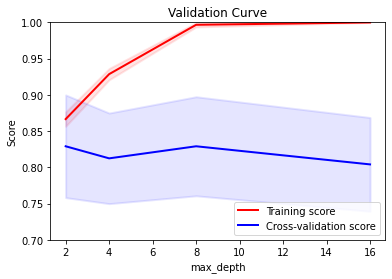

In [118]:
NN_grid_search_validation_curve(cb_pipe[1], 'max_depth', log=False, ylim=(0.7, 1))

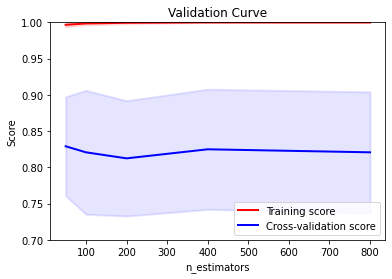

In [120]:
NN_grid_search_validation_curve(cb_pipe[1], 'n_estimators', log=False, ylim=(0.7, 1))

#### Voting Ensemble 

In [121]:
vote_model = EnsembleVoteClassifier(clfs=[LogReg, 
                                          Dtree, 
                                          Rforest, 
                                          NN, 
                                          xgb_pipe,
                                          svc_pipe,
                                          lgb_pipe,
                                          cb_pipe], 
                              voting='hard', 
                                        weights = [1,
                                                   1,
                                                   1,
                                                   1,
                                                   1,
                                                   1,
                                                   1,
                                                   1],
                                        fit_base_estimators=False)

labels = ['Logistic Regression', 
          'Decision Tree', 
          'Random Forest', 
          'Neural Network', 
          'XGB Classifier',
          'LightGB Classifier',
          'CatBoost Classifier',
          'Ensemble']

vote_model.fit(X_test, Y_test)

print(classification_report(Y_test, vote_model.predict(X_test)))

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         3
           1       0.80      1.00      0.89         4

    accuracy                           0.86         7
   macro avg       0.90      0.83      0.84         7
weighted avg       0.89      0.86      0.85         7



In [122]:
#try logisticRegression, SVC 
stacker_model = StackingClassifier(classifiers= [LogReg, 
                                        Dtree, 
                                        Rforest, 
                                        NN, 
                                        xgb_pipe,
                                        svc_pipe,
                                        lgb_pipe,
                                        cb_pipe], 
                          meta_classifier= LogisticRegression(
                              solver = 'liblinear', 
                              C=1,
                              tol = 0.0001,
                              max_iter = 20000, 
                              verbose =1), 
                            fit_base_estimators=False)

labels = ['Logistic Regression', 
          'Decision Tree', 
          'Random Forest', 
          'Neural Network', 
          'XGB Classifier',
          'LightGB Classifier',
          'CatBoost Classifier',
          'Stacking']

stacker_model.fit(X_train, Y_train)

print(classification_report(Y_test, stacker_model.predict(X_test)))

[LibLinear]              precision    recall  f1-score   support

           0       1.00      0.67      0.80         3
           1       0.80      1.00      0.89         4

    accuracy                           0.86         7
   macro avg       0.90      0.83      0.84         7
weighted avg       0.89      0.86      0.85         7



## Model Comparisons

In [127]:
# to safely compare the models without using overfitted data 
# from the hold-out test data, we will split 50/50 to create a cross-validation set
# we create 10 fold cross-validation from the those data to test out the F1 score for comparison
# then we would do a pairwise t test on the every pair of models to confirm whether the models are 
# significantly different from each other. 



folds = 10
Y_val_folds = np.array_split(Y_cv, folds)

LogReg_folds = np.array_split(LogReg.predict(X_cv), folds)
Dtree_folds = np.array_split(Dtree.predict(X_cv), folds)
Rforest_folds = np.array_split(Rforest.predict(X_cv), folds)
NN_folds = np.array_split(NN.predict(X_cv), folds)
xgb_pipe_folds = np.array_split(xgb_pipe.predict(X_cv), folds)
svc_pipe_folds = np.array_split(svc_pipe.predict(X_cv), folds)
lgb_pipe_folds = np.array_split(lgb_pipe.predict(X_cv), folds)
cb_pipe_folds = np.array_split(cb_pipe.predict(X_cv), folds)
vote_model_folds = np.array_split(vote_model.predict(X_cv), folds)
stacker_model_folds = np.array_split(stacker_model.predict(X_cv), folds)

In [128]:
PRF_KWARGS = {
    'pos_label': 1,     # 1 is the positive rain tomorrow label
    'average': 'binary' # evaluate p/r/f of the positive label
}

def score_folds (Y_pred, Y_model, **kwargs):
        for Y_p, Y_m in zip (Y_pred, Y_model):
            yield f1_score(Y_p, Y_m, **kwargs)

In [129]:
LogReg_f1 = list(score_folds(Y_val_folds, LogReg_folds,  **PRF_KWARGS))
Dtree_f1 = list(score_folds(Y_val_folds, Dtree_folds,  **PRF_KWARGS))
Rforest_f1 = list(score_folds(Y_val_folds, Rforest_folds,  **PRF_KWARGS))
NN_f1 = list(score_folds(Y_val_folds, NN_folds,  **PRF_KWARGS))
xgb_pipe_f1 = list(score_folds(Y_val_folds, xgb_pipe_folds,  **PRF_KWARGS))
svc_pipe_f1 = list(score_folds(Y_val_folds, svc_pipe_folds,  **PRF_KWARGS))
lgb_pipe_f1 = list(score_folds(Y_val_folds, lgb_pipe_folds,  **PRF_KWARGS))
cb_pipe_f1 = list(score_folds(Y_val_folds, cb_pipe_folds,  **PRF_KWARGS))
vote_model_f1 = list(score_folds(Y_val_folds, vote_model_folds,  **PRF_KWARGS))
stacker_model_f1 = list(score_folds(Y_val_folds, stacker_model_folds,  **PRF_KWARGS))

In [130]:
f1_scores = [LogReg_f1, 
            Dtree_f1,
            Rforest_f1,
            NN_f1,
            xgb_pipe_f1,
            svc_pipe_f1,
            lgb_pipe_f1,
            cb_pipe_f1, 
            vote_model_f1, 
            stacker_model_f1]

f1_names = ["LogReg_f1", 
            "Dtree_f1",
            "Rforest_f1",
            "NN_f1",
            "xgb_pipe_f1",
            "svc_pipe_f1",
            "lgb_pipe_f1",
            "cb_pipe_f1", 
            "vote_model_f1", 
            "stacker_model_f1"] 

In [131]:
def avg_f1(f1_score):
    return np.average(f1_score)

avg_f1_scores = []
for f1_score in f1_scores:
    avg_f1_scores.append(avg_f1(f1_score))
    
avg_f1_table = pd.DataFrame(f1_names)
avg_f1_score = pd.DataFrame(avg_f1_scores) 

table = pd.concat([avg_f1_table, avg_f1_score], axis =1)
table.columns = ['model','avg_f1_score']
table.sort_values('avg_f1_score', ascending = False)

,model,avg_f1_score
2,Rforest_f1,0.877381
0,LogReg_f1,0.868571
5,svc_pipe_f1,0.863095
6,lgb_pipe_f1,0.863095
8,vote_model_f1,0.863095
7,cb_pipe_f1,0.859524
9,stacker_model_f1,0.845238
4,xgb_pipe_f1,0.828571
3,NN_f1,0.808333
1,Dtree_f1,0.786984


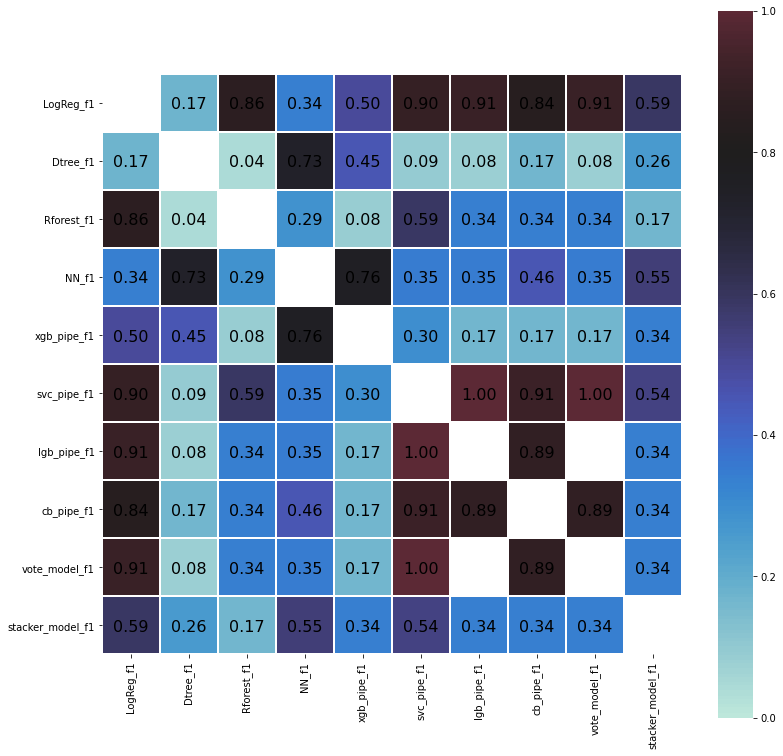

In [132]:
pairwiset_p_values = pd.DataFrame(np.zeros((10,10)))

for i in range(len(f1_scores)):
    for j in range(len(f1_scores)):
        pairwiset_p_values[i][j] = stats.ttest_rel(f1_scores[i], f1_scores[j])[1]
        
pairwiset_p_values.columns = f1_names
pairwiset_p_values.index = f1_names

plt.figure(figsize = (13,13))
p_values = sns.heatmap(pairwiset_p_values, annot = True, center=0.8, square=True, 
                 annot_kws={"size": 16, "va": "center_baseline", "color": "black"}, fmt=".2f", 
                 linewidth=1, linecolor='white', vmin=0, vmax=1, cbar=True)

As shown above, many of the models are significantly similar from each other (above 0.05 threshold for retaining null hypothesis). We can see that our highest performing model (Random Forest) has predictions which are similar to other prediction models - at worst, 85% of its predictions are the same as the ones made by Logistic Regression model. 

#### Model Performance - Final Test

In [194]:
print(classification_report(Y_final, vote_model.predict(X_final)))

              precision    recall  f1-score   support

         0.0       0.89      0.92      0.91     13791
         1.0       0.70      0.61      0.65      3984

    accuracy                           0.85     17775
   macro avg       0.79      0.77      0.78     17775
weighted avg       0.85      0.85      0.85     17775



In [51]:
print(classification_report(Y_final, stacker_model.predict(X_final)))

              precision    recall  f1-score   support

         0.0       0.89      0.93      0.91     13791
         1.0       0.71      0.59      0.64      3984

    accuracy                           0.85     17775
   macro avg       0.80      0.76      0.78     17775
weighted avg       0.85      0.85      0.85     17775



## Part 3: Inference Analysis 

### Feature Importance

In [34]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(Rforest[1], random_state=1).fit(X_cv, Y_cv)
eli5.show_weights(perm, feature_names = X_cv.columns.tolist())

Weight,Feature
0.0407 ± 0.0432,ca
0.0259 ± 0.0602,cp
0.0074 ± 0.0181,exang
0.0037 ± 0.0432,slope
-0.0148 ± 0.0277,fbs
-0.0185 ± 0.0000,binned_trestbps
-0.0185 ± 0.0000,thal
-0.0185 ± 0.0000,thalach
-0.0185 ± 0.0000,chol
-0.0185 ± 0.0000,age


In [48]:
cb_pipe[1].estimator.get_geature_importance()

AttributeError: 'CatBoostClassifier' object has no attribute 'get_geature_importance'

In [80]:
import shap

shap.initjs()

best_params = {'max_depth': 8, 'n_estimators': 50}
cb_classifier = cb.CatBoostClassifier(**best_params,random_state = 50, 
                                      cat_features = ['binned_trestbps', 'binned_oldpeak'])
cb_classifier.fit(X_train, Y_train)

explainer = shap.TreeExplainer(cb_classifier)
shap_values = explainer.shap_values(cb.Pool(X_cv, Y_cv, cat_features = ['binned_trestbps', 'binned_oldpeak']))

Learning rate set to 0.087363
0:	learn: 0.6635677	total: 23ms	remaining: 1.13s
1:	learn: 0.6437408	total: 49.8ms	remaining: 1.19s
2:	learn: 0.6218049	total: 77.8ms	remaining: 1.22s
3:	learn: 0.6075647	total: 115ms	remaining: 1.32s
4:	learn: 0.5882712	total: 148ms	remaining: 1.33s
5:	learn: 0.5762080	total: 187ms	remaining: 1.37s
6:	learn: 0.5650672	total: 219ms	remaining: 1.35s
7:	learn: 0.5522908	total: 255ms	remaining: 1.34s
8:	learn: 0.5422043	total: 289ms	remaining: 1.32s
9:	learn: 0.5335643	total: 318ms	remaining: 1.27s
10:	learn: 0.5264119	total: 345ms	remaining: 1.22s
11:	learn: 0.5187656	total: 377ms	remaining: 1.19s
12:	learn: 0.5100635	total: 406ms	remaining: 1.16s
13:	learn: 0.5025361	total: 446ms	remaining: 1.15s
14:	learn: 0.4936254	total: 480ms	remaining: 1.12s
15:	learn: 0.4862883	total: 514ms	remaining: 1.09s
16:	learn: 0.4793519	total: 545ms	remaining: 1.06s
17:	learn: 0.4719369	total: 577ms	remaining: 1.02s
18:	learn: 0.4641125	total: 607ms	remaining: 990ms
19:	learn:

In [81]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

In [82]:
shap.force_plot(explainer.expected_value, shap_values[4,:], X_train.iloc[4,:])

In [85]:
shap.force_plot(explainer.expected_value, shap_values[4,:], X_train.iloc[5,:])

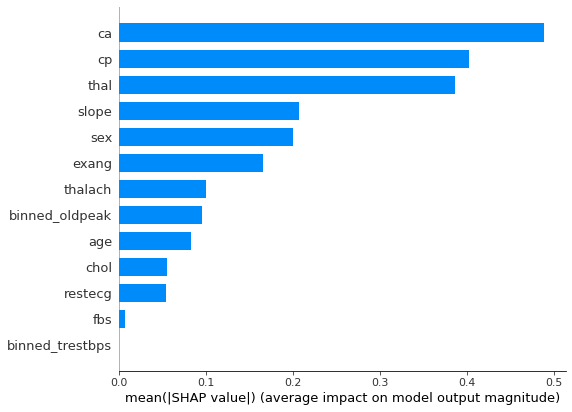

In [83]:
# feature importance plot
shap.summary_plot(shap_values, X_train, plot_type="bar")